In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler
import datetime
import calendar
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller 
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tsa.vector_ar.vecm import select_coint_rank
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX





from statsmodels.tsa.stattools import grangercausalitytests

from pylab import rcParams
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# 1. Data loading and data inspection

In [2]:
#Read train dataset
train = pd.read_csv('train.csv')
train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [3]:
train.Store.value_counts()

1023    942
666     942
675     942
163     942
674     942
162     942
673     942
161     942
672     942
160     942
158     942
157     942
668     942
156     942
667     942
154     942
657     942
665     942
153     942
664     942
152     942
663     942
151     942
662     942
150     942
661     942
148     942
659     942
147     942
658     942
       ... 
636     758
637     758
879     758
638     758
129     758
604     758
365     758
132     758
644     758
646     758
136     758
137     758
629     758
115     758
113     758
890     758
893     758
620     758
108     758
619     758
385     758
612     758
100     758
611     758
99      758
900     758
902     758
903     758
904     758
512     758
Name: Store, Length: 1115, dtype: int64

#### We hava sales and customers data for 1115 stores.

In [4]:
original_row_size_train=train.shape[0]
original_col_size_train=train.shape[1]
print('No of rows in train dataset is {}',original_row_size_train)
print('No of cols in train dataset is{}',original_col_size_train)

No of rows in train dataset is {} 1017209
No of cols in train dataset is{} 9


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
Store            1017209 non-null int64
DayOfWeek        1017209 non-null int64
Date             1017209 non-null object
Sales            1017209 non-null int64
Customers        1017209 non-null int64
Open             1017209 non-null int64
Promo            1017209 non-null int64
StateHoliday     1017209 non-null object
SchoolHoliday    1017209 non-null int64
dtypes: int64(7), object(2)
memory usage: 69.8+ MB


#### We can see there is no missing values in data set

In [6]:
train.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday
count,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06,1.017209e+06
mean,5.584297e+02,3.998341e+00,5.773819e+03,6.331459e+02,8.301067e-01,3.815145e-01,1.786467e-01
std,3.219087e+02,1.997391e+00,3.849926e+03,4.644117e+02,3.755392e-01,4.857586e-01,3.830564e-01
min,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.800000e+02,2.000000e+00,3.727000e+03,4.050000e+02,1.000000e+00,0.000000e+00,0.000000e+00
50%,5.580000e+02,4.000000e+00,5.744000e+03,6.090000e+02,1.000000e+00,0.000000e+00,0.000000e+00
75%,8.380000e+02,6.000000e+00,7.856000e+03,8.370000e+02,1.000000e+00,1.000000e+00,0.000000e+00
max,1.115000e+03,7.000000e+00,4.155100e+04,7.388000e+03,1.000000e+00,1.000000e+00,1.000000e+00


#### The average value of sales is 5774 whereas average value for customers is 633.

In [7]:
#Read store dataset
store = pd.read_csv('store.csv')
store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [8]:
store.Store.value_counts()

1115    1
374     1
368     1
369     1
370     1
371     1
372     1
373     1
375     1
383     1
376     1
377     1
378     1
379     1
380     1
381     1
367     1
366     1
365     1
364     1
363     1
362     1
361     1
360     1
359     1
358     1
357     1
356     1
355     1
354     1
       ..
763     1
762     1
761     1
760     1
759     1
758     1
757     1
756     1
755     1
754     1
753     1
752     1
751     1
749     1
734     1
748     1
747     1
746     1
745     1
744     1
743     1
742     1
741     1
740     1
739     1
738     1
737     1
736     1
735     1
1       1
Name: Store, Length: 1115, dtype: int64

#### We have details for 1115 stores

In [9]:
original_row_size_store=store.shape[0]
original_col_size_store=store.shape[1]
print('No of rows in store dataset is {}',original_row_size_store)
print('No of cols in store dataset is{}',original_col_size_store)

No of rows in store dataset is {} 1115
No of cols in store dataset is{} 10


In [10]:
store.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
Store                        1115 non-null int64
StoreType                    1115 non-null object
Assortment                   1115 non-null object
CompetitionDistance          1112 non-null float64
CompetitionOpenSinceMonth    761 non-null float64
CompetitionOpenSinceYear     761 non-null float64
Promo2                       1115 non-null int64
Promo2SinceWeek              571 non-null float64
Promo2SinceYear              571 non-null float64
PromoInterval                571 non-null object
dtypes: float64(5), int64(2), object(3)
memory usage: 87.2+ KB


#### We can see missing values in CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2SinceWeek,Promo2SinceYear,PromoInterval 

In [11]:
store.describe()

,Store,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear
count,1115.00000,1112.000000,761.000000,761.000000,1115.000000,571.000000,571.000000
mean,558.00000,5404.901079,7.224704,2008.668857,0.512108,23.595447,2011.763573
std,322.01708,7663.174720,3.212348,6.195983,0.500078,14.141984,1.674935
min,1.00000,20.000000,1.000000,1900.000000,0.000000,1.000000,2009.000000
25%,279.50000,717.500000,4.000000,2006.000000,0.000000,13.000000,2011.000000
50%,558.00000,2325.000000,8.000000,2010.000000,1.000000,22.000000,2012.000000
75%,836.50000,6882.500000,10.000000,2013.000000,1.000000,37.000000,2013.000000
max,1115.00000,75860.000000,12.000000,2015.000000,1.000000,50.000000,2015.000000


In [12]:
#Read inputDataProcessed dataset
inputDataProcessed=pd.read_csv('inputDataProcessed.csv')


In [13]:
original_row_size_processed_data=inputDataProcessed.shape[0]
original_col_size_processed_data=inputDataProcessed.shape[1]
print('No of rows in inputDataProcessed dataset is {}',original_row_size_processed_data)
print('No of cols in inputDataProcessed dataset is{}',original_col_size_processed_data)

No of rows in inputDataProcessed dataset is {} 11729
No of cols in inputDataProcessed dataset is{} 14


In [14]:
inputDataProcessed.head()

,Store,Date,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,DayOfWeek_0,DayOfWeek_1,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6
0,1,01-01-2013,5530,668,0,1,1270,0,1,0,0,0,0,0
1,1,02-01-2013,4327,578,0,1,1270,0,0,1,0,0,0,0
2,1,03-01-2013,4486,619,0,1,1270,0,0,0,1,0,0,0
3,1,04-01-2013,4997,635,0,1,1270,0,0,0,0,1,0,0
4,1,05-01-2013,7176,785,1,1,1270,0,0,0,0,0,1,0


In [15]:
inputDataProcessed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11729 entries, 0 to 11728
Data columns (total 14 columns):
Store                  11729 non-null int64
Date                   11729 non-null object
Sales                  11729 non-null int64
Customers              11729 non-null int64
Promo                  11729 non-null int64
SchoolHoliday          11729 non-null int64
CompetitionDistance    11729 non-null int64
DayOfWeek_0            11729 non-null int64
DayOfWeek_1            11729 non-null int64
DayOfWeek_2            11729 non-null int64
DayOfWeek_3            11729 non-null int64
DayOfWeek_4            11729 non-null int64
DayOfWeek_5            11729 non-null int64
DayOfWeek_6            11729 non-null int64
dtypes: int64(13), object(1)
memory usage: 1.3+ MB


#### There is no null value in the dataset .

In [16]:
inputDataProcessed.describe()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,DayOfWeek_0,DayOfWeek_1,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6
count,11729.000000,11729.000000,11729.000000,11729.000000,11729.000000,11729.000000,11729.000000,11729.000000,11729.000000,11729.000000,11729.000000,11729.000000,11729.000000
mean,7.999915,6163.323472,731.306079,0.450081,0.197800,5823.814477,0.142212,0.143320,0.143405,0.143149,0.142808,0.142638,0.142467
std,4.319412,2399.510012,286.726340,0.497523,0.398358,9082.809657,0.349282,0.350414,0.350501,0.350240,0.349892,0.349718,0.349544
min,1.000000,612.000000,93.000000,0.000000,0.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,4430.000000,532.000000,0.000000,0.000000,620.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,8.000000,5734.000000,666.000000,0.000000,0.000000,1070.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,12.000000,7547.000000,877.000000,1.000000,0.000000,7520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,15.000000,22822.000000,2849.000000,1.000000,1.000000,29910.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# 2.Data Cleaning (Missing value treatment)

#### Common method for visualization and to get metadata 

In [17]:
def createCountPlot(features,df):
    cols=3
    rows = len(features)//cols +1
    fig = plt.figure(figsize=(16, rows*5))
    dataframe = df.copy()
    for plot, feature in enumerate(features):
        fig.add_subplot(rows,cols,plot+1)
        fig.tight_layout(h_pad=5, w_pad=5)
        dataframe[feature] = dataframe[feature].fillna('Missing')
        ax = sns.countplot(x=feature, data=dataframe,order = dataframe[feature].value_counts().index)
        plt.xticks(rotation = 90)
        plt.title("for {}".format(feature))
        for p in ax.patches:
            height = p.get_height()
            ax.text(p.get_x()+p.get_width()/2.,
                    height + 3,
                    '{:1.2f}'.format(height/len(dataframe) * 100),
                    ha="center")

In [18]:
#Common method to plot box plot
def boxPlot(df,features):
    cols=3
    rows = len(features)//cols +1
    fig = plt.figure(figsize=(15, rows*5))
    for plot, feature in enumerate(features):
        fig.add_subplot(rows,cols,plot+1)
        fig.tight_layout(h_pad=5, w_pad=5)
        sns.boxplot(df[feature])
        plt.title("for {}".format(feature))

In [19]:
def get_meta_data(df) :
    metadata = pd.DataFrame({
                    'Datatype' : df.dtypes,  
                    'Null_Percentage': round(df.isnull().sum()/len(df) * 100,2),
                    'Null count':df.isnull().sum(),
                    'No_Of_Unique_Values':df.nunique()
        
                       })
    return metadata

### Univariant analysis and Missing value and outlier treatment for train dataset

In [20]:
train_metadata=get_meta_data(train)
train_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,1115
DayOfWeek,int64,0.0,0,7
Date,object,0.0,0,942
Sales,int64,0.0,0,21734
Customers,int64,0.0,0,4086
Open,int64,0.0,0,2
Promo,int64,0.0,0,2
StateHoliday,object,0.0,0,5
SchoolHoliday,int64,0.0,0,2


#### We can see there is no missing values in dataset

In [21]:
train_categorical_fields=list(train_metadata[train_metadata.No_Of_Unique_Values<=30].index)
train_categorical_fields

['DayOfWeek', 'Open', 'Promo', 'StateHoliday', 'SchoolHoliday']

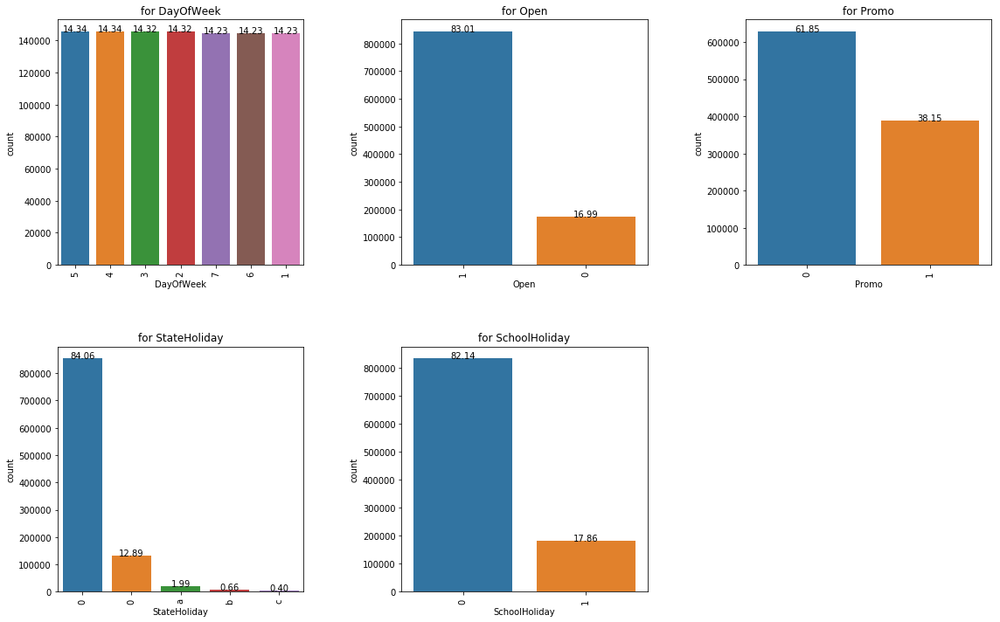

In [22]:
createCountPlot(train_categorical_fields,train)

#### DayOfWeek: The values ar like 1,2,3,4,5,6,7 for all 7 days of the week. The count is almost same for all day
#### Open : 83% records are saying store is open.Only 17% records are with closed state of store.
#### Promo: Only 38% records are with promo value 1.
#### StateHoliday: We can see there are 2 bars with category 0. We will investigate more for this.
#### SchoolHoliday : Most of the records are with value 0 which means no SchoolHoliday.

In [23]:
train.StateHoliday.value_counts()

0    855087
0    131072
a     20260
b      6690
c      4100
Name: StateHoliday, dtype: int64

In [24]:
train.StateHoliday.dtype

dtype('O')

In [25]:
train[train.StateHoliday=='0'].head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [26]:
train[train.StateHoliday==0].head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
327680,730,4,2014-09-25,5732,722,1,0,0,0
327681,731,4,2014-09-25,7470,802,1,0,0,0
327682,732,4,2014-09-25,5484,730,1,0,0,0
327683,733,4,2014-09-25,13801,3392,1,0,0,0
327684,734,4,2014-09-25,3519,404,1,0,0,0


In [27]:
train.loc[train.StateHoliday==0,'StateHoliday']='0'

In [28]:
train.StateHoliday.value_counts()

0    986159
a     20260
b      6690
c      4100
Name: StateHoliday, dtype: int64

#### Most of the records are with 0 value . After that most of the records are for  public holiday.

In [29]:
#Change data type of Date to pandas date time
train['Date']=pd.to_datetime(train['Date'])

In [30]:
train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [31]:
train.Date.min()

Timestamp('2013-01-01 00:00:00')

In [32]:
train.Date.max()

Timestamp('2015-07-31 00:00:00')

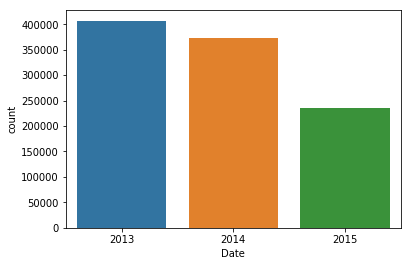

In [33]:
sns.countplot(train.Date.dt.year)
plt.show()

#### We are having more data for 2013 and 2014 than 2015

In [34]:
train_metadata=get_meta_data(train)
train_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,1115
DayOfWeek,int64,0.0,0,7
Date,datetime64[ns],0.0,0,942
Sales,int64,0.0,0,21734
Customers,int64,0.0,0,4086
Open,int64,0.0,0,2
Promo,int64,0.0,0,2
StateHoliday,object,0.0,0,4
SchoolHoliday,int64,0.0,0,2


In [35]:
train_numerical_fields=list(train_metadata[(train_metadata.No_Of_Unique_Values>30) & (train_metadata.Datatype=='int64')].index)
train_numerical_fields

['Store', 'Sales', 'Customers']

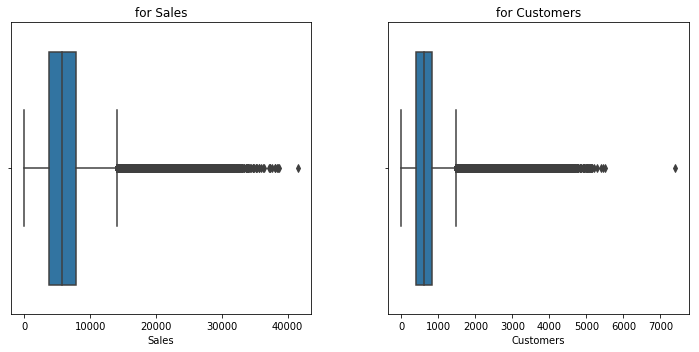

In [36]:
train_numerical_fields.remove('Store')
boxPlot(train,train_numerical_fields)

#### We can clearly see outliers in case of sales and customers. Let's check the quantile values

In [37]:
round(train[['Sales','Customers']].describe(),2)

,Sales,Customers
count,1017209.00,1017209.00
mean,5773.82,633.15
std,3849.93,464.41
min,0.00,0.00
25%,3727.00,405.00
50%,5744.00,609.00
75%,7856.00,837.00
max,41551.00,7388.00


In [38]:
train[['Sales','Customers']].quantile([.9,.95,.99])

,Sales,Customers
0.90,10288.0,1116.0
0.95,12137.0,1362.0
0.99,17160.0,2267.0


In [39]:
train[train.Sales>train.Sales.quantile(.99)].head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
124,125,5,2015-07-31,18227,2041,1,1,0,1
210,211,5,2015-07-31,17286,1659,1,1,0,1
250,251,5,2015-07-31,22205,2508,1,1,0,1
261,262,5,2015-07-31,25774,3669,1,1,0,1
319,320,5,2015-07-31,19898,2316,1,1,0,1


In [40]:
round(100*train[train.Sales>train.Sales.quantile(.99)].shape[0]/original_row_size_train,3)

1.0

In [41]:
round(100*train[train.Customers>train.Customers.quantile(.99)].shape[0]/original_row_size_train,3)

0.999

#### Only 1% Sales values are above 99% value and same for sales also. Let's delete these records as suggested in problem statement.

In [42]:
train = train.loc[train.Customers<=train.Customers.quantile(.99),:]
train.shape

(1007044, 9)

In [43]:
train = train.loc[train.Sales<=train.Sales.quantile(.99),:]
train.shape

(996974, 9)

In [44]:
train.shape[0]/original_row_size_train

0.9801073329079865

#### We are left with 98% data . Now check for outliers

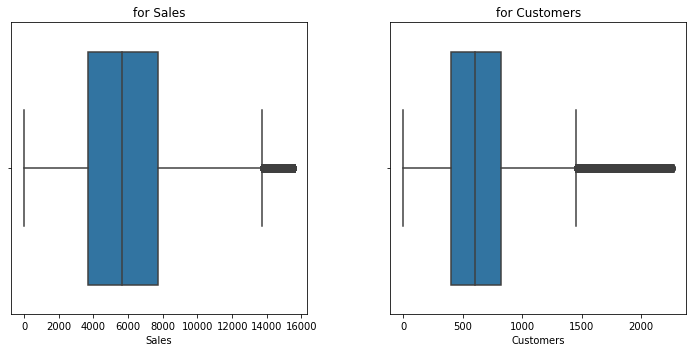

In [45]:
boxPlot(train,train_numerical_fields)

#### We can see, there is no outliers now

In [46]:
train_metadata=get_meta_data(train)
train_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,1115
DayOfWeek,int64,0.0,0,7
Date,datetime64[ns],0.0,0,942
Sales,int64,0.0,0,14694
Customers,int64,0.0,0,2206
Open,int64,0.0,0,2
Promo,int64,0.0,0,2
StateHoliday,object,0.0,0,4
SchoolHoliday,int64,0.0,0,2


### Univariant analysis and Missing value and outlier treatment for store dataset

In [47]:
store_metadata=get_meta_data(store)
store_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
StoreType,object,0.00,0,4
Assortment,object,0.00,0,3
CompetitionDistance,float64,0.27,3,654
CompetitionOpenSinceMonth,float64,31.75,354,12
CompetitionOpenSinceYear,float64,31.75,354,23
Promo2,int64,0.00,0,2
Promo2SinceWeek,float64,48.79,544,24
Promo2SinceYear,float64,48.79,544,7
PromoInterval,object,48.79,544,3


In [48]:
store_categorical_fields=['StoreType','Assortment','CompetitionOpenSinceMonth','CompetitionOpenSinceYear','Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval']

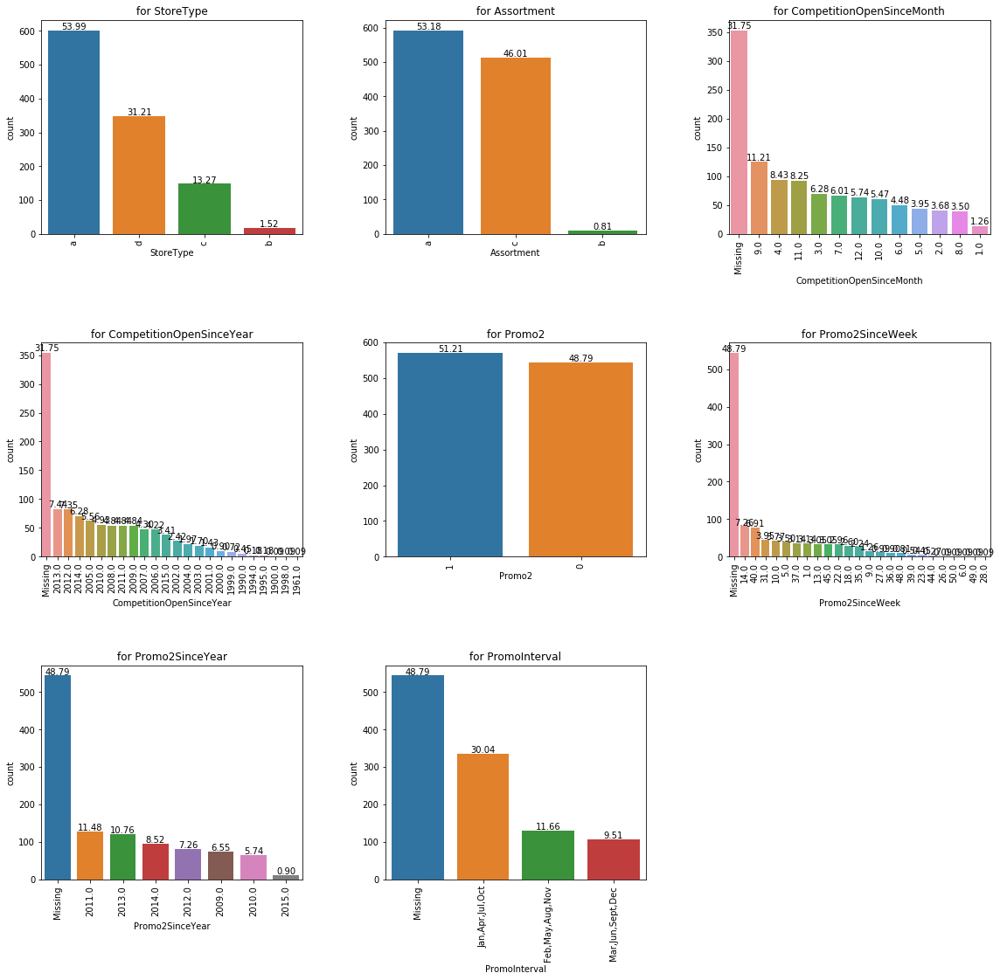

In [49]:
createCountPlot(store_categorical_fields,store)

#### StoreType : We can see there are 4 types of store as a,b,c,d 53.99% stores are of type a and very few stores are of type b.
#### Assortment : We can see there are 3 kind of assortments. Most of those are either a or c.
#### CompetitionOpenSinceMonth : We can see , around 31.75% missing vlues present . Most of the compititors are opened in the month of 9/4/11/3/7.
#### CompetitionOpenSinceYear : We can see , around 31.75% missing values present. Most of the compitiotors have opened during 2006-2014.
#### Promo2: We can see, 48.79% follow up promo value is 0.
#### Promo2SinceWeek : We can see, 48.79% values are missing.Most of the prom happened in the week of 14, 40.
#### Promo2SinceYear : We can see, 48.79% values are missing. Most of the prom happened in the year of 2011, 2013.
#### PromoInterval : We can se , 48.79% values are missing. Most of the promo happened in the month of Jun,Apr,Jul,Oct
#### We can see , for 'Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval' , there is a pattern in missing values. Let's find out more.

In [50]:
store.loc[store['Promo2SinceWeek'].isnull(),:].head(5)

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
5,6,a,a,310.0,12.0,2013.0,0,NaN,NaN,NaN
6,7,a,c,24000.0,4.0,2013.0,0,NaN,NaN,NaN


In [51]:
store.loc[store['Promo2SinceWeek'].isnull(),:].tail(5)

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
1107,1108,a,a,540.0,4.0,2004.0,0,NaN,NaN,NaN
1109,1110,c,c,900.0,9.0,2010.0,0,NaN,NaN,NaN
1111,1112,c,c,1880.0,4.0,2006.0,0,NaN,NaN,NaN
1112,1113,a,c,9260.0,NaN,NaN,0,NaN,NaN,NaN
1113,1114,a,c,870.0,NaN,NaN,0,NaN,NaN,NaN


In [52]:
store.loc[store.Promo2==0,'Promo2SinceWeek'].unique()

array([nan])

In [53]:
store.loc[store.Promo2==0,'Promo2SinceYear'].unique()

array([nan])

In [54]:
store.loc[store.Promo2==0,'PromoInterval'].unique()

array([nan], dtype=object)

In [55]:
store.loc[store.Promo2==1,'Promo2SinceWeek'].unique()

array([13., 14.,  1., 45., 40., 26., 22.,  5.,  6., 10., 31., 37.,  9.,
       39., 27., 18., 35., 23., 48., 36., 50., 44., 49., 28.])

In [56]:
store.loc[store.Promo2==1,'Promo2SinceYear'].unique()

array([2010., 2011., 2012., 2009., 2014., 2015., 2013.])

In [57]:
store.loc[store.Promo2==1,'PromoInterval'].unique()

array(['Jan,Apr,Jul,Oct', 'Feb,May,Aug,Nov', 'Mar,Jun,Sept,Dec'],
      dtype=object)

#### We can see that, when promo2 value is 0(promo did not happen), the value for Promo2SinceWeek,Promo2SinceYear,PromoInterval are missing. Which is expected.Let's impute these values with 0.

In [58]:
store['Promo2SinceYear'].fillna(0,inplace=True)

In [59]:
store['Promo2SinceWeek'].fillna(0,inplace=True)
store['PromoInterval'].fillna(0,inplace=True)

In [60]:
store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,0.0,0.0,0
4,5,a,a,29910.0,4.0,2015.0,0,0.0,0.0,0


In [61]:
store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,0.0,0.0,0
4,5,a,a,29910.0,4.0,2015.0,0,0.0,0.0,0


In [62]:
store_metadata=get_meta_data(store)
store_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
StoreType,object,0.00,0,4
Assortment,object,0.00,0,3
CompetitionDistance,float64,0.27,3,654
CompetitionOpenSinceMonth,float64,31.75,354,12
CompetitionOpenSinceYear,float64,31.75,354,23
Promo2,int64,0.00,0,2
Promo2SinceWeek,float64,0.00,0,25
Promo2SinceYear,float64,0.00,0,8
PromoInterval,object,0.00,0,4


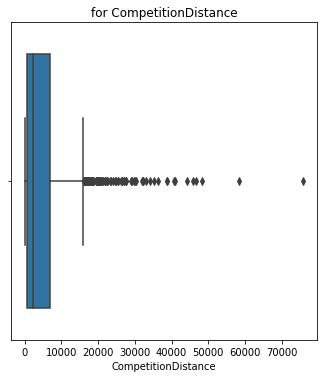

In [63]:
boxPlot(store,['CompetitionDistance'])
# sns.boxplot(df[feature])
# plt.title("for {}".format(feature))

#### We can see clear outliers hear. Let's dig more into this

In [64]:
store[['CompetitionDistance']].quantile([.9,.95,.99])

,CompetitionDistance
0.90,15679.0
0.95,20144.5
0.99,35144.7


#### Here we can not delete any records as every record gives details about a store. Let's cap the higher values to 95% value.

In [65]:
store.loc[store.CompetitionDistance>store.CompetitionDistance.quantile(.99),'CompetitionDistance']=store.CompetitionDistance.quantile(.99)
store.shape

(1115, 10)

In [66]:
store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,0.0,0.0,0
4,5,a,a,29910.0,4.0,2015.0,0,0.0,0.0,0


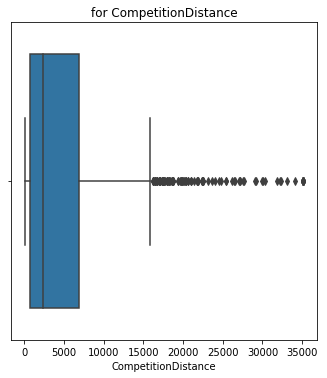

In [67]:
boxPlot(store,['CompetitionDistance'])

#### We can see , Most of the data is distributed within 100-5500.

In [68]:
store_metadata=get_meta_data(store)
store_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
StoreType,object,0.00,0,4
Assortment,object,0.00,0,3
CompetitionDistance,float64,0.27,3,643
CompetitionOpenSinceMonth,float64,31.75,354,12
CompetitionOpenSinceYear,float64,31.75,354,23
Promo2,int64,0.00,0,2
Promo2SinceWeek,float64,0.00,0,25
Promo2SinceYear,float64,0.00,0,8
PromoInterval,object,0.00,0,4


In [69]:
store.loc[store.CompetitionDistance.isnull(),['CompetitionDistance','CompetitionOpenSinceMonth','CompetitionOpenSinceYear','Store']]

,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Store
290,NaN,NaN,NaN,291
621,NaN,NaN,NaN,622
878,NaN,NaN,NaN,879


#### We can assume, there are no Comptitors till today, hence everything is NaN.
#### Let's impute all values with 0.

In [70]:
store.loc[store.CompetitionDistance.isnull(),'CompetitionOpenSinceMonth']=0
store.loc[store.CompetitionDistance.isnull(),'CompetitionOpenSinceYear']=0
store.loc[store.CompetitionDistance.isnull(),'CompetitionDistance']=0

In [71]:
store[store.Store.isin([291,622,879])]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
290,291,d,a,0.0,0.0,0.0,0,0.0,0.0,0
621,622,a,c,0.0,0.0,0.0,0,0.0,0.0,0
878,879,d,a,0.0,0.0,0.0,1,5.0,2013.0,"Feb,May,Aug,Nov"


In [72]:
store.loc[store.CompetitionOpenSinceYear.isnull(),['CompetitionDistance','CompetitionOpenSinceYear','CompetitionOpenSinceMonth','Store']]

,CompetitionDistance,CompetitionOpenSinceYear,CompetitionOpenSinceMonth,Store
11,1070.0,NaN,NaN,12
12,310.0,NaN,NaN,13
15,3270.0,NaN,NaN,16
18,3240.0,NaN,NaN,19
21,1040.0,NaN,NaN,22
25,2300.0,NaN,NaN,26
28,2170.0,NaN,NaN,29
31,2910.0,NaN,NaN,32
39,180.0,NaN,NaN,40
40,1180.0,NaN,NaN,41


In [73]:
store[store.CompetitionDistance==0]

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
290,291,d,a,0.0,0.0,0.0,0,0.0,0.0,0
621,622,a,c,0.0,0.0,0.0,0,0.0,0.0,0
878,879,d,a,0.0,0.0,0.0,1,5.0,2013.0,"Feb,May,Aug,Nov"


#### We can see , there are many records for which CompetitionDistance value is not 0, but CompetitionOpenSinceYear,CompetitionOpenSinceMonth values are missing.

In [74]:
store_metadata=get_meta_data(store)
store_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
StoreType,object,0.00,0,4
Assortment,object,0.00,0,3
CompetitionDistance,float64,0.00,0,644
CompetitionOpenSinceMonth,float64,31.48,351,13
CompetitionOpenSinceYear,float64,31.48,351,24
Promo2,int64,0.00,0,2
Promo2SinceWeek,float64,0.00,0,25
Promo2SinceYear,float64,0.00,0,8
PromoInterval,object,0.00,0,4


#### For inputDataProcessed

In [75]:
inputDataProcessed_metadata=get_meta_data(inputDataProcessed)
inputDataProcessed_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,15
Date,object,0.0,0,786
Sales,int64,0.0,0,6252
Customers,int64,0.0,0,1381
Promo,int64,0.0,0,2
SchoolHoliday,int64,0.0,0,2
CompetitionDistance,int64,0.0,0,15
DayOfWeek_0,int64,0.0,0,2
DayOfWeek_1,int64,0.0,0,2
DayOfWeek_2,int64,0.0,0,2


In [76]:
#Change tha datatype of Date field to pandas date time
inputDataProcessed['Date']=pd.to_datetime(inputDataProcessed['Date'])

In [77]:
inputDataProcessed_categorical_fields=list(inputDataProcessed_metadata[inputDataProcessed_metadata.No_Of_Unique_Values<=30].index)
inputDataProcessed_categorical_fields

['Store',
 'Promo',
 'SchoolHoliday',
 'CompetitionDistance',
 'DayOfWeek_0',
 'DayOfWeek_1',
 'DayOfWeek_2',
 'DayOfWeek_3',
 'DayOfWeek_4',
 'DayOfWeek_5',
 'DayOfWeek_6']

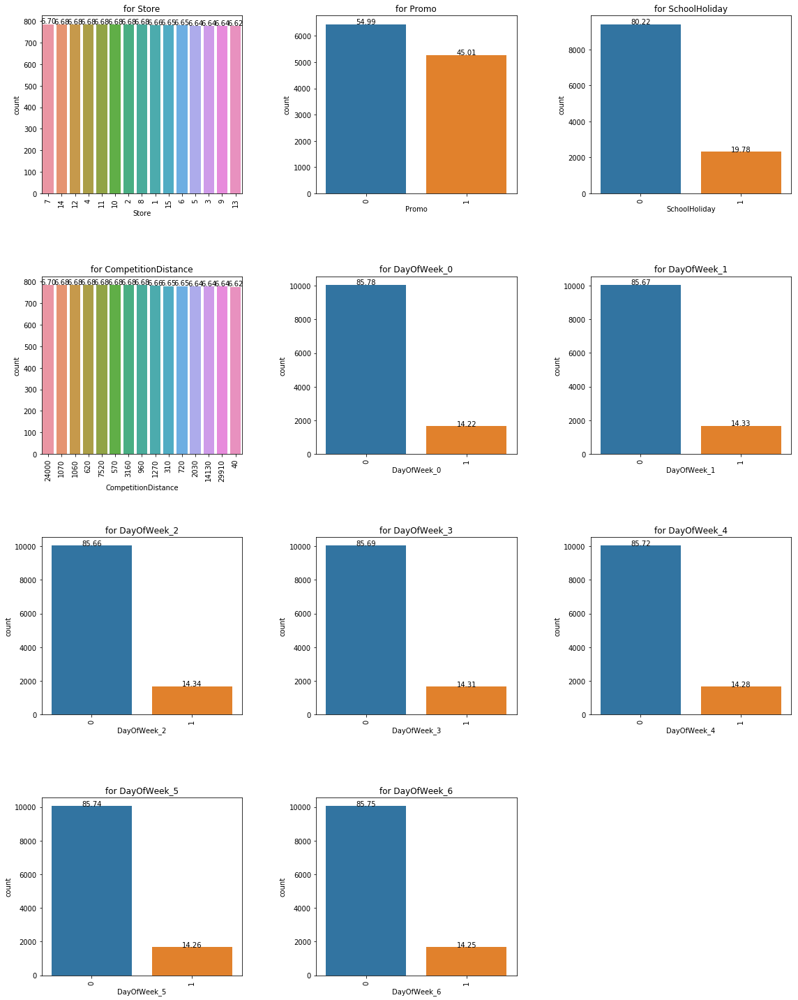

In [78]:
createCountPlot(inputDataProcessed_categorical_fields,inputDataProcessed)

#### We will be having data for store 15 stores Store 1-15.
#### We are data for 54% with 0 promo and rest are for promo=1
#### We are having  80% data for normal day without any school holiday
#### We hava data for compitition distance starting from 40 to 29000.
#### We have equal amount of data for all days. 

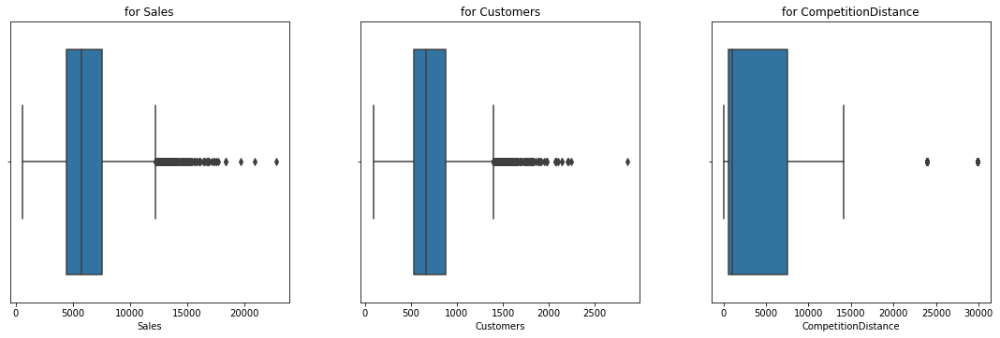

In [79]:
boxPlot(inputDataProcessed,['Sales','Customers','CompetitionDistance'])

In [80]:
inputDataProcessed[['Sales','Customers','CompetitionDistance']].quantile([.9,.95,.99,1])

,Sales,Customers,CompetitionDistance
0.90,9406.40,1154.2,24000.0
0.95,10647.80,1297.0,29910.0
0.99,13381.72,1559.0,29910.0
1.00,22822.00,2849.0,29910.0


#### We can see clear outliers in all. Let's cap them.

In [81]:
inputDataProcessed.loc[inputDataProcessed.Sales>inputDataProcessed.Sales.quantile(0.99),'Sales']=inputDataProcessed.Sales.quantile(0.99)
inputDataProcessed.loc[inputDataProcessed.Customers>inputDataProcessed.Customers.quantile(0.99),'Customers']=inputDataProcessed.Customers.quantile(0.99)
inputDataProcessed.loc[inputDataProcessed.CompetitionDistance>inputDataProcessed.CompetitionDistance.quantile(0.99),'CompetitionDistance']=inputDataProcessed.CompetitionDistance.quantile(0.99)


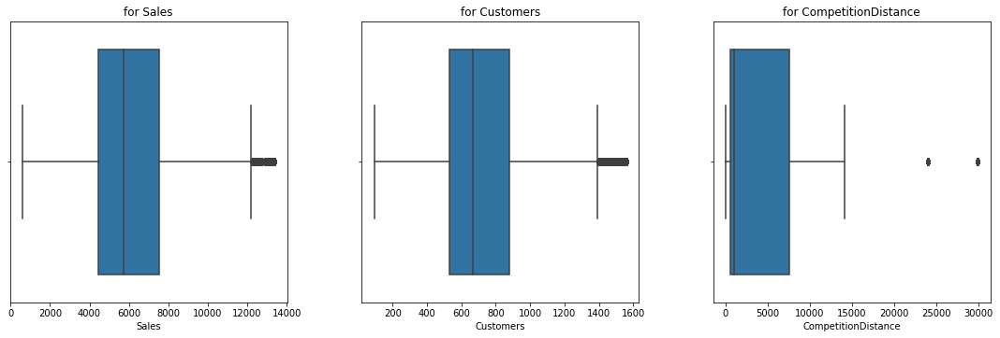

In [82]:
boxPlot(inputDataProcessed,['Sales','Customers','CompetitionDistance'])

In [83]:
inputDataProcessed.Date.min()

Timestamp('2013-01-01 00:00:00')

In [84]:
inputDataProcessed.Date.max()

Timestamp('2015-12-02 00:00:00')

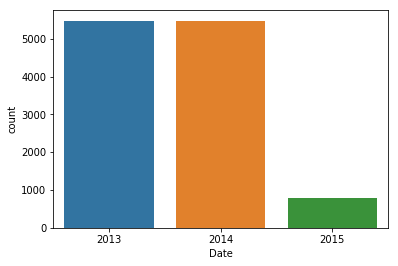

In [85]:
# sns.distplot(inputDataProcessed.Date.dt.year)
sns.countplot(inputDataProcessed.Date.dt.year)
plt.show()

#### We can say we will be having more data for the year 2013 and 2014 than 2015

In [86]:
inputDataProcessed_metadata=get_meta_data(inputDataProcessed)
inputDataProcessed_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,15
Date,datetime64[ns],0.0,0,786
Sales,float64,0.0,0,6137
Customers,float64,0.0,0,1285
Promo,int64,0.0,0,2
SchoolHoliday,int64,0.0,0,2
CompetitionDistance,float64,0.0,0,15
DayOfWeek_0,int64,0.0,0,2
DayOfWeek_1,int64,0.0,0,2
DayOfWeek_2,int64,0.0,0,2


#### Looks like the data in inputDataProcessed are not of any use here.

#### Lets merge train and store table to analyze more.

In [87]:
train.shape

(996974, 9)

In [88]:
store.shape

(1115, 10)

In [89]:
train.head(2)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1


In [90]:
store.head(2)

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"


In [91]:
train_df=train.merge(store, how='inner',on='Store')
train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0


In [92]:
train_df.shape

(996974, 18)

In [93]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
DayOfWeek,int64,0.00,0,7
Date,datetime64[ns],0.00,0,942
Sales,int64,0.00,0,14694
Customers,int64,0.00,0,2206
Open,int64,0.00,0,2
Promo,int64,0.00,0,2
StateHoliday,object,0.00,0,4
SchoolHoliday,int64,0.00,0,2
StoreType,object,0.00,0,4


#### After merging we can see 31.43% values are missing in CompetitionOpenSinceMonth,CompetitionOpenSinceYear. Let's apply KNNImputer to impute missing values.

### Bivariant analysis

In [94]:
def boxPlotBiVariant(features,df):
    cols=3
    rows = len(features)//cols +1
    fig = plt.figure(figsize=(15, rows*5))
    for plot, feature in enumerate(features):
        fig.add_subplot(rows,cols,plot+1)
        fig.tight_layout(h_pad=5, w_pad=5)
        sns.boxplot(y='Sales',x=feature,data=df)
        plt.title('Distribution of {}'.format(feature))
        plt.xticks(rotation = 90)

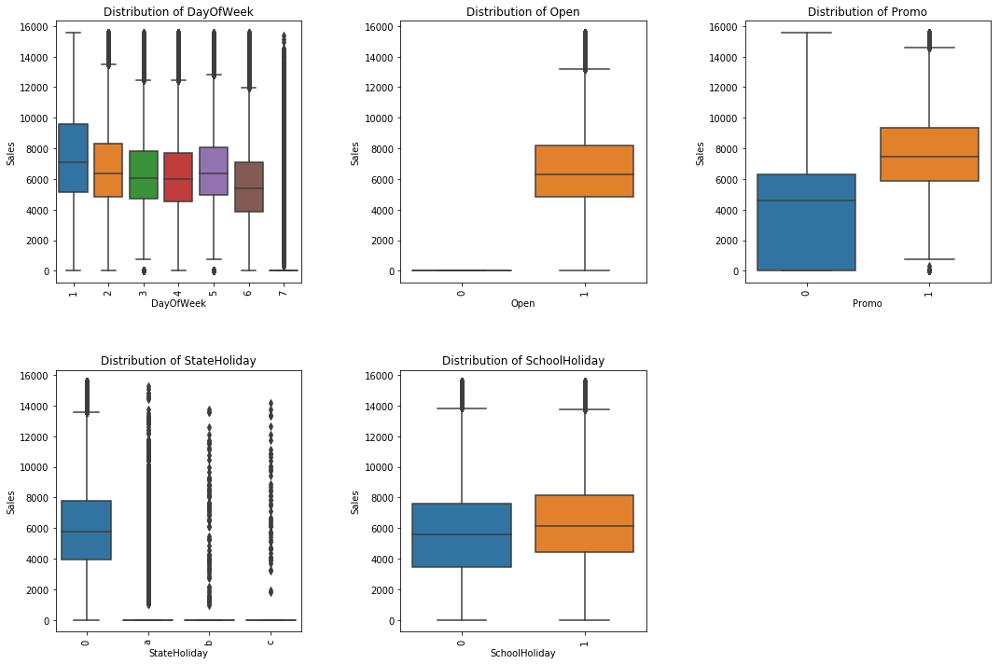

In [95]:
boxPlotBiVariant(['DayOfWeek','Open','Promo','StateHoliday','SchoolHoliday'],train_df)

#### DayOfWeek : In 1st nd 5th day of the week, the sales are comparatively high than other days. On Day 7, sales are very less. Most of the stores might be closed on that day. For other day, there is not much variation in sales. We can ignore this field as it does not have any impact on sales.

In [96]:
train_df.loc[train_df.DayOfWeek==7,['DayOfWeek','Open']].head()

,DayOfWeek,Open
5,7,0
12,7,0
19,7,0
26,7,0
33,7,0


In [97]:
train_df.loc[train_df.DayOfWeek==7,'Open'].value_counts()

0    141137
1      2745
Name: Open, dtype: int64

#### Open: The sales value is 0 when the Store is closed. We should remove the records with Open=0 from the dataset before forecasting

In [98]:
train_df.loc[train_df.Open==0,'Sales'].value_counts()

0    172817
Name: Sales, dtype: int64

#### Promo: We can see promo has very significant impact on sales. 

In [99]:
train_df.loc[train_df.StateHoliday!='0','Open'].value_counts()

0    30140
1      731
Name: Open, dtype: int64

In [100]:
train_df.groupby(['StateHoliday','Open']).Sales.mean()

StateHoliday  Open
0             0          0.000000
              1       6695.610374
a             0          0.000000
              1       6573.375652
b             0          0.000000
              1       6051.020000
c             0          0.000000
              1       7483.589286
Name: Sales, dtype: float64

#### StateHoliday: Looks like, during StateHoliday, the sales are falling tremendously for all stores. This might be because of during State Holidays , Stores are remained closed. Also when we check store wise, then there is not much changes in sales during state holidays.We should not consider StateHolidays as driving factor Sales.

#### SchoolHoliday:We can see, a little rise in case of 1, which indicates most of the (Store, Date) was affected by the closure of public schools. The sales value is rising during the closure of public schools. Merge all StateHoliday value to 1.

In [101]:
train_df.loc[train_df.StateHoliday!='0','StateHoliday']='1'

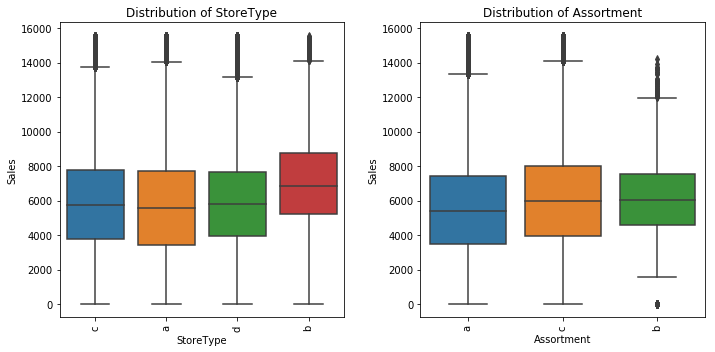

In [102]:
boxPlotBiVariant(['StoreType','Assortment'],train_df)

#### We can see for store type b, the sales are comparatively high than others.
#### We can see for Assortment c, the sales are comparatively high than others.

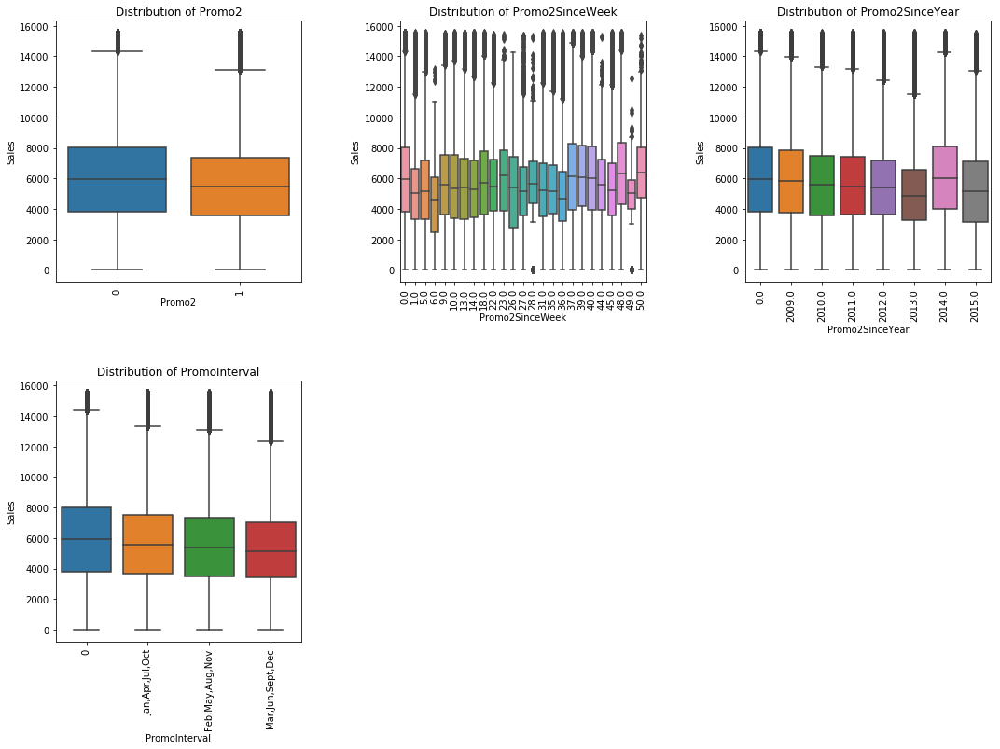

In [103]:
boxPlotBiVariant(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'],train_df)

#### Promo2: There is no impact of Promo2 on sales. From the above graph we can not say what is the impact of Promo2. We will investigate more.

In [104]:
def scatterplot(features,df):
    cols=3
    rows = len(features)//cols +1
    fig = plt.figure(figsize=(16, rows*5))
    for plot, feature in enumerate(features):
        fig.add_subplot(rows,cols,plot+1)
        fig.tight_layout(h_pad=3, w_pad=3)
        plt.scatter(y=df['Sales'],x=df[feature])
        plt.xlabel(feature)
        plt.ylabel('SalePrice')
        plt.xticks(rotation = 90)
        plt.title("for {}".format(feature))

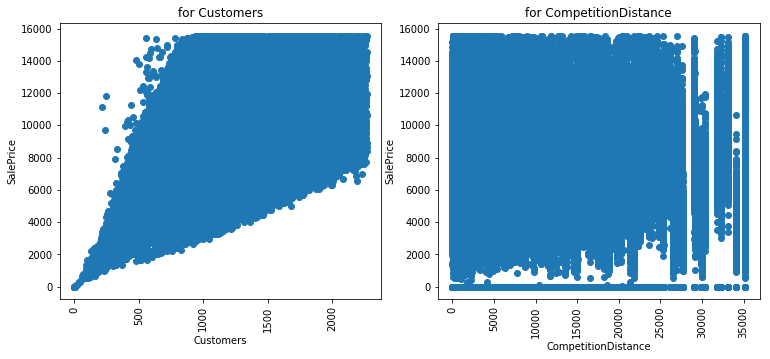

In [105]:
scatterplot(['Customers','CompetitionDistance'],train_df)

#### We can see, when customer number increases , sales value also increases.
#### We can not say anything about the impact of competitionDistance

#### Merge CompetitionOpenSinceMonth,CompetitionOpenSinceYear into a single date time column.

In [106]:
train_df.CompetitionOpenSinceYear.fillna(0,inplace=True)

In [107]:
train_df.CompetitionOpenSinceMonth.fillna(0,inplace=True)

In [108]:
train_df['CompetitionOpenSince'] = train_df.CompetitionOpenSinceYear.astype(int).astype(str) + '-' + train_df.CompetitionOpenSinceMonth.astype(int).astype(str) + '-01'
train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0,2008-9-01
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0,2008-9-01
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0,2008-9-01
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0,2008-9-01
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0,2008-9-01


In [109]:
train_df[['CompetitionOpenSinceMonth','CompetitionOpenSinceYear','CompetitionOpenSince']].head()

,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,CompetitionOpenSince
0,9.0,2008.0,2008-9-01
1,9.0,2008.0,2008-9-01
2,9.0,2008.0,2008-9-01
3,9.0,2008.0,2008-9-01
4,9.0,2008.0,2008-9-01


In [110]:
#### Remove CompetitionOpenSinceMonth, CompetitionOpenSinceYear
train_df.drop(['CompetitionOpenSinceMonth','CompetitionOpenSinceYear'],axis=1,inplace=True)

In [111]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,1115
DayOfWeek,int64,0.0,0,7
Date,datetime64[ns],0.0,0,942
Sales,int64,0.0,0,14694
Customers,int64,0.0,0,2206
Open,int64,0.0,0,2
Promo,int64,0.0,0,2
StateHoliday,object,0.0,0,2
SchoolHoliday,int64,0.0,0,2
StoreType,object,0.0,0,4


In [112]:
train_df.shape

(996974, 17)

In [113]:
train_df['CompetitionOpenSince'].value_counts()

0-0-01        315969
2012-9-01      28255
2012-11-01     15064
2013-4-01      12993
2009-9-01      12984
2013-9-01      11292
2008-9-01      10126
2005-4-01       9705
2011-9-01       9402
2014-10-01      9392
2009-4-01       9308
2012-3-01       9231
2006-11-01      9078
2006-9-01       8928
2005-12-01      8891
2013-11-01      8891
2013-7-01       8682
2010-2-01       8473
2015-4-01       8284
2014-4-01       8279
2014-3-01       8229
2011-3-01       8071
2014-7-01       7849
2010-3-01       7510
2006-3-01       7364
2008-4-01       7303
2014-12-01      7273
2007-4-01       7156
2015-7-01       7144
2007-11-01      6863
               ...  
2002-5-01        942
2015-1-01        942
2011-1-01        942
2001-7-01        942
2012-5-01        942
2004-2-01        942
2005-3-01        942
2001-3-01        942
2000-11-01       942
2004-8-01        942
1999-8-01        942
2012-4-01        941
2006-2-01        941
1998-7-01        941
1995-10-01       940
2006-1-01        940
1961-10-01   

In [114]:
train_df[train_df.CompetitionOpenSince=='0-0-01'].head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince
10333,12,5,2015-07-31,8959,962,1,1,0,1,a,c,1070.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct",0-0-01
10334,12,4,2015-07-30,7996,835,1,1,0,1,a,c,1070.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct",0-0-01
10335,12,3,2015-07-29,9236,989,1,1,0,1,a,c,1070.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct",0-0-01
10336,12,2,2015-07-28,8822,861,1,1,0,1,a,c,1070.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct",0-0-01
10337,12,1,2015-07-27,10227,979,1,1,0,1,a,c,1070.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct",0-0-01


In [115]:
train_df.loc[train_df.CompetitionOpenSince=='0-0-01','CompetitionOpenSince']=np.nan

In [116]:
train_df['CompetitionOpenSince'].value_counts()

2012-9-01     28255
2012-11-01    15064
2013-4-01     12993
2009-9-01     12984
2013-9-01     11292
2008-9-01     10126
2005-4-01      9705
2011-9-01      9402
2014-10-01     9392
2009-4-01      9308
2012-3-01      9231
2006-11-01     9078
2006-9-01      8928
2013-11-01     8891
2005-12-01     8891
2013-7-01      8682
2010-2-01      8473
2015-4-01      8284
2014-4-01      8279
2014-3-01      8229
2011-3-01      8071
2014-7-01      7849
2010-3-01      7510
2006-3-01      7364
2008-4-01      7303
2014-12-01     7273
2007-4-01      7156
2015-7-01      7144
2007-11-01     6863
2005-9-01      6855
              ...  
1999-12-01      942
2002-5-01       942
2011-1-01       942
2001-7-01       942
2005-3-01       942
1999-8-01       942
2012-5-01       942
2004-8-01       942
2001-3-01       942
2000-8-01       942
2004-2-01       942
2012-4-01       941
2006-2-01       941
1998-7-01       941
2006-1-01       940
1995-10-01      940
1961-10-01      939
2003-3-01       939
1999-5-01       936


In [117]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
DayOfWeek,int64,0.00,0,7
Date,datetime64[ns],0.00,0,942
Sales,int64,0.00,0,14694
Customers,int64,0.00,0,2206
Open,int64,0.00,0,2
Promo,int64,0.00,0,2
StateHoliday,object,0.00,0,2
SchoolHoliday,int64,0.00,0,2
StoreType,object,0.00,0,4


## Multivariant analysis

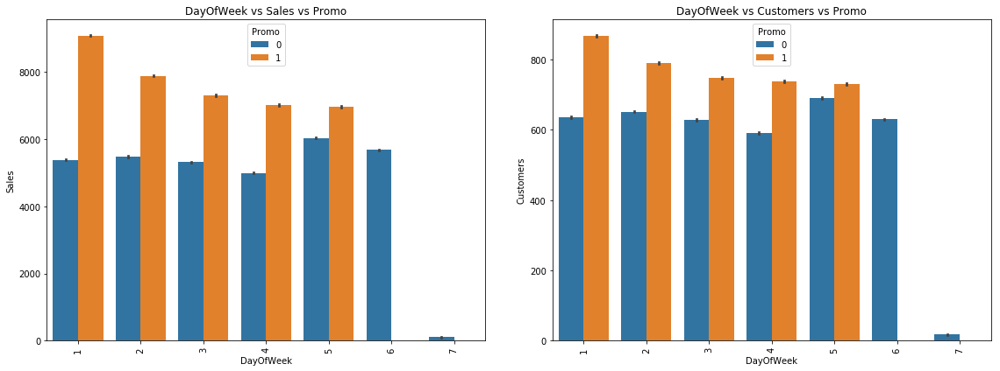

In [118]:
fig = plt.figure(figsize=(16, 6))
    
fig.add_subplot(1,2,1)
fig.tight_layout(h_pad=5, w_pad=5)
sns.barplot(x='DayOfWeek',y='Sales',hue='Promo',data=train_df)
plt.title("DayOfWeek vs Sales vs Promo")
plt.xticks(rotation = 90)

fig.add_subplot(1,2,2)
fig.tight_layout(h_pad=5, w_pad=5)
sns.barplot(x='DayOfWeek',y='Customers',hue='Promo',data=train_df)
plt.title("DayOfWeek vs Customers vs Promo")
plt.xticks(rotation = 90)

plt.show()

#### We can see , when Promotion is going on the sales and customers are increasing very significantly. On weekdy-7, there is no promotion, sales and no of customers are very less.

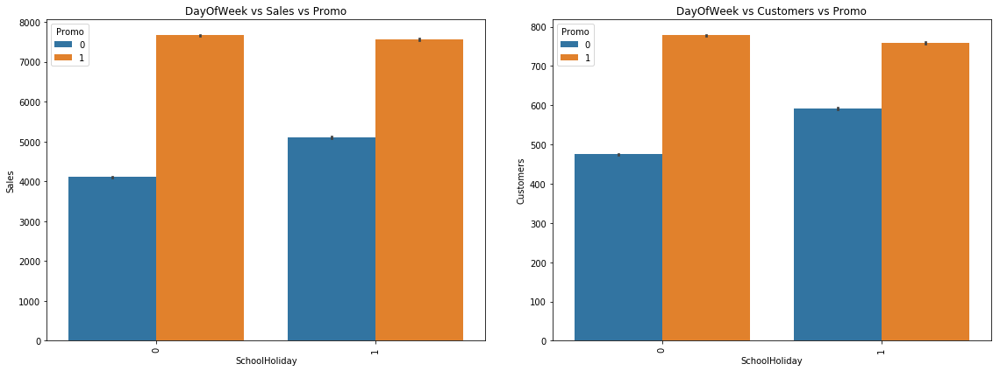

In [119]:
fig = plt.figure(figsize=(16, 6))
    
fig.add_subplot(1,2,1)
fig.tight_layout(h_pad=5, w_pad=5)
sns.barplot(x='SchoolHoliday',y='Sales',hue='Promo',data=train_df)
plt.title("DayOfWeek vs Sales vs Promo")
plt.xticks(rotation = 90)

fig.add_subplot(1,2,2)
fig.tight_layout(h_pad=5, w_pad=5)
sns.barplot(x='SchoolHoliday',y='Customers',hue='Promo',data=train_df)
plt.title("DayOfWeek vs Customers vs Promo")
plt.xticks(rotation = 90)

plt.show()

#### We can see when there is a school holiday and promotion is going on, no of customers and sales goes up significantly than other day.

<Figure size 2880x2880 with 0 Axes>

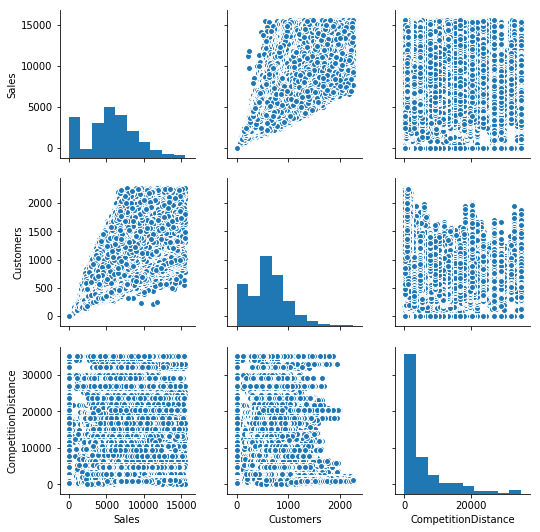

In [120]:
# paiwise scatter plot

plt.figure(figsize=(40, 40))
sns.pairplot(train_df[['Sales','Customers','CompetitionDistance']])
plt.show()

#### We can see, with increase of customers ,sales is increasing and vice versa. But for cometition distance we can not say anything about sales and customers.

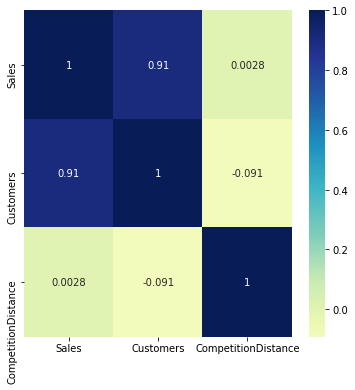

In [121]:
# plot heat map for corr
cor = train_df[['Sales','Customers','CompetitionDistance']].corr()
plt.figure(figsize = (6, 6))
sns.heatmap(cor, annot = True,center=0.4,cmap="YlGnBu")
plt.show()

#### We can see, sales and customers are highly correlated with correlation coefficient value 0.91 .
#### The correlation coefficient values  of CompititionDistance with Sales and Customers are very low.

In [122]:
train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01


#### Promo2 data is at Store level. If Promo2 is 1, When we merged it marked Promo2 as 1 for all day, which is not correct.We have the information when Promo2 is started and when it is applicable. Let's calculate Promo2 value.

In [123]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
DayOfWeek,int64,0.00,0,7
Date,datetime64[ns],0.00,0,942
Sales,int64,0.00,0,14694
Customers,int64,0.00,0,2206
Open,int64,0.00,0,2
Promo,int64,0.00,0,2
StateHoliday,object,0.00,0,2
SchoolHoliday,int64,0.00,0,2
StoreType,object,0.00,0,4


In [124]:

# week>=week year>=Year month is in the list
def calculate_promo2(row):
    if row['Promo2']==0:
        return 0
    elif row['Date'].year>row['Promo2SinceYear'] and calendar.month_abbr[row['Date'].month].upper() in row['PromoInterval'].upper().split(','):
        return 1
    elif row['Date'].week>=row['Promo2SinceWeek'] and row['Date'].year==row['Promo2SinceYear'] and calendar.month_abbr[row['Date'].month].upper() in row['PromoInterval'].upper().split(','):
        return 1
    else:
        return 0
train_df['Promo2Actual']=train_df[['Promo2','Date','Promo2SinceWeek','Promo2SinceYear','PromoInterval']].apply(calculate_promo2,axis=1)

In [125]:
train_df[['Promo2','Date','Promo2SinceWeek','Promo2SinceYear','PromoInterval','Promo2Actual']].head()

,Promo2,Date,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Promo2Actual
0,0,2015-07-31,0.0,0.0,0,0
1,0,2015-07-30,0.0,0.0,0,0
2,0,2015-07-29,0.0,0.0,0,0
3,0,2015-07-28,0.0,0.0,0,0
4,0,2015-07-27,0.0,0.0,0,0


In [126]:
train_df[['Promo2','Date','Promo2SinceWeek','Promo2SinceYear','PromoInterval','Promo2Actual']].tail()

,Promo2,Date,Promo2SinceWeek,Promo2SinceYear,PromoInterval,Promo2Actual
996969,0,2014-12-24,0.0,0.0,0,0
996970,0,2014-10-26,0.0,0.0,0,0
996971,0,2013-12-31,0.0,0.0,0,0
996972,0,2013-12-24,0.0,0.0,0,0
996973,0,2014-10-15,0.0,0.0,0,0


In [127]:
train_df.loc[(train_df.Promo2==1) & (train_df.Promo2Actual==0),:].shape

(358539, 18)

In [128]:
train_df.Promo2.value_counts()

1    504077
0    492897
Name: Promo2, dtype: int64

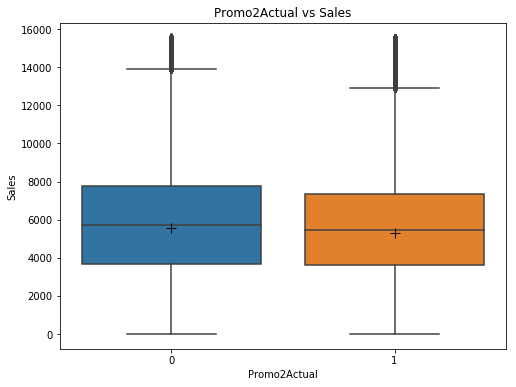

In [129]:
# boxPlotBiVariant(['Promo2Actual'],train_df)
fig = plt.figure(figsize=(8, 6))
sns.boxplot(y='Sales',x='Promo2Actual',data=train_df,showmeans=True,
            meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "10"})
plt.title("Promo2Actual vs Sales")

plt.show()


#### We can see, Promo2 has no impact on sales. The mean value for both cases are lying at same point.

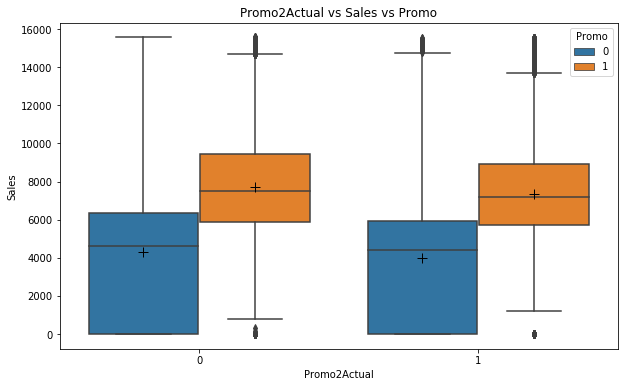

In [130]:
# train_df_promo=train_df.loc[train_df.Promo==1,:]
# boxPlotBiVariant(['Promo2Actual'],train_df_promo)


fig = plt.figure(figsize=(10, 6))
sns.boxplot(y='Sales',x='Promo2Actual',hue='Promo',data=train_df,showmeans=True,
            meanprops={"marker": "+",
                       "markeredgecolor": "black",
                       "markersize": "10"})
plt.title("Promo2Actual vs Sales vs Promo")

plt.show()

#### Here we can see, the average sells is increasing because of Promo, not by Promo2Actual.By providing extra promotions (promo2), it is not affecting the sell. Here we can say, promo has greater impact on sales, rather any continuous promotions.

In [131]:
def plot_linegraph_promo(store):
    fig = plt.figure(figsize=(20, 10))
    
    fig.add_subplot(2,1,1)
    y1=list(train_df[(train_df.Store==store) & (train_df.Promo2Actual==0)].Sales)
    x1=list(train_df[(train_df.Store==store) & (train_df.Promo2Actual==0)].Date)
    y2=list(train_df[(train_df.Store==store) & (train_df.Promo2Actual==1)].Sales)
    x2=list(train_df[(train_df.Store==store) & (train_df.Promo2Actual==1)].Date)
    plt.plot(x1,y1,label='no promo2',color='green')
    plt.plot(x2,y2,label='wgile promo2',color='red')
    plt.title("Sales change with promo2  store={}".format(store))
    plt.legend()
    
    month=train_df[(train_df.Store==store) & (train_df.Promo2Actual==1)].PromoInterval.unique()
    year=train_df[(train_df.Store==store) & (train_df.Promo2Actual==1)].Promo2SinceYear.unique()
    if(len(month)>0):
        month=month[0].split(',')[2]
        year=year[0]
    
        month_map={'jan':1,'feb':2,'mar':3,'apr':4,
              'may':4,'jun':6,'jul':7,'aug':8,
              'sep':9,'oct':10,'nov':11,'dec':12}
        train_df_filter=train_df[(train_df['Date'].dt.month==month_map[month.lower()]) |
                                                            (train_df['Date'].dt.month+1==month_map[month.lower()])]
        fig.add_subplot(2,1,2)
        y1=list(train_df_filter[(train_df_filter.Store==store) & (train_df_filter.Promo2Actual==0)].Sales)
        x1=list(train_df_filter[(train_df_filter.Store==store) & (train_df_filter.Promo2Actual==0)].Date)
        y2=list(train_df_filter[(train_df_filter.Store==store) & (train_df_filter.Promo2Actual==1)].Sales)
        x2=list(train_df_filter[(train_df_filter.Store==store) & (train_df_filter.Promo2Actual==1)].Date)
        plt.plot(x1,y1,label='no promo2',color='green')
        plt.plot(x2,y2,label='wgile promo2',color='red')
        plt.title("Sales change with promo2  for 60 days  store={}".format(store))
        plt.legend()

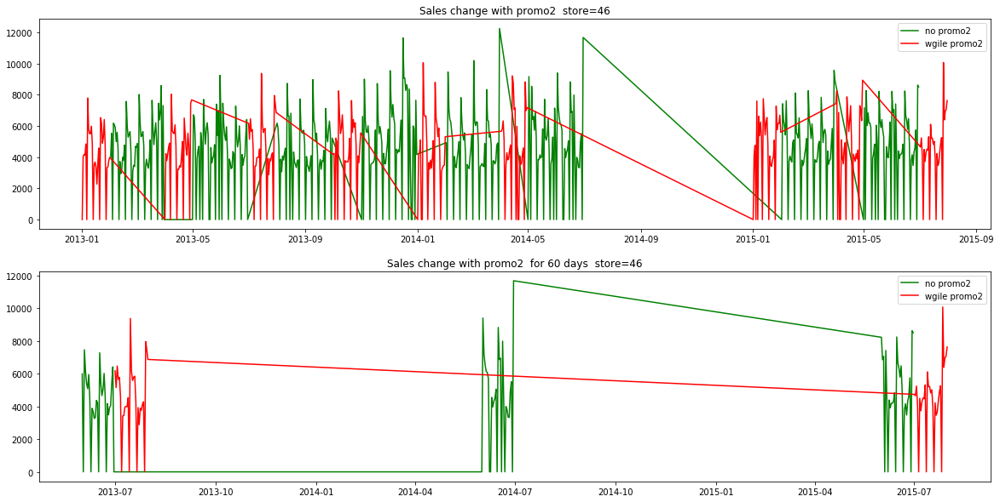

In [132]:
plot_linegraph_promo(46)

#### Here we can see a hike in sales marginally for few days when promo2 is started.

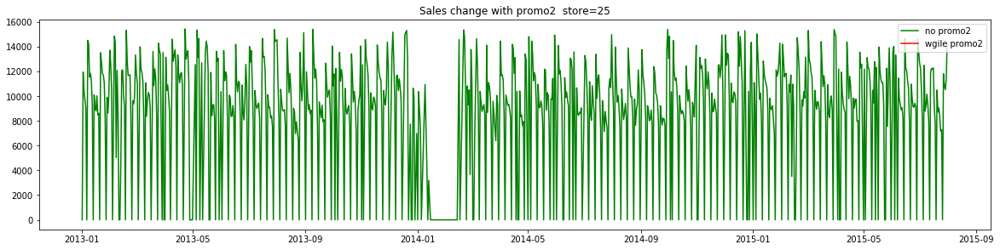

In [133]:
plot_linegraph_promo(25)

#### No promo2 for store 25.

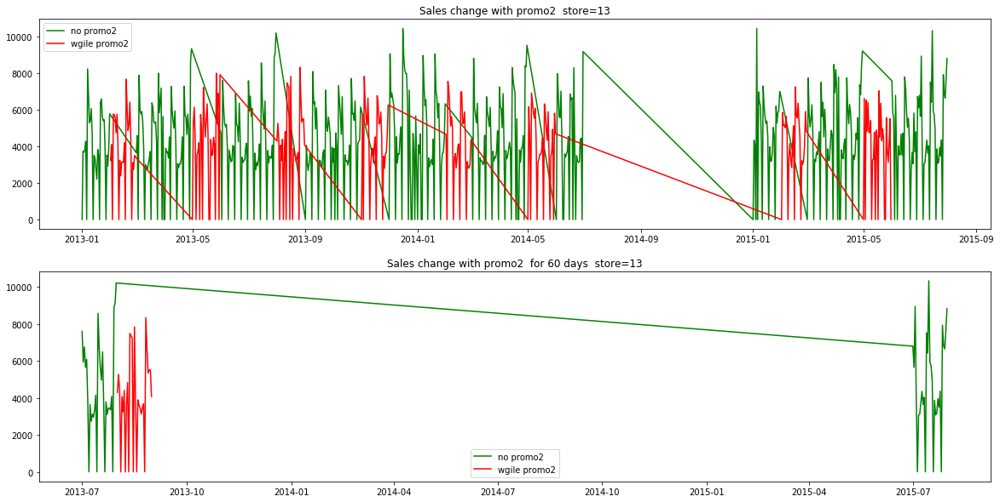

In [134]:
plot_linegraph_promo(13)

#### Here we can see very marginal increase in sales for store 13.

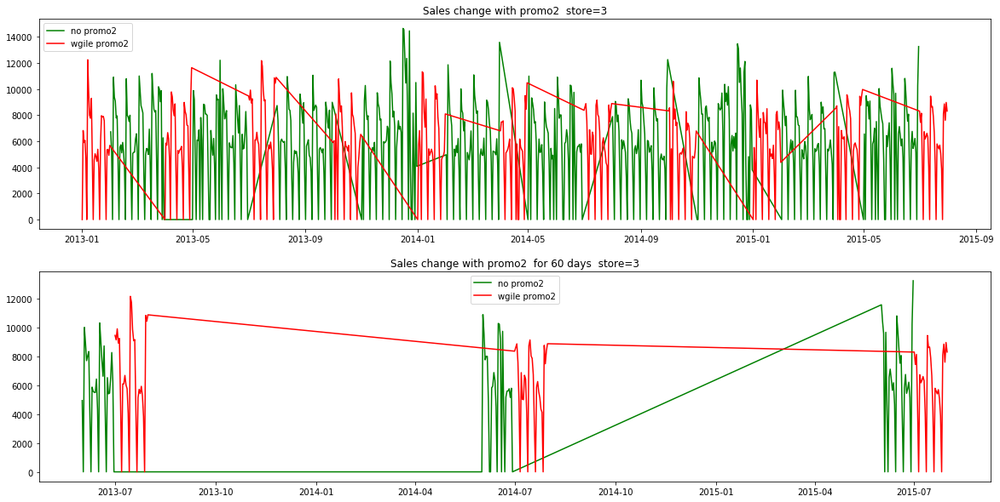

In [135]:
plot_linegraph_promo(3)

#### For store 3 we can see no effect of promo2 when promo2 started.

#### Fromo above analysis on store wise we can see that , promo2 has very little effect on sales that to for short period of days.

In [136]:
train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01,0
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01,0
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01,0
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01,0
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,0,0.0,0.0,0,2008-9-01,0


In [137]:
#### As we have calculated Promo2Actual we can remove Promo2.
train_df.drop('Promo2',axis=1,inplace=True)

In [138]:
train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-9-01,0
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-9-01,0
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-9-01,0
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-9-01,0
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-9-01,0


In [139]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 996974 entries, 0 to 996973
Data columns (total 17 columns):
Store                   996974 non-null int64
DayOfWeek               996974 non-null int64
Date                    996974 non-null datetime64[ns]
Sales                   996974 non-null int64
Customers               996974 non-null int64
Open                    996974 non-null int64
Promo                   996974 non-null int64
StateHoliday            996974 non-null object
SchoolHoliday           996974 non-null int64
StoreType               996974 non-null object
Assortment              996974 non-null object
CompetitionDistance     996974 non-null float64
Promo2SinceWeek         996974 non-null float64
Promo2SinceYear         996974 non-null float64
PromoInterval           996974 non-null object
CompetitionOpenSince    681005 non-null object
Promo2Actual            996974 non-null int64
dtypes: datetime64[ns](1), float64(3), int64(8), object(5)
memory usage: 176.9+ MB


In [140]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
DayOfWeek,int64,0.00,0,7
Date,datetime64[ns],0.00,0,942
Sales,int64,0.00,0,14694
Customers,int64,0.00,0,2206
Open,int64,0.00,0,2
Promo,int64,0.00,0,2
StateHoliday,object,0.00,0,2
SchoolHoliday,int64,0.00,0,2
StoreType,object,0.00,0,4


In [141]:
train_df['CompetitionOpenSince']=pd.to_datetime(train_df['CompetitionOpenSince'],errors='coerce')

In [142]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 996974 entries, 0 to 996973
Data columns (total 17 columns):
Store                   996974 non-null int64
DayOfWeek               996974 non-null int64
Date                    996974 non-null datetime64[ns]
Sales                   996974 non-null int64
Customers               996974 non-null int64
Open                    996974 non-null int64
Promo                   996974 non-null int64
StateHoliday            996974 non-null object
SchoolHoliday           996974 non-null int64
StoreType               996974 non-null object
Assortment              996974 non-null object
CompetitionDistance     996974 non-null float64
Promo2SinceWeek         996974 non-null float64
Promo2SinceYear         996974 non-null float64
PromoInterval           996974 non-null object
CompetitionOpenSince    681005 non-null datetime64[ns]
Promo2Actual            996974 non-null int64
dtypes: datetime64[ns](2), float64(3), int64(8), object(4)
memory usage: 176.9+

In [143]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
DayOfWeek,int64,0.00,0,7
Date,datetime64[ns],0.00,0,942
Sales,int64,0.00,0,14694
Customers,int64,0.00,0,2206
Open,int64,0.00,0,2
Promo,int64,0.00,0,2
StateHoliday,object,0.00,0,2
SchoolHoliday,int64,0.00,0,2
StoreType,object,0.00,0,4


In [144]:
train_df.loc[train_df.CompetitionOpenSince>train_df.Date,['Date','CompetitionOpenSince']].head()

,Date,CompetitionOpenSince
3879,2015-03-31,2015-04-01
3880,2015-03-30,2015-04-01
3881,2015-03-29,2015-04-01
3882,2015-03-28,2015-04-01
3883,2015-03-27,2015-04-01


In [145]:
train_df.loc[train_df.CompetitionOpenSince>train_df.Date,:].Store.value_counts()

1020    942
1072    942
688     942
304     911
131     911
403     911
996     909
1053    902
944     899
496     881
550     881
718     880
170     850
326     850
225     850
185     850
103     849
269     846
286     820
837     820
770     820
1044    820
918     820
5       820
1034    818
630     815
197     789
563     789
301     789
1013    761
       ... 
1059     90
315      90
801      90
122      90
578      90
246      90
116      90
882      90
647      90
1099     90
490      90
7        90
110      90
47       90
523      88
380      71
752      59
181      59
1094     59
915      59
159      59
513      50
375      31
1040     31
608      31
219      31
395      31
954      31
1032     30
788      26
Name: Store, Length: 190, dtype: int64

In [146]:


def calculate_compitition(row):
    if row.CompetitionOpenSince>row.Date:
        return 1
    else:
        return 0
train_df_compitition=train_df.copy()
train_df_compitition['Before_Compitition_flag']=train_df_compitition[['CompetitionOpenSince','Date']].apply(calculate_compitition,axis=1)

In [147]:
train_df_compitition.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual,Before_Compitition_flag
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0


In [148]:
train_df_compitition_grouped=pd.DataFrame(train_df_compitition.groupby(['Store','Before_Compitition_flag']).Sales.mean())
train_df_compitition_grouped=train_df_compitition_grouped.reset_index()

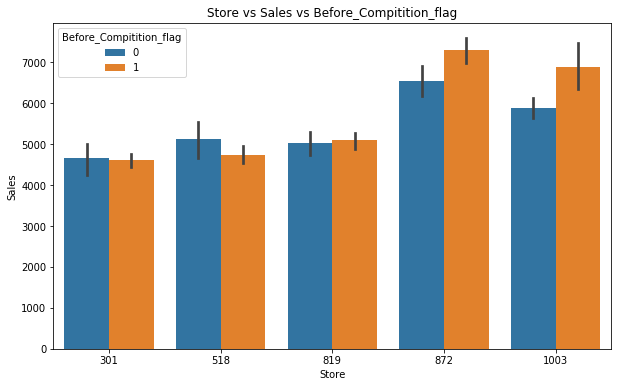

In [149]:
fig = plt.figure(figsize=(10, 6))
sns.barplot(y='Sales',x='Store',hue='Before_Compitition_flag',data=train_df_compitition.loc[train_df_compitition.Store.isin([819,872,1003,518,301]),:])
plt.title("Store vs Sales vs Before_Compitition_flag")
plt.show()

#### We can see for the store 301,518 when the compititor opened , the average sales value increased..
#### and for store 819,82,1003, when the compitior opened , the average sales value reduced. So we can not say  anything about the imact of compitition.

In [150]:
train_df_compitition[train_df_compitition.Store==301]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual,Before_Compitition_flag
265572,301,5,2015-07-31,6665,629,1,1,0,1,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0
265573,301,4,2015-07-30,6307,577,1,1,0,1,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0
265574,301,3,2015-07-29,5598,577,1,1,0,1,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0
265575,301,2,2015-07-28,5381,507,1,1,0,1,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0
265576,301,1,2015-07-27,6211,582,1,1,0,1,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0
265577,301,7,2015-07-26,0,0,0,0,0,0,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0
265578,301,6,2015-07-25,3519,370,1,0,0,0,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0
265579,301,5,2015-07-24,5562,576,1,0,0,1,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0
265580,301,4,2015-07-23,4545,488,1,0,0,1,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0
265581,301,3,2015-07-22,4705,507,1,0,0,1,a,c,4510.0,0.0,0.0,0,2015-03-01,0,0


In [151]:
train_df_compitition[(train_df_compitition.Store==301)& (train_df_compitition.Before_Compitition_flag==1)].Date.max()

Timestamp('2015-02-28 00:00:00')

In [152]:
train_df_compitition[(train_df_compitition.Store==301)& (train_df_compitition.Before_Compitition_flag==0)].Date.min()

Timestamp('2015-03-01 00:00:00')

In [153]:
train_df_compitition[train_df_compitition.Store==301].CompetitionDistance.unique()

array([4510.])

In [154]:
def plot_linegraph(store):
    fig = plt.figure(figsize=(20, 10))
    
    fig.add_subplot(2,1,1)
    y1=list(train_df_compitition[(train_df_compitition.Store==store) & (train_df_compitition.Before_Compitition_flag==0)].Sales)
    x1=list(train_df_compitition[(train_df_compitition.Store==store) & (train_df_compitition.Before_Compitition_flag==0)].Date)
    y2=list(train_df_compitition[(train_df_compitition.Store==store) & (train_df_compitition.Before_Compitition_flag==1)].Sales)
    x2=list(train_df_compitition[(train_df_compitition.Store==store) & (train_df_compitition.Before_Compitition_flag==1)].Date)
    plt.plot(x1,y1,label='After compititor opened',color='green')
    plt.plot(x2,y2,label='Before compititor opened',color='red')
    plt.title("Sales change when compititor opened for store={}".format(store))
    plt.legend()

    fig.add_subplot(2,1,2)
    last_day_before_compititor=train_df_compitition[(train_df_compitition.Store==store)& (train_df_compitition.Before_Compitition_flag==1)].Date.max()
    last_day_before_compititor_plus15=last_day_before_compititor+datetime.timedelta(days = 30)
    last_day_before_compititor_minus15=last_day_before_compititor-datetime.timedelta(days = 30)

    filtered_train_df_compitition = train_df_compitition[(train_df_compitition.Date>=last_day_before_compititor_minus15) &
                        (train_df_compitition.Date<=last_day_before_compititor_plus15)
                                                        & (train_df_compitition.Store==store)]
    print('For store={} compititor distance={} compititor open since={}'.format(store,filtered_train_df_compitition.CompetitionDistance.unique(),filtered_train_df_compitition.CompetitionOpenSince.unique()))
    y1=list(filtered_train_df_compitition[filtered_train_df_compitition.Before_Compitition_flag==0].Sales)
    x1=list(filtered_train_df_compitition[filtered_train_df_compitition.Before_Compitition_flag==0].Date)
    y2=list(filtered_train_df_compitition[filtered_train_df_compitition.Before_Compitition_flag==1].Sales)
    x2=list(filtered_train_df_compitition[filtered_train_df_compitition.Before_Compitition_flag==1].Date)
    plt.plot(x1,y1,label='After compititor opened',color='green')
    plt.plot(x2,y2,label='Before compititor opened',color='red')
    plt.title("Sales change when compititor opened for 60 days for store={}".format(store))
    plt.legend()


For store=301 compititor distance=[4510.] compititor open since=['2015-03-01T00:00:00.000000000']


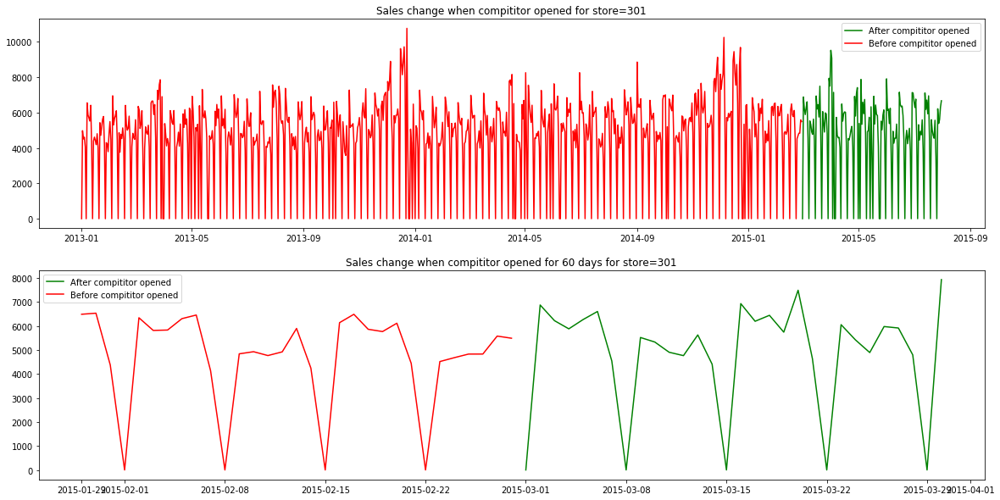

In [155]:
plot_linegraph(301)

#### The first graph shows for all day for the store 301 and the 2nd grapgh shows the grapgh befre and after 15 days of compititor opened.
#### Here we can see the comptitior is at 4510 meter away from the store .  After compititor opened, there is no impact in the sales of the store.

For store=1115 compititor distance=[] compititor open since=[]


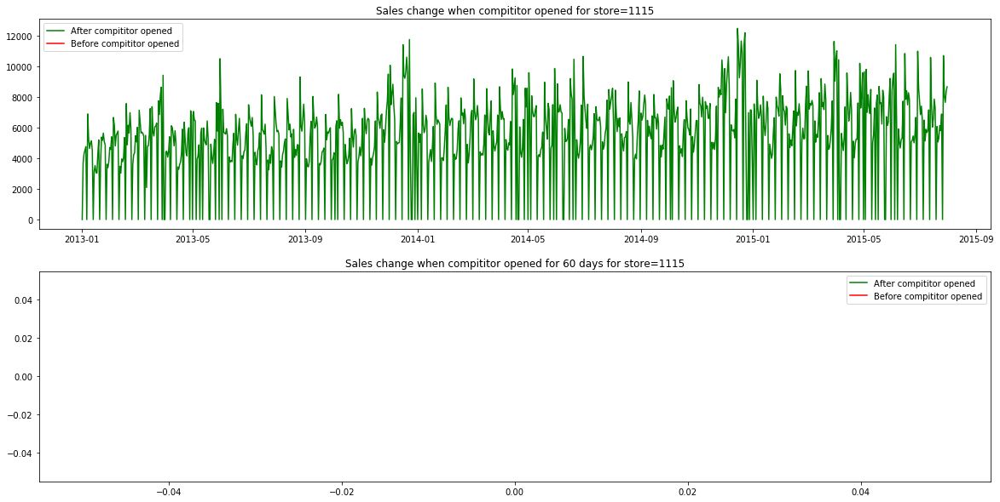

In [156]:
plot_linegraph(1115)

#### The first graph shows for all day for the store 1115 and the 2nd grapgh shows the grapgh before and after 15 days of compititor opened.
#### We can see there is no compitior for the store till date.

For store=872 compititor distance=[3860.] compititor open since=['2014-09-01T00:00:00.000000000']


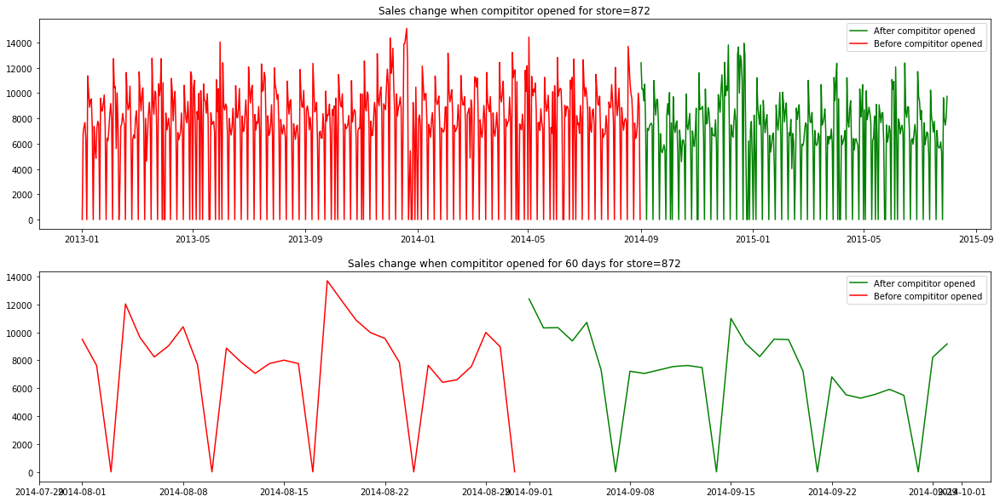

In [157]:
plot_linegraph(872)

#### The first graph shows for all day for the store 872 and the 2nd grapgh shows the grapgh befre and after 15 days of compititor opened.
#### Here we can see the comptitior is at 3860 meter away from the store . After compititor opened, we can see there is marginal reduction on sales.

For store=1003 compititor distance=[170.] compititor open since=['2013-07-01T00:00:00.000000000']


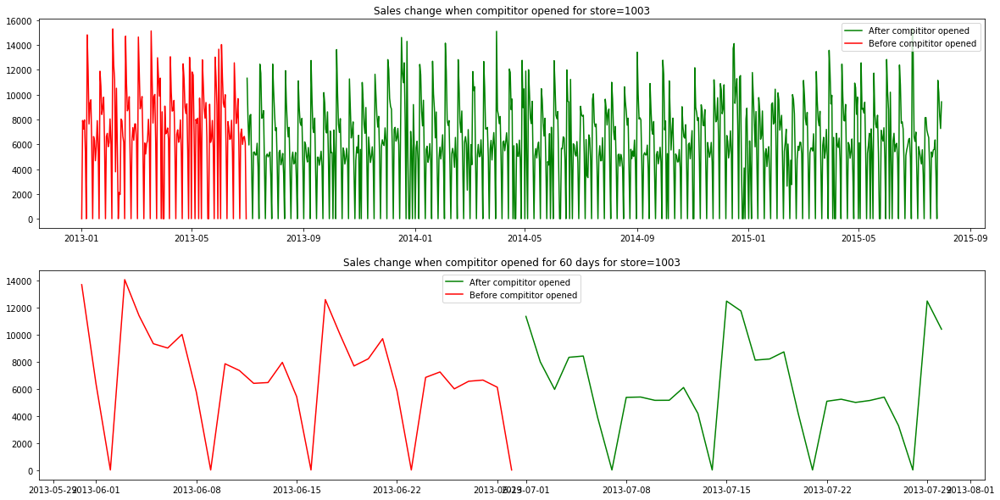

In [158]:
plot_linegraph(1003)

#### The first graph shows for all day for the store 1003 and the 2nd grapgh shows the grapgh befre and after 15 days of compititor opened.
#### Here we can see the comptitior is at 170 meter away from the store . After compititor opened, there is marginal reduction in the sales of the store.

For store=819 compititor distance=[720.] compititor open since=['2014-10-01T00:00:00.000000000']


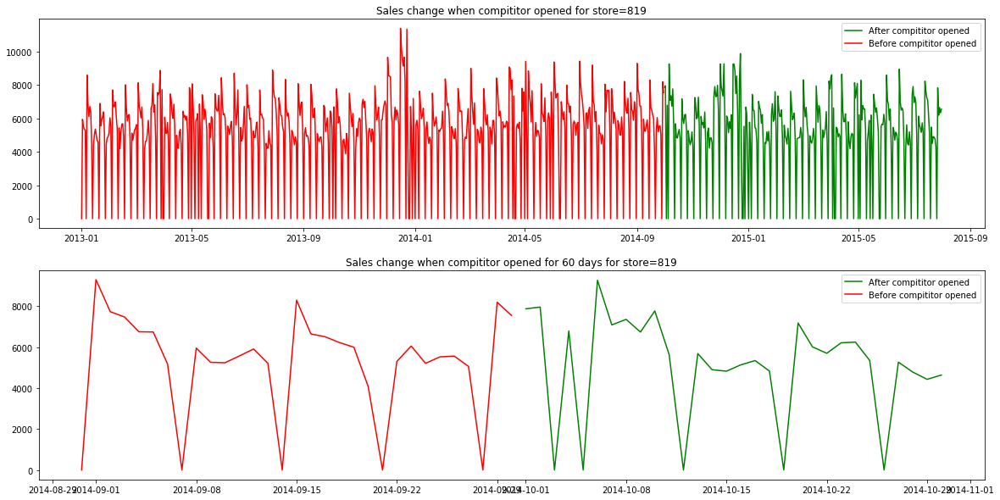

In [159]:
plot_linegraph(819)

#### The first graph shows for all day for the store 819 and the 2nd grapgh shows the grapgh befre and after 15 days of compititor opened.
#### Here we can see the comptitior is at 720 meter away from the store . After compititor opened, there is marginal reduction in the sales of the store.

For store=518 compititor distance=[3330.] compititor open since=['2015-03-01T00:00:00.000000000']


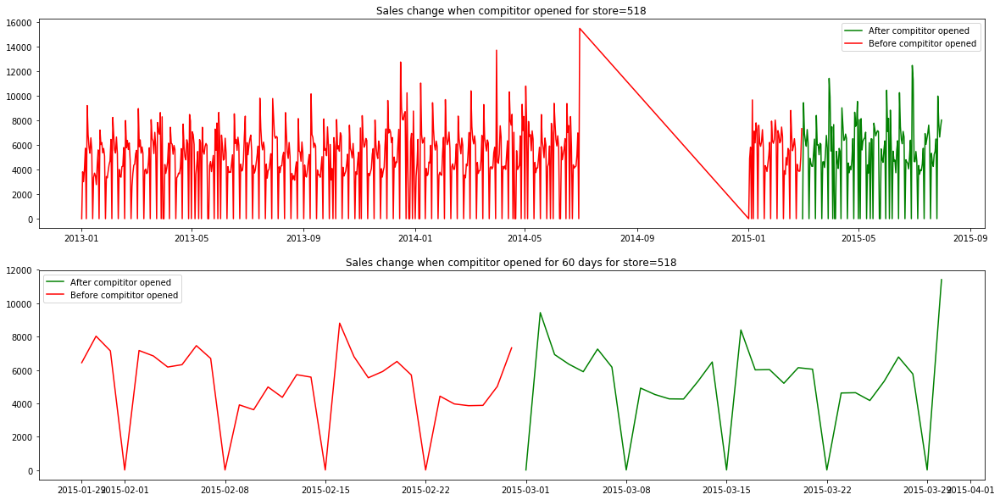

In [160]:
plot_linegraph(518)

#### The first graph shows for all day for the store 819 and the 2nd grapgh shows the grapgh befre and after 15 days of compititor opened.
#### Here we can see the comptitior is at 3330 meter away from the store . After compititor opened, there isno change  in the sales of the store.

#### From all these graphs we can see that when the compititor distance is high , the impact on sales is none. But when the compititor distance is less we cann ses the sales value is decresing marginally for few days.  

In [161]:
def calculate_distance(x):
    if x<500:
        return '<500'
    elif x<1000:
        return '500-1000'
    else:
        return '>1000'


In [162]:
train_df_compitition['CompititorDistanceCategory']=train_df_compitition['CompetitionDistance'].apply(lambda x:calculate_distance(x))
train_df_compitition.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual,Before_Compitition_flag,CompititorDistanceCategory
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0,>1000
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0,>1000
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0,>1000
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0,>1000
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,0,>1000


In [163]:
train_df_compitition_less_than500=train_df_compitition.loc[train_df_compitition.CompititorDistanceCategory=='<500',:]
train_df_compitition_grouped=pd.DataFrame(train_df_compitition_less_than500.groupby(['Store','Before_Compitition_flag']).Sales.mean())
train_df_compitition_grouped=train_df_compitition_grouped.reset_index()
train_df_compitition_grouped.Store.value_counts()==2

133      True
166      True
905      True
391      True
902      True
882      True
336      True
839      True
275      True
269      True
266      True
264      True
770      True
1086     True
954      True
585      True
57       True
52       True
47       True
550      True
30       True
1099     True
1044     True
523      True
1032     True
6        True
947      True
513      True
958      True
449      True
        ...  
1082    False
226     False
737     False
734     False
1011    False
216     False
984     False
259     False
773     False
470     False
320     False
829     False
778     False
825     False
822     False
818     False
817     False
816     False
300     False
811     False
295     False
806     False
293     False
291     False
502     False
973     False
786     False
271     False
974     False
1020    False
Name: Store, Length: 221, dtype: bool

In [164]:
train_df_compitition_less_than1000=train_df_compitition.loc[train_df_compitition.CompititorDistanceCategory=='500-1000',:]
train_df_compitition_grouped=pd.DataFrame(train_df_compitition_less_than1000.groupby(['Store','Before_Compitition_flag']).Sales.mean())
train_df_compitition_grouped=train_df_compitition_grouped.reset_index()
train_df_compitition_grouped.Store.value_counts()==2

646      True
131      True
169      True
819      True
685      True
432      True
413      True
915      True
599      True
539      True
970      True
904      True
986      True
784      True
563      True
598      True
1013     True
116      True
629      True
752      True
490      True
774      True
852     False
1095    False
861     False
55      False
319     False
1097    False
1114    False
951     False
        ...  
1004    False
239     False
241     False
498     False
244     False
193     False
442     False
615     False
733     False
700     False
1016    False
636     False
504     False
1108    False
641     False
130     False
1025    False
655     False
795     False
695     False
658     False
760     False
920     False
409     False
417     False
936     False
684     False
435     False
949     False
512     False
Name: Store, Length: 110, dtype: bool

In [165]:
train_df_compitition_more_than1000=train_df_compitition.loc[train_df_compitition.CompititorDistanceCategory=='>1000',:]
train_df_compitition_grouped=pd.DataFrame(train_df_compitition_more_than1000.groupby(['Store','Before_Compitition_flag']).Sales.mean())
train_df_compitition_grouped=train_df_compitition_grouped.reset_index()
train_df_compitition_grouped.Store.value_counts()==2

214      True
810      True
837      True
560      True
347      True
828      True
137      True
138      True
1094     True
814      True
578      True
1034     True
801      True
800      True
581      True
326      True
321      True
159      True
788      True
318      True
126      True
122      True
380      True
872      True
84       True
524      True
1111     True
1053     True
525      True
375      True
        ...  
1057    False
594     False
593     False
592     False
591     False
590     False
588     False
620     False
623     False
624     False
639     False
1055    False
654     False
652     False
650     False
649     False
648     False
644     False
640     False
638     False
625     False
637     False
634     False
633     False
632     False
631     False
1083    False
628     False
627     False
1024    False
Name: Store, Length: 784, dtype: bool

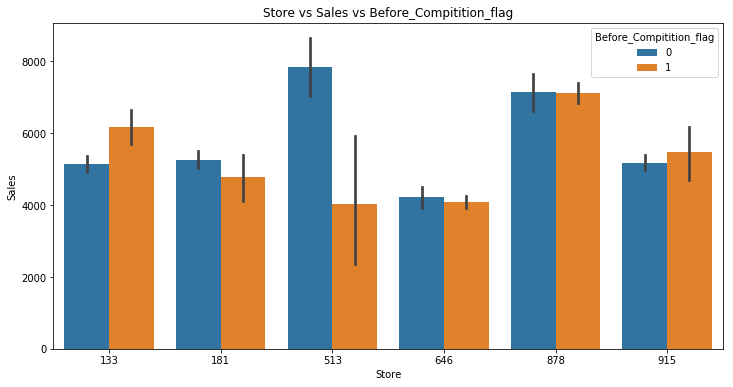

In [166]:


fig, ax1 = plt.subplots(figsize=(12,6))
sns.barplot(y='Sales',x='Store',hue='Before_Compitition_flag',data=train_df_compitition.loc[train_df_compitition.Store.isin([513,133,646,915,878,181]),:],ax=ax1)

plt.title("Store vs Sales vs Before_Compitition_flag")
plt.show()

#### For 133,513 store, where the compititor distance is <500,we can see, the average selling price in one case decreasing after the copititor opened and for other it has increased.

#### For 646,915 store, where the compititor distance is 500-1000, the average selling price is increased in one case and in other case it is decreased.

#### For 181,878 store, where the compititor distance is 500-1000, the average selling price is increased in one case and in other case it is decreased.

#### Here we can say the in long term , there is no impact of comititor on sales. But when the compititor is near, for few days, it impacts the sell.

In [167]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.00,0,1115
DayOfWeek,int64,0.00,0,7
Date,datetime64[ns],0.00,0,942
Sales,int64,0.00,0,14694
Customers,int64,0.00,0,2206
Open,int64,0.00,0,2
Promo,int64,0.00,0,2
StateHoliday,object,0.00,0,2
SchoolHoliday,int64,0.00,0,2
StoreType,object,0.00,0,4


In [168]:
train_df.shape

(996974, 17)

#### We can see missing values in CompetitionOpenSince. Let's try to impute .

In [169]:
train_df.loc[train_df.CompetitionDistance==0,'CompetitionOpenSince']

256349   NaT
256350   NaT
256351   NaT
256352   NaT
256353   NaT
256354   NaT
256355   NaT
256356   NaT
256357   NaT
256358   NaT
256359   NaT
256360   NaT
256361   NaT
256362   NaT
256363   NaT
256364   NaT
256365   NaT
256366   NaT
256367   NaT
256368   NaT
256369   NaT
256370   NaT
256371   NaT
256372   NaT
256373   NaT
256374   NaT
256375   NaT
256376   NaT
256377   NaT
256378   NaT
          ..
766845   NaT
766846   NaT
766847   NaT
766848   NaT
766849   NaT
766850   NaT
766851   NaT
766852   NaT
766853   NaT
766854   NaT
766855   NaT
766856   NaT
766857   NaT
766858   NaT
766859   NaT
766860   NaT
766861   NaT
766862   NaT
766863   NaT
766864   NaT
766865   NaT
766866   NaT
766867   NaT
766868   NaT
766869   NaT
766870   NaT
766871   NaT
766872   NaT
766873   NaT
766874   NaT
Name: CompetitionOpenSince, Length: 2635, dtype: datetime64[ns]

In [170]:
train_df.loc[train_df.CompetitionDistance==0,'CompetitionOpenSince'].unique()

array(['NaT'], dtype='datetime64[ns]')

#### We have many records where CompetitionDistance is 0, their corresponding CompetitionOpenSince is NaT. We can say there is no compititor for these stores. Let's put some future date(a date after 10 year) there.

In [171]:
train_df.Date.max()

Timestamp('2015-07-31 00:00:00')

In [172]:
train_df.Date.max()+datetime.timedelta(days = 3650)

Timestamp('2025-07-28 00:00:00')

In [173]:
train_df.loc[train_df.CompetitionDistance==0,'CompetitionOpenSince']=train_df.Date.max()+datetime.timedelta(days = 3650)

In [174]:
train_df.loc[train_df.CompetitionDistance==0,'CompetitionOpenSince'].unique()

array(['2025-07-28T00:00:00.000000000'], dtype='datetime64[ns]')

In [175]:
train_df.loc[(train_df.CompetitionDistance!=0) & (train_df.CompetitionOpenSince.isnull()),'CompetitionOpenSince']

10333    NaT
10334    NaT
10335    NaT
10336    NaT
10337    NaT
10338    NaT
10339    NaT
10340    NaT
10341    NaT
10342    NaT
10343    NaT
10344    NaT
10345    NaT
10346    NaT
10347    NaT
10348    NaT
10349    NaT
10350    NaT
10351    NaT
10352    NaT
10353    NaT
10354    NaT
10355    NaT
10356    NaT
10357    NaT
10358    NaT
10359    NaT
10360    NaT
10361    NaT
10362    NaT
          ..
996938   NaT
996939   NaT
996940   NaT
996941   NaT
996942   NaT
996943   NaT
996944   NaT
996945   NaT
996946   NaT
996947   NaT
996948   NaT
996949   NaT
996950   NaT
996951   NaT
996952   NaT
996953   NaT
996954   NaT
996955   NaT
996956   NaT
996957   NaT
996958   NaT
996959   NaT
996960   NaT
996961   NaT
996962   NaT
996963   NaT
996964   NaT
996965   NaT
996966   NaT
996967   NaT
Name: CompetitionOpenSince, Length: 313334, dtype: datetime64[ns]

#### There are many records where CompetitionDistance is not 0, but CompetitionOpenSince is missing, which means the store has compititor, but when the compititor opened, that data is missing. Let's impute with past date(10 years back)

In [176]:
train_df.Date.min()

Timestamp('2013-01-01 00:00:00')

In [177]:
train_df.Date.min()-datetime.timedelta(days = 3650)

Timestamp('2003-01-04 00:00:00')

In [178]:
train_df.loc[(train_df.CompetitionDistance!=0) & (train_df.CompetitionOpenSince.isnull()),'CompetitionOpenSince']=train_df.Date.min()-datetime.timedelta(days = 3650)

In [179]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,1115
DayOfWeek,int64,0.0,0,7
Date,datetime64[ns],0.0,0,942
Sales,int64,0.0,0,14694
Customers,int64,0.0,0,2206
Open,int64,0.0,0,2
Promo,int64,0.0,0,2
StateHoliday,object,0.0,0,2
SchoolHoliday,int64,0.0,0,2
StoreType,object,0.0,0,4


In [180]:
train_df.Date-train_df.CompetitionOpenSince

0        2524 days
1        2523 days
2        2522 days
3        2521 days
4        2520 days
5        2519 days
6        2518 days
7        2517 days
8        2516 days
9        2515 days
10       2514 days
11       2513 days
12       2512 days
13       2511 days
14       2510 days
15       2509 days
16       2508 days
17       2507 days
18       2506 days
19       2505 days
20       2504 days
21       2503 days
22       2502 days
23       2501 days
24       2500 days
25       2499 days
26       2498 days
27       2497 days
28       2496 days
29       2495 days
            ...   
996944   4007 days
996945   3886 days
996946   3872 days
996947   3823 days
996948   3809 days
996949   3760 days
996950   3753 days
996951   3746 days
996952   3739 days
996953   3732 days
996954   3725 days
996955   3718 days
996956   3711 days
996957   3704 days
996958   3697 days
996959   3690 days
996960   3683 days
996961   3676 days
996962   3669 days
996963   3662 days
996964   3655 days
996965   365

In [181]:
train_df['CompetitionOpenSinceDays']=train_df.Date-train_df.CompetitionOpenSince
train_df['CompetitionOpenSinceDays']=train_df['CompetitionOpenSinceDays'].dt.days

In [182]:
train_df[train_df['CompetitionOpenSinceDays']<0].head(2)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual,CompetitionOpenSinceDays
3879,5,2,2015-03-31,7692,659,1,1,0,0,a,a,29910.0,0.0,0.0,0,2015-04-01,0,-1
3880,5,1,2015-03-30,8847,770,1,1,0,0,a,a,29910.0,0.0,0.0,0,2015-04-01,0,-2


In [183]:
train_df[train_df['CompetitionOpenSinceDays']>0].head(2)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual,CompetitionOpenSinceDays
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,2524
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,2523


In [184]:
train_df[train_df['CompetitionOpenSinceDays']==0].head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual,CompetitionOpenSinceDays
3878,5,3,2015-04-01,7720,773,1,1,0,0,a,a,29910.0,0.0,0.0,0,2015-04-01,0,0
5306,6,7,2013-12-01,0,0,0,0,0,0,a,a,310.0,0.0,0.0,0,2013-12-01,0,0
6486,7,1,2013-04-01,0,0,0,0,1,1,a,c,24000.0,0.0,0.0,0,2013-04-01,0,0
6880,8,3,2014-10-01,6826,842,1,1,0,0,a,a,7520.0,0.0,0.0,0,2014-10-01,0,0
12549,14,6,2014-03-01,4170,458,1,0,0,0,a,a,1300.0,40.0,2011.0,"Jan,Apr,Jul,Oct",2014-03-01,0,0


#### +ve value in CompetitionOpenSinceDays : compititor opened before the date(compititor exist). 
#### -ve value in CompetitionOpenSinceDays : compititor opened after the date(compititor does not exist), Mark compititor distance as 0.
#### 0 value in CompetitionOpenSinceDays : compititor opened on same day of sale. 1st day of compititor. Accordingly update CompetitionOpenSinceDays

#### Now we can drop CompetitionOpenSince

In [185]:
train_df.loc[train_df.CompetitionOpenSinceDays>=0,'CompetitionOpenSinceDays']=train_df.CompetitionOpenSinceDays+1

In [186]:
train_df.loc[train_df.CompetitionOpenSinceDays<0,'CompetitionDistance']=0
train_df.loc[train_df.CompetitionOpenSinceDays<0,'CompetitionOpenSinceDays']=0

In [187]:
train_df[train_df['CompetitionOpenSinceDays']==0].head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual,CompetitionOpenSinceDays
3879,5,2,2015-03-31,7692,659,1,1,0,0,a,a,0.0,0.0,0.0,0,2015-04-01,0,0
3880,5,1,2015-03-30,8847,770,1,1,0,0,a,a,0.0,0.0,0.0,0,2015-04-01,0,0
3881,5,7,2015-03-29,0,0,0,0,0,0,a,a,0.0,0.0,0.0,0,2015-04-01,0,0
3882,5,6,2015-03-28,2038,219,1,0,0,0,a,a,0.0,0.0,0.0,0,2015-04-01,0,0
3883,5,5,2015-03-27,4181,499,1,0,0,0,a,a,0.0,0.0,0.0,0,2015-04-01,0,0


In [188]:
train_df[train_df['CompetitionOpenSinceDays']!=0].head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,Promo2SinceWeek,Promo2SinceYear,PromoInterval,CompetitionOpenSince,Promo2Actual,CompetitionOpenSinceDays
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,2525
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,2524
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,2523
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,2522
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,0.0,0.0,0,2008-09-01,0,2521


In [189]:
train_df.drop('CompetitionOpenSince',inplace=True,axis=1)

In [190]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,1115
DayOfWeek,int64,0.0,0,7
Date,datetime64[ns],0.0,0,942
Sales,int64,0.0,0,14694
Customers,int64,0.0,0,2206
Open,int64,0.0,0,2
Promo,int64,0.0,0,2
StateHoliday,object,0.0,0,2
SchoolHoliday,int64,0.0,0,2
StoreType,object,0.0,0,4


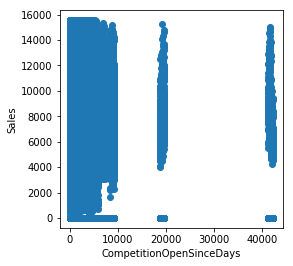

In [191]:
plt.figure(figsize=(4, 4))
plt.scatter(y=train_df['Sales'],x=train_df['CompetitionOpenSinceDays'])
plt.xlabel('CompetitionOpenSinceDays')
plt.ylabel('Sales')
plt.show()

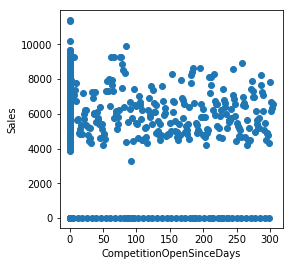

In [192]:
train_df_819=train_df.loc[train_df.Store==819,:]
plt.figure(figsize=(4, 4))
plt.scatter(y=train_df_819['Sales'],x=train_df_819['CompetitionOpenSinceDays'])
plt.xlabel('CompetitionOpenSinceDays')
plt.ylabel('Sales')
plt.show()

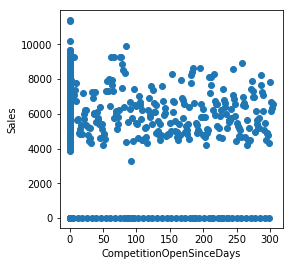

In [193]:
train_df_301=train_df.loc[train_df.Store==301,:]
plt.figure(figsize=(4, 4))
plt.scatter(y=train_df_819['Sales'],x=train_df_819['CompetitionOpenSinceDays'])
plt.xlabel('CompetitionOpenSinceDays')
plt.ylabel('Sales')
plt.show()

#### From the above 3 graph shows the trend of changes in sales in 3 cases for all store and store-819,301: when compititor exists, when compititor does not exist, on the opening day of compititor. We do not see any pattern here. 

In [194]:
train_df.PromoInterval.unique()

array([0, 'Jan,Apr,Jul,Oct', 'Feb,May,Aug,Nov', 'Mar,Jun,Sept,Dec'],
      dtype=object)

#### Promo2Actual is calculated using Promo2SinceWeek,Promo2SinceYear,PromoInterval values. We do not need these three values for further analysis. We can drop these attributes.

In [195]:
train_df.drop(['Promo2SinceWeek','Promo2SinceYear','PromoInterval'],inplace=True,axis=1)

In [196]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,1115
DayOfWeek,int64,0.0,0,7
Date,datetime64[ns],0.0,0,942
Sales,int64,0.0,0,14694
Customers,int64,0.0,0,2206
Open,int64,0.0,0,2
Promo,int64,0.0,0,2
StateHoliday,object,0.0,0,2
SchoolHoliday,int64,0.0,0,2
StoreType,object,0.0,0,4


#### Let's remove unnecessary columns : Open,StoreType,Assortment

In [197]:
train_df.drop(['Open','StoreType','Assortment','StateHoliday','Promo2Actual'],inplace=True,axis=1)

In [198]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,1115
DayOfWeek,int64,0.0,0,7
Date,datetime64[ns],0.0,0,942
Sales,int64,0.0,0,14694
Customers,int64,0.0,0,2206
Promo,int64,0.0,0,2
SchoolHoliday,int64,0.0,0,2
CompetitionDistance,float64,0.0,0,642
CompetitionOpenSinceDays,int64,0.0,0,10217


# Data Preparation

## Dummy Creation

In [199]:
dummies=pd.get_dummies(train_df['DayOfWeek'],drop_first=True,prefix='DayOfWeek')
train_df=pd.concat([train_df,dummies],axis=1)

In [200]:
train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,1,5,2015-07-31,5263,555,1,1,1270.0,2525,0,0,0,1,0,0
1,1,4,2015-07-30,5020,546,1,1,1270.0,2524,0,0,1,0,0,0
2,1,3,2015-07-29,4782,523,1,1,1270.0,2523,0,1,0,0,0,0
3,1,2,2015-07-28,5011,560,1,1,1270.0,2522,1,0,0,0,0,0
4,1,1,2015-07-27,6102,612,1,1,1270.0,2521,0,0,0,0,0,0


In [201]:
train_df.drop('DayOfWeek',axis=1,inplace=True)
train_df.head()

,Store,Date,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,1,2015-07-31,5263,555,1,1,1270.0,2525,0,0,0,1,0,0
1,1,2015-07-30,5020,546,1,1,1270.0,2524,0,0,1,0,0,0
2,1,2015-07-29,4782,523,1,1,1270.0,2523,0,1,0,0,0,0
3,1,2015-07-28,5011,560,1,1,1270.0,2522,1,0,0,0,0,0
4,1,2015-07-27,6102,612,1,1,1270.0,2521,0,0,0,0,0,0


In [202]:
train_df_metadata=get_meta_data(train_df)
train_df_metadata

,Datatype,Null_Percentage,Null count,No_Of_Unique_Values
Store,int64,0.0,0,1115
Date,datetime64[ns],0.0,0,942
Sales,int64,0.0,0,14694
Customers,int64,0.0,0,2206
Promo,int64,0.0,0,2
SchoolHoliday,int64,0.0,0,2
CompetitionDistance,float64,0.0,0,642
CompetitionOpenSinceDays,int64,0.0,0,10217
DayOfWeek_2,uint8,0.0,0,2
DayOfWeek_3,uint8,0.0,0,2


#### Now we have cleaned data. We can move forward for modelling .

# Time Series analysis

#### Here we have two time series : Customer and Sales. If Sales increases , customer will increase and vice versa. Hence Customer is a endogenous variable. But the same is not for other variables.
##### Let's visualize the data first for both sales .

In [203]:
train_df=train_df.sort_values(by='Date')
train_df.head()

,Store,Date,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
109925,121,2013-01-01,0,0,0,1,3570.0,1158,1,0,0,0,0,0
442319,504,2013-01-01,0,0,0,1,820.0,3651,1,0,0,0,0,0
804419,922,2013-01-01,0,0,0,1,2110.0,2499,1,0,0,0,0,0
216966,243,2013-01-01,0,0,0,1,310.0,3651,1,0,0,0,0,0
20139,22,2013-01-01,0,0,0,1,1040.0,3651,1,0,0,0,0,0


In [204]:
train_df=train_df.set_index('Date')
train_df.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,121,0,0,0,1,3570.0,1158,1,0,0,0,0,0
2013-01-01,504,0,0,0,1,820.0,3651,1,0,0,0,0,0
2013-01-01,922,0,0,0,1,2110.0,2499,1,0,0,0,0,0
2013-01-01,243,0,0,0,1,310.0,3651,1,0,0,0,0,0
2013-01-01,22,0,0,0,1,1040.0,3651,1,0,0,0,0,0


In [205]:
train_df_all=train_df.groupby('Date').agg({'Sales': 'mean',
                                           'Customers':'mean', 
                                           'Promo': 'sum',
                                           'SchoolHoliday':'sum',
                                           'DayOfWeek_2':'mean',
                                           'DayOfWeek_3':'mean',
                                           'DayOfWeek_4':'mean',
                                           'DayOfWeek_5':'mean',
                                           'DayOfWeek_6':'mean',
                                           'DayOfWeek_7':'mean'})
train_df_all.head()

,Sales,Customers,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,
2013-01-01,62.232914,12.804856,0,1112,1,0,0,0,0,0
2013-01-02,6061.072926,720.625342,0,1097,0,1,0,0,0,0
2013-01-03,5586.966516,666.504072,0,1030,0,0,1,0,0,0
2013-01-04,5852.084239,683.781703,0,1029,0,0,0,1,0,0
2013-01-05,5195.525886,594.768392,0,111,0,0,0,0,1,0


In [206]:
def timeseries_visualization(series,c):
    fig = plt.figure(figsize=(20, 3))
    series.plot()
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.title('For {}'.format(c))
    plt.show()

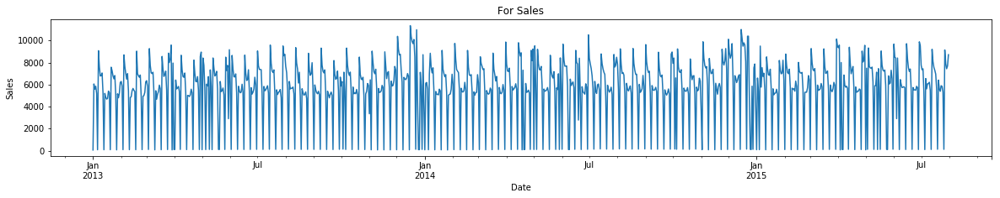

In [207]:

timeseries_visualization(train_df_all['Sales'],'Sales')

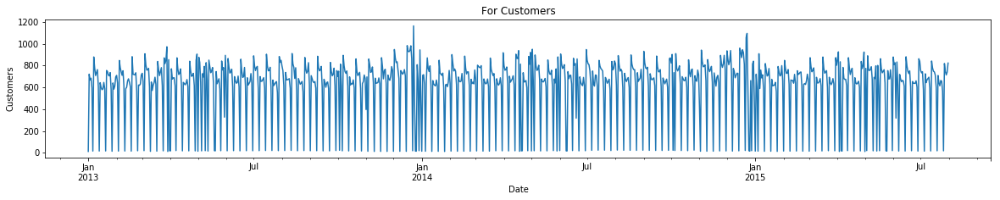

In [208]:
timeseries_visualization(train_df_all['Customers'],'Customers')

#### It is clear that both of the series is addititive series. Following grapgh shows the seasonal_decomposition of the series into Trend, Seasonal,Residual,

In [209]:
def plot_seasonal_decomposition(series,c,model):
    rcParams['figure.figsize'] = 18, 14
    decomposition = sm.tsa.seasonal_decompose(series, model=model) # additive seasonal index
    fig = decomposition.plot()
    plt.show()
    print('Mean Residual for {}={}'.format(c,decomposition.resid.mean()))


In [210]:
def plot_seasonal_decomposition_period(series,c,model):
    rcParams['figure.figsize'] = 18, 14
    decomposition = sm.tsa.seasonal_decompose(series, model=model, extrapolate_trend='freq', freq=12) # additive seasonal index
    fig = decomposition.plot()
    plt.show()
    print('Mean Residual for {}={}'.format(c,decomposition.resid.mean()))


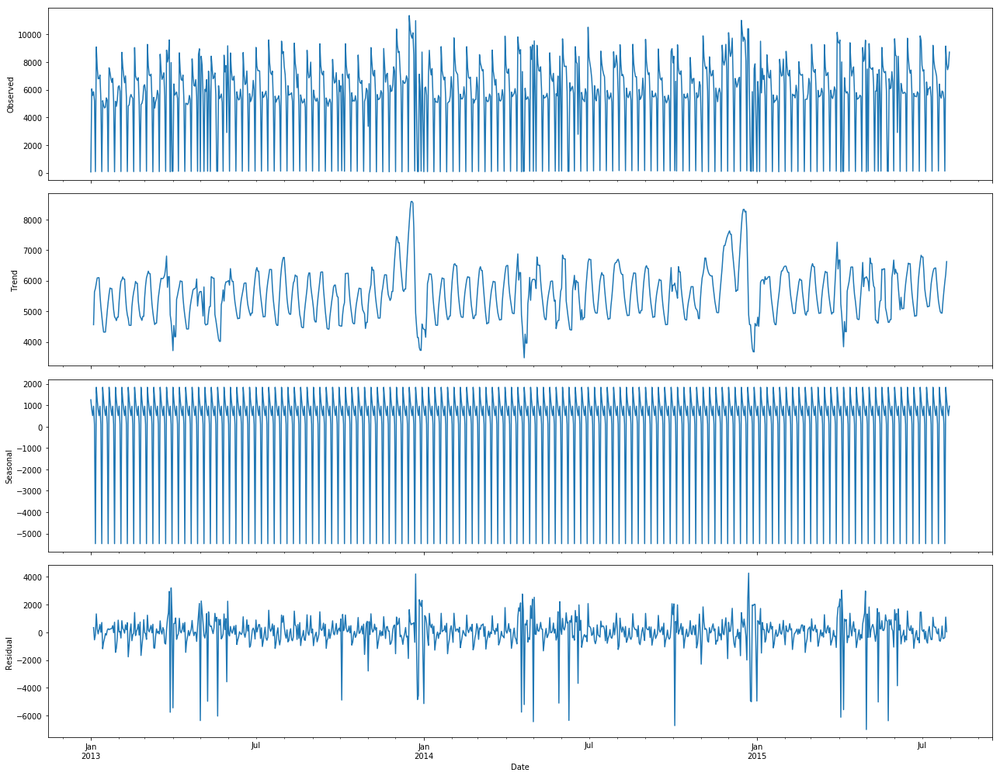

Mean Residual for Sales=0.6179371943641403


In [211]:
plot_seasonal_decomposition(train_df_all['Sales'],'Sales','additive')

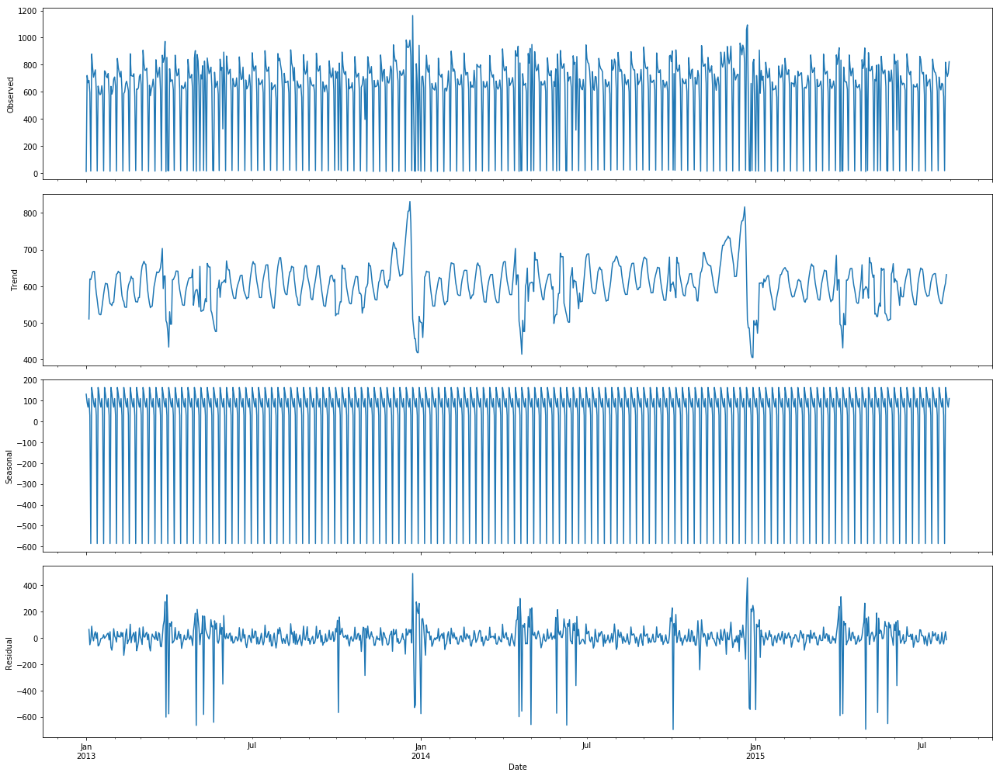

Mean Residual for Customers=0.05554069684762129


In [212]:
plot_seasonal_decomposition(train_df_all['Customers'],'Customers','additive')

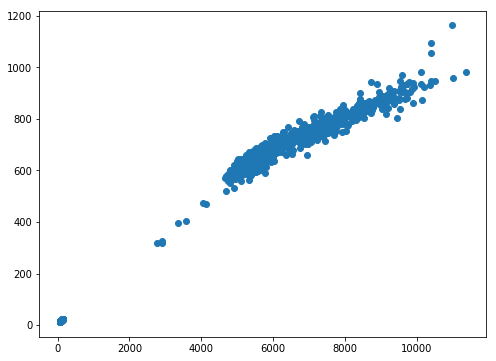

In [213]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_all['Sales'],train_df_all['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.

### Causality Testing

In [214]:
causality_sales=grangercausalitytests(train_df_all[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=189.1269, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=189.7317, p=0.0000  , df=1
likelihood ratio test: chi2=172.8402, p=0.0000  , df=1
parameter F test:         F=189.1269, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=105.6156, p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=212.3607, p=0.0000  , df=2
likelihood ratio test: chi2=191.4668, p=0.0000  , df=2
parameter F test:         F=105.6156, p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=78.1319 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=236.1562, p=0.0000  , df=3
likelihood ratio test: chi2=210.6561, p=0.0000  , df=3
parameter F test:         F=78.1319 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=67.0694 , p=0.0000  

In [215]:
causality_customers=grangercausalitytests(train_df_all[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=80.7210 , p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=80.9792 , p=0.0000  , df=1
likelihood ratio test: chi2=77.6826 , p=0.0000  , df=1
parameter F test:         F=80.7210 , p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=41.1578 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=82.7559 , p=0.0000  , df=2
likelihood ratio test: chi2=79.3137 , p=0.0000  , df=2
parameter F test:         F=41.1578 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=33.7079 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=101.8831, p=0.0000  , df=3
likelihood ratio test: chi2=96.7257 , p=0.0000  , df=3
parameter F test:         F=33.7079 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=28.3541 , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.

### Testing for stationary

In [216]:
def stationary_test(df):
    for c in df.columns:
        print('For ',c)
        print('*'*100)
        r=adfuller(df[c],autolag='AIC')
        print('ADF Statistic=',r[0])
        print('P value=',r[1])
        output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
        p_value = output['pvalue']
        if p_value <= 0.05:
            print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
            print(f" => Series is Stationary.")
        else:
            print(f" => P-Value = {p_value}. Weak evidence to reject the Null Hypothesis.")
            print(f" => Series is Non-Stationary.")  

In [217]:
stationary_test(train_df_all[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -5.803727432451619
P value= 4.567596468381704e-07
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -6.086544674347386
P value= 1.0610339178932338e-07
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


#### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
#### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).

#### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.

### Autocoorelation and degree of integration

In [218]:
def plot_acf_pacf(series,c):
    rcParams['figure.figsize'] = 20, 3
    fig.add_subplot(2,1,1)
    plot_acf(series, lags = 75)
    plt.title('ACF for {}'.format(c)) 
    fig.add_subplot(2,1,2)
    plot_pacf(series, lags = 75)
    plt.title('PACF for {}'.format(c)) 
    plt.show()

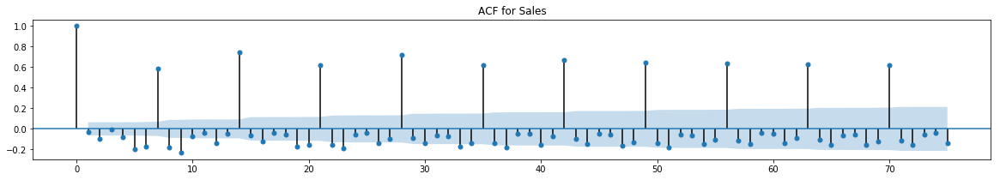

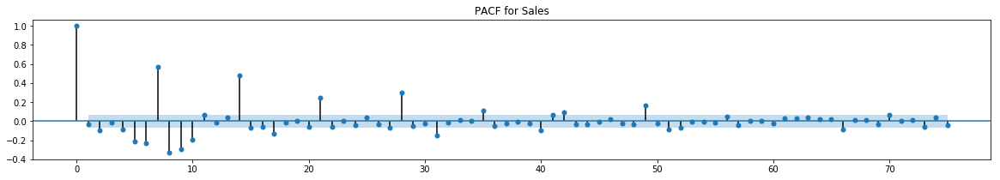

In [219]:
plot_acf_pacf(train_df_all['Sales'],'Sales')

#### From ACF plot , we can find q=0 as we do not have a point after  which autocorrelation dies down.
#### From PACF plot , we can choose p=49,  as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 49 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 7 as p which is the last highest value.

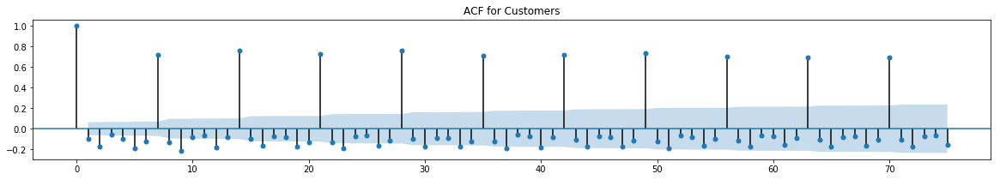

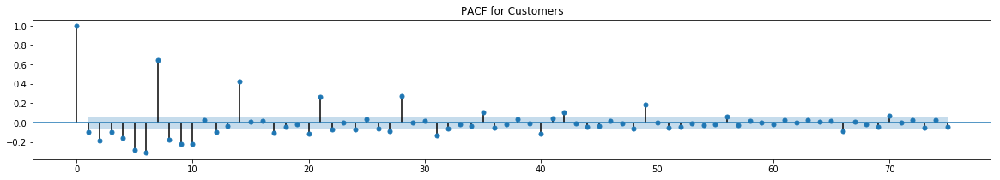

In [220]:
plot_acf_pacf(train_df_all['Customers'],'Customers')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
##### From PACF plot , we can choose p=49, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 49 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 7 as p which is the last highest value.
#### same as Sales. As they are cointegrated p, and q are same.

### Train and Test split

In [221]:
train_df_all.head()

,Sales,Customers,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,
2013-01-01,62.232914,12.804856,0,1112,1,0,0,0,0,0
2013-01-02,6061.072926,720.625342,0,1097,0,1,0,0,0,0
2013-01-03,5586.966516,666.504072,0,1030,0,0,1,0,0,0
2013-01-04,5852.084239,683.781703,0,1029,0,0,0,1,0,0
2013-01-05,5195.525886,594.768392,0,111,0,0,0,0,1,0


In [222]:
train_df_all.tail(43)

,Sales,Customers,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,
2015-06-19,7417.619526,751.145985,1096,0,0,0,0,1,0,0
2015-06-20,5588.291553,605.394187,0,0,0,0,0,0,1,0
2015-06-21,118.713899,18.899819,0,0,0,0,0,0,0,1
2015-06-22,5737.840290,653.467332,0,0,0,0,0,0,0,0
2015-06-23,5534.048913,638.451993,0,0,1,0,0,0,0,0
2015-06-24,5520.582428,636.301630,0,0,0,1,0,0,0,0
2015-06-25,5489.448869,636.906787,0,0,0,0,1,0,0,0
2015-06-26,5849.767906,659.371714,0,0,0,0,0,1,0,0
2015-06-27,5727.396004,602.900999,0,0,0,0,0,0,1,0


In [223]:
train_df_all.shape

(942, 10)

#### As we have to forecast for next 6 weeks daily , which is 42 days, lets keep last 42 records for testing and first 92 records for training

In [224]:
train_len=900
train_df_all_train=train_df_all.iloc[:train_len,:]
train_df_all_test=train_df_all.iloc[train_len:,:]

In [225]:
train_df_all_train.tail()

,Sales,Customers,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,
2015-06-15,9720.559535,880.256534,1033,0,0,0,0,0,0,0
2015-06-16,8318.741876,796.358403,1077,0,1,0,0,0,0,0
2015-06-17,7530.354986,746.876487,1093,0,0,1,0,0,0,0
2015-06-18,7192.139344,726.374317,1098,0,0,0,1,0,0,0
2015-06-19,7417.619526,751.145985,1096,0,0,0,0,1,0,0


In [226]:
train_df_all_train.shape

(900, 10)

In [227]:
train_df_all_test.head()

,Sales,Customers,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,
2015-06-20,5588.291553,605.394187,0,0,0,0,0,0,1,0
2015-06-21,118.713899,18.899819,0,0,0,0,0,0,0,1
2015-06-22,5737.840290,653.467332,0,0,0,0,0,0,0,0
2015-06-23,5534.048913,638.451993,0,0,1,0,0,0,0,0
2015-06-24,5520.582428,636.301630,0,0,0,1,0,0,0,0


In [228]:
train_df_all_test.shape

(42, 10)

#### Standardize Sales	Customers	Promo	SchoolHoliday

In [229]:
scaler = MinMaxScaler()
#For train data
train_df_all_train[['Sales','Customers','Promo','SchoolHoliday']]=scaler.fit_transform(train_df_all_train[['Sales','Customers','Promo','SchoolHoliday']])
train_df_all_train.head()

,Sales,Customers,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,
2013-01-01,0.000000,0.000779,0.0,0.998205,1,0,0,0,0,0
2013-01-02,0.530960,0.615645,0.0,0.984740,0,1,0,0,0,0
2013-01-03,0.488997,0.568631,0.0,0.924596,0,0,1,0,0,0
2013-01-04,0.512463,0.583640,0.0,0.923698,0,0,0,1,0,0
2013-01-05,0.454350,0.506316,0.0,0.099641,0,0,0,0,1,0


In [230]:
#For test data
train_df_all_test[['Sales','Customers','Promo','SchoolHoliday']]=scaler.transform(train_df_all_test[['Sales','Customers','Promo','SchoolHoliday']])
train_df_all_test.head()

,Sales,Customers,Promo,SchoolHoliday,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,
2015-06-20,0.489114,0.515547,0.0,0.0,0,0,0,0,1,0
2015-06-21,0.004999,0.006074,0.0,0.0,0,0,0,0,0,1
2015-06-22,0.502351,0.557306,0.0,0.0,0,0,0,0,0,0
2015-06-23,0.484313,0.544263,0.0,0.0,1,0,0,0,0,0
2015-06-24,0.483121,0.542395,0.0,0.0,0,1,0,0,0,0


## VAR Model

In [231]:
exog = train_df_all_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_all_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.56      -11.46   9.557e-06      -11.52
1       -11.71      -11.59   8.234e-06      -11.66
2       -11.71      -11.57   8.234e-06      -11.65
3       -11.75      -11.59   7.864e-06      -11.69
4       -11.76      -11.58   7.785e-06      -11.69
5       -11.76      -11.56   7.800e-06      -11.68
6       -11.77      -11.54   7.740e-06      -11.68
7       -11.77      -11.53   7.703e-06      -11.68
8       -11.93      -11.66   6.599e-06      -11.83
9       -11.95     -11.66*   6.432e-06      -11.84
10      -11.97      -11.65   6.350e-06      -11.85
11      -11.99      -11.65   6.233e-06      -11.86
12      -11.98      -11.62   6.271e-06      -11.84
13      -11.99      -11.61   6.208e-06      -11.84
14      -12.03      -11.63   5.964e-06      -11.88
15     -12.04*      -11.62  5.909e-06*     -11.88*
-------------------------------

#### In the above output, the AIC drops to lowest at lag 11, then increases at lag 12 and then continuously drops further.Let’s go with the lag 11 model.

In [232]:
var_model_final = var_model.fit(11)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     13:24:10
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.6559
Nobs:                     889.000    HQIC:                  -11.8622
Log likelihood:           2868.65    FPE:                6.20672e-06
AIC:                     -11.9899    Det(Omega_mle):     5.79548e-06
--------------------------------------------------------------------
Results for equation Sales
                  coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------
const                0.473863         0.068970            6.871           0.000
exog0                0.177958         0.019589            9.085           0.000
exog1               -0.053762         0.015023           -3.579 

#### From here we fond the lap(p) as 11. Perform Johansen test with P=11-1

## Cointegration - Johansen Test


In [233]:
train_df_all['Sales']=train_df_all['Sales'].apply(lambda x:round(x))
train_df_all['Customers']=train_df_all['Customers'].apply(lambda x:round(x))

In [234]:
def cointegration_test(df, lag): 
    """Perform Johanson's Cointegration Test and Report Summary"""
    alpha=0.05
    out = coint_johansen(df,-1,lag)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)


In [235]:
cointegration_test(train_df_all[['Sales','Customers']],10)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  79.32     > 12.3212   =>   True
Customers ::  0.83      > 4.1296    =>   False


In [236]:
rank_result=select_coint_rank(train_df_all[['Sales','Customers']],-1,10)

In [237]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
#### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.

#### Before that let's forecast and evaluate VAR model

In [238]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_all_train[['Sales','Customers']].values[-lag_order:]
forecast_input

11


array([[0.52850529, 0.57831362],
       [0.50183655, 0.5555837 ],
       [0.50447556, 0.56619896],
       [0.50952715, 0.56169835],
       [0.5006185 , 0.52048785],
       [0.00391914, 0.0036742 ],
       [0.85486314, 0.75431249],
       [0.73078758, 0.68143232],
       [0.66100708, 0.63844863],
       [0.63107145, 0.62063892],
       [0.65102881, 0.64215744]])

#### At least we nee 11 records for data forecasting. But we have 42 records in our test data. Let's fore cast for 42 records.

In [239]:
exog_test = train_df_all_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_all_test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.526668,0.559050
2015-06-21,0.016443,0.006448
2015-06-22,0.511349,0.568124
2015-06-23,0.508895,0.580523
2015-06-24,0.472050,0.538974
2015-06-25,0.429252,0.496579
2015-06-26,0.529284,0.587486
2015-06-27,0.505936,0.535942
2015-06-28,0.019096,0.009695


#### Here we have not transfermed data to make it stationary. Original data was stationary. So no need of any reverse transforation.

In [240]:
train_df_all_test['VarForecastedSales']=var_forecast.Sales
train_df_all_test['VarForecastedCustomers']=var_forecast.Customers

In [241]:
train_df_all_test[['Sales','VarForecastedSales','Customers','VarForecastedCustomers']].head()

,Sales,VarForecastedSales,Customers,VarForecastedCustomers
Date,,,,
2015-06-20,0.489114,0.526668,0.515547,0.559050
2015-06-21,0.004999,0.016443,0.006074,0.006448
2015-06-22,0.502351,0.511349,0.557306,0.568124
2015-06-23,0.484313,0.508895,0.544263,0.580523
2015-06-24,0.483121,0.472050,0.542395,0.538974


In [242]:
def forecasted_timeseries_visualization(series,forecasted_series,c,model):
    fig = plt.figure(figsize=(20, 3))
    series.plot(label='Actual')
    forecasted_series.plot(label='Forecasted')
    plt.xlabel('Date')
    plt.ylabel(c)
    plt.legend(loc='best')
    plt.title('{} model For {}'.format(model,c))
    plt.show()

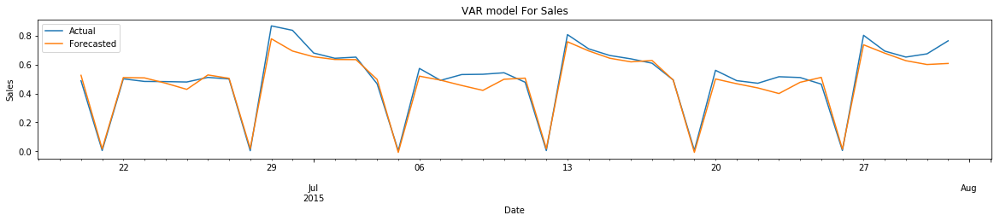

In [243]:
forecasted_timeseries_visualization(train_df_all_test['Sales'],train_df_all_test['VarForecastedSales'],'Sales','VAR')

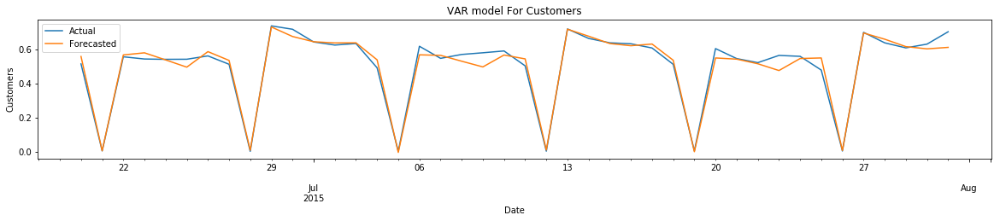

In [244]:
forecasted_timeseries_visualization(train_df_all_test['Customers'],train_df_all_test['VarForecastedCustomers'],'Customers','VAR')

In [245]:
summary_df=pd.DataFrame(columns=['Store','Model','RMSE_SALES','MAPE_SALES','RMSE_CUSTOMERS','MAPE_CUSTOMERS'])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS


In [246]:
def summary(s,fs,c,fc,store,model):
    rmse_sales = np.sqrt(mean_squared_error(s, fs)).round(2)
    mape_sales = np.round(np.mean(np.abs(s-fs)/s)*100,2)
    rmse_customers = np.sqrt(mean_squared_error(c, fc)).round(2)
    mape_customers = np.round(np.mean(np.abs(c-fc)/c)*100,2)
    temp=pd.DataFrame({'Store':[store],'Model':[model], 'RMSE_SALES': [rmse_sales],'MAPE_SALES': [mape_sales] , 
                            'RMSE_CUSTOMERS': [rmse_customers],'MAPE_CUSTOMERS': [mape_customers]})
    return temp

In [247]:
d=summary(train_df_all_test['Sales'], train_df_all_test['VarForecastedSales'],
       train_df_all_test['Customers'], train_df_all_test['VarForecastedCustomers'],'All','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99


## VARMAX

#### From above PACF and ACF plot we found, p=7 and q=0.

In [248]:
%%time
exog = train_df_all_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_all_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                2643.337
                              + intercept   AIC                          -5188.673
Date:                    Mon, 05 Apr 2021   BIC                          -4953.356
Time:                            13:26:51   HQIC                         -5098.780
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              125.40, 189.89   Jarque-Bera (JB):      3613.36, 400.35
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.45, 1.41   Skew:                     -1.77, -0.54
P

In [249]:
exog_test = train_df_all_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_all_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_all_test.index.min(),end=train_df_all_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_all_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.526293,0.556979
2015-06-21,0.021344,0.006361
2015-06-22,0.554265,0.578713
2015-06-23,0.467023,0.514317
2015-06-24,0.469923,0.526313


In [250]:
train_df_all_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_all_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

In [251]:
train_df_all_test[['Sales','VarForecastedSales','VarmaxForecastedSales','Customers','VarForecastedCustomers','VarmaxForecastedCustomers']].head()

,Sales,VarForecastedSales,VarmaxForecastedSales,Customers,VarForecastedCustomers,VarmaxForecastedCustomers
Date,,,,,,
2015-06-20,0.489114,0.526668,0.526293,0.515547,0.559050,0.556979
2015-06-21,0.004999,0.016443,0.021344,0.006074,0.006448,0.006361
2015-06-22,0.502351,0.511349,0.554265,0.557306,0.568124,0.578713
2015-06-23,0.484313,0.508895,0.467023,0.544263,0.580523,0.514317
2015-06-24,0.483121,0.472050,0.469923,0.542395,0.538974,0.526313


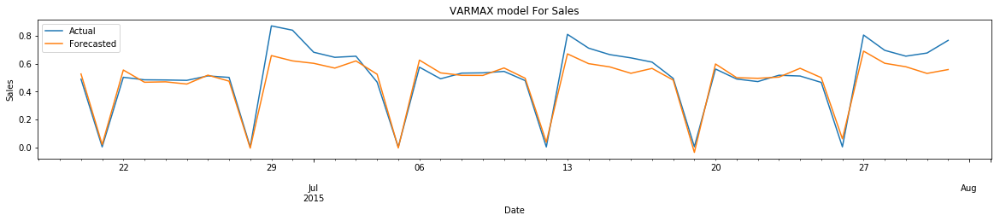

In [252]:
forecasted_timeseries_visualization(train_df_all_test['Sales'],train_df_all_test['VarmaxForecastedSales'],'Sales','VARMAX')

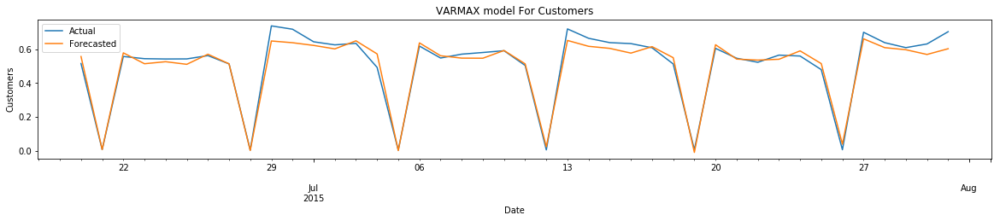

In [253]:
forecasted_timeseries_visualization(train_df_all_test['Customers'],train_df_all_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [254]:
d=summary(train_df_all_test['Sales'], train_df_all_test['VarmaxForecastedSales'],
       train_df_all_test['Customers'], train_df_all_test['VarmaxForecastedCustomers'],'All','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head()

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07


## ARIMA

#### p=7,q=0,d=0(original series is stationary)

In [255]:
%%time

#Without exogenous and for sale
exog = train_df_all_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_all_train[['Sales']].astype(float)
arima_model = ARIMA(endog, order=(7,0,0))
arima_model_fit = arima_model.fit()
print(arima_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 210.963
Method:                       css-mle   S.D. of innovations              0.191
Date:                Mon, 05 Apr 2021   AIC                           -403.926
Time:                        13:27:28   BIC                           -360.704
Sample:                    01-01-2013   HQIC                          -387.415
                         - 06-19-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.4875      0.008     62.147      0.000       0.472       0.503
ar.L1.Sales     0.0175      0.028      0.636      0.525      -0.036       0.071
ar.L2.Sales    -0.0055      0.027     -0.204    

In [256]:
arima_sales = arima_model_fit.predict(start=train_df_all_test.index.min(),end=train_df_all_test.index.max())
arima_forecast = pd.DataFrame(arima_sales, index=train_df_all_test.index, columns=['Sales'])
arima_forecast.head()

,Sales
Date,
2015-06-20,0.504009
2015-06-21,0.102025
2015-06-22,0.612494
2015-06-23,0.564437
2015-06-24,0.528968


In [257]:
train_df_all_test['ArimaForecastedSales']=arima_forecast.Sales

In [258]:
endog = train_df_all_train[['Customers']].astype(float)
arima_model = ARIMA(endog, order=(7,0,0))
arima_model_fit = arima_model.fit()
print(arima_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 350.648
Method:                       css-mle   S.D. of innovations              0.163
Date:                Mon, 05 Apr 2021   AIC                           -683.296
Time:                        13:27:53   BIC                           -640.074
Sample:                    01-01-2013   HQIC                          -666.785
                         - 06-19-2015                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.5135      0.005     93.540      0.000       0.503       0.524
ar.L1.Customers    -0.0849      0.026     -3.318      0.001      -0.135      -0.035
ar.L2.Customers    -0.1017      

In [259]:
arima_customers = arima_model_fit.predict(start=train_df_all_test.index.min(),end=train_df_all_test.index.max())
arima_forecast = pd.DataFrame(arima_customers, index=train_df_all_test.index, columns=['Customers'])
arima_forecast.head()

,Customers
Date,
2015-06-20,0.502133
2015-06-21,0.098283
2015-06-22,0.645423
2015-06-23,0.606323
2015-06-24,0.566906


In [260]:
train_df_all_test['ArimaForecastedCustomers']=arima_forecast.Customers

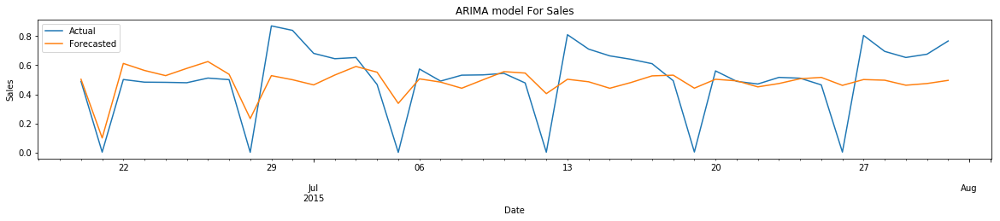

In [261]:
forecasted_timeseries_visualization(train_df_all_test['Sales'],train_df_all_test['ArimaForecastedSales'],'Sales','ARIMA')

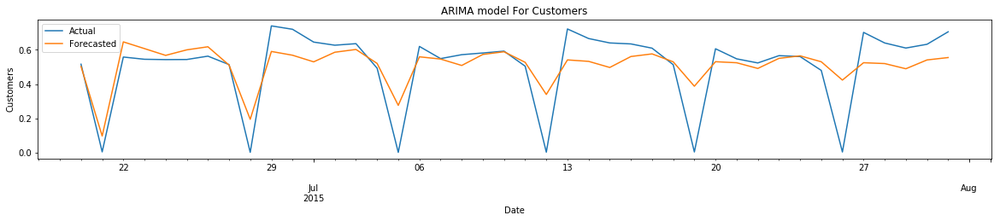

In [262]:
forecasted_timeseries_visualization(train_df_all_test['Customers'],train_df_all_test['ArimaForecastedCustomers'],'Customers','ARIMA')

In [263]:
d=summary(train_df_all_test['Sales'], train_df_all_test['ArimaForecastedSales'],
       train_df_all_test['Customers'], train_df_all_test['ArimaForecastedCustomers'],'All','ARIMA')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07


## ARIMAX

In [264]:
%%time

#With exogenous and for sale
exog = train_df_all_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_all_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 679.611
Method:                       css-mle   S.D. of innovations              0.114
Date:                Mon, 05 Apr 2021   AIC                          -1325.222
Time:                        13:29:47   BIC                          -1243.582
Sample:                    01-01-2013   HQIC                         -1294.035
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.5603      0.012     47.211      0.000       0.537       0.584
Promo             0.1975      0.009     22.053      0.000       0.180       0.215
SchoolHoliday    -0.0330      0.017     

In [265]:
exog_test = train_df_all_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_all_test.index.min(),end=train_df_all_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_all_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
Date,
2015-06-20,0.505358
2015-06-21,0.012416
2015-06-22,0.561040
2015-06-23,0.504880
2015-06-24,0.465101


In [266]:
train_df_all_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [267]:
exog = train_df_all_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_all_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 712.363
Method:                       css-mle   S.D. of innovations              0.110
Date:                Mon, 05 Apr 2021   AIC                          -1390.726
Time:                        13:30:38   BIC                          -1309.086
Sample:                    01-01-2013   HQIC                         -1359.539
                         - 06-19-2015                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.6075      0.011     53.854      0.000       0.585       0.630
Promo               0.1167      0.008     15.089      0.000       0.102       0.132
SchoolHoliday      -0.0479      

In [268]:
arimax_customers = arimax_model_fit.predict(start=train_df_all_test.index.min(),end=train_df_all_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_all_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
Date,
2015-06-20,0.543267
2015-06-21,0.010720
2015-06-22,0.607204
2015-06-23,0.575085
2015-06-24,0.540528


In [269]:
train_df_all_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

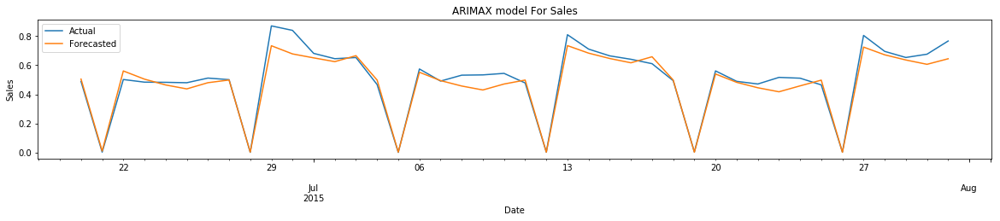

In [270]:
forecasted_timeseries_visualization(train_df_all_test['Sales'],train_df_all_test['ArimaxForecastedSales'],'Sales','ARIMAX')

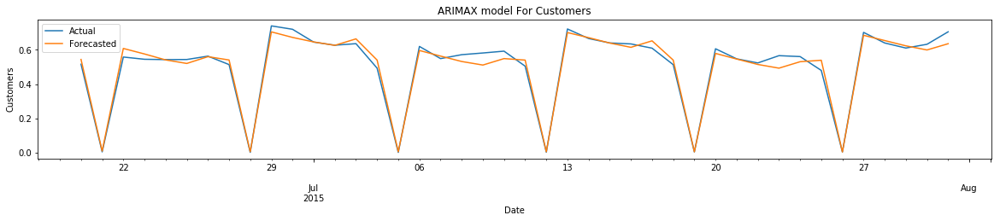

In [271]:
forecasted_timeseries_visualization(train_df_all_test['Customers'],train_df_all_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [272]:
d=summary(train_df_all_test['Sales'], train_df_all_test['ArimaxForecastedSales'],
       train_df_all_test['Customers'], train_df_all_test['ArimaxForecastedCustomes'],'All','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38


## SARIMA

In [273]:
%%time

#Without exogenous and for sale
exog = train_df_all_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_all_train[['Sales']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())


                                 Statespace Model Results                                 
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 631.692
Date:                            Mon, 05 Apr 2021   AIC                          -1217.384
Time:                                    13:36:06   BIC                          -1106.929
Sample:                                01-01-2013   HQIC                         -1175.189
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1971      0.010     19.184      0.000       0.177       0.217
SchoolHoliday    -0.0572  

In [274]:
sarimax_sales = sarima_model_fit.predict(start=train_df_all_test.index.min(),end=train_df_all_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_sales, index=train_df_all_test.index, columns=['Sales'])
sarimax_forecast.head()

,Sales
Date,
2015-06-20,0.498378
2015-06-21,0.012855
2015-06-22,0.570078
2015-06-23,0.494669
2015-06-24,0.455663


In [275]:
train_df_all_test['SarimaxForecastedSales']=sarimax_forecast.Sales

In [276]:
%%time

#Without exogenous and for sale
exog = train_df_all_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_all_train[['Customers']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                          Customers   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 644.929
Date:                            Mon, 05 Apr 2021   AIC                          -1243.857
Time:                                    13:41:46   BIC                          -1133.402
Sample:                                01-01-2013   HQIC                         -1201.662
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1209      0.009     12.941      0.000       0.103       0.139
SchoolHoliday    -0.0463  

In [277]:
sarimax_customers = sarima_model_fit.predict(start=train_df_all_test.index.min(),end=train_df_all_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_customers, index=train_df_all_test.index, columns=['Customers'])
sarimax_forecast.head()

,Customers
Date,
2015-06-20,0.541268
2015-06-21,0.013919
2015-06-22,0.599720
2015-06-23,0.558444
2015-06-24,0.531384


In [278]:
train_df_all_test['SarimaxForecastedCustomers']=sarimax_forecast.Customers

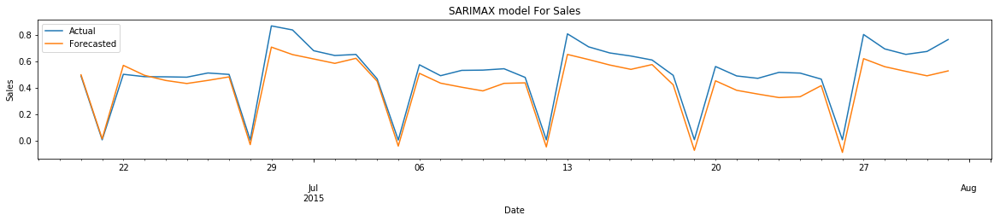

In [279]:
forecasted_timeseries_visualization(train_df_all_test['Sales'],train_df_all_test['SarimaxForecastedSales'],'Sales','SARIMAX')

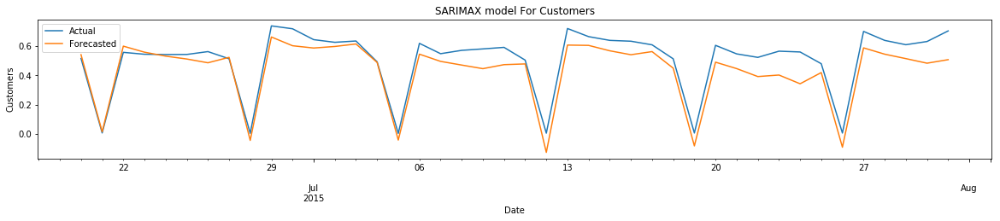

In [280]:
forecasted_timeseries_visualization(train_df_all_test['Customers'],train_df_all_test['SarimaxForecastedCustomers'],'Customers','SARIMAX')

In [281]:
d=summary(train_df_all_test['Sales'], train_df_all_test['SarimaxForecastedSales'],
       train_df_all_test['Customers'], train_df_all_test['SarimaxForecastedCustomers'],'All','SARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47


# TimeSeries analysis for key stores  1,3,8,9,13,25,29,31 and 46.

#### Take the data for which the sales and customers present

In [282]:
train_df_1=train_df.loc[train_df.Store==1,:]

In [283]:
train_df_1.head(7)

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,1,0,0,0,1,1270.0,1584,1,0,0,0,0,0
2013-01-02,1,5530,668,0,1,1270.0,1585,0,1,0,0,0,0
2013-01-03,1,4327,578,0,1,1270.0,1586,0,0,1,0,0,0
2013-01-04,1,4486,619,0,1,1270.0,1587,0,0,0,1,0,0
2013-01-05,1,4997,635,0,1,1270.0,1588,0,0,0,0,1,0
2013-01-06,1,0,0,0,1,1270.0,1589,0,0,0,0,0,1
2013-01-07,1,7176,785,1,1,1270.0,1590,0,0,0,0,0,0


In [284]:
train_df_1.tail(7)

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2015-07-25,1,4364,500,0,0,1270.0,2519,0,0,0,0,1,0
2015-07-26,1,0,0,0,0,1270.0,2520,0,0,0,0,0,1
2015-07-27,1,6102,612,1,1,1270.0,2521,0,0,0,0,0,0
2015-07-28,1,5011,560,1,1,1270.0,2522,1,0,0,0,0,0
2015-07-29,1,4782,523,1,1,1270.0,2523,0,1,0,0,0,0
2015-07-30,1,5020,546,1,1,1270.0,2524,0,0,1,0,0,0
2015-07-31,1,5263,555,1,1,1270.0,2525,0,0,0,1,0,0


### Time Series Visualizatin

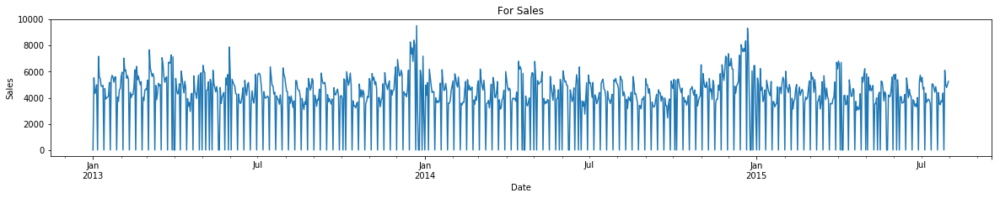

In [285]:
timeseries_visualization(train_df_1['Sales'],'Sales')

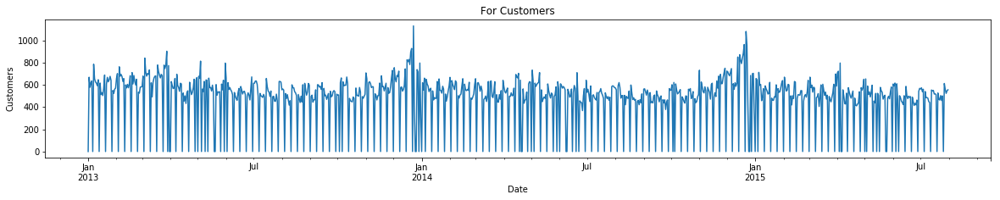

In [286]:
timeseries_visualization(train_df_1['Customers'],'Customers')

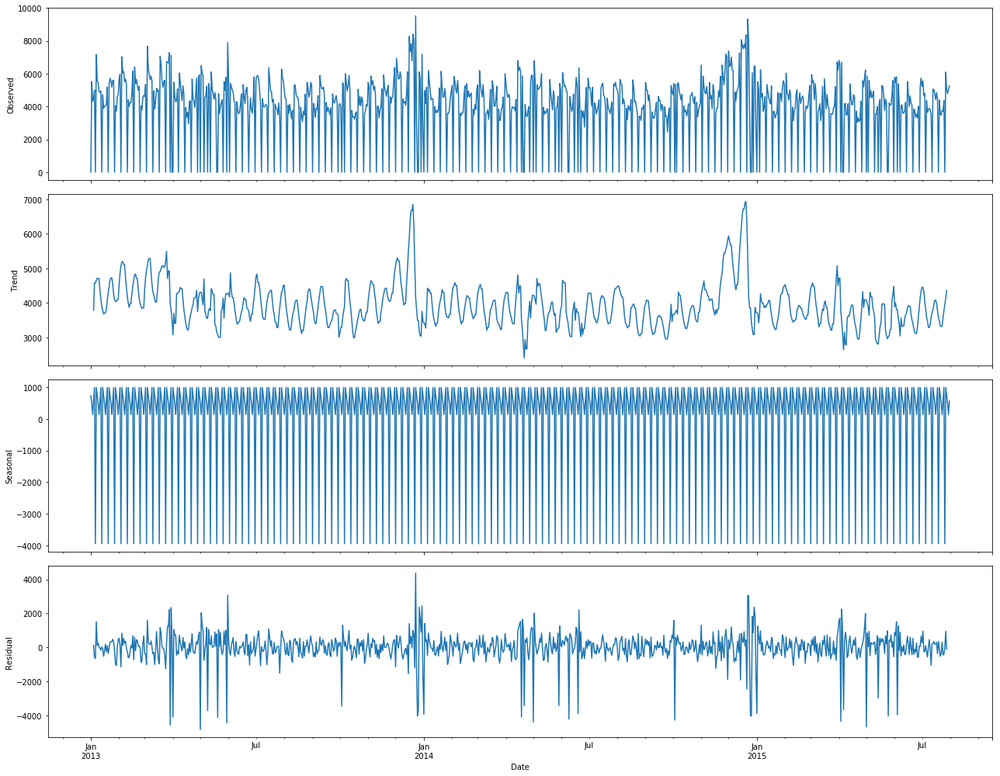

Mean Residual for Sales=0.2284083648050237


In [287]:
plot_seasonal_decomposition(train_df_1['Sales'],'Sales','additive')

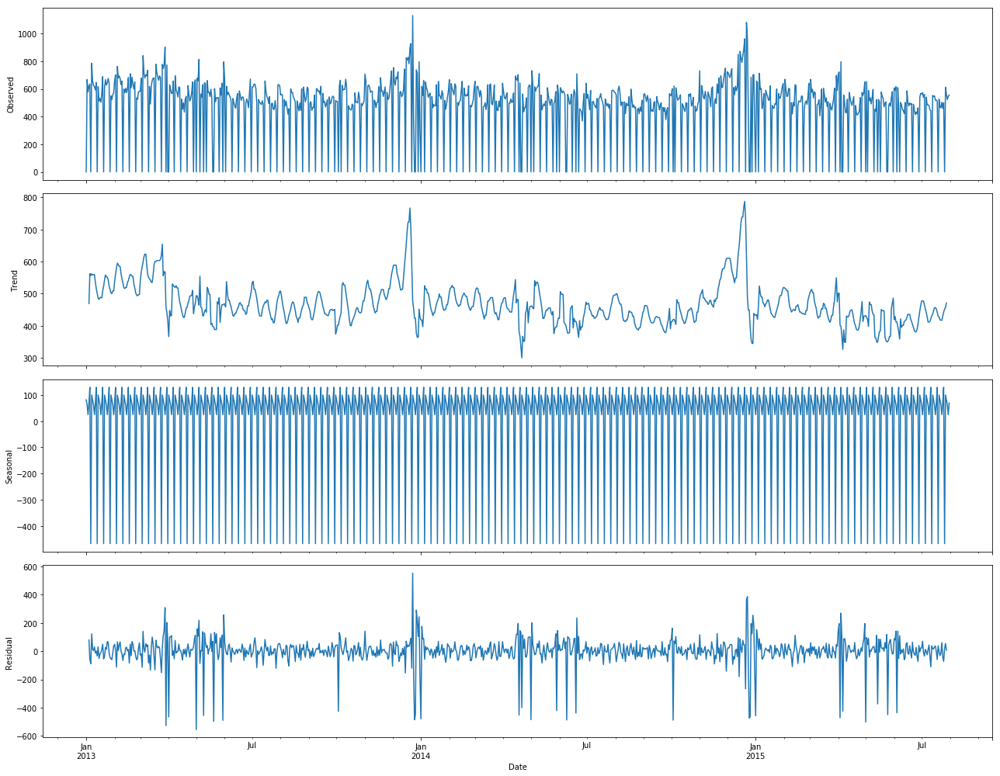

Mean Residual for Customers=0.05374119123580648


In [288]:
plot_seasonal_decomposition(train_df_1['Customers'],'Customers','additive')

In [289]:
train_df_1[['Sales','Customers']].corr()

,Sales,Customers
Sales,1.000000,0.984341
Customers,0.984341,1.000000


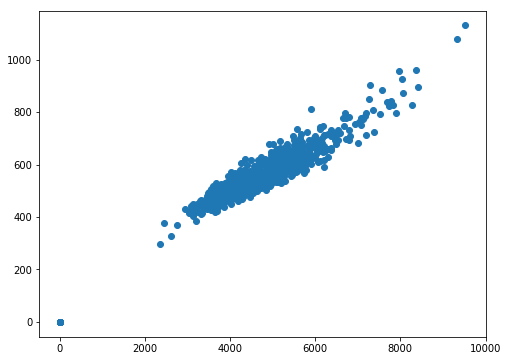

In [290]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_1['Sales'],train_df_1['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.

### Causality testing

In [291]:
causality_sales=grangercausalitytests(train_df_1[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=114.7766, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=115.1437, p=0.0000  , df=1
likelihood ratio test: chi2=108.6256, p=0.0000  , df=1
parameter F test:         F=114.7766, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=59.1838 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=119.0005, p=0.0000  , df=2
likelihood ratio test: chi2=112.0489, p=0.0000  , df=2
parameter F test:         F=59.1838 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=38.8194 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=117.3328, p=0.0000  , df=3
likelihood ratio test: chi2=110.5608, p=0.0000  , df=3
parameter F test:         F=38.8194 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=30.0043 , p=0.0000  

In [292]:
causality_customers=grangercausalitytests(train_df_1[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=46.8552 , p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=47.0051 , p=0.0000  , df=1
likelihood ratio test: chi2=45.8688 , p=0.0000  , df=1
parameter F test:         F=46.8552 , p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=22.4182 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=45.0761 , p=0.0000  , df=2
likelihood ratio test: chi2=44.0287 , p=0.0000  , df=2
parameter F test:         F=22.4182 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=16.0372 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=48.4730 , p=0.0000  , df=3
likelihood ratio test: chi2=47.2634 , p=0.0000  , df=3
parameter F test:         F=16.0372 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=12.4879 , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.
### Testing for stationary


In [293]:
stationary_test(train_df_1[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -4.368104368168496
P value= 0.00033788346141424734
 => P-Value = 0.0003. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -3.696842111734527
P value= 0.004157792561711229
 => P-Value = 0.0042. Rejecting Null Hypothesis.
 => Series is Stationary.


##### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
##### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).
##### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.
### Autocoorelation and degree of integration

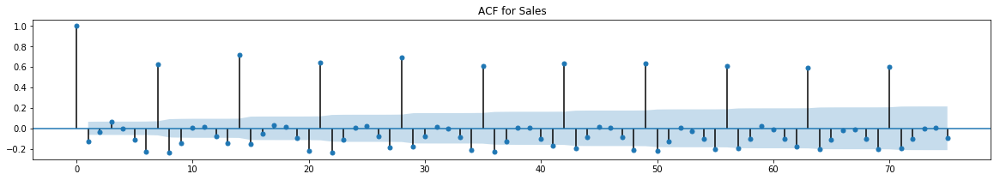

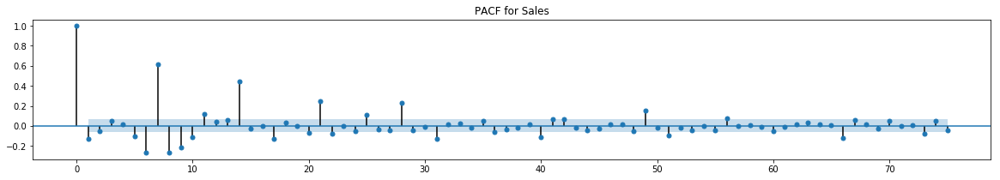

In [294]:
plot_acf_pacf(train_df_1['Sales'],'Sales')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=49, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 49 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 7 as p which is the last highest value.

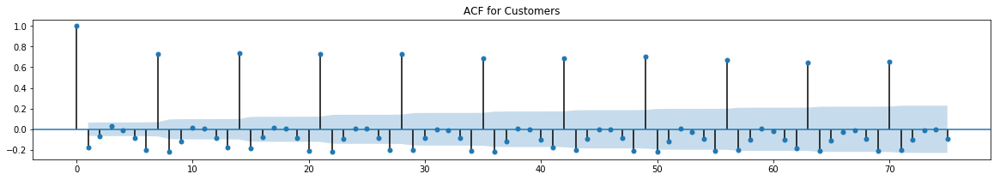

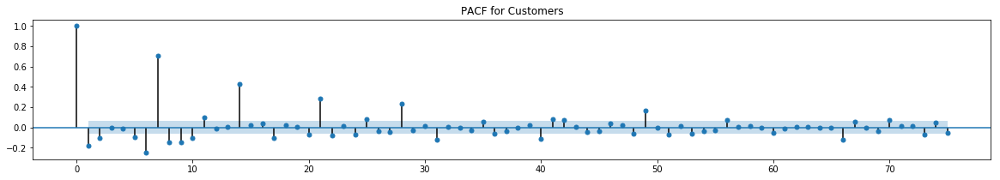

In [295]:
plot_acf_pacf(train_df_1['Customers'],'Customers')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=49, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 49 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 7 as p which is the last highest value.
#### same as Sales. As they are cointegrated p, and q are same.

### Train and Test split

In [296]:
train_df_1.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,1,0,0,0,1,1270.0,1584,1,0,0,0,0,0
2013-01-02,1,5530,668,0,1,1270.0,1585,0,1,0,0,0,0
2013-01-03,1,4327,578,0,1,1270.0,1586,0,0,1,0,0,0
2013-01-04,1,4486,619,0,1,1270.0,1587,0,0,0,1,0,0
2013-01-05,1,4997,635,0,1,1270.0,1588,0,0,0,0,1,0


In [297]:
train_df_1.tail()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2015-07-27,1,6102,612,1,1,1270.0,2521,0,0,0,0,0,0
2015-07-28,1,5011,560,1,1,1270.0,2522,1,0,0,0,0,0
2015-07-29,1,4782,523,1,1,1270.0,2523,0,1,0,0,0,0
2015-07-30,1,5020,546,1,1,1270.0,2524,0,0,1,0,0,0
2015-07-31,1,5263,555,1,1,1270.0,2525,0,0,0,1,0,0


In [298]:
train_df_1.shape

(942, 13)

#### As we have to  forecast for next 6 weeks daily , which is 42 days, lets keep last 42 records for testing and first 900 records for training

In [299]:
train_len = 900
train_df_1_train=train_df_1.iloc[:train_len,:]
train_df_1_test=train_df_1.iloc[train_len:,:]

In [300]:
train_df_1_train.tail(2)

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2015-06-18,1,4645,498,1,0,1270.0,2482,0,0,1,0,0,0
2015-06-19,1,4202,487,1,0,1270.0,2483,0,0,0,1,0,0


In [301]:
train_df_1_test.head(2)

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2015-06-20,1,4097,494,0,0,1270.0,2484,0,0,0,0,1,0
2015-06-21,1,0,0,0,0,1270.0,2485,0,0,0,0,0,1


#### Standardize Sales Customers

In [302]:
train_df_1_train[['Sales','Customers']]=scaler.fit_transform(train_df_1_train[['Sales','Customers']])
train_df_1_train.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,1,0.000000,0.000000,0,1,1270.0,1584,1,0,0,0,0,0
2013-01-02,1,0.580395,0.591150,0,1,1270.0,1585,0,1,0,0,0,0
2013-01-03,1,0.454135,0.511504,0,1,1270.0,1586,0,0,1,0,0,0
2013-01-04,1,0.470823,0.547788,0,1,1270.0,1587,0,0,0,1,0,0
2013-01-05,1,0.524454,0.561947,0,1,1270.0,1588,0,0,0,0,1,0


In [303]:
#For test data
train_df_1_test[['Sales','Customers']]=scaler.transform(train_df_1_test[['Sales','Customers']])
train_df_1_test.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2015-06-20,1,0.429996,0.437168,0,0,1270.0,2484,0,0,0,0,1,0
2015-06-21,1,0.000000,0.000000,0,0,1270.0,2485,0,0,0,0,0,1
2015-06-22,1,0.403652,0.432743,0,0,1270.0,2486,0,0,0,0,0,0
2015-06-23,1,0.394836,0.395575,0,0,1270.0,2487,1,0,0,0,0,0
2015-06-24,1,0.351175,0.366372,0,0,1270.0,2488,0,1,0,0,0,0


#### We have seen, when compititor opens up and the distance is less , then only it impacts the sales for very few days.  If it is far then there is no impact. As CompetitionDistance is constant for store. We can ignore it and CompetitionOpenSinceDays from exogenous variable. We can consider ignore as CompetitionOpenSinceDays 

### VAR Model

In [304]:
exog = train_df_1_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_1_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.69      -11.59   8.362e-06      -11.65
1       -11.76     -11.64*   7.841e-06      -11.71
2       -11.76      -11.62   7.781e-06      -11.71
3       -11.77      -11.61   7.701e-06      -11.71
4       -11.77      -11.59   7.719e-06      -11.70
5       -11.78      -11.57   7.673e-06      -11.70
6       -11.79      -11.56   7.580e-06      -11.70
7       -11.80      -11.55   7.484e-06      -11.71
8       -11.81      -11.54   7.464e-06      -11.70
9       -11.81      -11.52   7.440e-06      -11.70
10      -11.84      -11.52   7.235e-06     -11.72*
11     -11.84*      -11.50  7.232e-06*      -11.71
12      -11.83      -11.48   7.260e-06      -11.70
13      -11.84      -11.46   7.241e-06      -11.69
14      -11.83      -11.43   7.257e-06      -11.68
15      -11.83      -11.41   7.273e-06      -11.67
-------------------------------

#### In the above output, the AIC drops to lowest at lag 8, then same at lag 9,decrease at lag 10 and then continuously drops further.Let’s go with the lag 8 model.¶

In [305]:
var_model_final = var_model.fit(8)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     13:45:05
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.5434
Nobs:                     892.000    HQIC:                  -11.7094
Log likelihood:           2786.78    FPE:                7.41494e-06
AIC:                     -11.8120    Det(Omega_mle):     7.01615e-06
--------------------------------------------------------------------
Results for equation Sales
                  coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------
const                0.237337         0.036520            6.499           0.000
exog0                0.141430         0.014399            9.822           0.000
exog1               -0.018132         0.009209           -1.969 

#### From here we fond the lap(p) as 10. Perform Johansen test with P=10-1

In [306]:
train_df_1['Sales']=train_df_1['Sales'].apply(lambda x:round(x))
train_df_1['Customers']=train_df_1['Customers'].apply(lambda x:round(x))

In [307]:
cointegration_test(train_df_1[['Sales','Customers']],7)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  165.54    > 12.3212   =>   True
Customers ::  0.93      > 4.1296    =>   False


In [308]:
rank_result=select_coint_rank(train_df_1[['Sales','Customers']],-1,9)

In [309]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
#### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.
#### Before that let's forecast and evaluate VAR model¶

In [310]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_1_train[['Sales','Customers']].values[-lag_order:]
forecast_input

8


array([[0.38780437, 0.37345133],
       [0.44668346, 0.44424779],
       [0.        , 0.        ],
       [0.57913518, 0.51858407],
       [0.50923594, 0.44513274],
       [0.41981528, 0.42123894],
       [0.4875105 , 0.44070796],
       [0.44101595, 0.43097345]])

In [311]:
exog_test = train_df_1_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_1_test.index, columns=['Sales','Customers'])
var_forecast

,Sales,Customers
Date,,
2015-06-20,0.496366,0.498933
2015-06-21,-0.009721,-0.013503
2015-06-22,0.403207,0.415869
2015-06-23,0.409562,0.431309
2015-06-24,0.366617,0.399130
2015-06-25,0.325371,0.366212
2015-06-26,0.393838,0.424589
2015-06-27,0.501973,0.516990
2015-06-28,-0.003186,-0.002936


In [312]:
train_df_1_test['VarForecastedSales']=var_forecast.Sales
train_df_1_test['VarForecastedCustomers']=var_forecast.Customers

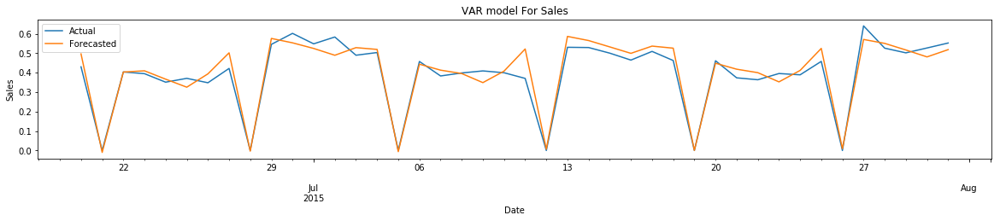

In [313]:
forecasted_timeseries_visualization(train_df_1_test['Sales'],train_df_1_test['VarForecastedSales'],'Sales','VAR')

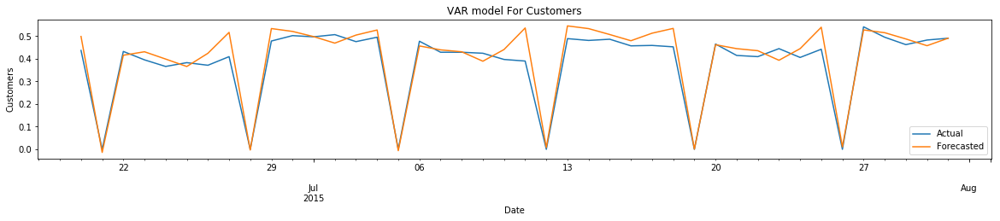

In [314]:
forecasted_timeseries_visualization(train_df_1_test['Customers'],train_df_1_test['VarForecastedCustomers'],'Customers','VAR')

In [315]:
train_df_1_test_temp=train_df_1_test.loc[(train_df_1_test.Sales!=0) & (train_df_1_test.Customers!=0),:]

In [316]:
d=summary(train_df_1_test_temp['Sales'], train_df_1_test_temp['VarForecastedSales'],
       train_df_1_test_temp['Customers'], train_df_1_test_temp['VarForecastedCustomers'],'Store-1','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78


## VARMAX

#### From above PACF and ACF plot we found, p=7 and q=0.

In [317]:
%%time
exog = train_df_1_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_1_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                2690.938
                              + intercept   AIC                          -5283.875
Date:                    Mon, 05 Apr 2021   BIC                          -5048.558
Time:                            13:47:18   HQIC                         -5193.982
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                71.45, 67.60   Jarque-Bera (JB):       2929.25, 59.65
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.27, 1.01   Skew:                     -1.71, -0.25
P

In [318]:
exog_test = train_df_1_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_1_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_1_test.index.min(),end=train_df_1_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_1_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.518570,0.515252
2015-06-21,-0.014725,-0.016838
2015-06-22,0.457296,0.447799
2015-06-23,0.417351,0.431144
2015-06-24,0.391117,0.408165


In [319]:
train_df_1_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_1_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

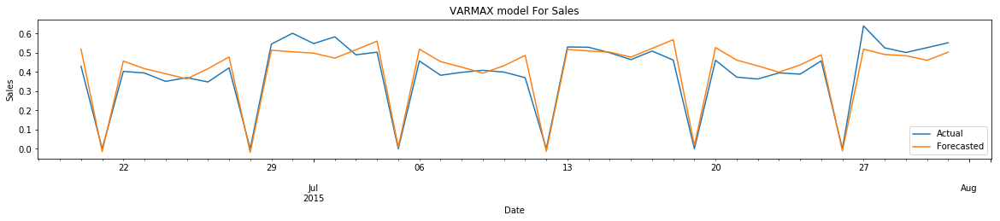

In [320]:
forecasted_timeseries_visualization(train_df_1_test['Sales'],train_df_1_test['VarmaxForecastedSales'],'Sales','VARMAX')

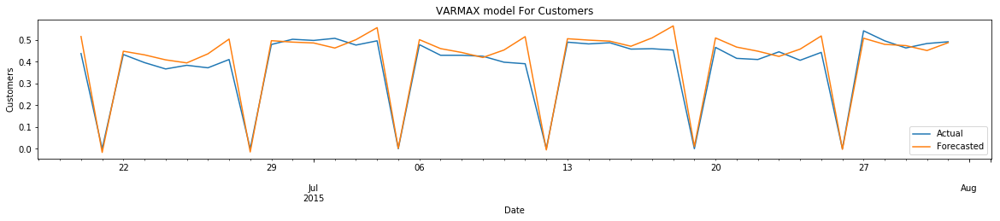

In [321]:
forecasted_timeseries_visualization(train_df_1_test['Customers'],train_df_1_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [322]:
train_df_1_test_temp=train_df_1_test.loc[(train_df_1_test.Sales!=0) & (train_df_1_test.Customers!=0),:]
d=summary(train_df_1_test_temp['Sales'], train_df_1_test_temp['VarmaxForecastedSales'],
       train_df_1_test_temp['Customers'], train_df_1_test_temp['VarmaxForecastedCustomers'],'Store-1','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(10)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71


## ARIMA

In [323]:
%%time

#With exogenous and for sale
exog = train_df_1_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_1_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 733.618
Method:                       css-mle   S.D. of innovations              0.107
Date:                Mon, 05 Apr 2021   AIC                          -1433.236
Time:                        13:48:11   BIC                          -1351.595
Sample:                    01-01-2013   HQIC                         -1402.048
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.4491      0.013     35.267      0.000       0.424       0.474
Promo             0.1399      0.007     18.940      0.000       0.125       0.154
SchoolHoliday    -0.0213      0.012     

In [324]:
exog_test = train_df_1_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_1_test.index.min(),end=train_df_1_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_1_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
Date,
2015-06-20,0.492650
2015-06-21,-0.009125
2015-06-22,0.417065
2015-06-23,0.396533
2015-06-24,0.370145


In [325]:
train_df_1_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [326]:
exog = train_df_1_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_1_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 785.067
Method:                       css-mle   S.D. of innovations              0.101
Date:                Mon, 05 Apr 2021   AIC                          -1536.133
Time:                        13:48:21   BIC                          -1454.492
Sample:                    01-01-2013   HQIC                         -1504.946
                         - 06-19-2015                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.4656      0.012     38.125      0.000       0.442       0.490
Promo               0.0812      0.007     12.067      0.000       0.068       0.094
SchoolHoliday      -0.0262      

In [327]:
arimax_customers = arimax_model_fit.predict(start=train_df_1_test.index.min(),end=train_df_1_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_1_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
Date,
2015-06-20,0.505507
2015-06-21,-0.015120
2015-06-22,0.432524
2015-06-23,0.416361
2015-06-24,0.403274


In [328]:
train_df_1_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

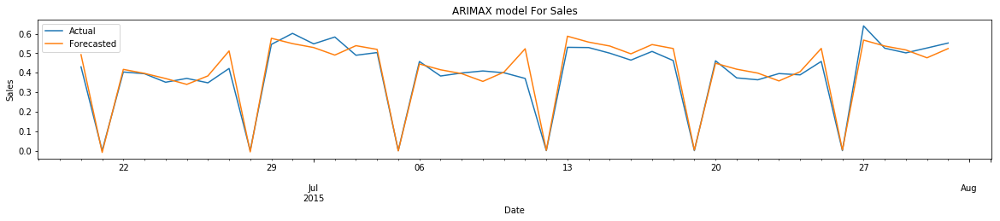

In [329]:
forecasted_timeseries_visualization(train_df_1_test['Sales'],train_df_1_test['ArimaxForecastedSales'],'Sales','ARIMAX')

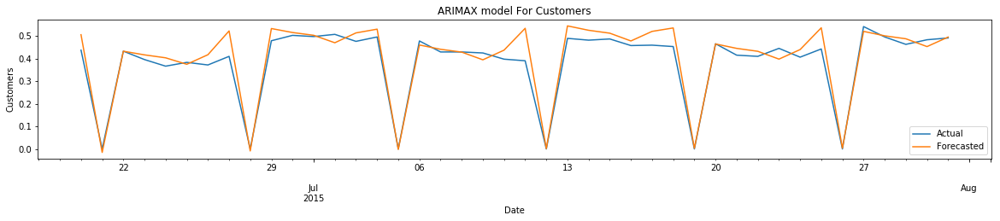

In [330]:
forecasted_timeseries_visualization(train_df_1_test['Customers'],train_df_1_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [331]:
train_df_1_test_temp=train_df_1_test.loc[(train_df_1_test.Sales!=0) & (train_df_1_test.Customers!=0),:]
d=summary(train_df_1_test_temp['Sales'], train_df_1_test_temp['ArimaxForecastedSales'],
       train_df_1_test_temp['Customers'], train_df_1_test_temp['ArimaxForecastedCustomes'],'Store-1','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40


## SARIMA

In [332]:
%%time

#Without exogenous and for sale
exog = train_df_1_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_1_train[['Sales']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 706.608
Date:                            Mon, 05 Apr 2021   AIC                          -1367.215
Time:                                    13:54:00   BIC                          -1256.760
Sample:                                01-01-2013   HQIC                         -1325.021
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1410      0.009     16.542      0.000       0.124       0.158
SchoolHoliday    -0.0310  

In [333]:
sarimax_sales = sarima_model_fit.predict(start=train_df_1_test.index.min(),end=train_df_1_test.index.max(),exog=exog_test,freq='D')
sarimax_forecast = pd.DataFrame(sarimax_sales, index=train_df_1_test.index, columns=['Sales'])
# sarimax_forecast.head()

In [334]:
sarimax_forecast.head()

,Sales
Date,
2015-06-20,0.454056
2015-06-21,-0.051081
2015-06-22,0.367243
2015-06-23,0.338774
2015-06-24,0.314890


In [335]:

train_df_1_test['SarimaxForecastedSales']=sarimax_forecast.Sales

In [336]:
%%time

#Without exogenous and for sale
exog = train_df_1_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_1_train[['Customers']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())


                                 Statespace Model Results                                 
Dep. Variable:                          Customers   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 755.888
Date:                            Mon, 05 Apr 2021   AIC                          -1465.775
Time:                                    13:59:06   BIC                          -1355.320
Sample:                                01-01-2013   HQIC                         -1423.581
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.0800      0.008      9.948      0.000       0.064       0.096
SchoolHoliday    -0.0337  

In [337]:
sarimax_customers = sarima_model_fit.predict(start=train_df_1_test.index.min(),end=train_df_1_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_customers, index=train_df_1_test.index, columns=['Customers'])
sarimax_forecast.head()

,Customers
Date,
2015-06-20,0.466748
2015-06-21,-0.056631
2015-06-22,0.390835
2015-06-23,0.361859
2015-06-24,0.360683


In [338]:

train_df_1_test['SarimaxForecastedCustomers']=sarimax_forecast.Customers

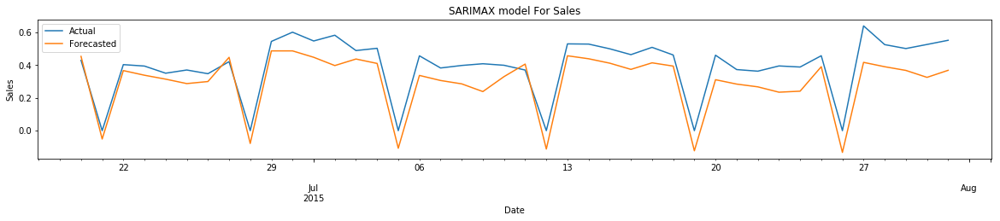

In [339]:
forecasted_timeseries_visualization(train_df_1_test['Sales'],train_df_1_test['SarimaxForecastedSales'],'Sales','SARIMAX')

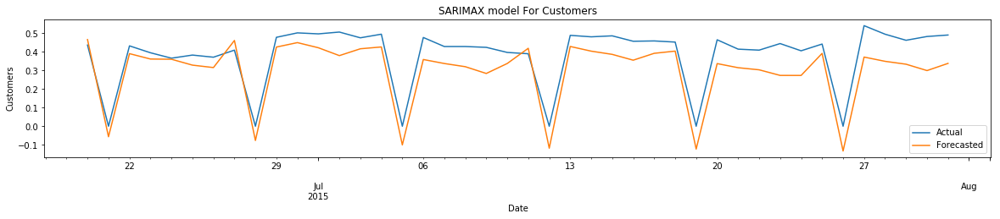

In [340]:
forecasted_timeseries_visualization(train_df_1_test['Customers'],train_df_1_test['SarimaxForecastedCustomers'],'Customers','SARIMAX')

In [341]:
train_df_1_test_temp=train_df_1_test.loc[(train_df_1_test.Sales!=0) & (train_df_1_test.Customers!=0),:]
d=summary(train_df_1_test_temp['Sales'], train_df_1_test_temp['SarimaxForecastedSales'],
       train_df_1_test_temp['Customers'], train_df_1_test_temp['SarimaxForecastedCustomers'],'Store-1','SARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36


#### With m=365 for daily in seasonal_order, out of memory error is coming.
#### Tried with different combination of seasonal_order=(2, 1, 1, 12)/(1, 1, 1, 12)/(7, 0, 0, 12)/(0,1,0,12)/(0,2,0,12). For all the cases the values are coming as NaN.
#### We do not have any null value nor we have any date missing from the index list
#### Investigate later

In [342]:
train_df_3=train_df.loc[train_df.Store==3,:]

In [343]:
train_df_3.head(7)

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,3,0,0,0,1,14130.0,2224,1,0,0,0,0,0
2013-01-02,3,6823,805,0,1,14130.0,2225,0,1,0,0,0,0
2013-01-03,3,5902,721,0,1,14130.0,2226,0,0,1,0,0,0
2013-01-04,3,6069,690,0,1,14130.0,2227,0,0,0,1,0,0
2013-01-05,3,4523,525,0,0,14130.0,2228,0,0,0,0,1,0
2013-01-06,3,0,0,0,0,14130.0,2229,0,0,0,0,0,1
2013-01-07,3,12247,1079,1,0,14130.0,2230,0,0,0,0,0,0


In [344]:
train_df_3.tail(7)

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2015-07-25,3,3878,412,0,0,14130.0,3159,0,0,0,0,1,0
2015-07-26,3,0,0,0,0,14130.0,3160,0,0,0,0,0,1
2015-07-27,3,8107,768,1,1,14130.0,3161,0,0,0,0,0,0
2015-07-28,3,8864,818,1,1,14130.0,3162,1,0,0,0,0,0
2015-07-29,3,7610,716,1,1,14130.0,3163,0,1,0,0,0,0
2015-07-30,3,8977,823,1,1,14130.0,3164,0,0,1,0,0,0
2015-07-31,3,8314,821,1,1,14130.0,3165,0,0,0,1,0,0


In [345]:
train_df_3.shape

(941, 13)

In [346]:
pd.date_range(start = train_df_3.index.min(), end = train_df_3.index.max() ).difference(train_df_3.index)


DatetimeIndex(['2014-06-30'], dtype='datetime64[ns]', freq=None)

In [347]:
train_df_3=train_df_3.reset_index()
train_df_3.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,3,0,0,0,1,14130.0,2224,1,0,0,0,0,0
1,2013-01-02,3,6823,805,0,1,14130.0,2225,0,1,0,0,0,0
2,2013-01-03,3,5902,721,0,1,14130.0,2226,0,0,1,0,0,0
3,2013-01-04,3,6069,690,0,1,14130.0,2227,0,0,0,1,0,0
4,2013-01-05,3,4523,525,0,0,14130.0,2228,0,0,0,0,1,0


## Time Series Visualizatin

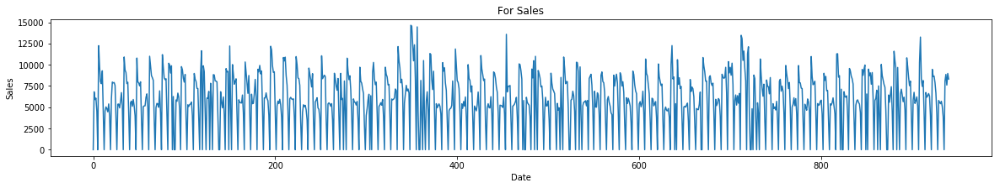

In [348]:
timeseries_visualization(train_df_3['Sales'],'Sales')

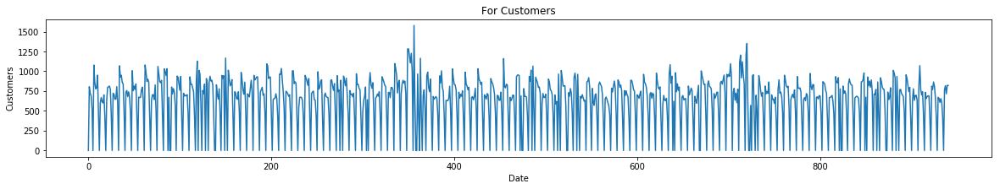

In [349]:
timeseries_visualization(train_df_3['Customers'],'Customers')

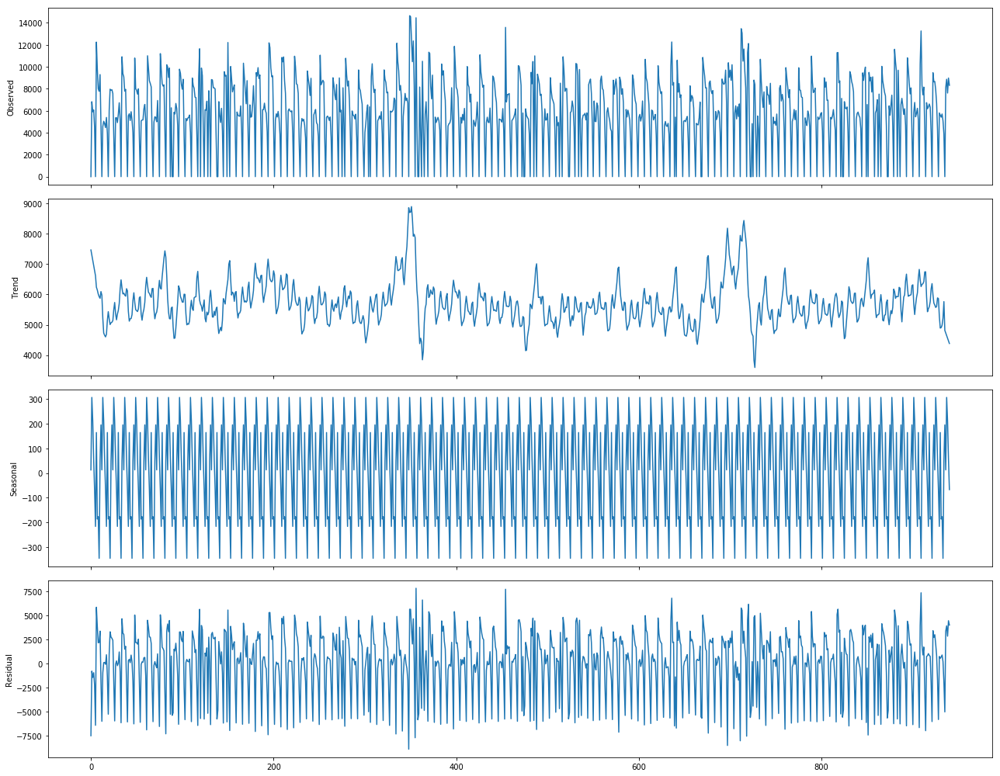

Mean Residual for Sales=2.74046987633578


In [352]:
plot_seasonal_decomposition_period(train_df_3['Sales'],'Sales','additive')

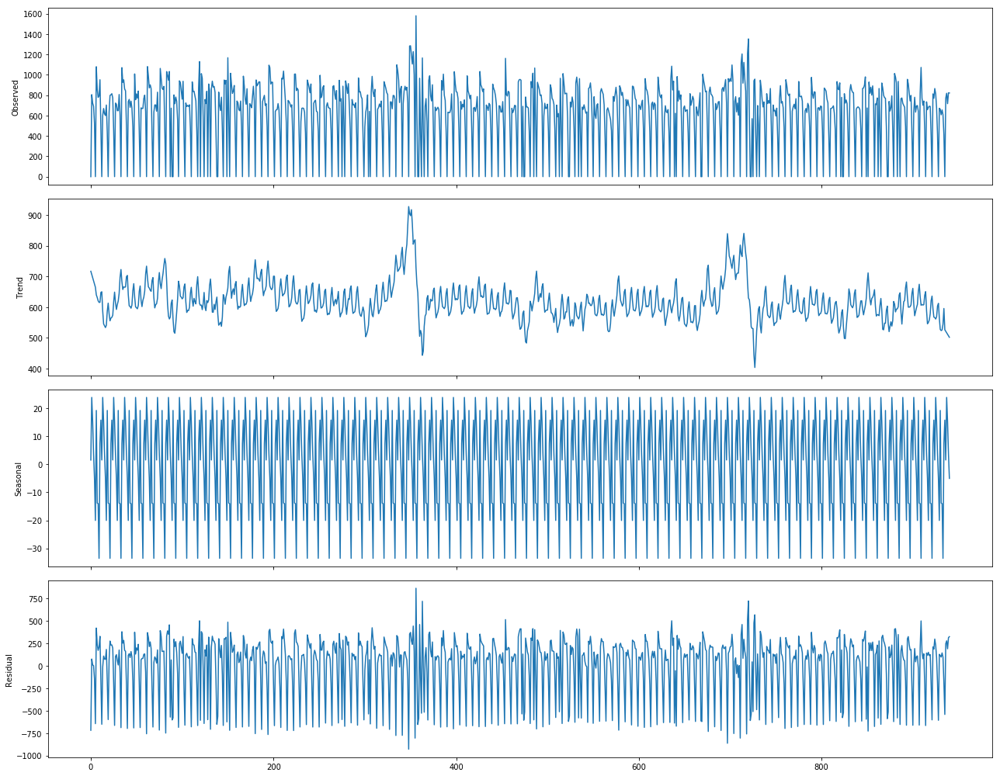

Mean Residual for Customers=0.15551457923053053


In [354]:
plot_seasonal_decomposition_period(train_df_3['Customers'],'Customers','additive')

In [355]:
train_df_3[['Sales','Customers']].corr()

,Sales,Customers
Sales,1.000000,0.972831
Customers,0.972831,1.000000


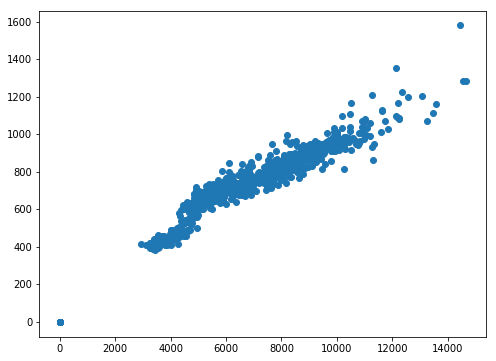

In [356]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_3['Sales'],train_df_3['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.

### Causality testing

In [357]:
causality_sales=grangercausalitytests(train_df_3[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=180.7696, p=0.0000  , df_denom=937, df_num=1
ssr based chi2 test:   chi2=181.3484, p=0.0000  , df=1
likelihood ratio test: chi2=165.8228, p=0.0000  , df=1
parameter F test:         F=180.7696, p=0.0000  , df_denom=937, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=104.6065, p=0.0000  , df_denom=934, df_num=2
ssr based chi2 test:   chi2=210.3331, p=0.0000  , df=2
likelihood ratio test: chi2=189.7922, p=0.0000  , df=2
parameter F test:         F=104.6065, p=0.0000  , df_denom=934, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=75.4415 , p=0.0000  , df_denom=931, df_num=3
ssr based chi2 test:   chi2=228.0262, p=0.0000  , df=3
likelihood ratio test: chi2=204.1153, p=0.0000  , df=3
parameter F test:         F=75.4415 , p=0.0000  , df_denom=931, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=64.7178 , p=0.0000  

In [358]:
causality_customers=grangercausalitytests(train_df_3[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=91.0042 , p=0.0000  , df_denom=937, df_num=1
ssr based chi2 test:   chi2=91.2956 , p=0.0000  , df=1
likelihood ratio test: chi2=87.1298 , p=0.0000  , df=1
parameter F test:         F=91.0042 , p=0.0000  , df_denom=937, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=47.3650 , p=0.0000  , df_denom=934, df_num=2
ssr based chi2 test:   chi2=95.2371 , p=0.0000  , df=2
likelihood ratio test: chi2=90.7110 , p=0.0000  , df=2
parameter F test:         F=47.3650 , p=0.0000  , df_denom=934, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=34.9447 , p=0.0000  , df_denom=931, df_num=3
ssr based chi2 test:   chi2=105.6224, p=0.0000  , df=3
likelihood ratio test: chi2=100.0874, p=0.0000  , df=3
parameter F test:         F=34.9447 , p=0.0000  , df_denom=931, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=29.2443 , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.
### Testing for stationary

In [359]:
stationary_test(train_df_3[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -5.873661185392492
P value= 3.196606946779251e-07
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -5.45959597176603
P value= 2.536107867417128e-06
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


#### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
#### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).
#### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.
### Autocoorelation and degree of integration

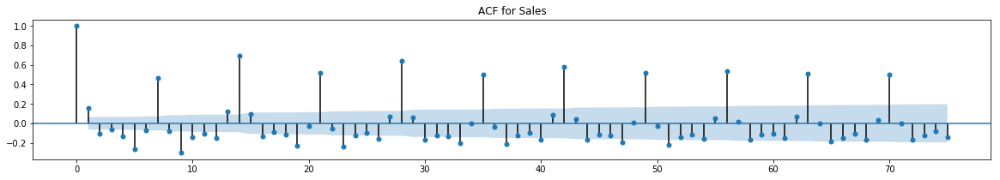

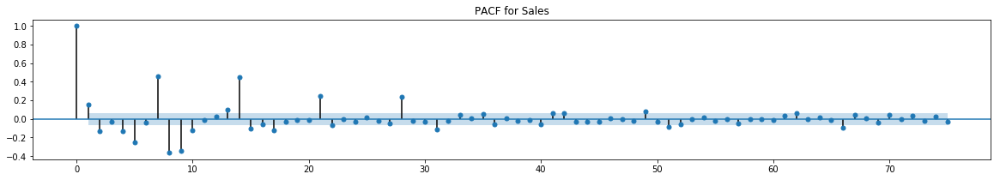

In [360]:
plot_acf_pacf(train_df_3['Sales'],'Sales')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=27, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 27 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 14 as p which is the last highest value.

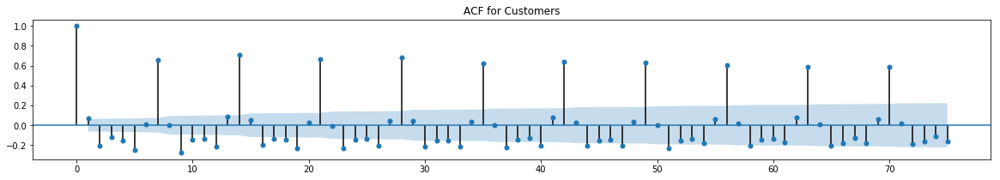

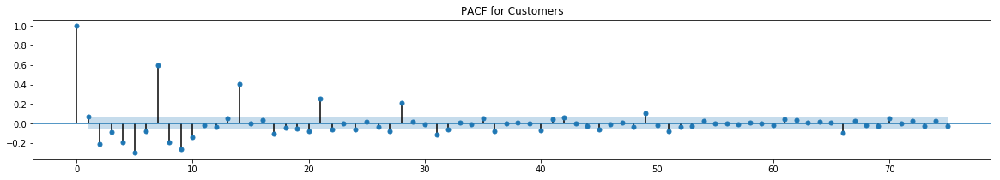

In [361]:
plot_acf_pacf(train_df_3['Customers'],'Customers')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=27, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 27 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 14 as p which is the last highest value.

### Train and Test split

In [362]:
train_df_3.shape

(941, 14)

#### As we have to forecast for next 6 weeks daily , which is 42 days, lets keep last 42 records for testing and first 899 records for training

In [363]:
train_len = 899
train_df_3_train=train_df_3.iloc[:train_len,:]
train_df_3_test=train_df_3.iloc[train_len:,:]

### Standardize Sales Customers

In [364]:
train_df_3_train[['Sales','Customers']]=scaler.fit_transform(train_df_3_train[['Sales','Customers']])
train_df_3_train.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,3,0.000000,0.000000,0,1,14130.0,2224,1,0,0,0,0,0
1,2013-01-02,3,0.465829,0.509816,0,1,14130.0,2225,0,1,0,0,0,0
2,2013-01-03,3,0.402949,0.456618,0,1,14130.0,2226,0,0,1,0,0,0
3,2013-01-04,3,0.414351,0.436985,0,1,14130.0,2227,0,0,0,1,0,0
4,2013-01-05,3,0.308800,0.332489,0,0,14130.0,2228,0,0,0,0,1,0


In [365]:
#For test data
train_df_3_test[['Sales','Customers']]=scaler.transform(train_df_3_test[['Sales','Customers']])
train_df_3_test.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
899,2015-06-20,3,0.265652,0.268524,0,0,14130.0,3124,0,0,0,0,1,0
900,2015-06-21,3,0.000000,0.000000,0,0,14130.0,3125,0,0,0,0,0,1
901,2015-06-22,3,0.398716,0.404053,0,0,14130.0,3126,0,0,0,0,0,0
902,2015-06-23,3,0.461323,0.493350,0,0,14130.0,3127,1,0,0,0,0,0
903,2015-06-24,3,0.371953,0.400887,0,0,14130.0,3128,0,1,0,0,0,0


### VAR

In [366]:
exog = train_df_3_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_3_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.54      -11.44   9.752e-06      -11.50
1       -11.56      -11.44   9.568e-06      -11.51
2       -11.57      -11.43   9.433e-06      -11.52
3       -11.62     -11.46*   8.975e-06      -11.56
4       -11.62      -11.43   8.998e-06      -11.55
5       -11.62      -11.41   9.000e-06      -11.54
6       -11.62      -11.39   8.971e-06      -11.53
7       -11.64      -11.39   8.784e-06      -11.55
8       -11.68      -11.41   8.497e-06     -11.57*
9       -11.68      -11.38   8.488e-06      -11.57
10      -11.69      -11.37   8.414e-06      -11.57
11      -11.69      -11.35   8.398e-06      -11.56
12      -11.68      -11.32   8.465e-06      -11.54
13      -11.68      -11.30   8.439e-06      -11.54
14     -11.70*      -11.30  8.319e-06*      -11.54
15      -11.69      -11.27   8.367e-06      -11.53
-------------------------------

#### In the above output, the AIC drops to lowest at lag 14, then decrease at lag 15 .Let’s go with the lag 14.

In [367]:
var_model_final = var_model.fit(14)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     14:01:12
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.2990
Nobs:                     885.000    HQIC:                  -11.5462
Log likelihood:           2739.35    FPE:                8.30165e-06
AIC:                     -11.6992    Det(Omega_mle):     7.64872e-06
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.234349         0.053274            4.399           0.000
exog0                 0.216130         0.017109           12.633           0.000
exog1                -0.029926         0.010696           -2

#### From here we found the lap(p) as 14. Perform Johansen test with P=14-1

In [368]:
train_df_3['Sales']=train_df_3['Sales'].apply(lambda x:round(x))
train_df_3['Customers']=train_df_3['Customers'].apply(lambda x:round(x))

In [369]:
cointegration_test(train_df_3[['Sales','Customers']],13)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  48.37     > 12.3212   =>   True
Customers ::  0.27      > 4.1296    =>   False


In [370]:
rank_result=select_coint_rank(train_df_3[['Sales','Customers']],-1,13)

In [371]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
#### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.
#### Before that let's forecast and evaluate VAR model¶

In [372]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_3_train[['Sales','Customers']].values[-lag_order:]
forecast_input

14


array([[0.3155595 , 0.34135529],
       [0.        , 0.        ],
       [0.4483512 , 0.48511716],
       [0.48658428, 0.48891704],
       [0.43968048, 0.45535149],
       [0.38615416, 0.44268524],
       [0.42199768, 0.43128562],
       [0.31999727, 0.31158961],
       [0.        , 0.        ],
       [0.73858128, 0.60481317],
       [0.66771352, 0.57694744],
       [0.58196218, 0.51994934],
       [0.51457636, 0.47055098],
       [0.55123916, 0.50474984]])

In [373]:
exog_test = train_df_3_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_3_test.index, columns=['Sales','Customers'])
var_forecast.head()

,Sales,Customers
899,0.327706,0.344970
900,0.011270,0.008078
901,0.388645,0.431336
902,0.407827,0.462712
903,0.373427,0.424881


In [374]:
train_df_3_test['VarForecastedSales']=var_forecast.Sales
train_df_3_test['VarForecastedCustomers']=var_forecast.Customers

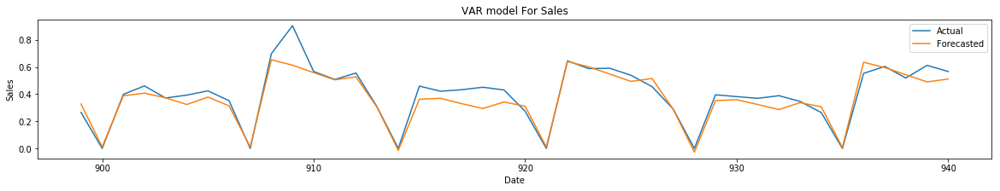

In [375]:
forecasted_timeseries_visualization(train_df_3_test['Sales'],train_df_3_test['VarForecastedSales'],'Sales','VAR')

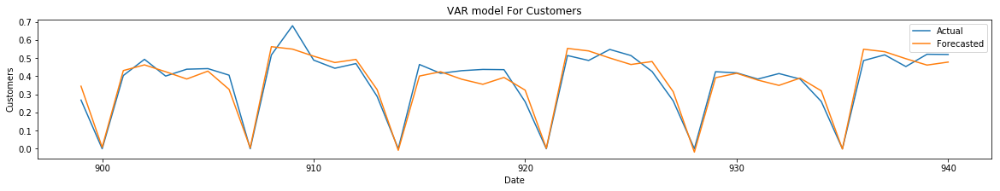

In [376]:
forecasted_timeseries_visualization(train_df_3_test['Customers'],train_df_3_test['VarForecastedCustomers'],'Customers','VAR')

In [377]:
train_df_3_test_temp=train_df_3_test.loc[(train_df_3_test.Sales!=0) & (train_df_3_test.Customers!=0),:]
d=summary(train_df_3_test_temp['Sales'], train_df_3_test_temp['VarForecastedSales'],
       train_df_3_test_temp['Customers'], train_df_3_test_temp['VarForecastedCustomers'],'Store-3','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### VARMAX
#### From above PACF and ACF plot we found, p=14 and q=0.

In [378]:
%%time
exog = train_df_3_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_3_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(14,0), exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                           VARX(14)   Log Likelihood                2546.858
                              + intercept   AIC                          -4939.716
Date:                    Mon, 05 Apr 2021   BIC                          -4570.018
Time:                            14:05:45   HQIC                         -4798.481
Sample:                                 0                                         
                                    - 899                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                72.84, 28.98   Jarque-Bera (JB):       1790.40, 98.95
Prob(Q):                        0.00, 0.90   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.18, 1.30   Skew:                     -1.09, -0.26
P

In [379]:
exog_test = train_df_3_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_3_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_3_test.index.min(),end=train_df_3_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_3_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
899,0.368685,0.382147
900,0.022165,0.012911
901,0.415306,0.446269
902,0.408394,0.460246
903,0.390876,0.436657


In [380]:
train_df_3_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_3_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

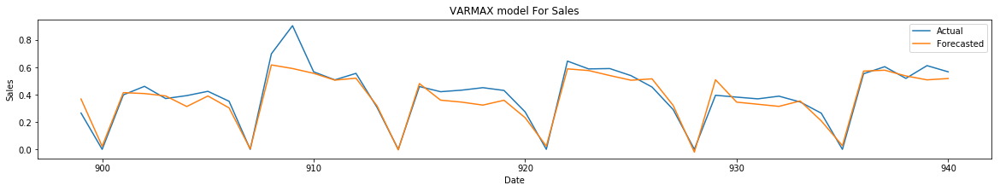

In [381]:
forecasted_timeseries_visualization(train_df_3_test['Sales'],train_df_3_test['VarmaxForecastedSales'],'Sales','VARMAX')

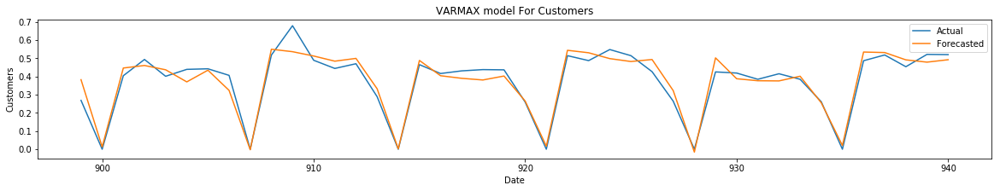

In [382]:
forecasted_timeseries_visualization(train_df_3_test['Customers'],train_df_3_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [383]:
train_df_3_test_temp=train_df_3_test.loc[(train_df_3_test.Sales!=0) & (train_df_3_test.Customers!=0),:]
d=summary(train_df_3_test_temp['Sales'], train_df_3_test_temp['VarmaxForecastedSales'],
       train_df_3_test_temp['Customers'], train_df_3_test_temp['VarmaxForecastedCustomers'],'Store-3','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


## ARIMA¶

In [384]:
%%time

#With exogenous and for sale
exog = train_df_3_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_3_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(14,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  899
Model:                    ARMA(14, 0)   Log Likelihood                 734.329
Method:                       css-mle   S.D. of innovations              0.107
Date:                Mon, 05 Apr 2021   AIC                          -1420.657
Time:                        14:07:17   BIC                          -1305.426
Sample:                             0   HQIC                         -1376.636
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.4295      0.013     34.177      0.000       0.405       0.454
Promo             0.2175      0.009     23.254      0.000       0.199       0.236
SchoolHoliday    -0.0185      0.012     

In [385]:
exog_test = train_df_3_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_3_test.index.min(),end=train_df_3_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_3_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
899,0.313008
900,0.008289
901,0.447150
902,0.423627
903,0.368082


In [386]:
train_df_3_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [387]:
exog = train_df_3_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_3_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(14,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  899
Model:                    ARMA(14, 0)   Log Likelihood                 791.703
Method:                       css-mle   S.D. of innovations              0.100
Date:                Mon, 05 Apr 2021   AIC                          -1535.405
Time:                        14:09:11   BIC                          -1420.174
Sample:                             0   HQIC                         -1491.384
                                                                              
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.4618      0.011     40.857      0.000       0.440       0.484
Promo                0.1164      0.007     16.093      0.000       0.102       0.131
SchoolHoliday       -0.0333 

In [388]:
arimax_customers = arimax_model_fit.predict(start=train_df_3_test.index.min(),end=train_df_3_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_3_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
899,0.325977
900,0.008576
901,0.469916
902,0.461200
903,0.420774


In [389]:
train_df_3_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

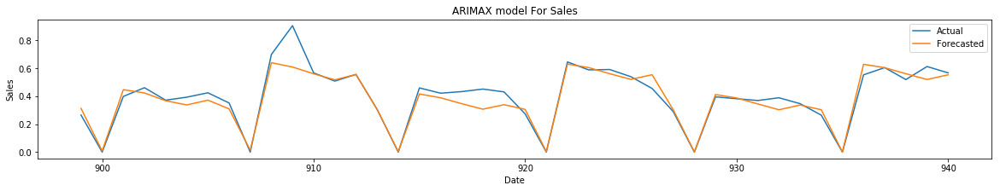

In [390]:
forecasted_timeseries_visualization(train_df_3_test['Sales'],train_df_3_test['ArimaxForecastedSales'],'Sales','ARIMAX')

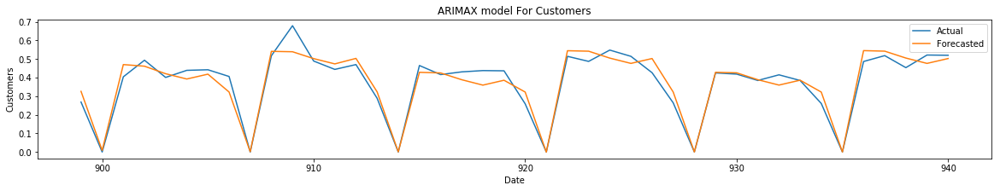

In [391]:
forecasted_timeseries_visualization(train_df_3_test['Customers'],train_df_3_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [392]:
train_df_3_test_temp=train_df_3_test.loc[(train_df_3_test.Sales!=0) & (train_df_3_test.Customers!=0),:]
d=summary(train_df_3_test_temp['Sales'], train_df_3_test_temp['ArimaxForecastedSales'],
       train_df_3_test_temp['Customers'], train_df_3_test_temp['ArimaxForecastedCustomes'],'Store-3','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [393]:
%%time

#Without exogenous and for sale
exog = train_df_3_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_3_train[['Sales']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())


                                 Statespace Model Results                                 
Dep. Variable:                              Sales   No. Observations:                  899
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 668.280
Date:                            Mon, 05 Apr 2021   AIC                          -1290.560
Time:                                    14:15:15   BIC                          -1180.131
Sample:                                         0   HQIC                         -1248.373
                                            - 899                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.2174      0.009     23.765      0.000       0.199       0.235
SchoolHoliday    -0.0119  

In [394]:
sarimax_sales = sarima_model_fit.predict(start=train_df_3_test.index.min(),end=train_df_3_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_sales, index=train_df_3_test.index, columns=['Sales'])
sarimax_forecast.head()

,Sales
899,0.307819
900,0.004328
901,0.425353
902,0.390667
903,0.341885


In [395]:
train_df_3_test['SarimaxForecastedSales']=sarimax_forecast.Sales

In [396]:
%%time

#Without exogenous and for sale
exog = train_df_3_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_3_train[['Customers']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())


                                 Statespace Model Results                                 
Dep. Variable:                          Customers   No. Observations:                  899
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 729.596
Date:                            Mon, 05 Apr 2021   AIC                          -1413.192
Time:                                    14:20:38   BIC                          -1302.763
Sample:                                         0   HQIC                         -1371.005
                                            - 899                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1138      0.008     14.755      0.000       0.099       0.129
SchoolHoliday    -0.0221  

In [397]:
sarimax_customers = sarima_model_fit.predict(start=train_df_3_test.index.min(),end=train_df_3_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_customers, index=train_df_3_test.index, columns=['Customers'])
sarimax_forecast.head()

,Customers
899,0.311772
900,-0.006673
901,0.437564
902,0.428383
903,0.392777


In [398]:
train_df_3_test['SarimaxForecastedCustomers']=sarimax_forecast.Customers

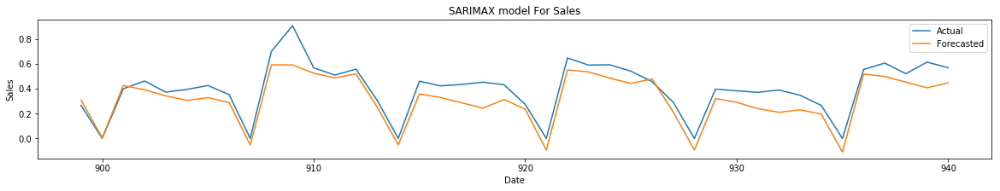

In [399]:
forecasted_timeseries_visualization(train_df_3_test['Sales'],train_df_3_test['SarimaxForecastedSales'],'Sales','SARIMAX')

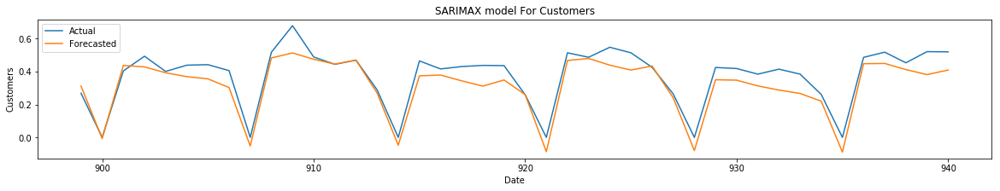

In [400]:
forecasted_timeseries_visualization(train_df_3_test['Customers'],train_df_3_test['SarimaxForecastedCustomers'],'Customers','SARIMAX')

In [401]:

train_df_3_test_temp=train_df_3_test.loc[(train_df_3_test.Sales!=0) & (train_df_3_test.Customers!=0),:]
d=summary(train_df_3_test_temp['Sales'], train_df_3_test_temp['SarimaxForecastedSales'],
       train_df_3_test_temp['Customers'], train_df_3_test_temp['SarimaxForecastedCustomers'],'Store-3','SARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(25)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [402]:
# For store 8
train_df_8=train_df.loc[train_df.Store==8,:]

In [403]:
train_df_8.shape

(942, 13)

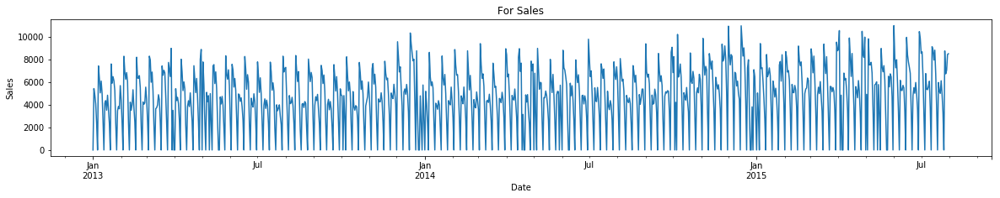

In [404]:
timeseries_visualization(train_df_8['Sales'],'Sales')

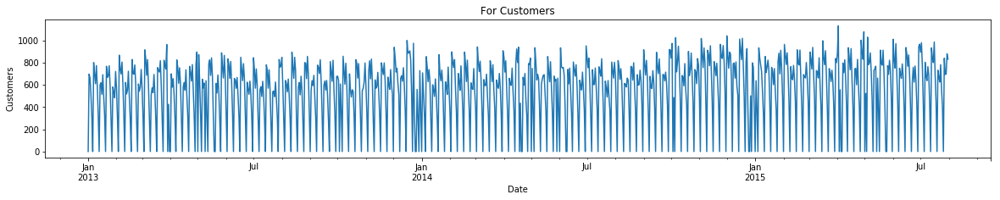

In [405]:
timeseries_visualization(train_df_8['Customers'],'Customers')

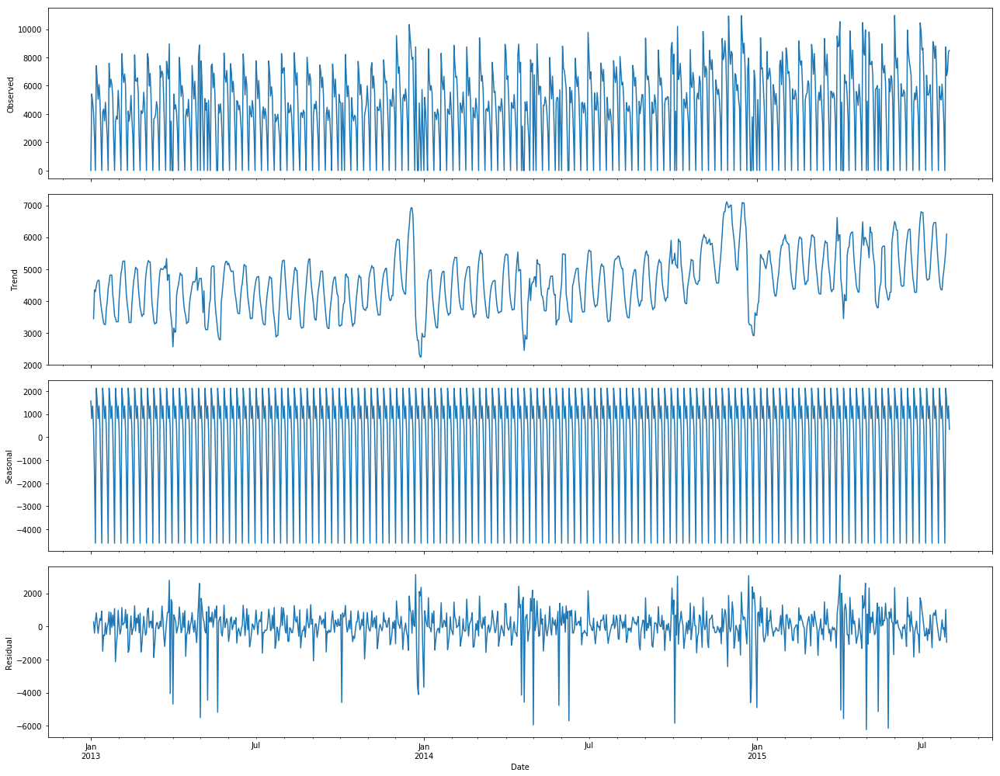

Mean Residual for Sales=-0.3252549589017867


In [406]:
plot_seasonal_decomposition(train_df_8['Sales'],'Sales','additive')

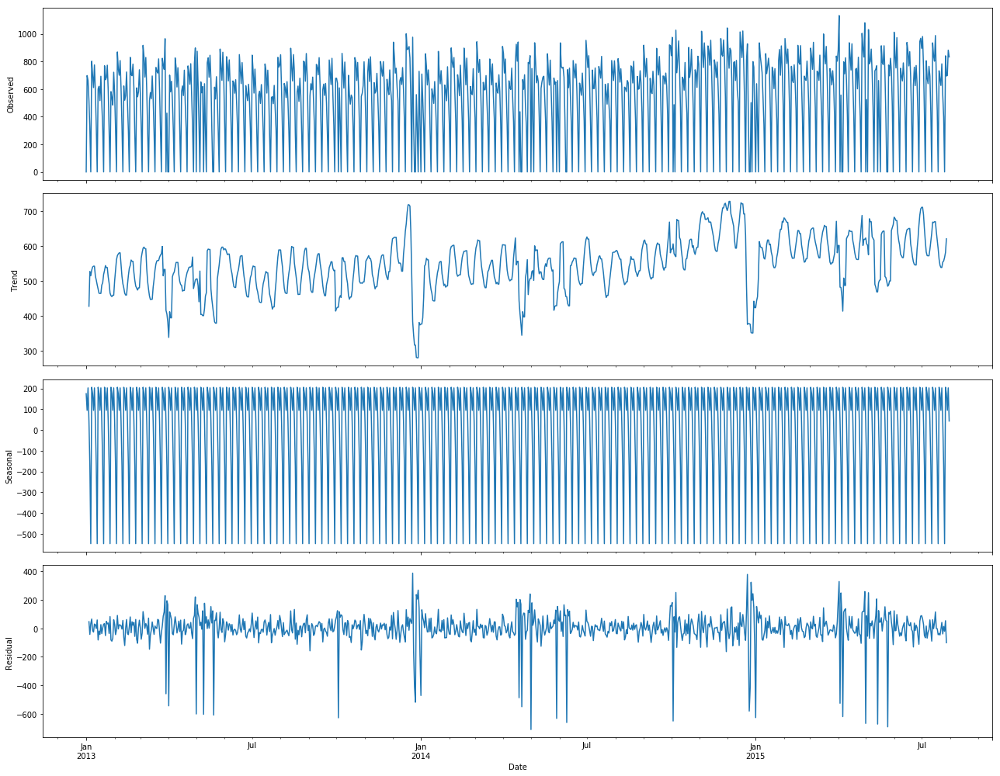

Mean Residual for Customers=-0.007924166187609015


In [407]:
plot_seasonal_decomposition(train_df_8['Customers'],'Customers','additive')

In [408]:
train_df_8[['Sales','Customers']].corr()

,Sales,Customers
Sales,1.000000,0.973899
Customers,0.973899,1.000000


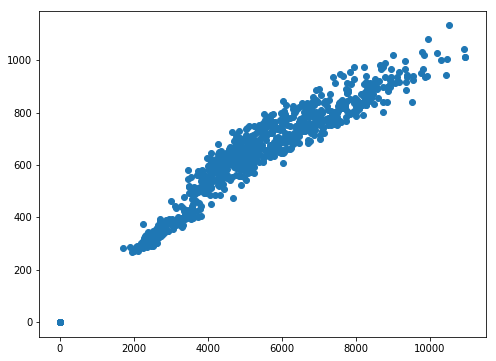

In [409]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_8['Sales'],train_df_8['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.
## Causality testing

In [410]:
causality_sales=grangercausalitytests(train_df_8[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=113.1289, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=113.4907, p=0.0000  , df=1
likelihood ratio test: chi2=107.1517, p=0.0000  , df=1
parameter F test:         F=113.1289, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=77.0442 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=154.9124, p=0.0000  , df=2
likelihood ratio test: chi2=143.3968, p=0.0000  , df=2
parameter F test:         F=77.0442 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=81.7209 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=247.0040, p=0.0000  , df=3
likelihood ratio test: chi2=219.2841, p=0.0000  , df=3
parameter F test:         F=81.7209 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=79.4430 , p=0.0000  

In [411]:
causality_customers=grangercausalitytests(train_df_8[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=61.0031 , p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=61.1982 , p=0.0000  , df=1
likelihood ratio test: chi2=59.2905 , p=0.0000  , df=1
parameter F test:         F=61.0031 , p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=36.9047 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=74.2041 , p=0.0000  , df=2
likelihood ratio test: chi2=71.4208 , p=0.0000  , df=2
parameter F test:         F=36.9047 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=54.4407 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=164.5489, p=0.0000  , df=3
likelihood ratio test: chi2=151.6213, p=0.0000  , df=3
parameter F test:         F=54.4407 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=52.8836 , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.
### Testing for stationary

In [412]:
stationary_test(train_df_8[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -3.566036708191667
P value= 0.006444532313171282
 => P-Value = 0.0064. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -3.990325335482041
P value= 0.0014620265446040584
 => P-Value = 0.0015. Rejecting Null Hypothesis.
 => Series is Stationary.


#### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
#### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).
#### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.
### Autocoorelation and degree of integration

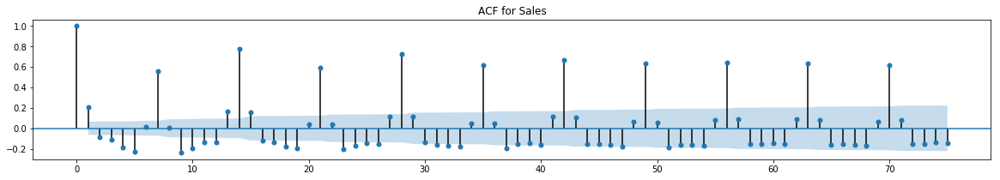

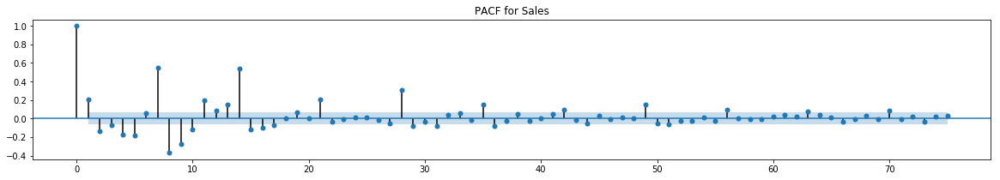

In [413]:
plot_acf_pacf(train_df_8['Sales'],'Sales')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=27, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 27 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 14 as p which is the last highest value.

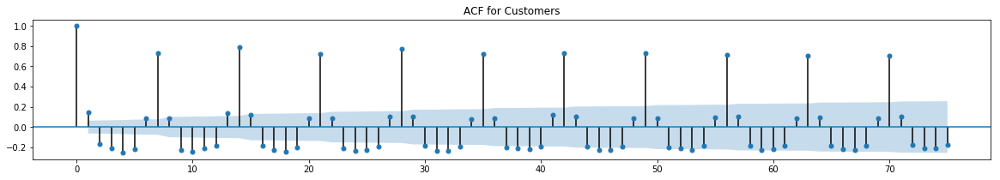

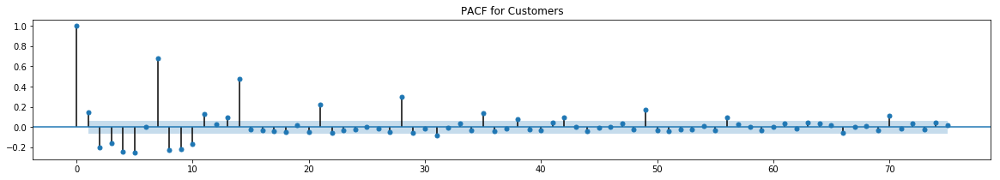

In [414]:
plot_acf_pacf(train_df_8['Customers'],'Customers')

##### Same as Sales
### Train and Test split

In [415]:
train_df_8.shape

(942, 13)

In [416]:
train_len = 900
train_df_8_train=train_df_8.iloc[:train_len,:]
train_df_8_test=train_df_8.iloc[train_len:,:]

### Standardize Sales Customers

In [417]:
train_df_8_train[['Sales','Customers']]=scaler.fit_transform(train_df_8_train[['Sales','Customers']])
train_df_8_train.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,8,0.000000,0.000000,0,1,0.0,0,1,0,0,0,0,0
2013-01-02,8,0.493939,0.616064,0,1,0.0,0,0,1,0,0,0,0
2013-01-03,8,0.441345,0.584289,0,1,0.0,0,0,0,1,0,0,0
2013-01-04,8,0.369975,0.456311,0,1,0.0,0,0,0,0,1,0,0
2013-01-05,8,0.213016,0.275375,0,0,0.0,0,0,0,0,0,1,0


In [418]:
#For test data
train_df_8_test[['Sales','Customers']]=scaler.transform(train_df_8_test[['Sales','Customers']])
train_df_8_test.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2015-06-20,8,0.329140,0.360989,0,0,7520.0,263,0,0,0,0,1,0
2015-06-21,8,0.000000,0.000000,0,0,7520.0,264,0,0,0,0,0,1
2015-06-22,8,0.437152,0.556046,0,0,7520.0,265,0,0,0,0,0,0
2015-06-23,8,0.501413,0.669903,0,0,7520.0,266,1,0,0,0,0,0
2015-06-24,8,0.456203,0.551633,0,0,7520.0,267,0,1,0,0,0,0


### VAR

In [419]:
exog = train_df_8_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_8_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.02      -10.92   1.643e-05      -10.98
1       -11.04      -10.93   1.598e-05      -11.00
2       -11.04      -10.90   1.605e-05      -10.99
3       -11.06      -10.90   1.576e-05      -11.00
4       -11.07      -10.89   1.554e-05      -11.00
5       -11.09      -10.88   1.528e-05      -11.01
6       -11.11      -10.88   1.497e-05      -11.02
7       -11.12      -10.87   1.482e-05      -11.02
8       -11.19      -10.92   1.377e-05      -11.09
9       -11.24      -10.95   1.313e-05      -11.13
10      -11.26      -10.95   1.289e-05      -11.14
11      -11.28      -10.94   1.263e-05      -11.15
12      -11.27      -10.92   1.269e-05      -11.14
13      -11.30      -10.92   1.242e-05      -11.15
14      -11.35     -10.95*   1.177e-05     -11.20*
15     -11.35*      -10.93  1.177e-05*      -11.19
-------------------------------

#### In the above output, the AIC drops to lowest at lag 14, then same at lag 15 .Let’s go with the lag 14.

In [420]:
var_model_final = var_model.fit(14)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     14:21:39
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -10.9525
Nobs:                     886.000    HQIC:                  -11.1994
Log likelihood:           2588.69    FPE:                1.17441e-05
AIC:                     -11.3523    Det(Omega_mle):     1.08214e-05
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.189013         0.050768            3.723           0.000
exog0                 0.259523         0.016752           15.492           0.000
exog1                -0.048535         0.010223           -4

#### From here we found the lap(p) as 14. Perform Johansen test with P=14-1

In [421]:
train_df_8['Sales']=train_df_8['Sales'].apply(lambda x:round(x))
train_df_8['Customers']=train_df_8['Customers'].apply(lambda x:round(x))

In [422]:
cointegration_test(train_df_8[['Sales','Customers']],13)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  23.9      > 12.3212   =>   True
Customers ::  0.2       > 4.1296    =>   False


In [423]:
rank_result=select_coint_rank(train_df_8[['Sales','Customers']],-1,13)


In [424]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
##### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.
#### Before that let's forecast and evaluate VAR model¶¶

In [425]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_8_train[['Sales','Customers']].values[-lag_order:]
forecast_input

14


array([[0.30525932, 0.38305384],
       [0.        , 0.        ],
       [0.55983958, 0.66284201],
       [0.48063075, 0.61429832],
       [0.47816972, 0.58164166],
       [0.51982499, 0.6972639 ],
       [0.49895178, 0.59664607],
       [0.31501231, 0.35039718],
       [0.        , 0.        ],
       [0.90575153, 0.82789056],
       [0.76437882, 0.77581642],
       [0.70649895, 0.67784643],
       [0.66557287, 0.76875552],
       [0.61735484, 0.60900265]])

In [426]:
exog_test = train_df_8_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_8_test.index, columns=['Sales','Customers'])
var_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.299898,0.360007
2015-06-21,0.006726,-0.004731
2015-06-22,0.509972,0.616789
2015-06-23,0.458658,0.579873
2015-06-24,0.439483,0.545921


In [427]:
train_df_8_test['VarForecastedSales']=var_forecast.Sales
train_df_8_test['VarForecastedCustomers']=var_forecast.Customers

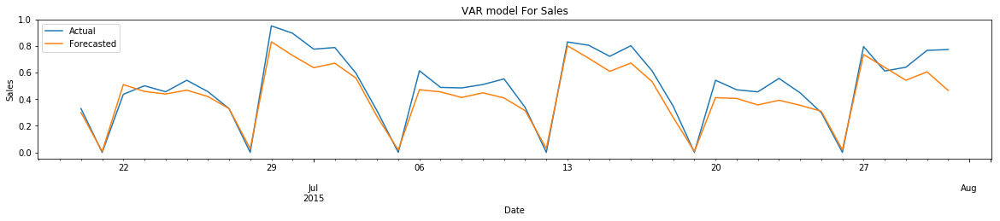

In [428]:
forecasted_timeseries_visualization(train_df_8_test['Sales'],train_df_8_test['VarForecastedSales'],'Sales','VAR')

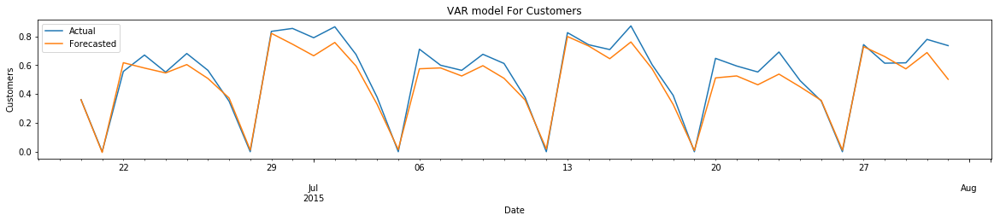

In [429]:
forecasted_timeseries_visualization(train_df_8_test['Customers'],train_df_8_test['VarForecastedCustomers'],'Customers','VAR')

In [430]:
train_df_8_test_temp=train_df_8_test.loc[(train_df_8_test.Sales!=0) & (train_df_8_test.Customers!=0),:]
d=summary(train_df_8_test_temp['Sales'], train_df_8_test_temp['VarForecastedSales'],
       train_df_8_test_temp['Customers'], train_df_8_test_temp['VarForecastedCustomers'],'Store-8','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### VARMAX
#### From above PACF and ACF plot we found, p=14 and q=0.

In [431]:
%%time
exog = train_df_8_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_8_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                2352.627
                              + intercept   AIC                          -4607.255
Date:                    Mon, 05 Apr 2021   BIC                          -4371.937
Time:                            14:23:46   HQIC                         -4517.362
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               198.73, 86.73   Jarque-Bera (JB):      2864.38, 545.02
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.58, 1.45   Skew:                     -1.65, -0.72
P

In [432]:
exog_test = train_df_8_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_8_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_8_test.index.min(),end=train_df_8_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_8_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.337664,0.376954
2015-06-21,0.029469,0.002547
2015-06-22,0.551153,0.636803
2015-06-23,0.455332,0.558749
2015-06-24,0.373889,0.499294


In [433]:
train_df_8_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_8_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

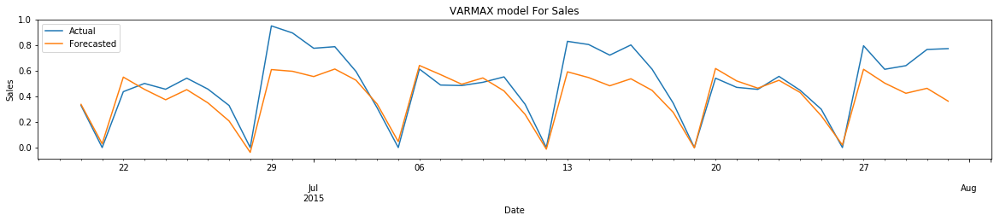

In [434]:
forecasted_timeseries_visualization(train_df_8_test['Sales'],train_df_8_test['VarmaxForecastedSales'],'Sales','VARMAX')

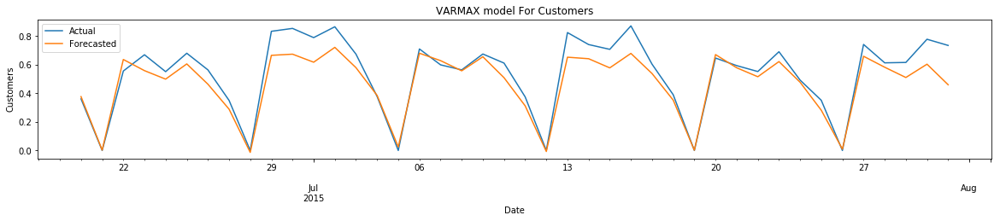

In [435]:
forecasted_timeseries_visualization(train_df_8_test['Customers'],train_df_8_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [436]:
train_df_8_test_temp=train_df_8_test.loc[(train_df_8_test.Sales!=0) & (train_df_8_test.Customers!=0),:]
d=summary(train_df_8_test_temp['Sales'], train_df_8_test_temp['VarmaxForecastedSales'],
       train_df_8_test_temp['Customers'], train_df_8_test_temp['VarmaxForecastedCustomers'],'Store-8','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### ARIMA

In [437]:
%%time

#With exogenous and for sale
exog = train_df_8_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_8_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 742.722
Method:                       css-mle   S.D. of innovations              0.106
Date:                Mon, 05 Apr 2021   AIC                          -1451.444
Time:                        14:24:23   BIC                          -1369.803
Sample:                    01-01-2013   HQIC                         -1420.257
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.5035      0.012     42.521      0.000       0.480       0.527
Promo             0.2137      0.008     27.201      0.000       0.198       0.229
SchoolHoliday    -0.0362      0.012     

In [438]:
exog_test = train_df_8_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_8_test.index.min(),end=train_df_8_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_8_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
Date,
2015-06-20,0.305735
2015-06-21,0.037483
2015-06-22,0.542034
2015-06-23,0.475728
2015-06-24,0.403218


In [439]:
train_df_8_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [440]:
exog = train_df_8_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_8_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 700.047
Method:                       css-mle   S.D. of innovations              0.111
Date:                Mon, 05 Apr 2021   AIC                          -1366.095
Time:                        14:24:33   BIC                          -1284.454
Sample:                    01-01-2013   HQIC                         -1334.908
                         - 06-19-2015                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.6023      0.012     48.943      0.000       0.578       0.626
Promo               0.1376      0.007     18.583      0.000       0.123       0.152
SchoolHoliday      -0.0609      

In [441]:
arimax_customers = arimax_model_fit.predict(start=train_df_8_test.index.min(),end=train_df_8_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_8_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
Date,
2015-06-20,0.337682
2015-06-21,0.015959
2015-06-22,0.622204
2015-06-23,0.584686
2015-06-24,0.514153


In [442]:
train_df_8_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

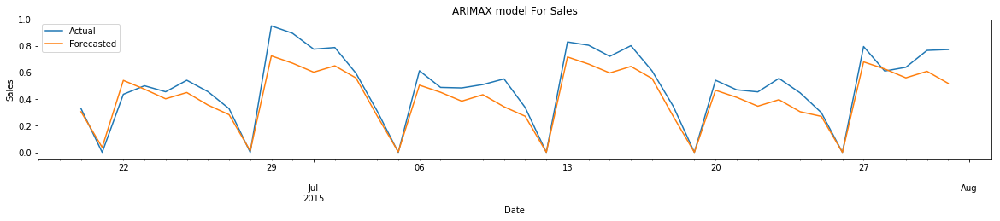

In [443]:
forecasted_timeseries_visualization(train_df_8_test['Sales'],train_df_8_test['ArimaxForecastedSales'],'Sales','ARIMAX')

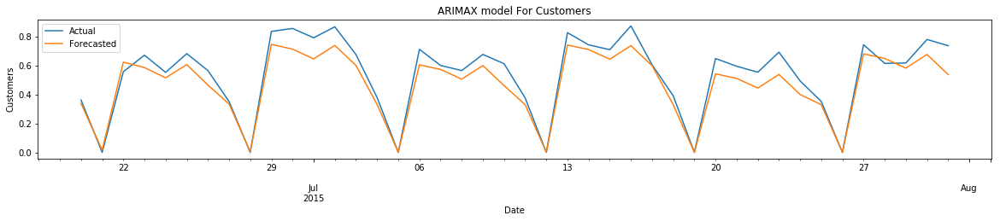

In [444]:
forecasted_timeseries_visualization(train_df_8_test['Customers'],train_df_8_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [445]:
train_df_8_test_temp=train_df_8_test.loc[(train_df_8_test.Sales!=0) & (train_df_8_test.Customers!=0),:]
d=summary(train_df_8_test_temp['Sales'], train_df_8_test_temp['ArimaxForecastedSales'],
       train_df_8_test_temp['Customers'], train_df_8_test_temp['ArimaxForecastedCustomes'],'Store-8','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [446]:
%%time

#Without exogenous and for sale
exog = train_df_8_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_8_train[['Sales']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 699.695
Date:                            Mon, 05 Apr 2021   AIC                          -1353.391
Time:                                    14:30:06   BIC                          -1242.935
Sample:                                01-01-2013   HQIC                         -1311.196
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.2087      0.009     23.558      0.000       0.191       0.226
SchoolHoliday    -0.0317  

In [447]:
sarimax_sales = sarima_model_fit.predict(start=train_df_8_test.index.min(),end=train_df_8_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_sales, index=train_df_8_test.index, columns=['Sales'])
sarimax_forecast.head()


,Sales
Date,
2015-06-20,0.358984
2015-06-21,0.106445
2015-06-22,0.592358
2015-06-23,0.548255
2015-06-24,0.487561


In [448]:
train_df_8_test['SarimaxForecastedSales']=sarimax_forecast.Sales

In [449]:
%%time

#Without exogenous and for sale
exog = train_df_8_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_8_train[['Customers']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                          Customers   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 645.787
Date:                            Mon, 05 Apr 2021   AIC                          -1245.574
Time:                                    14:35:45   BIC                          -1135.119
Sample:                                01-01-2013   HQIC                         -1203.380
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1341      0.008     16.813      0.000       0.118       0.150
SchoolHoliday    -0.0574  

In [450]:
sarimax_customers = sarima_model_fit.predict(start=train_df_8_test.index.min(),end=train_df_8_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_customers, index=train_df_8_test.index, columns=['Customers'])
sarimax_forecast.head()

,Customers
Date,
2015-06-20,0.402496
2015-06-21,0.083817
2015-06-22,0.658032
2015-06-23,0.633548
2015-06-24,0.592327


In [451]:
train_df_8_test['SarimaxForecastedCustomers']=sarimax_forecast.Customers

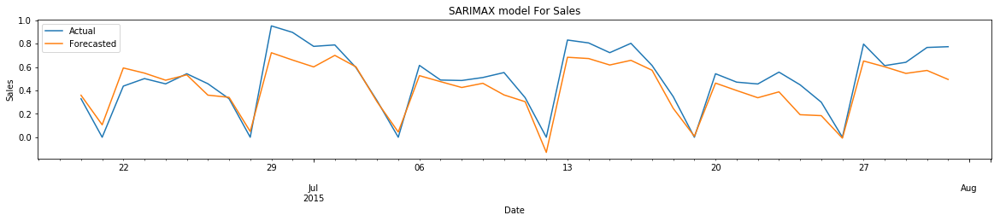

In [452]:
forecasted_timeseries_visualization(train_df_8_test['Sales'],train_df_8_test['SarimaxForecastedSales'],'Sales','SARIMAX')

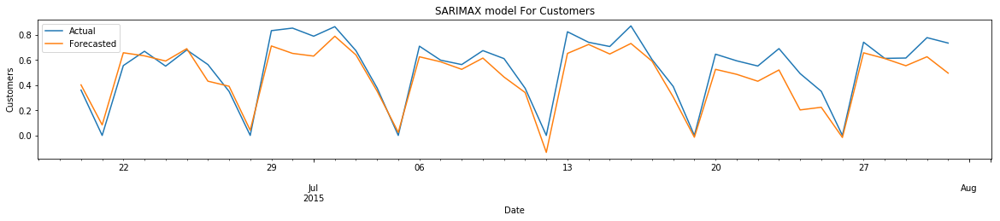

In [453]:
forecasted_timeseries_visualization(train_df_8_test['Customers'],train_df_8_test['SarimaxForecastedCustomers'],'Customers','SARIMAX')

In [454]:
train_df_8_test_temp=train_df_8_test.loc[(train_df_8_test.Sales!=0) & (train_df_8_test.Customers!=0),:]
d=summary(train_df_8_test_temp['Sales'], train_df_8_test_temp['SarimaxForecastedSales'],
       train_df_8_test_temp['Customers'], train_df_8_test_temp['SarimaxForecastedCustomers'],'Store-8','SARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(30)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [455]:
train_df_9=train_df.loc[train_df.Store==9,:]

In [456]:
train_df_9.shape

(942, 13)

## Time Series Visualization

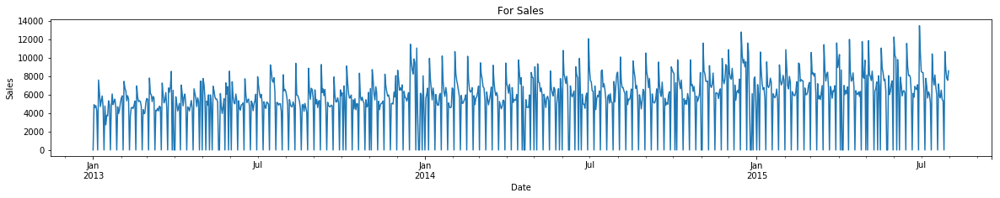

In [457]:
timeseries_visualization(train_df_9['Sales'],'Sales')

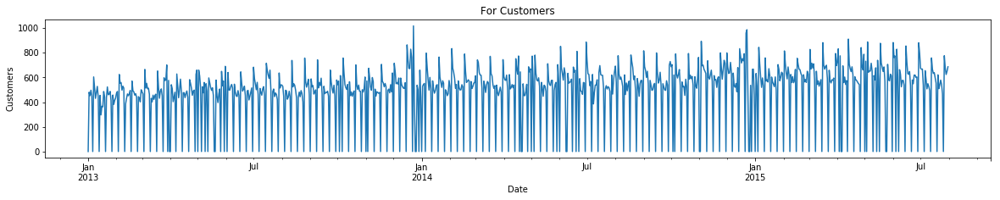

In [458]:
timeseries_visualization(train_df_9['Customers'],'Customers')

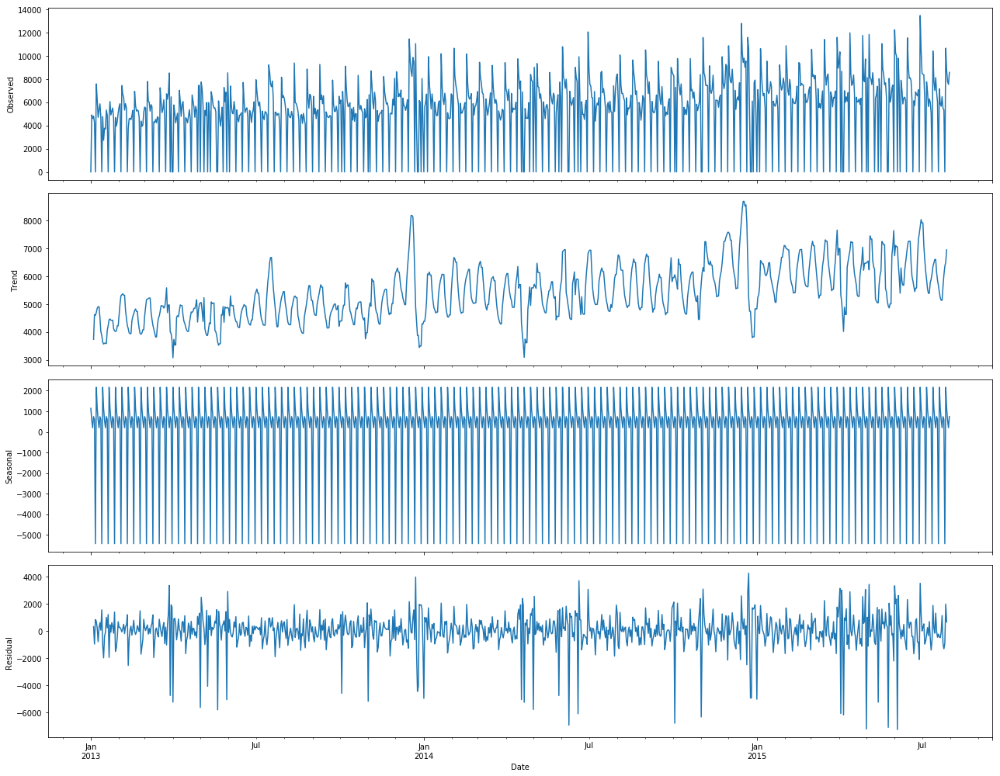

Mean Residual for Sales=0.8145699307670023


In [459]:
plot_seasonal_decomposition(train_df_9['Sales'],'Sales','additive')

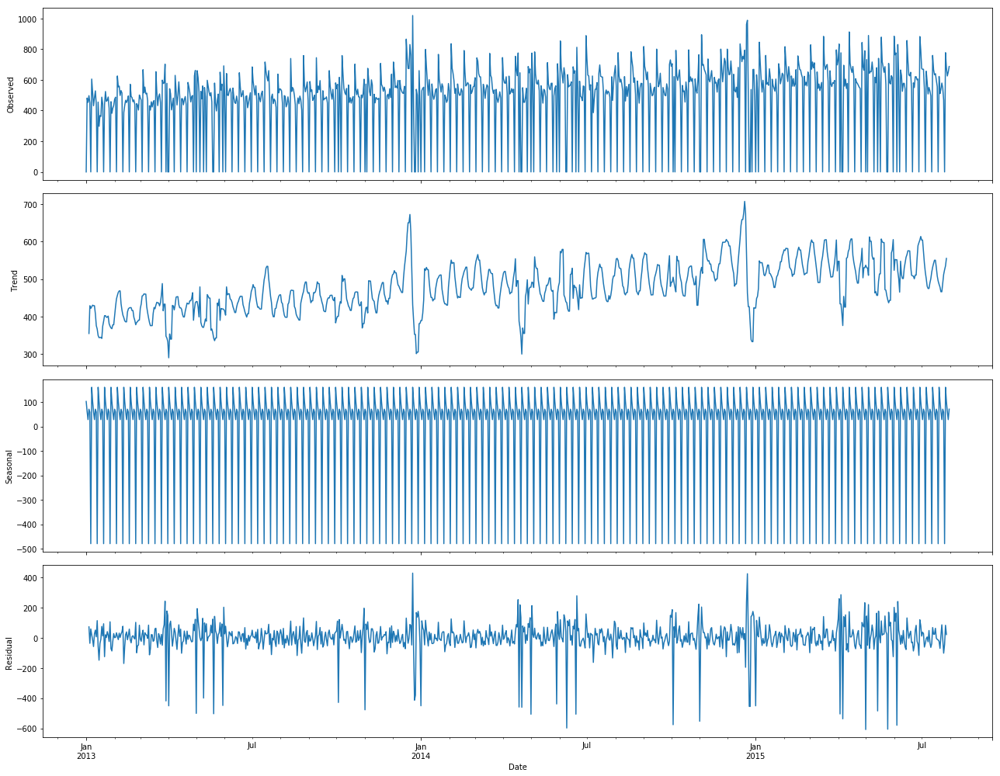

Mean Residual for Customers=0.06308758493860812


In [460]:
plot_seasonal_decomposition(train_df_9['Customers'],'Customers','additive')

In [461]:
train_df_9[['Sales','Customers']].corr()

,Sales,Customers
Sales,1.000000,0.983795
Customers,0.983795,1.000000


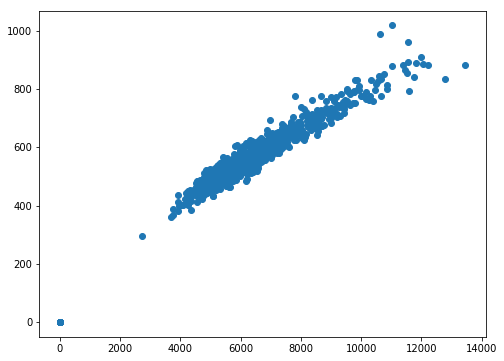

In [462]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_9['Sales'],train_df_9['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.
## Causality testing

In [463]:
causality_sales=grangercausalitytests(train_df_9[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=149.3252, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=149.8028, p=0.0000  , df=1
likelihood ratio test: chi2=139.0102, p=0.0000  , df=1
parameter F test:         F=149.3252, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=94.1957 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=189.3988, p=0.0000  , df=2
likelihood ratio test: chi2=172.5472, p=0.0000  , df=2
parameter F test:         F=94.1957 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=66.2441 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=200.2248, p=0.0000  , df=3
likelihood ratio test: chi2=181.4973, p=0.0000  , df=3
parameter F test:         F=66.2441 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=50.8918 , p=0.0000  

In [464]:
causality_customers=grangercausalitytests(train_df_9[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=75.1358 , p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=75.3761 , p=0.0000  , df=1
likelihood ratio test: chi2=72.5093 , p=0.0000  , df=1
parameter F test:         F=75.1358 , p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=49.5167 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=99.5631 , p=0.0000  , df=2
likelihood ratio test: chi2=94.6353 , p=0.0000  , df=2
parameter F test:         F=49.5167 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=40.1750 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=121.4301, p=0.0000  , df=3
likelihood ratio test: chi2=114.1959, p=0.0000  , df=3
parameter F test:         F=40.1750 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=32.6015 , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.
#### Testing for stationary

In [465]:
stationary_test(train_df_9[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -3.1663336605128185
P value= 0.02201801196662042
 => P-Value = 0.022. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -3.292750508914298
P value= 0.015205653277919543
 => P-Value = 0.0152. Rejecting Null Hypothesis.
 => Series is Stationary.


#### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
#### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).
#### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.¶

#### Autocoorelation and degree of integration

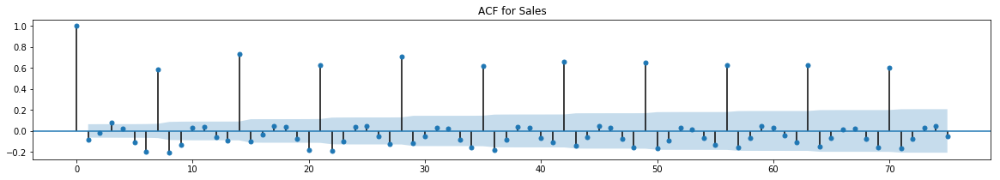

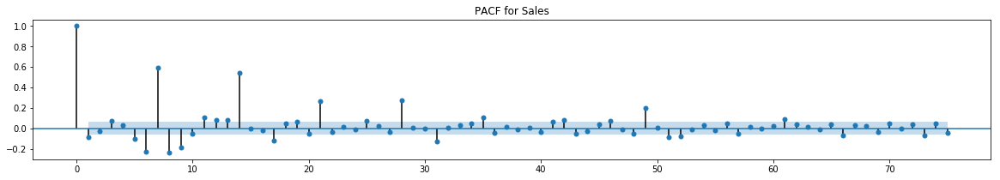

In [466]:
plot_acf_pacf(train_df_9['Sales'],'Sales')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=49, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 49 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 7 as p which is the last highest value.

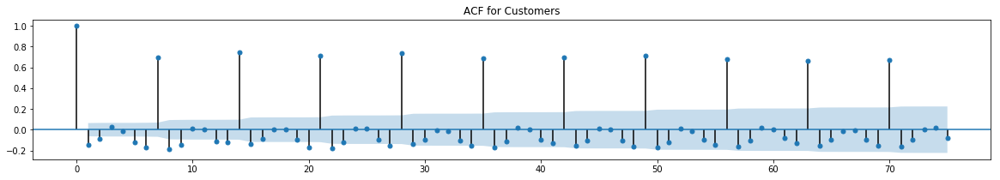

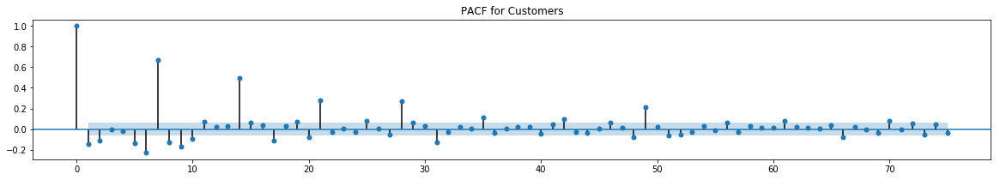

In [467]:
plot_acf_pacf(train_df_9['Customers'],'Customers')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=49, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 49 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 7 as p which is the last highest value.

#### Train and Test split¶

In [468]:
train_len = 900
train_df_9_train=train_df_9.iloc[:train_len,:]
train_df_9_test=train_df_9.iloc[train_len:,:]

### Standardize Sales Customers

In [469]:
train_df_9_train[['Sales','Customers']]=scaler.fit_transform(train_df_9_train[['Sales','Customers']])
train_df_9_train.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,9,0.000000,0.000000,0,1,2030.0,4537,1,0,0,0,0,0
2013-01-02,9,0.384037,0.472031,0,1,2030.0,4538,0,1,0,0,0,0
2013-01-03,9,0.360461,0.444553,0,1,2030.0,4539,0,0,1,0,0,0
2013-01-04,9,0.375813,0.487733,0,1,2030.0,4540,0,0,0,1,0,0
2013-01-05,9,0.333203,0.441609,0,0,2030.0,4541,0,0,0,0,1,0


In [470]:
#For test data
train_df_9_test[['Sales','Customers']]=scaler.transform(train_df_9_test[['Sales','Customers']])
train_df_9_test.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2015-06-20,9,0.483982,0.526006,0,0,2030.0,5437,0,0,0,0,1,0
2015-06-21,9,0.000000,0.000000,0,0,2030.0,5438,0,0,0,0,0,1
2015-06-22,9,0.479439,0.569185,0,0,2030.0,5439,0,0,0,0,0,0
2015-06-23,9,0.447560,0.539745,0,0,2030.0,5440,1,0,0,0,0,0
2015-06-24,9,0.539516,0.608440,0,0,2030.0,5441,0,1,0,0,0,0


### VAR

In [471]:
exog = train_df_9_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_9_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.23      -11.13   1.328e-05      -11.19
1       -11.29     -11.17*   1.247e-05      -11.25
2       -11.29      -11.15   1.249e-05      -11.24
3       -11.31      -11.14   1.231e-05      -11.24
4       -11.30      -11.12   1.236e-05      -11.23
5       -11.30      -11.09   1.242e-05      -11.22
6       -11.30      -11.08   1.232e-05      -11.22
7       -11.31      -11.06   1.227e-05      -11.21
8       -11.34      -11.07   1.189e-05      -11.24
9       -11.37      -11.08   1.156e-05      -11.26
10      -11.43      -11.11   1.091e-05      -11.31
11      -11.44      -11.10   1.077e-05      -11.31
12      -11.44      -11.09   1.071e-05      -11.31
13      -11.45      -11.07   1.064e-05      -11.31
14     -11.50*      -11.10  1.014e-05*     -11.35*
15      -11.50      -11.08   1.016e-05      -11.34
-------------------------------

#### In the above output, the AIC drops to lowest at lag 14, then decrease at lag 15 .Let’s go with the lag 14.

In [472]:
var_model_final = var_model.fit(14)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     14:37:18
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.0982
Nobs:                     886.000    HQIC:                  -11.3451
Log likelihood:           2653.25    FPE:                1.01516e-05
AIC:                     -11.4980    Det(Omega_mle):     9.35398e-06
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.198728         0.056077            3.544           0.000
exog0                 0.173799         0.014833           11.717           0.000
exog1                -0.042763         0.011046           -3

#### From here we found the lap(p) as 14. Perform Johansen test with P=14-1¶

In [473]:
train_df_9['Sales']=train_df_9['Sales'].apply(lambda x:round(x))
train_df_9['Customers']=train_df_9['Customers'].apply(lambda x:round(x))

In [474]:
cointegration_test(train_df_9[['Sales','Customers']],13)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  21.79     > 12.3212   =>   True
Customers ::  0.04      > 4.1296    =>   False


In [475]:
rank_result=select_coint_rank(train_df_9[['Sales','Customers']],-1,13)

In [476]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
#### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.
#### Before that let's forecast and evaluate VAR model¶

In [477]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_9_train[['Sales','Customers']].values[-lag_order:]
forecast_input

14


array([[0.56058589, 0.59764475],
       [0.        , 0.        ],
       [0.61752957, 0.65161923],
       [0.55087335, 0.61727184],
       [0.45813425, 0.51521099],
       [0.49808099, 0.56624141],
       [0.50356388, 0.56624141],
       [0.48288556, 0.52894995],
       [0.        , 0.        ],
       [0.90310958, 0.84003925],
       [0.71105193, 0.71344455],
       [0.63014021, 0.6202159 ],
       [0.63429153, 0.61432777],
       [0.61478813, 0.63689892]])

In [478]:
exog_test = train_df_9_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_9_test.index, columns=['Sales','Customers'])
var_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.559001,0.598317
2015-06-21,0.036976,0.036678
2015-06-22,0.549609,0.609032
2015-06-23,0.498349,0.578136
2015-06-24,0.435261,0.512014


In [479]:
train_df_9_test['VarForecastedSales']=var_forecast.Sales
train_df_9_test['VarForecastedCustomers']=var_forecast.Customers

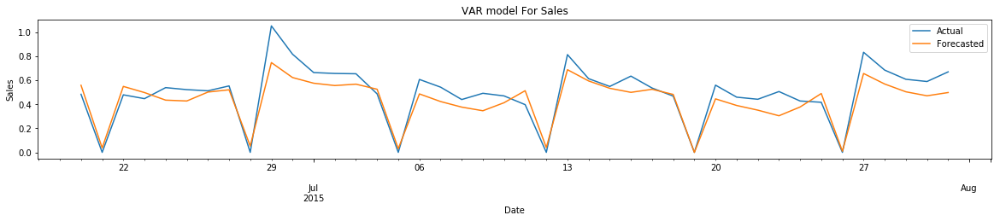

In [480]:
forecasted_timeseries_visualization(train_df_9_test['Sales'],train_df_9_test['VarForecastedSales'],'Sales','VAR')

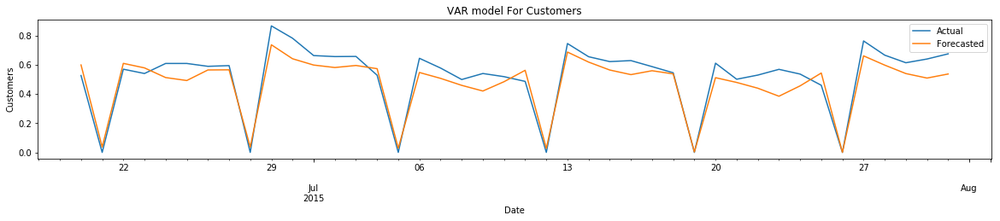

In [481]:
forecasted_timeseries_visualization(train_df_9_test['Customers'],train_df_9_test['VarForecastedCustomers'],'Customers','VAR')

In [482]:
train_df_9_test_temp=train_df_9_test.loc[(train_df_9_test.Sales!=0) & (train_df_9_test.Customers!=0),:]
d=summary(train_df_9_test_temp['Sales'], train_df_9_test_temp['VarForecastedSales'],
       train_df_9_test_temp['Customers'], train_df_9_test_temp['VarForecastedCustomers'],'Store-9','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### VARMAX
#### From above PACF and ACF plot we found, p=14 and q=0.

In [483]:
%%time
exog = train_df_9_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_9_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                2485.218
                              + intercept   AIC                          -4872.436
Date:                    Mon, 05 Apr 2021   BIC                          -4637.118
Time:                            14:39:40   HQIC                         -4782.543
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               152.19, 75.87   Jarque-Bera (JB):      2498.77, 449.31
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.74, 1.95   Skew:                     -1.67, -0.76
P

In [484]:
exog_test = train_df_9_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_9_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_9_test.index.min(),end=train_df_9_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_9_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.596370,0.632253
2015-06-21,0.022945,0.019391
2015-06-22,0.556830,0.610970
2015-06-23,0.449195,0.530215
2015-06-24,0.364284,0.453330


In [485]:
train_df_9_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_9_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

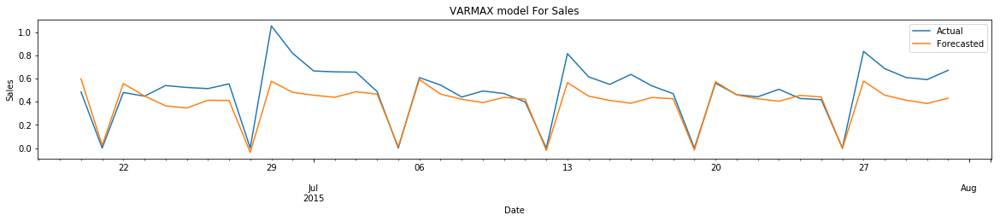

In [486]:
forecasted_timeseries_visualization(train_df_9_test['Sales'],train_df_9_test['VarmaxForecastedSales'],'Sales','VARMAX')

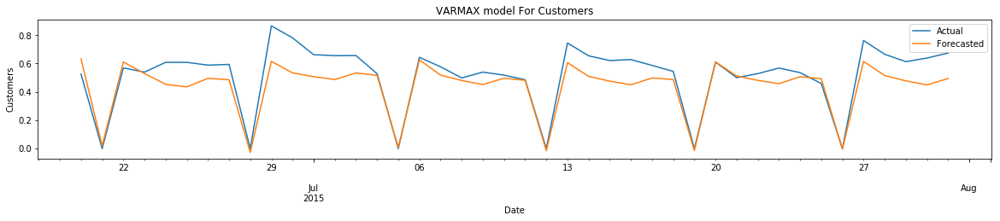

In [487]:
forecasted_timeseries_visualization(train_df_9_test['Customers'],train_df_9_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [488]:
train_df_9_test_temp=train_df_9_test.loc[(train_df_9_test.Sales!=0) & (train_df_9_test.Customers!=0),:]
d=summary(train_df_9_test_temp['Sales'], train_df_9_test_temp['VarmaxForecastedSales'],
       train_df_9_test_temp['Customers'], train_df_9_test_temp['VarmaxForecastedCustomers'],'Store-9','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [489]:
summary_df.head(20)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### ARIMA¶

In [499]:
%%time

#With exogenous and for sale
exog = train_df_9_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_9_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 671.111
Method:                       css-mle   S.D. of innovations              0.115
Date:                Mon, 05 Apr 2021   AIC                          -1308.222
Time:                        14:51:25   BIC                          -1226.581
Sample:                    01-01-2013   HQIC                         -1277.035
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.5069      0.014     36.228      0.000       0.479       0.534
Promo             0.1597      0.008     19.746      0.000       0.144       0.176
SchoolHoliday    -0.0156      0.014     

In [500]:
exog_test = train_df_9_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_9_test.index.min(),end=train_df_9_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_9_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
Date,
2015-06-20,0.521240
2015-06-21,0.060293
2015-06-22,0.564104
2015-06-23,0.470675
2015-06-24,0.425302


In [493]:
train_df_9_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [494]:
exog = train_df_9_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_9_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 655.449
Method:                       css-mle   S.D. of innovations              0.117
Date:                Mon, 05 Apr 2021   AIC                          -1276.899
Time:                        14:50:53   BIC                          -1195.258
Sample:                    01-01-2013   HQIC                         -1245.711
                         - 06-19-2015                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.5700      0.014     42.167      0.000       0.544       0.596
Promo               0.1124      0.008     14.735      0.000       0.097       0.127
SchoolHoliday      -0.0232      

In [495]:
arimax_customers = arimax_model_fit.predict(start=train_df_9_test.index.min(),end=train_df_9_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_9_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
Date,
2015-06-20,0.545921
2015-06-21,0.034696
2015-06-22,0.607977
2015-06-23,0.532784
2015-06-24,0.492029


In [496]:
train_df_9_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

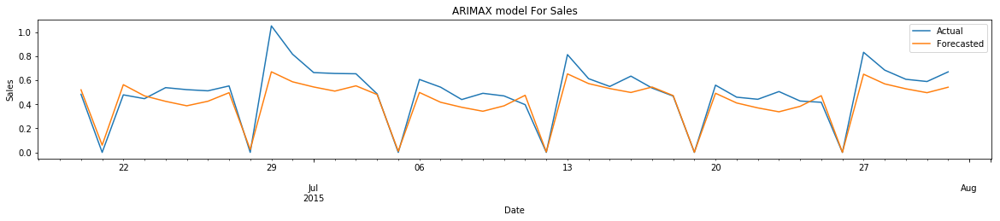

In [497]:
forecasted_timeseries_visualization(train_df_9_test['Sales'],train_df_9_test['ArimaxForecastedSales'],'Sales','ARIMAX')

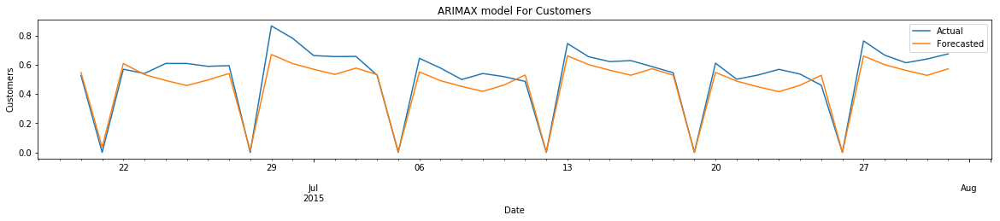

In [498]:
forecasted_timeseries_visualization(train_df_9_test['Customers'],train_df_9_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [502]:
train_df_9_test_temp=train_df_9_test.loc[(train_df_9_test.Sales!=0) & (train_df_9_test.Customers!=0),:]
d=summary(train_df_9_test_temp['Sales'], train_df_9_test_temp['ArimaxForecastedSales'],
       train_df_9_test_temp['Customers'], train_df_9_test_temp['ArimaxForecastedCustomes'],'Store-9','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(25)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [503]:
%%time

#Without exogenous and for sale
exog = train_df_9_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_9_train[['Sales']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 617.915
Date:                            Mon, 05 Apr 2021   AIC                          -1189.831
Time:                                    14:57:24   BIC                          -1079.376
Sample:                                01-01-2013   HQIC                         -1147.636
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1623      0.008     21.543      0.000       0.148       0.177
SchoolHoliday    -0.0148  

In [504]:
sarimax_sales = sarima_model_fit.predict(start=train_df_9_test.index.min(),end=train_df_9_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_sales, index=train_df_9_test.index, columns=['Sales'])
sarimax_forecast.head()


,Sales
Date,
2015-06-20,0.619340
2015-06-21,0.141755
2015-06-22,0.675552
2015-06-23,0.555521
2015-06-24,0.552681


In [505]:
train_df_9_test['SarimaxForecastedSales']=sarimax_forecast.Sales

In [506]:
%%time

#Without exogenous and for sale
exog = train_df_9_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_9_train[['Customers']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())


                                 Statespace Model Results                                 
Dep. Variable:                          Customers   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 607.298
Date:                            Mon, 05 Apr 2021   AIC                          -1168.595
Time:                                    15:03:14   BIC                          -1058.140
Sample:                                01-01-2013   HQIC                         -1126.400
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1188      0.008     14.334      0.000       0.103       0.135
SchoolHoliday    -0.0279  

In [507]:
sarimax_customers = sarima_model_fit.predict(start=train_df_9_test.index.min(),end=train_df_9_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_customers, index=train_df_9_test.index, columns=['Customers'])
sarimax_forecast.head()

,Customers
Date,
2015-06-20,0.568256
2015-06-21,0.052224
2015-06-22,0.595198
2015-06-23,0.563000
2015-06-24,0.529810


In [508]:
train_df_9_test['SarimaxForecastedCustomers']=sarimax_forecast.Customers

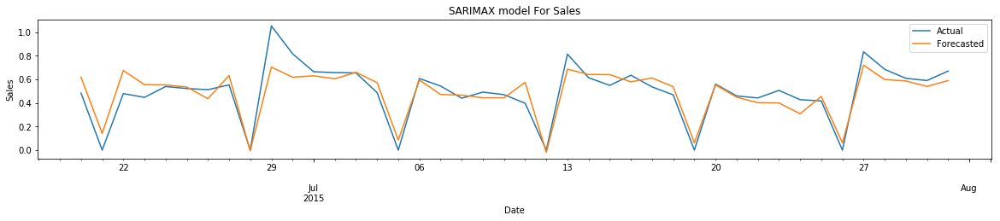

In [509]:
forecasted_timeseries_visualization(train_df_9_test['Sales'],train_df_9_test['SarimaxForecastedSales'],'Sales','SARIMAX')

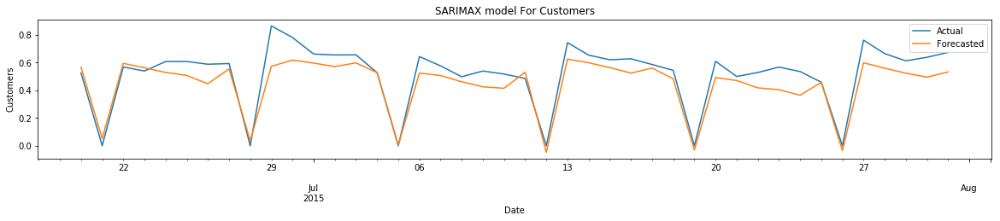

In [510]:
forecasted_timeseries_visualization(train_df_9_test['Customers'],train_df_9_test['SarimaxForecastedCustomers'],'Customers','SARIMAX')

In [511]:
train_df_9_test_temp=train_df_9_test.loc[(train_df_9_test.Sales!=0) & (train_df_9_test.Customers!=0),:]
d=summary(train_df_9_test_temp['Sales'], train_df_9_test_temp['SarimaxForecastedSales'],
       train_df_9_test_temp['Customers'], train_df_9_test_temp['SarimaxForecastedCustomers'],'Store-9','SARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(50)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [512]:
train_df_13=train_df.loc[train_df.Store==13,:]

In [513]:
train_df_13.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,13,0,0,0,1,310.0,3651,1,0,0,0,0,0
2013-01-02,13,3737,317,0,1,310.0,3652,0,1,0,0,0,0
2013-01-03,13,3674,292,0,1,310.0,3653,0,0,1,0,0,0
2013-01-04,13,3848,340,0,1,310.0,3654,0,0,0,1,0,0
2013-01-05,13,4285,344,0,0,310.0,3655,0,0,0,0,1,0


In [514]:
train_df_13.shape

(758, 13)

In [515]:
pd.date_range(start = train_df_13.index.min(), end = train_df_13.index.max() ).difference(train_df_13.index)


DatetimeIndex(['2014-07-01', '2014-07-02', '2014-07-03', '2014-07-04',
               '2014-07-05', '2014-07-06', '2014-07-07', '2014-07-08',
               '2014-07-09', '2014-07-10',
               ...
               '2014-12-22', '2014-12-23', '2014-12-24', '2014-12-25',
               '2014-12-26', '2014-12-27', '2014-12-28', '2014-12-29',
               '2014-12-30', '2014-12-31'],
              dtype='datetime64[ns]', length=184, freq=None)

In [516]:
train_df_13=train_df_13.reset_index()
train_df_13.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,13,0,0,0,1,310.0,3651,1,0,0,0,0,0
1,2013-01-02,13,3737,317,0,1,310.0,3652,0,1,0,0,0,0
2,2013-01-03,13,3674,292,0,1,310.0,3653,0,0,1,0,0,0
3,2013-01-04,13,3848,340,0,1,310.0,3654,0,0,0,1,0,0
4,2013-01-05,13,4285,344,0,0,310.0,3655,0,0,0,0,1,0


### Time Series Visualizati0n

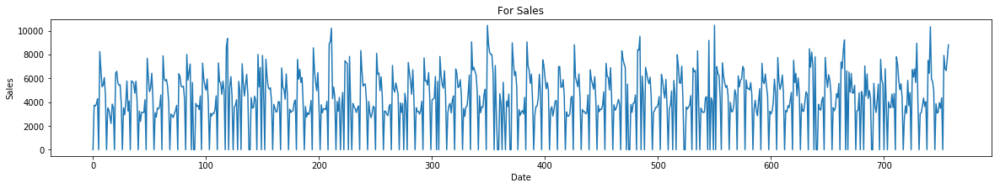

In [517]:
timeseries_visualization(train_df_13['Sales'],'Sales')

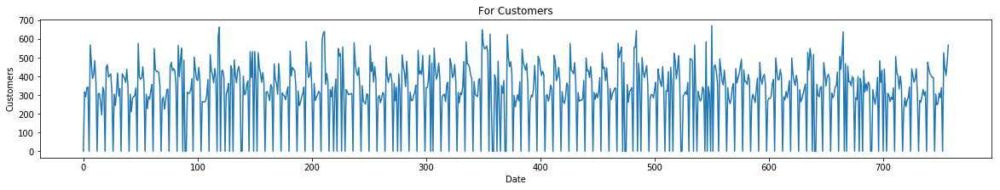

In [518]:
timeseries_visualization(train_df_13['Customers'],'Customers')

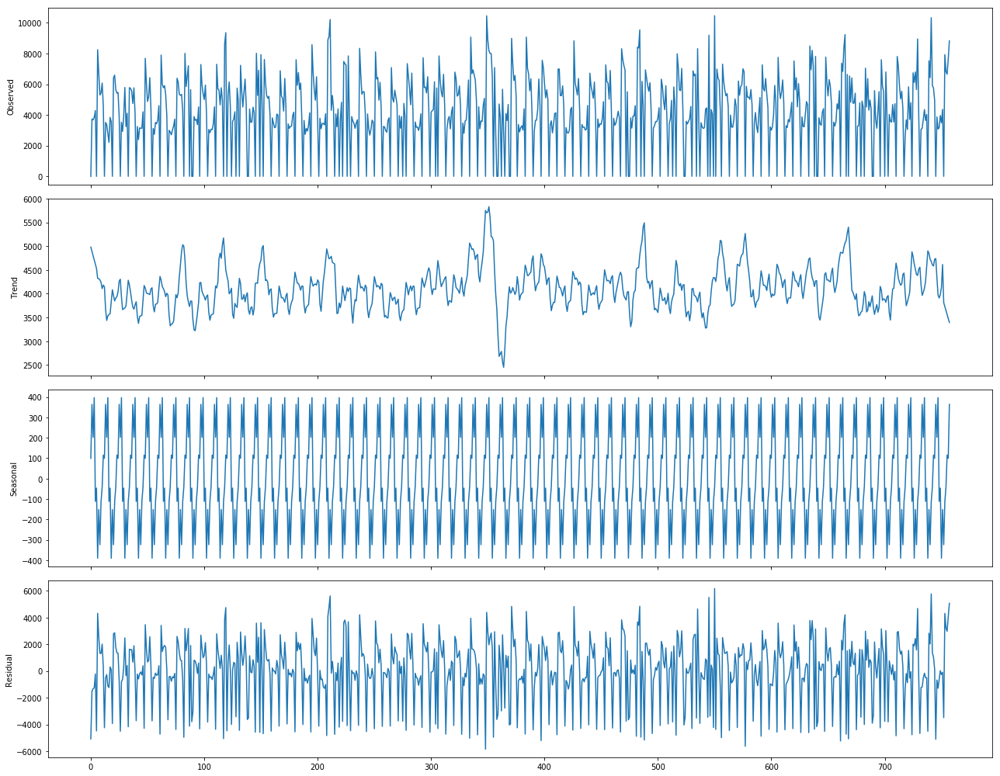

Mean Residual for Sales=8.894348828295335


In [520]:
plot_seasonal_decomposition_period(train_df_13['Sales'],'Sales','additive')

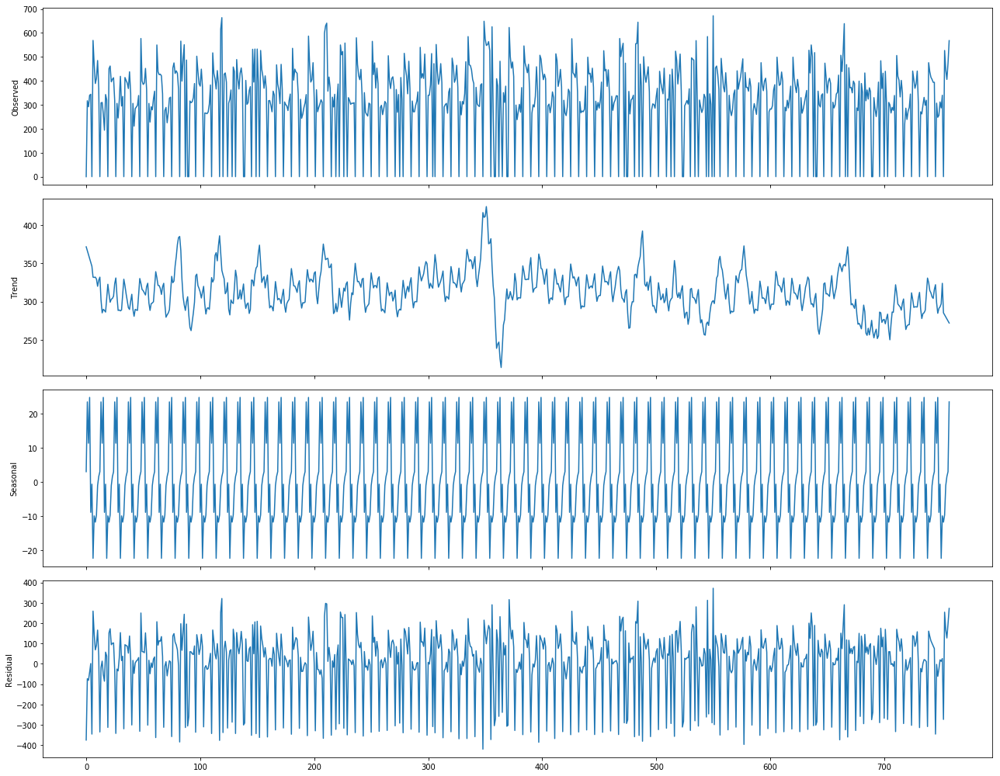

Mean Residual for Customers=0.2661769593735868


In [521]:
plot_seasonal_decomposition_period(train_df_13['Customers'],'Customers','additive')

In [522]:
train_df_13[['Sales','Customers']].corr()

,Sales,Customers
Sales,1.00000,0.97389
Customers,0.97389,1.00000


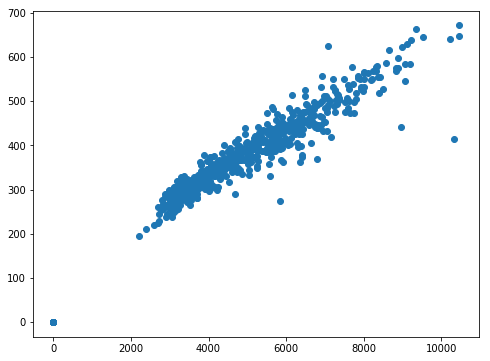

In [523]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_13['Sales'],train_df_13['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.
#### Causality testing

In [524]:
causality_sales=grangercausalitytests(train_df_13[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=219.9687, p=0.0000  , df_denom=754, df_num=1
ssr based chi2 test:   chi2=220.8439, p=0.0000  , df=1
likelihood ratio test: chi2=193.7820, p=0.0000  , df=1
parameter F test:         F=219.9687, p=0.0000  , df_denom=754, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=127.2106, p=0.0000  , df_denom=751, df_num=2
ssr based chi2 test:   chi2=256.1151, p=0.0000  , df=2
likelihood ratio test: chi2=220.5677, p=0.0000  , df=2
parameter F test:         F=127.2106, p=0.0000  , df_denom=751, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=85.5991 , p=0.0000  , df_denom=748, df_num=3
ssr based chi2 test:   chi2=259.2004, p=0.0000  , df=3
likelihood ratio test: chi2=222.8292, p=0.0000  , df=3
parameter F test:         F=85.5991 , p=0.0000  , df_denom=748, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=67.2835 , p=0.0000  

In [525]:
causality_customers=grangercausalitytests(train_df_13[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=147.2180, p=0.0000  , df_denom=754, df_num=1
ssr based chi2 test:   chi2=147.8037, p=0.0000  , df=1
likelihood ratio test: chi2=135.0146, p=0.0000  , df=1
parameter F test:         F=147.2180, p=0.0000  , df_denom=754, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=84.3331 , p=0.0000  , df_denom=751, df_num=2
ssr based chi2 test:   chi2=169.7892, p=0.0000  , df=2
likelihood ratio test: chi2=153.1696, p=0.0000  , df=2
parameter F test:         F=84.3331 , p=0.0000  , df_denom=751, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=56.1770 , p=0.0000  , df_denom=748, df_num=3
ssr based chi2 test:   chi2=170.1081, p=0.0000  , df=3
likelihood ratio test: chi2=153.4106, p=0.0000  , df=3
parameter F test:         F=56.1770 , p=0.0000  , df_denom=748, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=45.0705 , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.
### Testing for stationary

In [526]:
stationary_test(train_df_13[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -6.0115359723858335
P value= 1.5692125686123577e-07
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -5.609522363457973
P value= 1.2124599644810627e-06
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


##### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
#### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).
#### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.
### Autocoorelation and degree of integration¶

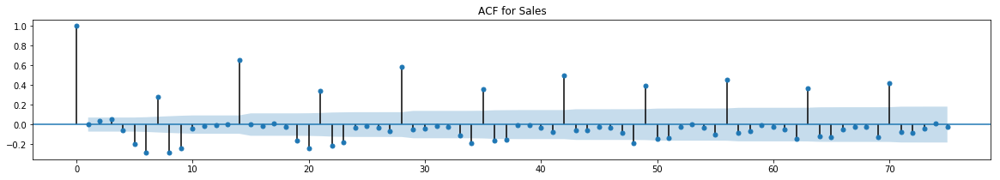

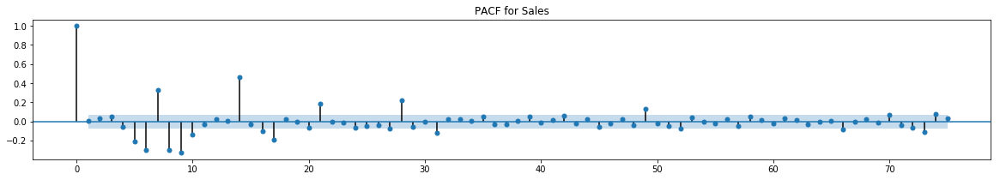

In [527]:
plot_acf_pacf(train_df_13['Sales'],'Sales')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=28, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 28 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 14 as p which is the last highest value.

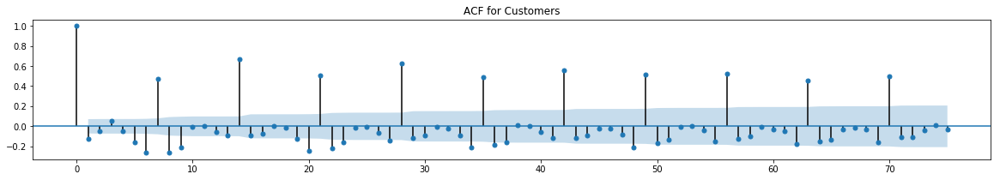

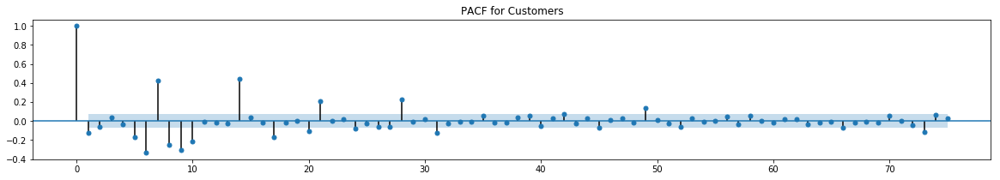

In [528]:
plot_acf_pacf(train_df_13['Customers'],'Customers')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=28, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 28 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 14 as p which is the last highest value.
### Train and Test split

In [529]:
train_df_13.shape

(758, 14)

#### As we have to forecast for next 6 weeks daily , which is 42 days, lets keep last 42 records for testing and first 899 records for training

In [530]:
train_len = 716
train_df_13_train=train_df_13.iloc[:train_len,:]
train_df_13_test=train_df_13.iloc[train_len:,:]

#### Standardize Sales Customers

In [531]:
train_df_13_train[['Sales','Customers']]=scaler.fit_transform(train_df_13_train[['Sales','Customers']])
train_df_13_train.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,13,0.000000,0.000000,0,1,310.0,3651,1,0,0,0,0,0
1,2013-01-02,13,0.357266,0.471726,0,1,310.0,3652,0,1,0,0,0,0
2,2013-01-03,13,0.351243,0.434524,0,1,310.0,3653,0,0,1,0,0,0
3,2013-01-04,13,0.367878,0.505952,0,1,310.0,3654,0,0,0,1,0,0
4,2013-01-05,13,0.409656,0.511905,0,0,310.0,3655,0,0,0,0,1,0


In [532]:
#For test data
train_df_13_test[['Sales','Customers']]=scaler.transform(train_df_13_test[['Sales','Customers']])
train_df_13_test.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
716,2015-06-20,13,0.419790,0.520833,0,0,310.0,4551,0,0,0,0,1,0
717,2015-06-21,13,0.000000,0.000000,0,0,310.0,4552,0,0,0,0,0,1
718,2015-06-22,13,0.248853,0.327381,0,0,310.0,4553,0,0,0,0,0,0
719,2015-06-23,13,0.351912,0.425595,0,0,310.0,4554,1,0,0,0,0,0
720,2015-06-24,13,0.292161,0.355655,0,0,310.0,4555,0,1,0,0,0,0


### VAR

In [533]:
exog = train_df_13_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_13_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -10.76      -10.64   2.124e-05      -10.71
1       -10.84     -10.70*   1.956e-05      -10.79
2       -10.85      -10.69   1.933e-05      -10.79
3       -10.89      -10.70   1.859e-05     -10.82*
4       -10.90      -10.68   1.846e-05      -10.81
5       -10.90      -10.65   1.850e-05      -10.80
6       -10.91      -10.63   1.836e-05      -10.80
7       -10.92      -10.62   1.814e-05      -10.80
8       -10.92      -10.60   1.808e-05      -10.80
9       -10.92      -10.57   1.813e-05      -10.78
10      -10.94      -10.57   1.769e-05      -10.80
11     -10.95*      -10.55  1.758e-05*      -10.79
12      -10.94      -10.51   1.768e-05      -10.78
13      -10.94      -10.48   1.777e-05      -10.76
14      -10.95      -10.47   1.760e-05      -10.76
15      -10.94      -10.44   1.769e-05      -10.75
-------------------------------

In the above output, the AIC drops to lowest at lag 11, then increase or remains same .Let’s go with the lag 11.


In [534]:
var_model_final = var_model.fit(11)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     15:04:24
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -10.5587
Nobs:                     705.000    HQIC:                  -10.8047
Log likelihood:           1924.55    FPE:                1.73925e-05
AIC:                     -10.9596    Det(Omega_mle):     1.59583e-05
--------------------------------------------------------------------
Results for equation Sales
                  coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------
const                0.397108         0.059685            6.653           0.000
exog0                0.283232         0.018878           15.003           0.000
exog1               -0.016425         0.012002           -1.369 

#### From here we found the lap(p) as 11. Perform Johansen test with P=11-1¶

In [535]:
train_df_13['Sales']=train_df_13['Sales'].apply(lambda x:round(x))
train_df_13['Customers']=train_df_13['Customers'].apply(lambda x:round(x))

In [536]:
cointegration_test(train_df_13[['Sales','Customers']],10)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  53.51     > 12.3212   =>   True
Customers ::  0.6       > 4.1296    =>   False


In [537]:
rank_result=select_coint_rank(train_df_13[['Sales','Customers']],-1,11)

In [538]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
#### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.
#### Before that let's forecast and evaluate VAR model¶


In [539]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_13_train[['Sales','Customers']].values[-lag_order:]
forecast_input

11


array([[0.34196941, 0.44642857],
       [0.33776291, 0.39583333],
       [0.44713193, 0.43005952],
       [0.33852772, 0.41220238],
       [0.45200765, 0.50446429],
       [0.        , 0.        ],
       [0.74646272, 0.75297619],
       [0.68441683, 0.6235119 ],
       [0.5626195 , 0.59970238],
       [0.48250478, 0.49553571],
       [0.53021033, 0.59821429]])

In [540]:
exog_test = train_df_13_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_13_test.index, columns=['Sales','Customers'])
var_forecast.head()

,Sales,Customers
716,0.471178,0.574290
717,0.001900,-0.029921
718,0.336785,0.410059
719,0.315533,0.393412
720,0.309516,0.391846


In [541]:
train_df_13_test['VarForecastedSales']=var_forecast.Sales
train_df_13_test['VarForecastedCustomers']=var_forecast.Customers

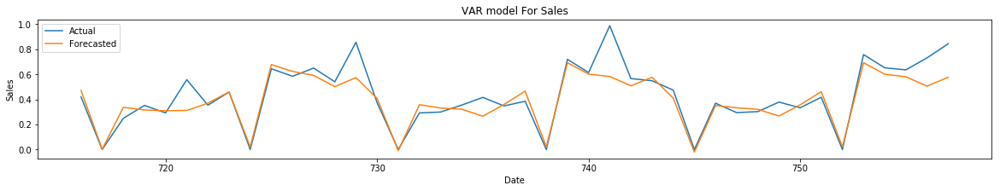

In [542]:
forecasted_timeseries_visualization(train_df_13_test['Sales'],train_df_13_test['VarForecastedSales'],'Sales','VAR')

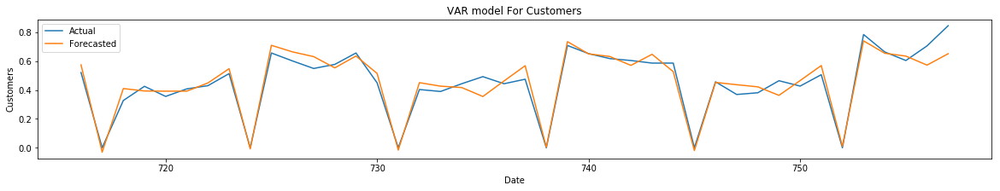

In [543]:
forecasted_timeseries_visualization(train_df_13_test['Customers'],train_df_13_test['VarForecastedCustomers'],'Customers','VAR')

In [544]:
train_df_13_test_temp=train_df_13_test.loc[(train_df_13_test.Sales!=0) & (train_df_13_test.Customers!=0),:]
d=summary(train_df_13_test_temp['Sales'], train_df_13_test_temp['VarForecastedSales'],
       train_df_13_test_temp['Customers'], train_df_13_test_temp['VarForecastedCustomers'],'Store-13','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head(20)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### VARMAX
##### From above PACF and ACF plot we found, p=14 and q=0

In [545]:
%%time
exog = train_df_13_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_13_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(14,0), exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  716
Model:                           VARX(14)   Log Likelihood                1812.975
                              + intercept   AIC                          -3471.950
Date:                    Mon, 05 Apr 2021   BIC                          -3119.776
Time:                            15:08:08   HQIC                         -3335.956
Sample:                                 0                                         
                                    - 716                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                66.97, 55.32   Jarque-Bera (JB):        230.13, 86.44
Prob(Q):                        0.00, 0.05   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.37, 1.53   Skew:                     -0.46, -0.58
P

In [546]:
exog_test = train_df_13_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_13_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_13_test.index.min(),end=train_df_13_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_13_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
716,0.488228,0.592923
717,-0.067620,-0.082818
718,0.422684,0.497805
719,0.207213,0.271628
720,0.361677,0.431086


In [547]:
train_df_13_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_13_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

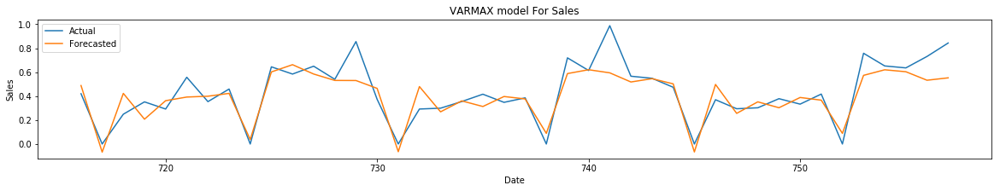

In [548]:
forecasted_timeseries_visualization(train_df_13_test['Sales'],train_df_13_test['VarmaxForecastedSales'],'Sales','VARMAX')

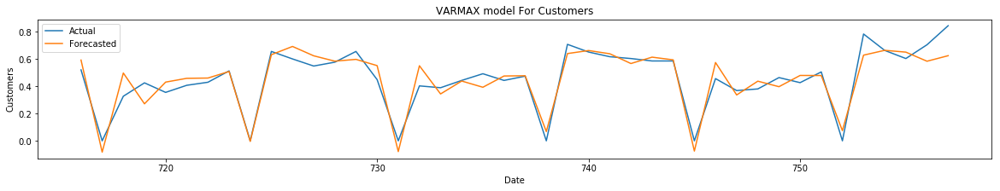

In [549]:
forecasted_timeseries_visualization(train_df_13_test['Customers'],train_df_13_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [550]:
train_df_13_test_temp=train_df_13_test.loc[(train_df_13_test.Sales!=0) & (train_df_13_test.Customers!=0),:]
d=summary(train_df_13_test_temp['Sales'], train_df_13_test_temp['VarmaxForecastedSales'],
       train_df_13_test_temp['Customers'], train_df_13_test_temp['VarmaxForecastedCustomers'],'Store-13','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(25)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### ARIMA

In [551]:
%%time

#With exogenous and for sale
exog = train_df_13_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_13_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(14,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  716
Model:                    ARMA(14, 0)   Log Likelihood                 527.945
Method:                       css-mle   S.D. of innovations              0.116
Date:                Mon, 05 Apr 2021   AIC                          -1007.890
Time:                        15:09:32   BIC                           -898.122
Sample:                             0   HQIC                          -965.502
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.3933      0.013     30.015      0.000       0.368       0.419
Promo             0.2588      0.011     23.029      0.000       0.237       0.281
SchoolHoliday    -0.0105      0.010     

In [552]:
exog_test = train_df_13_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_13_test.index.min(),end=train_df_13_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_13_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
716,0.432088
717,0.009710
718,0.383578
719,0.322190
720,0.329329


In [553]:
train_df_13_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [554]:
exog = train_df_13_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_13_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(14,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  716
Model:                    ARMA(14, 0)   Log Likelihood                 473.597
Method:                       css-mle   S.D. of innovations              0.125
Date:                Mon, 05 Apr 2021   AIC                           -899.193
Time:                        15:11:10   BIC                           -789.425
Sample:                             0   HQIC                          -856.806
                                                                              
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.4948      0.014     35.788      0.000       0.468       0.522
Promo                0.2147      0.010     21.531      0.000       0.195       0.234
SchoolHoliday       -0.0188 

In [555]:
arimax_customers = arimax_model_fit.predict(start=train_df_13_test.index.min(),end=train_df_13_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_13_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
716,0.568841
717,0.002121
718,0.492629
719,0.430451
720,0.420561


In [556]:
train_df_13_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

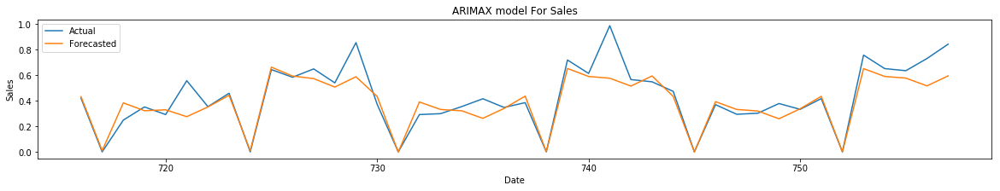

In [557]:
forecasted_timeseries_visualization(train_df_13_test['Sales'],train_df_13_test['ArimaxForecastedSales'],'Sales','ARIMAX')

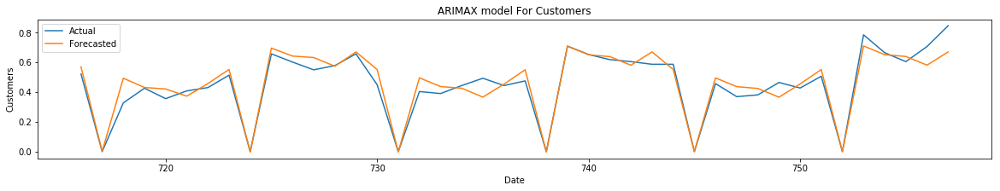

In [558]:
forecasted_timeseries_visualization(train_df_13_test['Customers'],train_df_13_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [559]:
train_df_13_test_temp=train_df_13_test.loc[(train_df_13_test.Sales!=0) & (train_df_13_test.Customers!=0),:]
d=summary(train_df_13_test_temp['Sales'], train_df_13_test_temp['ArimaxForecastedSales'],
       train_df_13_test_temp['Customers'], train_df_13_test_temp['ArimaxForecastedCustomes'],'Store-13','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(25)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [560]:
train_df_25=train_df.loc[train_df.Store==25,:]

In [561]:
train_df_25.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,25,0,0,0,1,430.0,3564,1,0,0,0,0,0
2013-01-02,25,11944,1698,0,1,430.0,3565,0,1,0,0,0,0
2013-01-03,25,10409,1587,0,1,430.0,3566,0,0,1,0,0,0
2013-01-04,25,9729,1520,0,1,430.0,3567,0,0,0,1,0,0
2013-01-05,25,8987,1381,0,0,430.0,3568,0,0,0,0,1,0


In [562]:
train_df_25.shape

(890, 13)

In [563]:
pd.date_range(start = train_df_25.index.min(), end = train_df_25.index.max() ).difference(train_df_25.index)


DatetimeIndex(['2013-02-04', '2013-03-04', '2013-03-18', '2013-03-28',
               '2013-04-08', '2013-04-11', '2013-04-22', '2013-04-29',
               '2013-04-30', '2013-05-02', '2013-05-03', '2013-05-10',
               '2013-05-13', '2013-05-14', '2013-05-31', '2013-06-03',
               '2013-07-01', '2013-07-15', '2013-07-31', '2013-10-07',
               '2013-11-04', '2013-12-02', '2013-12-03', '2013-12-16',
               '2013-12-17', '2013-12-19', '2013-12-23', '2013-12-30',
               '2014-01-06', '2014-01-07', '2014-01-08', '2014-02-14',
               '2014-02-17', '2014-02-18', '2014-02-19', '2014-03-05',
               '2014-03-31', '2014-04-30', '2014-06-02', '2014-06-30',
               '2014-07-01', '2014-09-01', '2014-11-03', '2014-12-01',
               '2014-12-15', '2014-12-22', '2015-03-31', '2015-04-02',
               '2015-04-30', '2015-05-04', '2015-06-01', '2015-06-30'],
              dtype='datetime64[ns]', freq=None)

In [564]:
train_df_25=train_df_25.reset_index()
train_df_25.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,25,0,0,0,1,430.0,3564,1,0,0,0,0,0
1,2013-01-02,25,11944,1698,0,1,430.0,3565,0,1,0,0,0,0
2,2013-01-03,25,10409,1587,0,1,430.0,3566,0,0,1,0,0,0
3,2013-01-04,25,9729,1520,0,1,430.0,3567,0,0,0,1,0,0
4,2013-01-05,25,8987,1381,0,0,430.0,3568,0,0,0,0,1,0


### Time Series Visualization¶

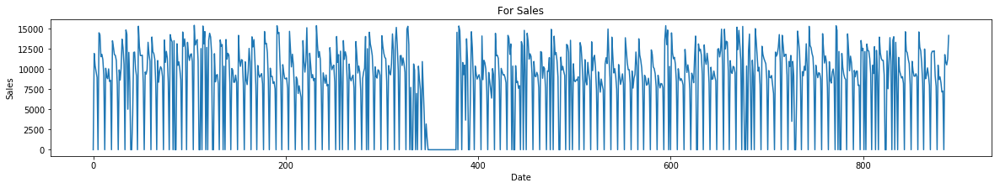

In [565]:
timeseries_visualization(train_df_25['Sales'],'Sales')

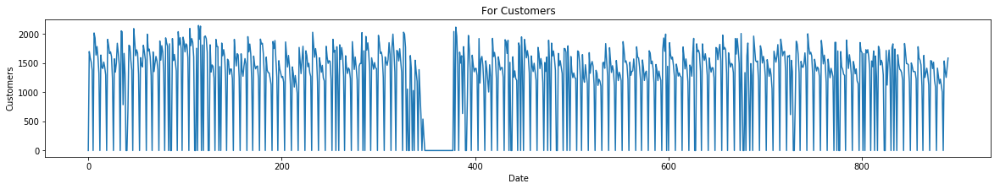

In [566]:
timeseries_visualization(train_df_25['Customers'],'Customers')

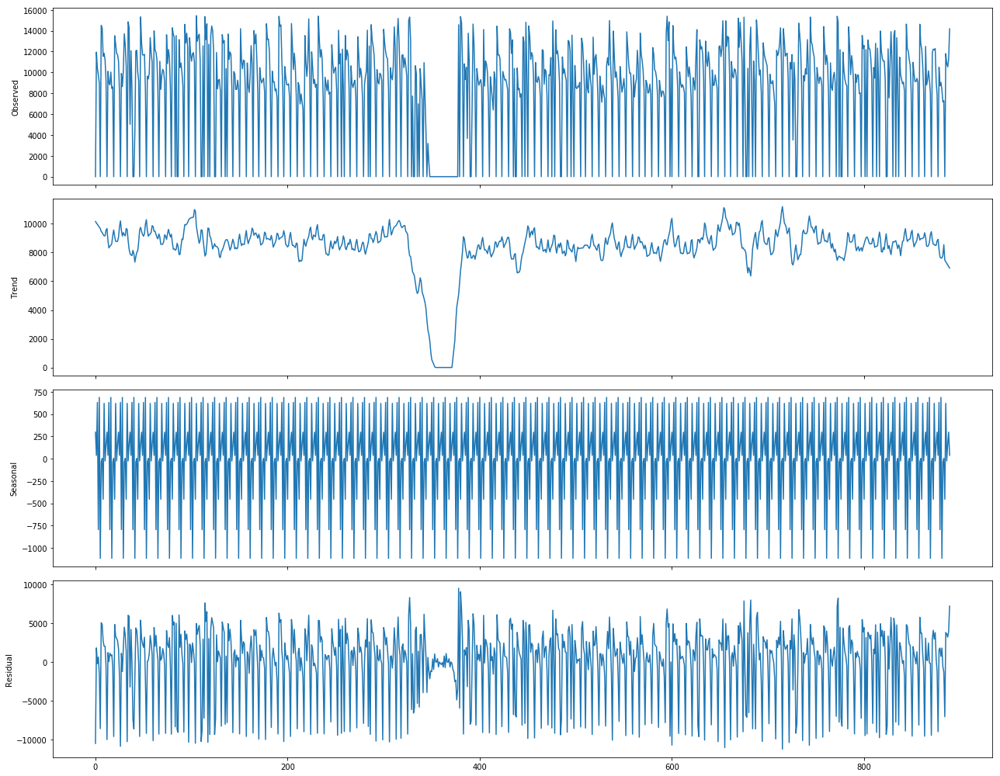

Mean Residual for Sales=7.3295350639106855


In [568]:
plot_seasonal_decomposition_period(train_df_25['Sales'],'Sales','additive')

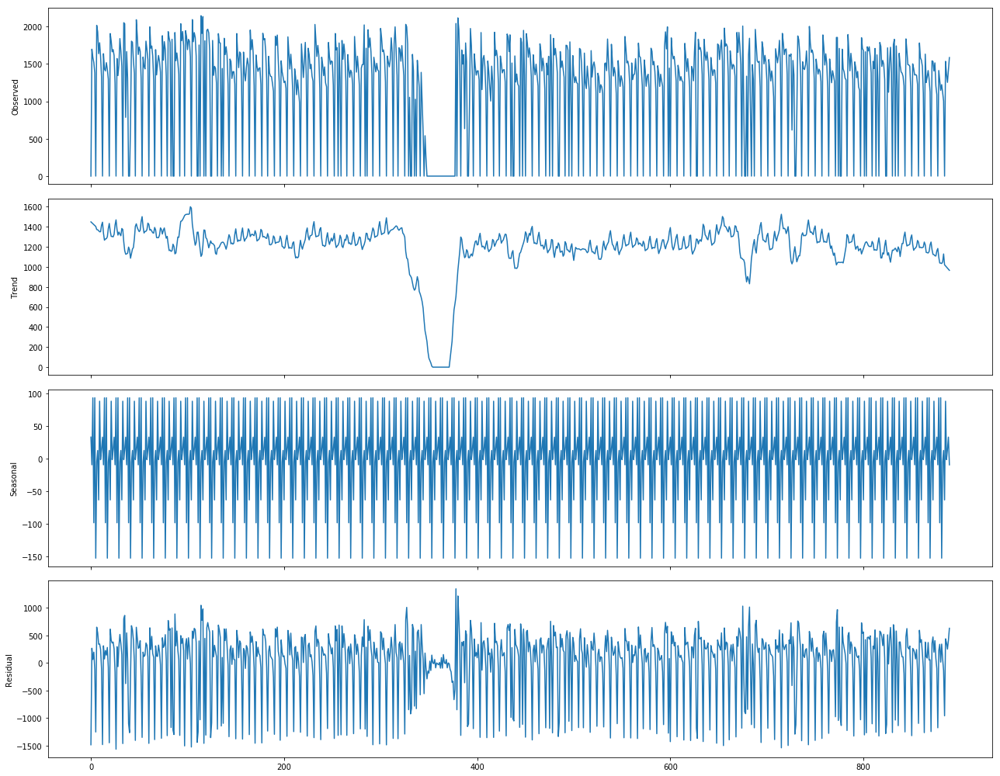

Mean Residual for Customers=0.30036728890904973


In [569]:
plot_seasonal_decomposition_period(train_df_25['Customers'],'Customers','additive')

In [570]:
train_df_25[['Sales','Customers']].corr()

,Sales,Customers
Sales,1.000000,0.990283
Customers,0.990283,1.000000


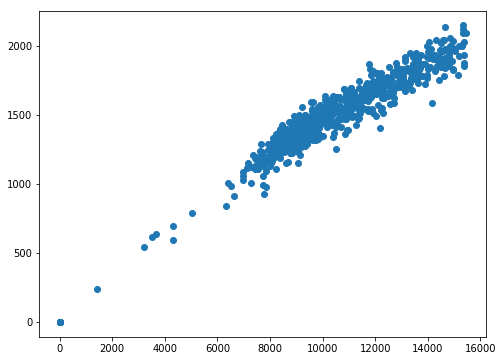

In [571]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_25['Sales'],train_df_25['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.
### Causality testing¶

In [572]:
causality_sales=grangercausalitytests(train_df_25[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.8834 , p=0.0000  , df_denom=886, df_num=1
ssr based chi2 test:   chi2=25.9711 , p=0.0000  , df=1
likelihood ratio test: chi2=25.5990 , p=0.0000  , df=1
parameter F test:         F=25.8834 , p=0.0000  , df_denom=886, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=16.5002 , p=0.0000  , df_denom=883, df_num=2
ssr based chi2 test:   chi2=33.1872 , p=0.0000  , df=2
likelihood ratio test: chi2=32.5820 , p=0.0000  , df=2
parameter F test:         F=16.5002 , p=0.0000  , df_denom=883, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=11.2301 , p=0.0000  , df_denom=880, df_num=3
ssr based chi2 test:   chi2=33.9583 , p=0.0000  , df=3
likelihood ratio test: chi2=33.3244 , p=0.0000  , df=3
parameter F test:         F=11.2301 , p=0.0000  , df_denom=880, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=11.9460 , p=0.0000  

In [573]:
causality_customers=grangercausalitytests(train_df_25[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.9843  , p=0.0028  , df_denom=886, df_num=1
ssr based chi2 test:   chi2=9.0148  , p=0.0027  , df=1
likelihood ratio test: chi2=8.9694  , p=0.0027  , df=1
parameter F test:         F=8.9843  , p=0.0028  , df_denom=886, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.3481  , p=0.0001  , df_denom=883, df_num=2
ssr based chi2 test:   chi2=18.8021 , p=0.0001  , df=2
likelihood ratio test: chi2=18.6058 , p=0.0001  , df=2
parameter F test:         F=9.3481  , p=0.0001  , df_denom=883, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.6657  , p=0.0002  , df_denom=880, df_num=3
ssr based chi2 test:   chi2=20.1562 , p=0.0002  , df=3
likelihood ratio test: chi2=19.9306 , p=0.0002  , df=3
parameter F test:         F=6.6657  , p=0.0002  , df_denom=880, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.9944  , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.
### Testing for stationary

In [574]:
stationary_test(train_df_25[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -3.5736821092451785
P value= 0.0062845671589418705
 => P-Value = 0.0063. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -3.769011529072324
P value= 0.0032407653665474947
 => P-Value = 0.0032. Rejecting Null Hypothesis.
 => Series is Stationary.


#### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
#### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).
#### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.
### Autocoorelation and degree of integration

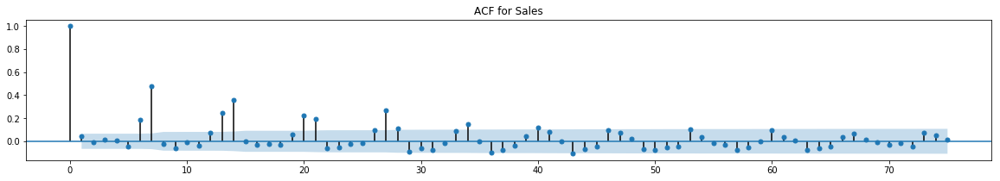

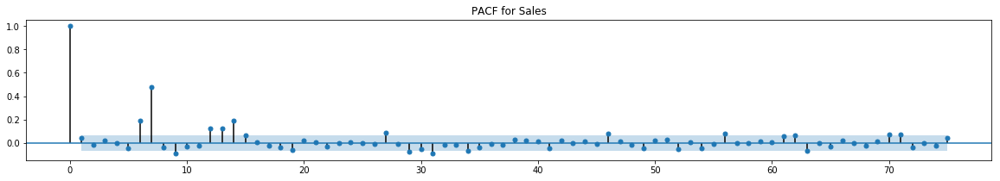

In [575]:
plot_acf_pacf(train_df_25['Sales'],'Sales')

From ACF plot , we can find q=27 after which autocorrelation dies down. But this value will overft the model. So we will go with 14.
From PACF plot , p=7.

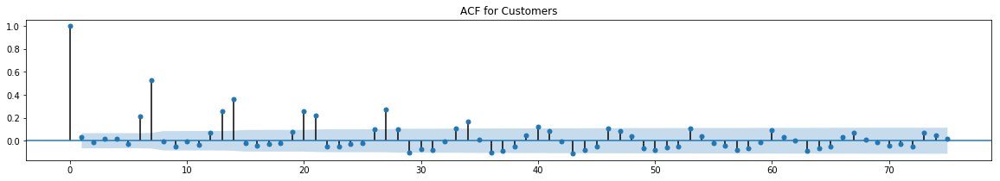

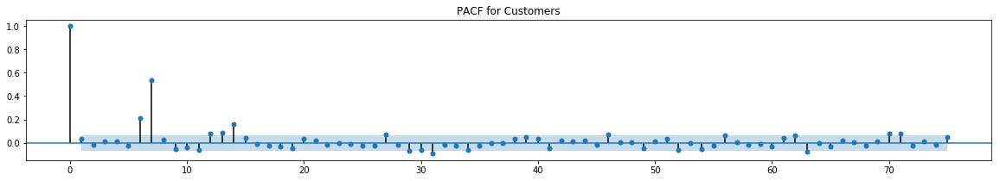

In [576]:
plot_acf_pacf(train_df_25['Customers'],'Customers')

#### Same as Sales

### Train and Test split

In [577]:
train_df_25.shape

(890, 14)

In [578]:
train_len = 890-42
train_df_25_train=train_df_25.iloc[:train_len,:]
train_df_25_test=train_df_25.iloc[train_len:,:]

### Standardize Sales Customers

In [579]:
train_df_25_train[['Sales','Customers']]=scaler.fit_transform(train_df_25_train[['Sales','Customers']])
train_df_25_train.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,25,0.000000,0.000000,0,1,430.0,3564,1,0,0,0,0,0
1,2013-01-02,25,0.773575,0.791240,0,1,430.0,3565,0,1,0,0,0,0
2,2013-01-03,25,0.674158,0.739515,0,1,430.0,3566,0,0,1,0,0,0
3,2013-01-04,25,0.630117,0.708295,0,1,430.0,3567,0,0,0,1,0,0
4,2013-01-05,25,0.582060,0.643523,0,0,430.0,3568,0,0,0,0,1,0


In [580]:
#For test data
train_df_25_test[['Sales','Customers']]=scaler.transform(train_df_25_test[['Sales','Customers']])
train_df_25_test.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
848,2015-06-19,25,0.691645,0.684995,1,0,430.0,4463,0,0,0,1,0,0
849,2015-06-20,25,0.522474,0.544268,0,0,430.0,4464,0,0,0,0,1,0
850,2015-06-21,25,0.000000,0.000000,0,0,430.0,4465,0,0,0,0,0,1
851,2015-06-22,25,0.710622,0.699907,0,0,430.0,4466,0,0,0,0,0,0
852,2015-06-23,25,0.633938,0.670550,0,0,430.0,4467,1,0,0,0,0,0


### VAR¶

In [581]:
exog = train_df_25_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_25_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -9.944      -9.842   4.803e-05      -9.905
1       -10.19      -10.07   3.740e-05      -10.15
2       -10.24      -10.09   3.569e-05      -10.18
3       -10.28     -10.11*   3.433e-05      -10.21
4       -10.29      -10.10   3.389e-05      -10.22
5       -10.30      -10.08   3.375e-05      -10.21
6       -10.33      -10.09   3.257e-05      -10.24
7       -10.37      -10.11   3.145e-05     -10.27*
8       -10.36      -10.08   3.160e-05      -10.25
9       -10.36      -10.05   3.171e-05      -10.24
10      -10.36      -10.04   3.153e-05      -10.24
11      -10.36      -10.01   3.157e-05      -10.23
12     -10.37*      -9.999  3.126e-05*      -10.23
13      -10.37      -9.971   3.143e-05      -10.22
14      -10.37      -9.949   3.141e-05      -10.21
15      -10.37      -9.924   3.148e-05      -10.20
-------------------------------

#### In the above output, the AIC drops to lowest at lag 7, then increases at lag 8.Let’s go with the lag 7

In [582]:
var_model_final = var_model.fit(7)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     15:13:35
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -10.1133
Nobs:                     841.000    HQIC:                  -10.2731
Log likelihood:           2020.90    FPE:                3.12879e-05
AIC:                     -10.3723    Det(Omega_mle):     2.96443e-05
--------------------------------------------------------------------
Results for equation Sales
                  coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------
const                0.200611         0.038414            5.222           0.000
exog0                0.155896         0.019924            7.825           0.000
exog1               -0.002887         0.018637           -0.155 

#### From here we found the lap(p) as 7. Perform Johansen test with P=7-1

In [583]:
train_df_25['Sales']=train_df_25['Sales'].apply(lambda x:round(x))
train_df_25['Customers']=train_df_25['Customers'].apply(lambda x:round(x))

In [584]:
cointegration_test(train_df_25[['Sales','Customers']],6)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  131.56    > 12.3212   =>   True
Customers ::  1.21      > 4.1296    =>   False


In [585]:
rank_result=select_coint_rank(train_df_25[['Sales','Customers']],-1,6)

In [586]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
#### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.
#### Before that let's forecast and evaluate VAR model¶

In [587]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_25_train[['Sales','Customers']].values[-lag_order:]
forecast_input

7


array([[0.5871114 , 0.6220876 ],
       [0.53335492, 0.56337372],
       [0.        , 0.        ],
       [0.94812176, 0.8555452 ],
       [0.79520725, 0.78285182],
       [0.77862694, 0.69524697],
       [0.72752591, 0.69338304]])

In [588]:
exog_test = train_df_25_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_25_test.index, columns=['Sales','Customers'])
var_forecast.head()

,Sales,Customers
848,0.717516,0.696122
849,0.533855,0.554181
850,0.009151,0.018798
851,0.625259,0.666907
852,0.617074,0.678398


In [589]:
train_df_25_test['VarForecastedSales']=var_forecast.Sales
train_df_25_test['VarForecastedCustomers']=var_forecast.Customers

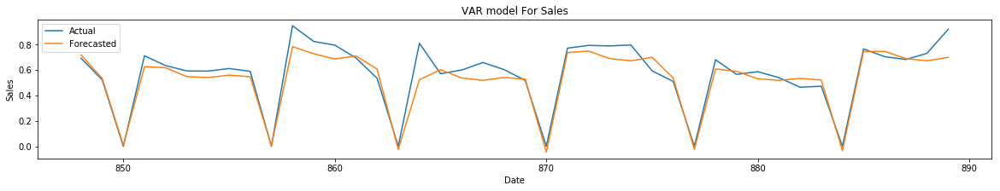

In [590]:
forecasted_timeseries_visualization(train_df_25_test['Sales'],train_df_25_test['VarForecastedSales'],'Sales','VAR')

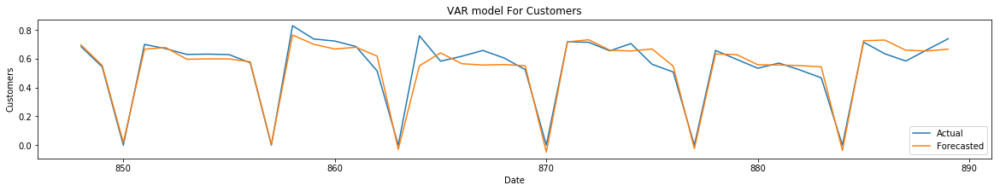

In [591]:
forecasted_timeseries_visualization(train_df_25_test['Customers'],train_df_25_test['VarForecastedCustomers'],'Customers','VAR')

In [592]:
train_df_25_test_temp=train_df_25_test.loc[(train_df_25_test.Sales!=0) & (train_df_25_test.Customers!=0),:]
d=summary(train_df_25_test_temp['Sales'], train_df_25_test_temp['VarForecastedSales'],
       train_df_25_test_temp['Customers'], train_df_25_test_temp['VarForecastedCustomers'],'Store-25','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head(25)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### VARMAX
#### From above PACF and ACF plot we found, p=7 and q=14.

In [593]:
%%time
exog = train_df_25_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_25_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,14),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  848
Model:                       VARMAX(7,14)   Log Likelihood                1895.725
                              + intercept   AIC                          -3581.449
Date:                    Mon, 05 Apr 2021   BIC                          -3083.447
Time:                            15:24:55   HQIC                         -3390.667
Sample:                                 0                                         
                                    - 848                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                44.67, 40.22   Jarque-Bera (JB):        493.08, 62.87
Prob(Q):                        0.28, 0.46   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.08, 1.00   Skew:                     -0.99, -0.38
P

In [594]:
exog_test = train_df_25_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_25_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_25_test.index.min(),end=train_df_25_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_25_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
848,0.802239,0.774817
849,0.583234,0.594766
850,0.070787,0.068342
851,0.608465,0.632502
852,0.491984,0.545513


In [595]:
train_df_25_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_25_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

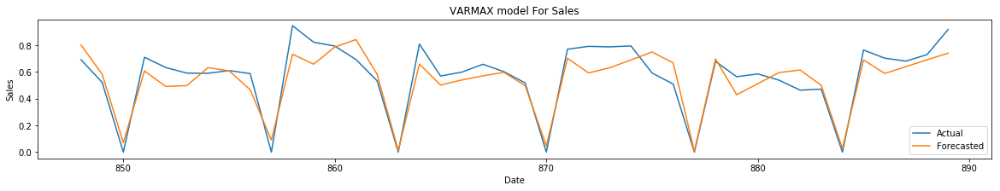

In [596]:
forecasted_timeseries_visualization(train_df_25_test['Sales'],train_df_25_test['VarmaxForecastedSales'],'Sales','VARMAX')

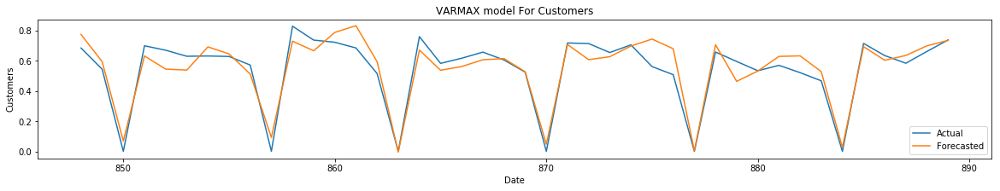

In [597]:
forecasted_timeseries_visualization(train_df_25_test['Customers'],train_df_25_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [598]:
train_df_25_test_temp=train_df_25_test.loc[(train_df_25_test.Sales!=0) & (train_df_25_test.Customers!=0),:]
d=summary(train_df_25_test_temp['Sales'], train_df_25_test_temp['VarmaxForecastedSales'],
       train_df_25_test_temp['Customers'], train_df_25_test_temp['VarmaxForecastedCustomers'],'Store-25','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(25)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### ARIMA¶

In [599]:
%%time

#With exogenous and for sale
exog = train_df_25_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_25_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,6),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  848
Model:                     ARMA(7, 6)   Log Likelihood                 256.706
Method:                       css-mle   S.D. of innovations              0.179
Date:                Mon, 05 Apr 2021   AIC                           -467.413
Time:                        15:26:39   BIC                           -358.327
Sample:                             0   HQIC                          -425.622
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.6133      0.031     19.513      0.000       0.552       0.675
Promo             0.1678      0.013     12.475      0.000       0.141       0.194
SchoolHoliday    -0.0297      0.023     

In [600]:
exog_test = train_df_25_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_25_test.index.min(),end=train_df_25_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_25_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
848,0.725191
849,0.612269
850,0.044133
851,0.673290
852,0.668831


In [601]:
train_df_25_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [602]:
exog = train_df_25_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_25_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,6),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  848
Model:                     ARMA(7, 6)   Log Likelihood                 277.622
Method:                       css-mle   S.D. of innovations              0.174
Date:                Mon, 05 Apr 2021   AIC                           -509.245
Time:                        15:28:05   BIC                           -400.159
Sample:                             0   HQIC                          -467.454
                                                                              
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.6543      0.033     19.701      0.000       0.589       0.719
Promo               0.1116      0.013      8.713      0.000       0.086       0.137
SchoolHoliday      -0.0526      

In [603]:
arimax_customers = arimax_model_fit.predict(start=train_df_25_test.index.min(),end=train_df_25_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_25_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
848,0.719136
849,0.631904
850,0.010903
851,0.665776
852,0.677213


In [604]:
train_df_25_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

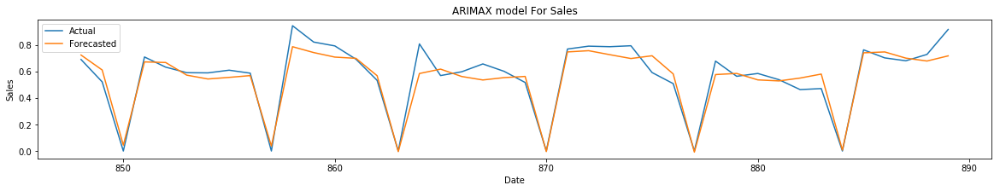

In [605]:
forecasted_timeseries_visualization(train_df_25_test['Sales'],train_df_25_test['ArimaxForecastedSales'],'Sales','ARIMAX')

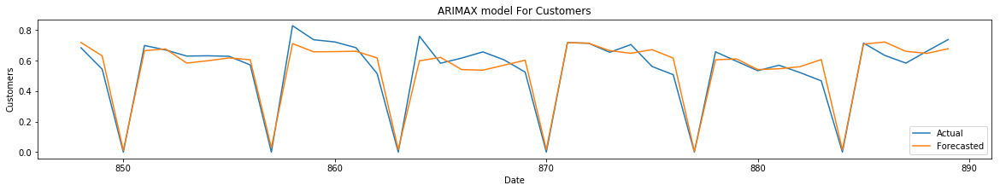

In [606]:
forecasted_timeseries_visualization(train_df_25_test['Customers'],train_df_25_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [607]:
train_df_25_test_temp=train_df_25_test.loc[(train_df_25_test.Sales!=0) & (train_df_25_test.Customers!=0),:]
d=summary(train_df_25_test_temp['Sales'], train_df_25_test_temp['ArimaxForecastedSales'],
       train_df_25_test_temp['Customers'], train_df_25_test_temp['ArimaxForecastedCustomes'],'Store-25','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [608]:
%%time

#Without exogenous and for sale
exog = train_df_25_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_25_train[['Sales']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())


                                 Statespace Model Results                                 
Dep. Variable:                              Sales   No. Observations:                  848
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 236.536
Date:                            Mon, 05 Apr 2021   AIC                           -427.072
Time:                                    15:33:46   BIC                           -317.986
Sample:                                         0   HQIC                          -385.282
                                            - 848                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1669      0.014     11.879      0.000       0.139       0.194
SchoolHoliday    -0.0324  

In [609]:
sarimax_sales = sarima_model_fit.predict(start=train_df_25_test.index.min(),end=train_df_25_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_sales, index=train_df_25_test.index, columns=['Sales'])
sarimax_forecast.head()

,Sales
848,0.723879
849,0.628632
850,0.026417
851,0.662851
852,0.647011


In [610]:
train_df_25_test['SarimaxForecastedSales']=sarimax_forecast.Sales

In [611]:
%%time

#Without exogenous and for sale
exog = train_df_25_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_25_train[['Customers']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                          Customers   No. Observations:                  848
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 260.779
Date:                            Mon, 05 Apr 2021   AIC                           -475.557
Time:                                    15:38:42   BIC                           -366.471
Sample:                                         0   HQIC                          -433.767
                                            - 848                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1120      0.014      8.146      0.000       0.085       0.139
SchoolHoliday    -0.0524  

In [612]:
sarimax_customers = sarima_model_fit.predict(start=train_df_25_test.index.min(),end=train_df_25_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_customers, index=train_df_25_test.index, columns=['Customers'])
sarimax_forecast.head()

,Customers
848,0.686243
849,0.632496
850,-0.004753
851,0.668588
852,0.666427


In [613]:
train_df_25_test['SarimaxForecastedCustomers']=sarimax_forecast.Customers


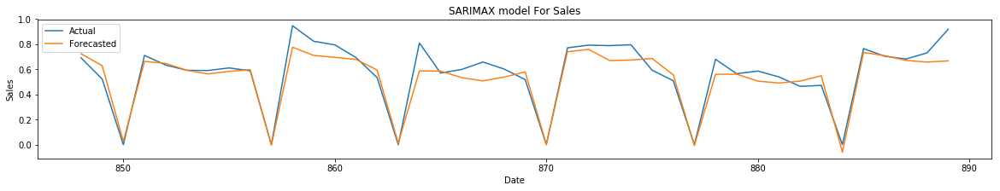

In [614]:
forecasted_timeseries_visualization(train_df_25_test['Sales'],train_df_25_test['SarimaxForecastedSales'],'Sales','SARIMAX')

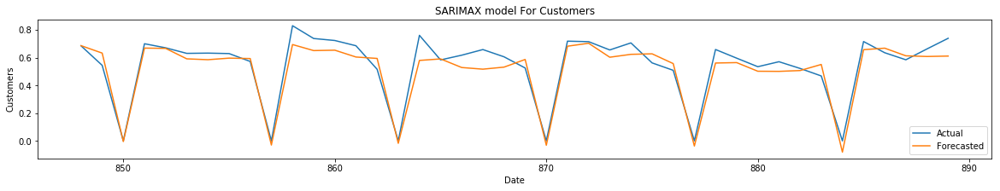

In [615]:
forecasted_timeseries_visualization(train_df_25_test['Customers'],train_df_25_test['SarimaxForecastedCustomers'],'Customers','SARIMAX')

In [616]:
train_df_25_test_temp=train_df_25_test.loc[(train_df_25_test.Sales!=0) & (train_df_25_test.Customers!=0),:]
d=summary(train_df_25_test_temp['Sales'], train_df_25_test_temp['SarimaxForecastedSales'],
       train_df_25_test_temp['Customers'], train_df_25_test_temp['SarimaxForecastedCustomers'],'Store-25','SARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(50)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [617]:
train_df_29=train_df.loc[train_df.Store==29,:]

In [618]:
train_df_29.shape

(941, 13)

In [619]:
pd.date_range(start = train_df_29.index.min(), end = train_df_29.index.max() ).difference(train_df_29.index)

DatetimeIndex(['2013-12-16'], dtype='datetime64[ns]', freq=None)

In [620]:
train_df_29=train_df_29.reset_index()
train_df_29.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,29,0,0,0,1,2170.0,3651,1,0,0,0,0,0
1,2013-01-02,29,5269,550,0,1,2170.0,3652,0,1,0,0,0,0
2,2013-01-03,29,4554,456,0,1,2170.0,3653,0,0,1,0,0,0
3,2013-01-04,29,5411,505,0,1,2170.0,3654,0,0,0,1,0,0
4,2013-01-05,29,5564,537,0,0,2170.0,3655,0,0,0,0,1,0


### Time Series Visualization

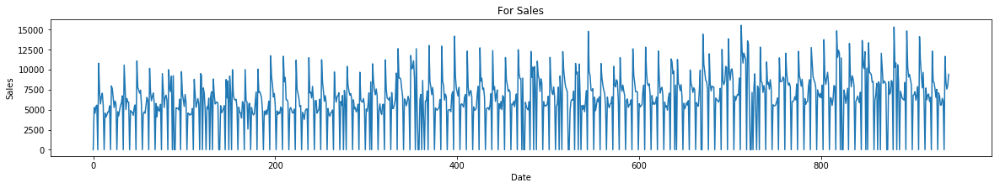

In [621]:
timeseries_visualization(train_df_29['Sales'],'Sales')

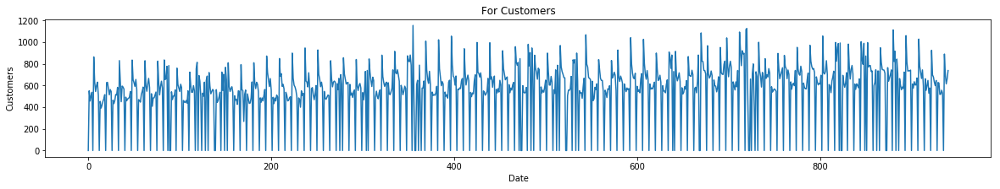

In [622]:
timeseries_visualization(train_df_29['Customers'],'Customers')

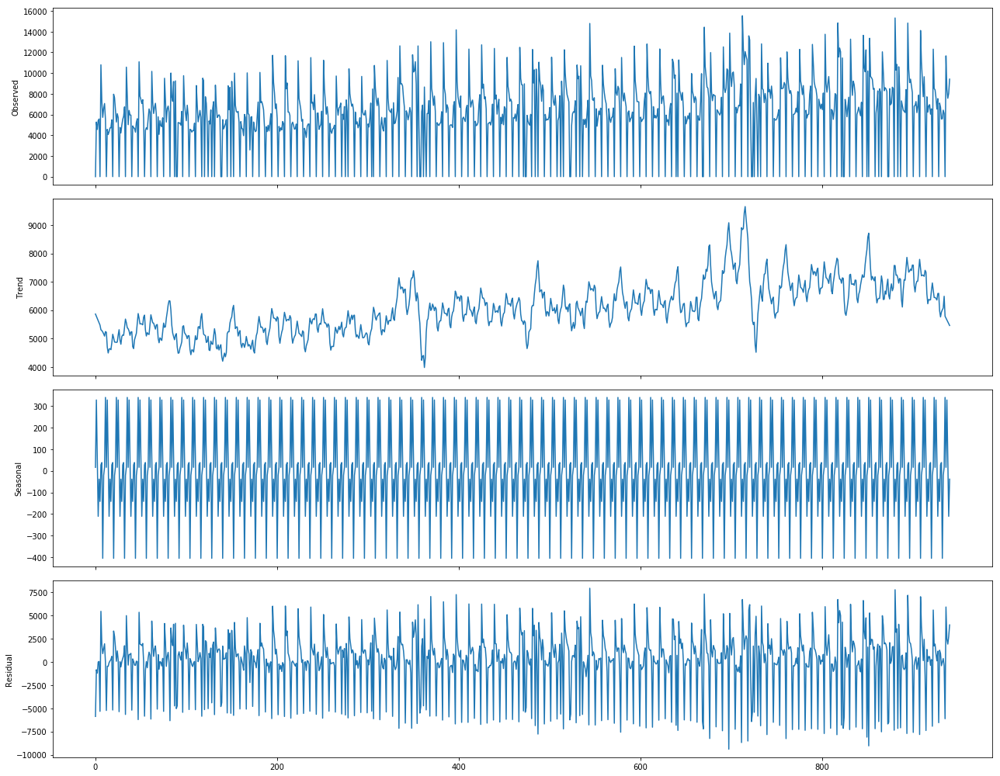

Mean Residual for Sales=4.124506600592721


In [626]:
plot_seasonal_decomposition_period(train_df_29['Sales'],'Sales','additive')

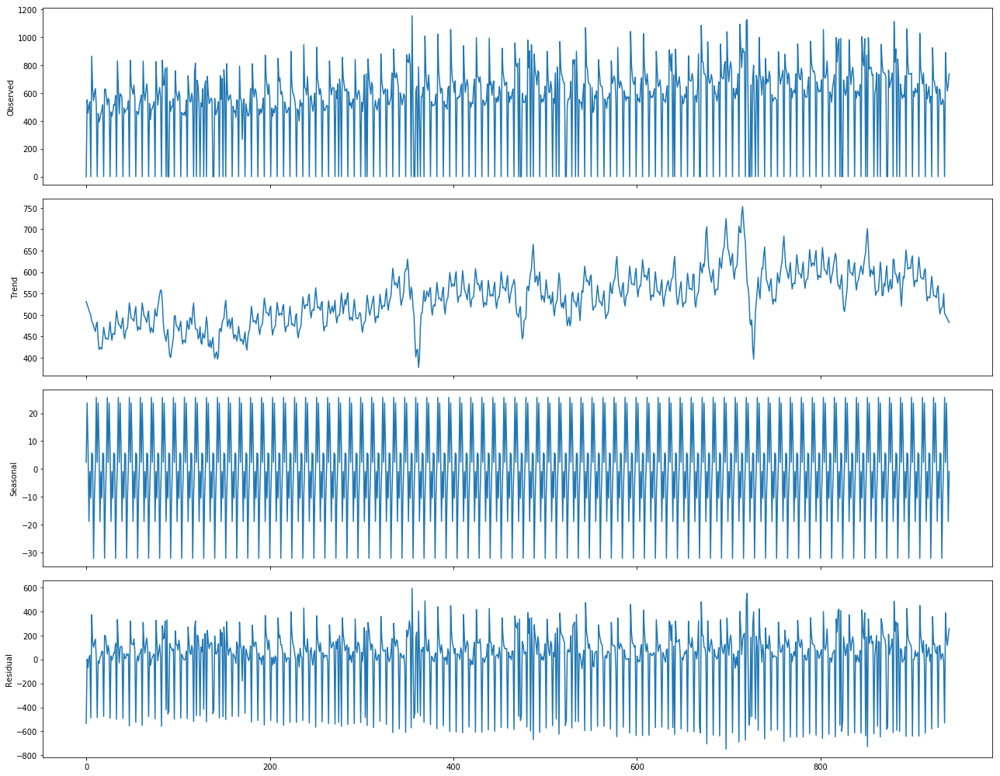

Mean Residual for Customers=0.13138900996691943


In [627]:
plot_seasonal_decomposition_period(train_df_29['Customers'],'Customers','additive')

In [628]:
train_df_29[['Sales','Customers']].corr()

,Sales,Customers
Sales,1.000000,0.982023
Customers,0.982023,1.000000


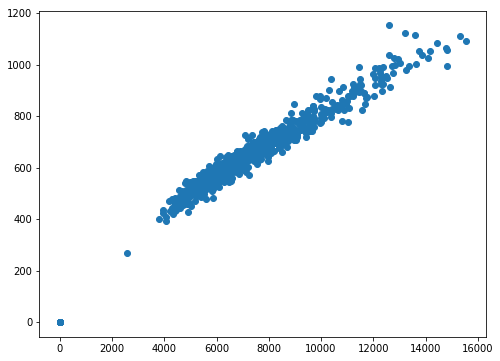

In [629]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_29['Sales'],train_df_29['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.
### Causality testing¶

In [630]:
causality_sales=grangercausalitytests(train_df_29[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=329.0116, p=0.0000  , df_denom=937, df_num=1
ssr based chi2 test:   chi2=330.0650, p=0.0000  , df=1
likelihood ratio test: chi2=282.8869, p=0.0000  , df=1
parameter F test:         F=329.0116, p=0.0000  , df_denom=937, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=190.3376, p=0.0000  , df_denom=934, df_num=2
ssr based chi2 test:   chi2=382.7132, p=0.0000  , df=2
likelihood ratio test: chi2=321.0146, p=0.0000  , df=2
parameter F test:         F=190.3376, p=0.0000  , df_denom=934, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=127.7679, p=0.0000  , df_denom=931, df_num=3
ssr based chi2 test:   chi2=386.1855, p=0.0000  , df=3
likelihood ratio test: chi2=323.4251, p=0.0000  , df=3
parameter F test:         F=127.7679, p=0.0000  , df_denom=931, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=95.7491 , p=0.0000  

In [631]:
causality_customers=grangercausalitytests(train_df_29[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=194.9060, p=0.0000  , df_denom=937, df_num=1
ssr based chi2 test:   chi2=195.5300, p=0.0000  , df=1
likelihood ratio test: chi2=177.6364, p=0.0000  , df=1
parameter F test:         F=194.9060, p=0.0000  , df_denom=937, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=115.4865, p=0.0000  , df_denom=934, df_num=2
ssr based chi2 test:   chi2=232.2094, p=0.0000  , df=2
likelihood ratio test: chi2=207.4971, p=0.0000  , df=2
parameter F test:         F=115.4865, p=0.0000  , df_denom=934, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=82.8976 , p=0.0000  , df_denom=931, df_num=3
ssr based chi2 test:   chi2=250.5627, p=0.0000  , df=3
likelihood ratio test: chi2=222.0716, p=0.0000  , df=3
parameter F test:         F=82.8976 , p=0.0000  , df_denom=931, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=62.3656 , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.
### Testing for stationary¶

In [632]:
stationary_test(train_df_29[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -3.41066119481731
P value= 0.010600757034732781
 => P-Value = 0.0106. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -3.524407833593021
P value= 0.007381934445725002
 => P-Value = 0.0074. Rejecting Null Hypothesis.
 => Series is Stationary.


#### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
#### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).
#### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.
### Autocoorelation and degree of integration¶

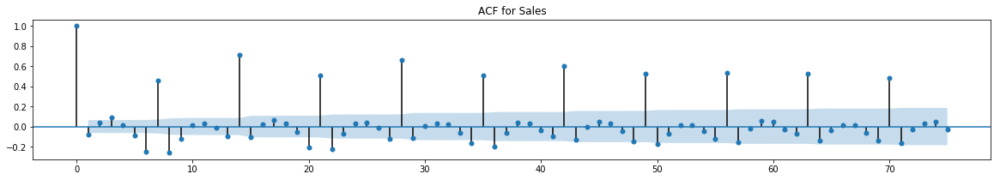

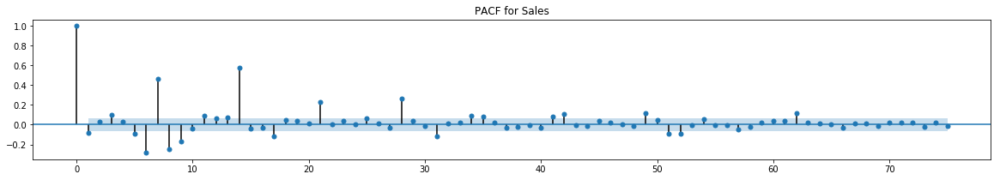

In [633]:
plot_acf_pacf(train_df_29['Sales'],'Sales')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=27, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 27 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 14 as p which is the last highest value.

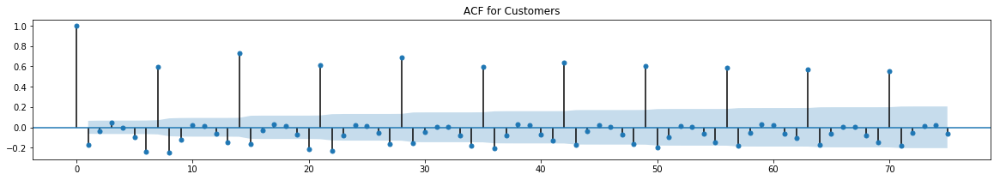

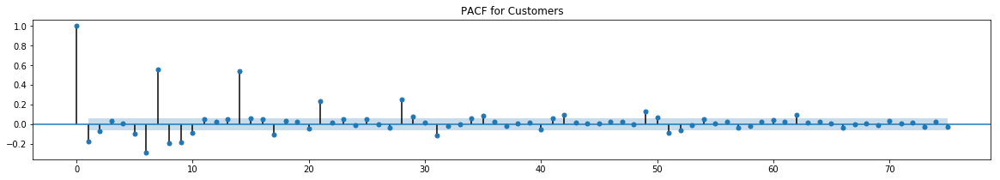

In [634]:
plot_acf_pacf(train_df_29['Customers'],'Customers')

#### Same as Sales

### Train and Test split

In [635]:
train_len = train_df_29.shape[0]-42
train_df_29_train=train_df_29.iloc[:train_len,:]
train_df_29_test=train_df_29.iloc[train_len:,:]

### Standardize Sales Customers

In [636]:
train_df_29_train[['Sales','Customers']]=scaler.fit_transform(train_df_29_train[['Sales','Customers']])
train_df_29_train.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,29,0.000000,0.000000,0,1,2170.0,3651,1,0,0,0,0,0
1,2013-01-02,29,0.339279,0.477016,0,1,2170.0,3652,0,1,0,0,0,0
2,2013-01-03,29,0.293239,0.395490,0,1,2170.0,3653,0,0,1,0,0,0
3,2013-01-04,29,0.348422,0.437988,0,1,2170.0,3654,0,0,0,1,0,0
4,2013-01-05,29,0.358274,0.465742,0,0,2170.0,3655,0,0,0,0,1,0


In [637]:
#For test data
train_df_29_test[['Sales','Customers']]=scaler.transform(train_df_29_test[['Sales','Customers']])
train_df_29_test.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
899,2015-06-20,29,0.522666,0.642671,0,0,2170.0,4551,0,0,0,0,1,0
900,2015-06-21,29,0.000000,0.000000,0,0,2170.0,4552,0,0,0,0,0,1
901,2015-06-22,29,0.437733,0.531657,0,0,2170.0,4553,0,0,0,0,0,0
902,2015-06-23,29,0.442692,0.498699,0,0,2170.0,4554,1,0,0,0,0,0
903,2015-06-24,29,0.466903,0.549870,0,0,2170.0,4555,0,1,0,0,0,0


### VAR¶

In [638]:
exog = train_df_29_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_29_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.19      -11.09   1.386e-05      -11.15
1       -11.26      -11.14   1.289e-05      -11.21
2       -11.26      -11.12   1.289e-05      -11.21
3       -11.26      -11.10   1.283e-05      -11.20
4       -11.26      -11.08   1.283e-05      -11.19
5       -11.27      -11.06   1.276e-05      -11.19
6       -11.28      -11.05   1.260e-05      -11.20
7       -11.29      -11.04   1.249e-05      -11.20
8       -11.38      -11.11   1.139e-05      -11.28
9       -11.43      -11.13   1.090e-05      -11.32
10      -11.48     -11.16*   1.038e-05      -11.36
11      -11.49      -11.16   1.021e-05      -11.36
12      -11.49      -11.13   1.022e-05      -11.35
13      -11.50      -11.12   1.010e-05      -11.36
14     -11.54*      -11.14  9.687e-06*     -11.39*
15      -11.54      -11.12   9.692e-06      -11.38
-------------------------------

#### In the above output, the AIC drops to lowest at lag 14, then same at lag 15 .Let’s go with the lag 14.

In [639]:
var_model_final = var_model.fit(14)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     15:40:17
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.1439
Nobs:                     885.000    HQIC:                  -11.3911
Log likelihood:           2670.72    FPE:                9.69458e-06
AIC:                     -11.5440    Det(Omega_mle):     8.93210e-06
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.165734         0.053769            3.082           0.002
exog0                 0.209995         0.015442           13.599           0.000
exog1                -0.027986         0.010087           -2

#### From here we found the lap(p) as 14. Perform Johansen test with P=14-1

In [640]:
train_df_29['Sales']=train_df_29['Sales'].apply(lambda x:round(x))
train_df_29['Customers']=train_df_29['Customers'].apply(lambda x:round(x))

In [641]:
cointegration_test(train_df_29[['Sales','Customers']],13)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  20.15     > 12.3212   =>   True
Customers ::  0.12      > 4.1296    =>   False


In [642]:
rank_result=select_coint_rank(train_df_29[['Sales','Customers']],-1,13)

In [643]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
#### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.
#### Before that let's forecast and evaluate VAR model¶

In [644]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_29_train[['Sales','Customers']].values[-lag_order:]
forecast_input

14


array([[0.54050225, 0.61491761],
       [0.        , 0.        ],
       [0.47102382, 0.57502168],
       [0.44140373, 0.52211622],
       [0.41326465, 0.48568951],
       [0.40598841, 0.50737207],
       [0.39871217, 0.49609714],
       [0.54140373, 0.62705984],
       [0.        , 0.        ],
       [0.95447521, 0.91847355],
       [0.66806182, 0.70511709],
       [0.58435287, 0.63486557],
       [0.60579524, 0.63833478],
       [0.56316806, 0.63746748]])

In [645]:
exog_test = train_df_29_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_29_test.index, columns=['Sales','Customers'])
var_forecast.head()

,Sales,Customers
899,0.546620,0.644382
900,0.036008,0.024804
901,0.391777,0.484987
902,0.429727,0.526840
903,0.409247,0.503200


In [646]:
train_df_29_test['VarForecastedSales']=var_forecast.Sales
train_df_29_test['VarForecastedCustomers']=var_forecast.Customers

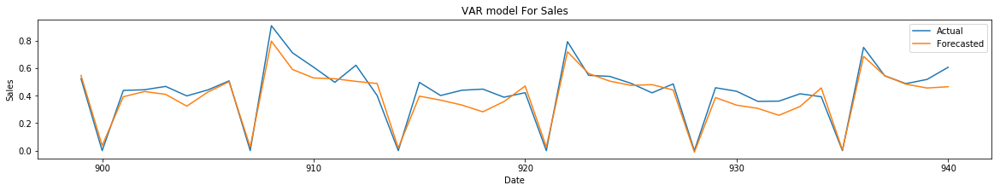

In [647]:
forecasted_timeseries_visualization(train_df_29_test['Sales'],train_df_29_test['VarForecastedSales'],'Sales','VAR')

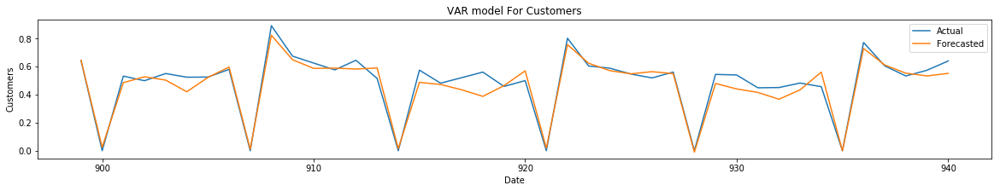

In [648]:
forecasted_timeseries_visualization(train_df_29_test['Customers'],train_df_29_test['VarForecastedCustomers'],'Customers','VAR')

In [649]:
train_df_29_test_temp=train_df_29_test.loc[(train_df_29_test.Sales!=0) & (train_df_29_test.Customers!=0),:]
d=summary(train_df_29_test_temp['Sales'], train_df_29_test_temp['VarForecastedSales'],
       train_df_29_test_temp['Customers'], train_df_29_test_temp['VarForecastedCustomers'],'Store-29','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head(30)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### VARMAX
#### From above PACF and ACF plot we found, p=14 and q=0.

In [650]:
%%time
exog = train_df_29_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_29_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(14,0), exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  899
Model:                           VARX(14)   Log Likelihood                2544.957
                              + intercept   AIC                          -4935.914
Date:                    Mon, 05 Apr 2021   BIC                          -4566.215
Time:                            15:45:10   HQIC                         -4794.679
Sample:                                 0                                         
                                    - 899                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                91.99, 62.28   Jarque-Bera (JB):      1103.74, 201.07
Prob(Q):                        0.00, 0.01   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.89, 1.79   Skew:                     -0.81, -0.69
P

In [652]:
exog_test = train_df_29_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_29_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_29_test.index.min(),end=train_df_29_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_29_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
899,0.548696,0.645256
900,0.025051,0.011648
901,0.425190,0.519655
902,0.399688,0.495010
903,0.407787,0.510326


In [653]:
train_df_29_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_29_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

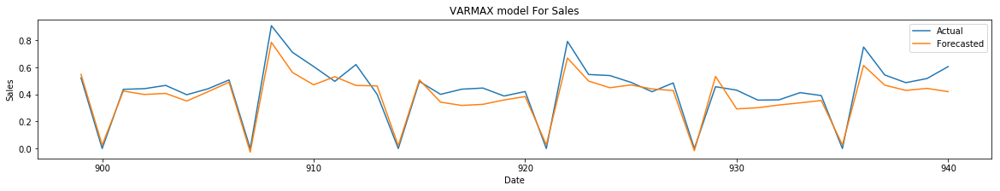

In [654]:
forecasted_timeseries_visualization(train_df_29_test['Sales'],train_df_29_test['VarmaxForecastedSales'],'Sales','VARMAX')

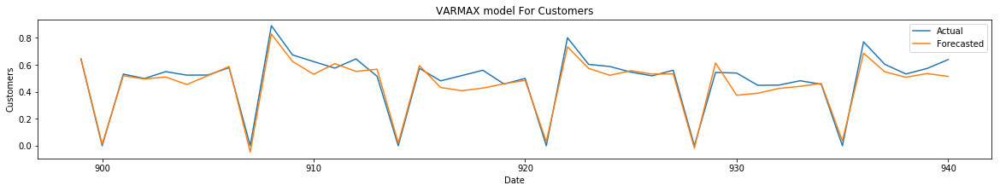

In [655]:
forecasted_timeseries_visualization(train_df_29_test['Customers'],train_df_29_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [656]:
train_df_29_test_temp=train_df_29_test.loc[(train_df_29_test.Sales!=0) & (train_df_29_test.Customers!=0),:]
d=summary(train_df_29_test_temp['Sales'], train_df_29_test_temp['VarmaxForecastedSales'],
       train_df_29_test_temp['Customers'], train_df_29_test_temp['VarmaxForecastedCustomers'],'Store-29','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(30)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### ARIMA

In [657]:
%%time

#With exogenous and for sale
exog = train_df_29_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_29_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(14,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  899
Model:                    ARMA(14, 0)   Log Likelihood                 736.037
Method:                       css-mle   S.D. of innovations              0.107
Date:                Mon, 05 Apr 2021   AIC                          -1424.075
Time:                        15:46:57   BIC                          -1308.844
Sample:                             0   HQIC                         -1380.053
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.4643      0.018     25.335      0.000       0.428       0.500
Promo             0.2049      0.010     20.240      0.000       0.185       0.225
SchoolHoliday    -0.0220      0.011     

In [658]:
exog_test = train_df_29_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_29_test.index.min(),end=train_df_29_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_29_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
899,0.512804
900,0.060550
901,0.495220
902,0.423481
903,0.375794


In [659]:
train_df_29_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [660]:
exog = train_df_29_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_29_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(14,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  899
Model:                    ARMA(14, 0)   Log Likelihood                 674.860
Method:                       css-mle   S.D. of innovations              0.114
Date:                Mon, 05 Apr 2021   AIC                          -1301.719
Time:                        15:48:42   BIC                          -1186.488
Sample:                             0   HQIC                         -1257.698
                                                                              
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.5583      0.017     33.043      0.000       0.525       0.591
Promo                0.1655      0.008     19.837      0.000       0.149       0.182
SchoolHoliday       -0.0383 

In [661]:
arimax_customers = arimax_model_fit.predict(start=train_df_29_test.index.min(),end=train_df_29_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_29_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
899,0.587420
900,0.046217
901,0.593448
902,0.520976
903,0.475037


In [662]:
train_df_29_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

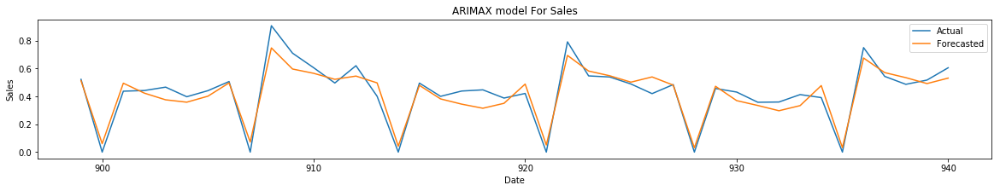

In [663]:
forecasted_timeseries_visualization(train_df_29_test['Sales'],train_df_29_test['ArimaxForecastedSales'],'Sales','ARIMAX')

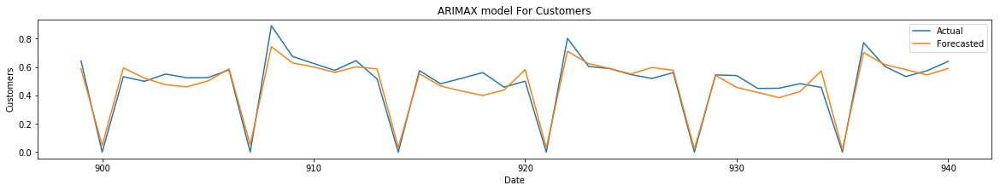

In [664]:
forecasted_timeseries_visualization(train_df_29_test['Customers'],train_df_29_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [665]:
train_df_29_test_temp=train_df_29_test.loc[(train_df_29_test.Sales!=0) & (train_df_29_test.Customers!=0),:]
d=summary(train_df_29_test_temp['Sales'], train_df_29_test_temp['ArimaxForecastedSales'],
       train_df_29_test_temp['Customers'], train_df_29_test_temp['ArimaxForecastedCustomes'],'Store-29','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(15)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [666]:
%%time

#Without exogenous and for sale
exog = train_df_29_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_29_train[['Sales']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())


                                 Statespace Model Results                                 
Dep. Variable:                              Sales   No. Observations:                  899
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 655.605
Date:                            Mon, 05 Apr 2021   AIC                          -1265.210
Time:                                    15:55:02   BIC                          -1154.781
Sample:                                         0   HQIC                         -1223.023
                                            - 899                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1966      0.010     20.674      0.000       0.178       0.215
SchoolHoliday    -0.0031  

In [667]:
sarimax_sales = sarima_model_fit.predict(start=train_df_29_test.index.min(),end=train_df_29_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_sales, index=train_df_29_test.index, columns=['Sales'])
sarimax_forecast.head()


,Sales
899,0.553210
900,0.105729
901,0.553790
902,0.442048
903,0.404050


In [668]:
train_df_29_test['SarimaxForecastedSales']=sarimax_forecast.Sales

In [669]:
%%time

#Without exogenous and for sale
exog = train_df_29_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_29_train[['Customers']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                          Customers   No. Observations:                  899
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 595.675
Date:                            Mon, 05 Apr 2021   AIC                          -1145.350
Time:                                    16:00:40   BIC                          -1034.920
Sample:                                         0   HQIC                         -1103.163
                                            - 899                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1603      0.009     18.193      0.000       0.143       0.178
SchoolHoliday    -0.0064  

In [670]:
sarimax_customers = sarima_model_fit.predict(start=train_df_29_test.index.min(),end=train_df_29_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_customers, index=train_df_29_test.index, columns=['Customers'])
sarimax_forecast.head()


,Customers
899,0.641370
900,0.080667
901,0.630494
902,0.517679
903,0.493161


In [671]:
train_df_29_test['SarimaxForecastedCustomers']=sarimax_forecast.Customers


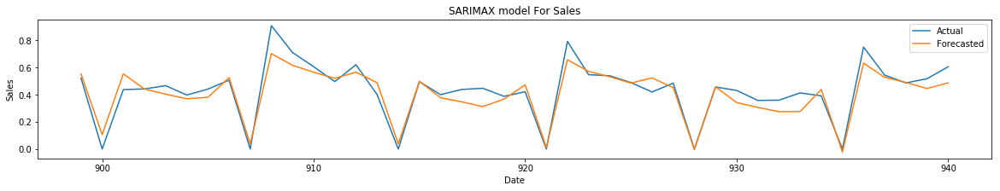

In [672]:
forecasted_timeseries_visualization(train_df_29_test['Sales'],train_df_29_test['SarimaxForecastedSales'],'Sales','SARIMAX')

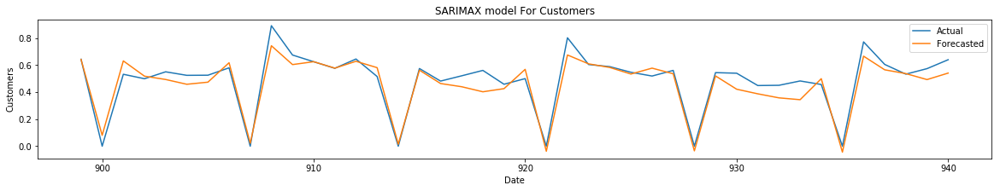

In [673]:
forecasted_timeseries_visualization(train_df_29_test['Customers'],train_df_29_test['SarimaxForecastedCustomers'],'Customers','SARIMAX')

In [674]:
train_df_29_test_temp=train_df_29_test.loc[(train_df_29_test.Sales!=0) & (train_df_29_test.Customers!=0),:]
d=summary(train_df_29_test_temp['Sales'], train_df_29_test_temp['SarimaxForecastedSales'],
       train_df_29_test_temp['Customers'], train_df_29_test_temp['SarimaxForecastedCustomers'],'Store-29','SARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(50)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [675]:
train_df_31=train_df.loc[train_df.Store==31,:]

In [676]:
train_df_31.head(7)

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,31,0,0,0,1,9800.0,185,1,0,0,0,0,0
2013-01-02,31,5122,567,0,1,9800.0,186,0,1,0,0,0,0
2013-01-03,31,5623,578,0,1,9800.0,187,0,0,1,0,0,0
2013-01-04,31,6140,633,0,1,9800.0,188,0,0,0,1,0,0
2013-01-05,31,5607,624,0,0,9800.0,189,0,0,0,0,1,0
2013-01-06,31,0,0,0,0,9800.0,190,0,0,0,0,0,1
2013-01-07,31,7857,743,1,0,9800.0,191,0,0,0,0,0,0


In [677]:
train_df_31.shape

(942, 13)

### Time Series Visualizatin

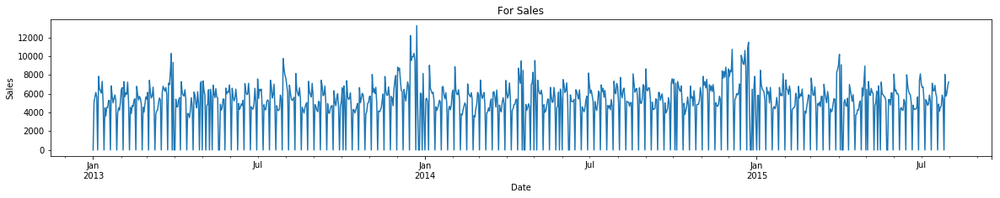

In [678]:
timeseries_visualization(train_df_31['Sales'],'Sales')

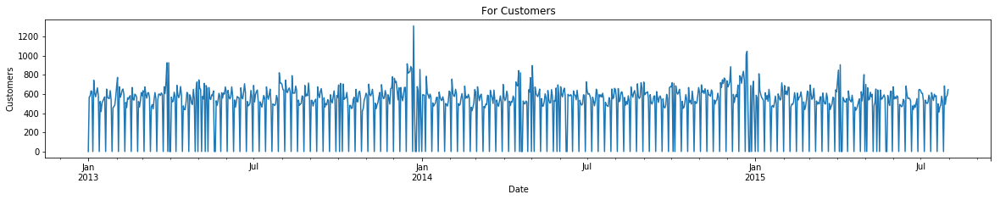

In [679]:
timeseries_visualization(train_df_31['Customers'],'Customers')

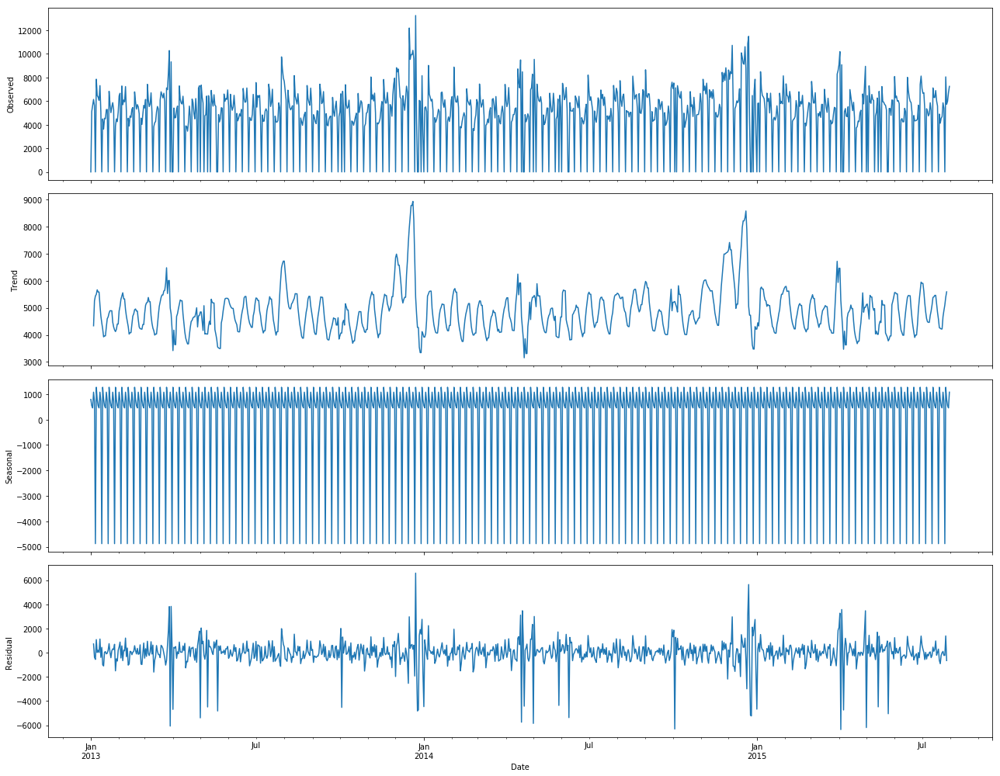

Mean Residual for Sales=0.6498652204684501


In [680]:
plot_seasonal_decomposition(train_df_31['Sales'],'Sales','additive')

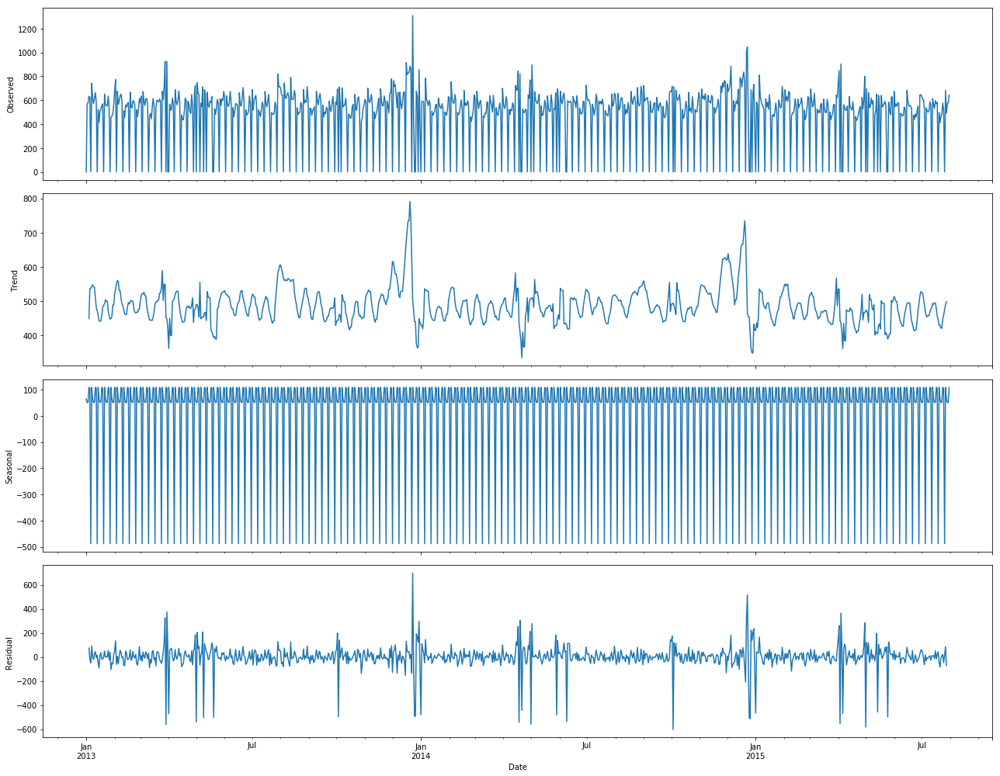

Mean Residual for Customers=0.04850574502053324


In [681]:
plot_seasonal_decomposition(train_df_31['Customers'],'Customers','additive')

In [682]:
train_df_31[['Sales','Customers']].corr()

,Sales,Customers
Sales,1.000000,0.976114
Customers,0.976114,1.000000


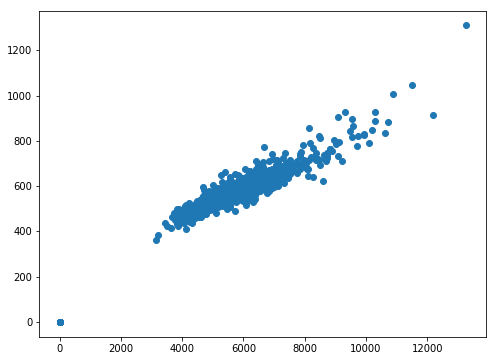

In [683]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_31['Sales'],train_df_31['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.
### Causality testing

In [684]:
causality_sales=grangercausalitytests(train_df_31[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=294.1522, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=295.0929, p=0.0000  , df=1
likelihood ratio test: chi2=256.6744, p=0.0000  , df=1
parameter F test:         F=294.1522, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=168.1779, p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=338.1546, p=0.0000  , df=2
likelihood ratio test: chi2=288.8551, p=0.0000  , df=2
parameter F test:         F=168.1779, p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=115.9229, p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=350.3808, p=0.0000  , df=3
likelihood ratio test: chi2=297.7587, p=0.0000  , df=3
parameter F test:         F=115.9229, p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=93.4017 , p=0.0000  

In [685]:
causality_customers=grangercausalitytests(train_df_31[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=139.7039, p=0.0000  , df_denom=938, df_num=1
ssr based chi2 test:   chi2=140.1507, p=0.0000  , df=1
likelihood ratio test: chi2=130.6466, p=0.0000  , df=1
parameter F test:         F=139.7039, p=0.0000  , df_denom=938, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=77.0941 , p=0.0000  , df_denom=935, df_num=2
ssr based chi2 test:   chi2=155.0128, p=0.0000  , df=2
likelihood ratio test: chi2=143.4830, p=0.0000  , df=2
parameter F test:         F=77.0941 , p=0.0000  , df_denom=935, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=56.0200 , p=0.0000  , df_denom=932, df_num=3
ssr based chi2 test:   chi2=169.3222, p=0.0000  , df=3
likelihood ratio test: chi2=155.6741, p=0.0000  , df=3
parameter F test:         F=56.0200 , p=0.0000  , df_denom=932, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=46.0124 , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.
### Testing for stationary

In [686]:
stationary_test(train_df_31[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -4.884508217518177
P value= 3.737843538844318e-05
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -5.153966622285385
P value= 1.0908097503608202e-05
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


#### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
#### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).
#### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.
### Autocoorelation and degree of integration

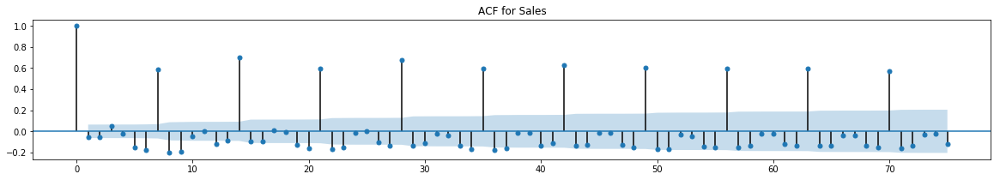

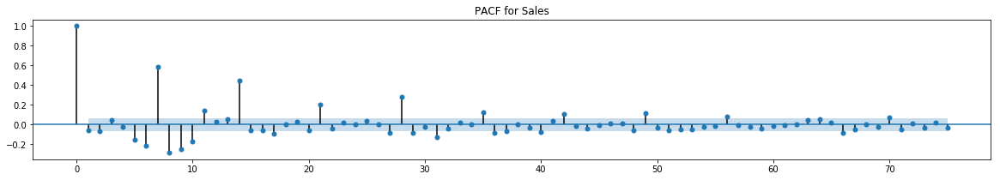

In [687]:
plot_acf_pacf(train_df_31['Sales'],'Sales')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=27, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 27 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 7 as p which is the last highest value.¶

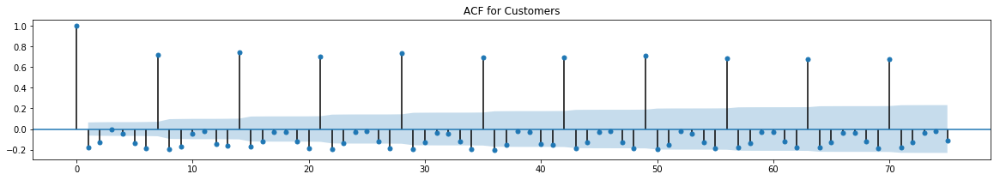

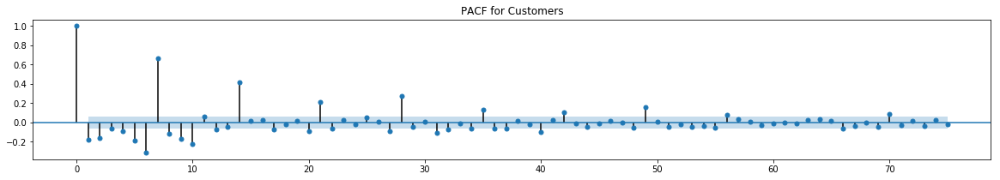

In [688]:
plot_acf_pacf(train_df_31['Customers'],'Customers')

#### Same as sales
### Train and Test split

In [689]:
train_len = train_df_31.shape[0]-42
train_df_31_train=train_df_31.iloc[:train_len,:]
train_df_31_test=train_df_31.iloc[train_len:,:]

#### Standardize Sales Customers

In [690]:
train_df_31_train[['Sales','Customers']]=scaler.fit_transform(train_df_31_train[['Sales','Customers']])
train_df_31_train.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,31,0.000000,0.000000,0,1,9800.0,185,1,0,0,0,0,0
2013-01-02,31,0.386508,0.432824,0,1,9800.0,186,0,1,0,0,0,0
2013-01-03,31,0.424313,0.441221,0,1,9800.0,187,0,0,1,0,0,0
2013-01-04,31,0.463326,0.483206,0,1,9800.0,188,0,0,0,1,0,0
2013-01-05,31,0.423106,0.476336,0,0,9800.0,189,0,0,0,0,1,0


In [691]:
#For test data
train_df_31_test[['Sales','Customers']]=scaler.transform(train_df_31_test[['Sales','Customers']])
train_df_31_test.head()

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2015-06-20,31,0.379716,0.403053,0,0,9800.0,1085,0,0,0,0,1,0
2015-06-21,31,0.000000,0.000000,0,0,9800.0,1086,0,0,0,0,0,1
2015-06-22,31,0.360625,0.363359,0,0,9800.0,1087,0,0,0,0,0,0
2015-06-23,31,0.326517,0.334351,0,0,9800.0,1088,1,0,0,0,0,0
2015-06-24,31,0.327347,0.370229,0,0,9800.0,1089,0,1,0,0,0,0


### VAR

In [692]:
exog = train_df_31_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_31_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -11.93      -11.83   6.592e-06      -11.89
1       -12.09     -11.97*   5.622e-06      -12.04
2       -12.10      -11.96   5.569e-06      -12.04
3       -12.10      -11.93   5.576e-06      -12.03
4       -12.10      -11.92   5.553e-06      -12.03
5       -12.10      -11.89   5.571e-06      -12.02
6       -12.11      -11.88   5.520e-06      -12.02
7       -12.12      -11.87   5.429e-06      -12.03
8       -12.16      -11.89   5.225e-06      -12.06
9       -12.17      -11.88   5.172e-06      -12.06
10      -12.20      -11.89   5.034e-06      -12.08
11      -12.22      -11.89   4.928e-06     -12.09*
12      -12.22      -11.86   4.952e-06      -12.08
13     -12.22*      -11.85  4.908e-06*      -12.08
14      -12.22      -11.82   4.917e-06      -12.07
15      -12.22      -11.80   4.910e-06      -12.06
-------------------------------

#### In the above output, the AIC drops to lowest at lag 11, then same at lag 12 .Let’s go with the lag 11.

In [693]:
var_model_final = var_model.fit(11)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     16:01:32
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -11.8906
Nobs:                     889.000    HQIC:                  -12.0970
Log likelihood:           2973.00    FPE:                4.90809e-06
AIC:                     -12.2247    Det(Omega_mle):     4.58290e-06
--------------------------------------------------------------------
Results for equation Sales
                  coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------
const                0.320507         0.053789            5.959           0.000
exog0                0.129092         0.012708           10.158           0.000
exog1               -0.018932         0.009293           -2.037 

#### From here we found the lap(p) as 11. Perform Johansen test with P=11-1

In [694]:
train_df_31['Sales']=train_df_31['Sales'].apply(lambda x:round(x))
train_df_31['Customers']=train_df_31['Customers'].apply(lambda x:round(x))

In [695]:
cointegration_test(train_df_31[['Sales','Customers']],10)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  43.07     > 12.3212   =>   True
Customers ::  0.41      > 4.1296    =>   False


In [696]:
rank_result=select_coint_rank(train_df_1[['Sales','Customers']],-1,10)

In [697]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
#### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.
#### Before that let's forecast and evaluate VAR model¶


In [698]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_31_train[['Sales','Customers']].values[-lag_order:]
forecast_input

11


array([[0.34115605, 0.37022901],
       [0.31980078, 0.35648855],
       [0.32078177, 0.36183206],
       [0.40642922, 0.41526718],
       [0.38507395, 0.40152672],
       [0.        , 0.        ],
       [0.60473891, 0.52137405],
       [0.52112889, 0.45343511],
       [0.4758527 , 0.42061069],
       [0.45155448, 0.4259542 ],
       [0.44378207, 0.42137405]])

In [699]:
exog_test = train_df_31_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_31_test.index, columns=['Sales','Customers'])
var_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.442902,0.466651
2015-06-21,-0.016820,-0.018027
2015-06-22,0.386908,0.407719
2015-06-23,0.365103,0.388003
2015-06-24,0.327289,0.360751


In [700]:
train_df_31_test['VarForecastedSales']=var_forecast.Sales
train_df_31_test['VarForecastedCustomers']=var_forecast.Customers

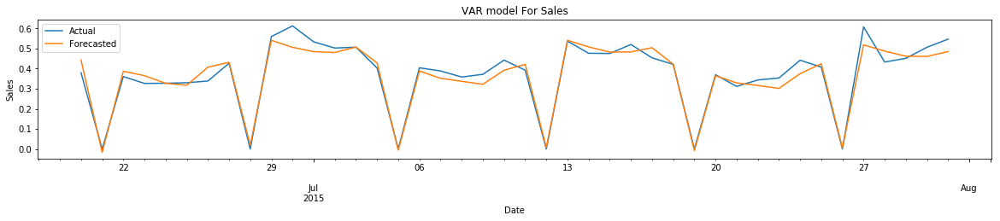

In [701]:
forecasted_timeseries_visualization(train_df_31_test['Sales'],train_df_31_test['VarForecastedSales'],'Sales','VAR')

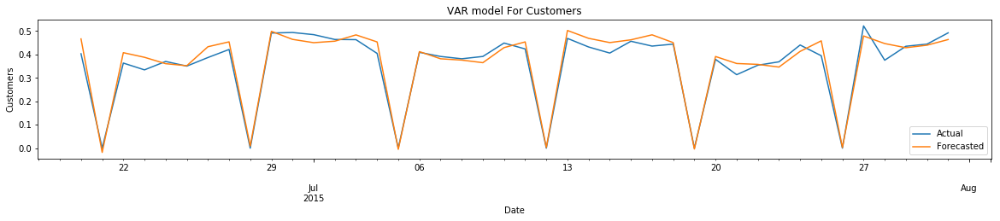

In [702]:
forecasted_timeseries_visualization(train_df_31_test['Customers'],train_df_31_test['VarForecastedCustomers'],'Customers','VAR')

In [703]:
train_df_31_test_temp=train_df_31_test.loc[(train_df_31_test.Sales!=0) & (train_df_31_test.Customers!=0),:]
d=summary(train_df_31_test_temp['Sales'], train_df_31_test_temp['VarForecastedSales'],
       train_df_31_test_temp['Customers'], train_df_31_test_temp['VarForecastedCustomers'],'Store-31','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head(30)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### VARMAX
#### From above PACF and ACF plot we found, p=7 and q=0.

In [704]:
%%time
exog = train_df_31_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_31_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(7,0),  exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  900
Model:                            VARX(7)   Log Likelihood                2839.140
                              + intercept   AIC                          -5580.281
Date:                    Mon, 05 Apr 2021   BIC                          -5344.963
Time:                            16:03:40   HQIC                         -5490.388
Sample:                        01-01-2013                                         
                             - 06-19-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                88.96, 85.11   Jarque-Bera (JB):      3532.67, 339.62
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.47, 1.05   Skew:                     -0.98, -0.71
P

In [705]:
exog_test = train_df_31_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_31_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_31_test.index.min(),end=train_df_31_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_31_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
Date,,
2015-06-20,0.465981,0.483562
2015-06-21,-0.013531,-0.016133
2015-06-22,0.422352,0.424547
2015-06-23,0.376098,0.387286
2015-06-24,0.358941,0.378241


In [706]:
train_df_31_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_31_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

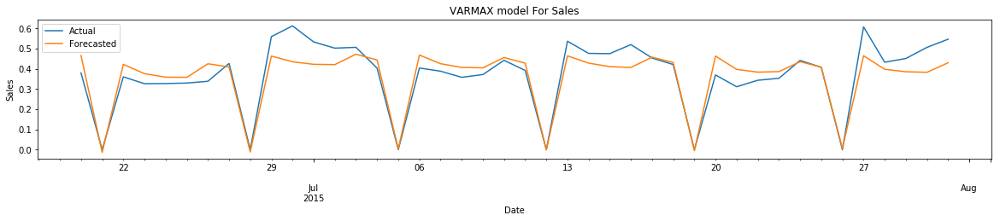

In [707]:
forecasted_timeseries_visualization(train_df_31_test['Sales'],train_df_31_test['VarmaxForecastedSales'],'Sales','VARMAX')

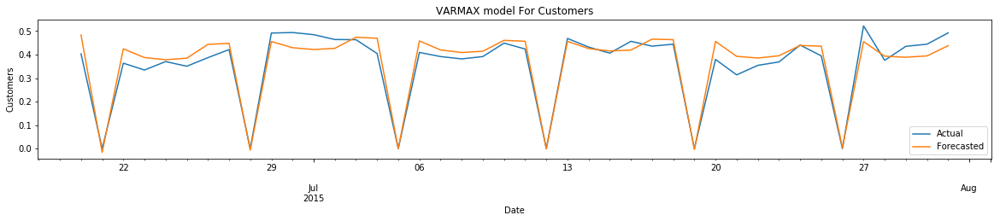

In [708]:
forecasted_timeseries_visualization(train_df_31_test['Customers'],train_df_31_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [709]:
train_df_31_test_temp=train_df_31_test.loc[(train_df_31_test.Sales!=0) & (train_df_31_test.Customers!=0),:]
d=summary(train_df_31_test_temp['Sales'], train_df_31_test_temp['VarmaxForecastedSales'],
       train_df_31_test_temp['Customers'], train_df_31_test_temp['VarmaxForecastedCustomers'],'Store-31','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(30)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### ARIMA

In [710]:
%%time

#With exogenous and for sale
exog = train_df_31_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_31_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 838.657
Method:                       css-mle   S.D. of innovations              0.095
Date:                Mon, 05 Apr 2021   AIC                          -1643.314
Time:                        16:04:00   BIC                          -1561.673
Sample:                    01-01-2013   HQIC                         -1612.126
                         - 06-19-2015                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.3913      0.011     35.669      0.000       0.370       0.413
Promo             0.1390      0.007     20.426      0.000       0.126       0.152
SchoolHoliday    -0.0094      0.011     

In [711]:
exog_test = train_df_31_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_31_test.index.min(),end=train_df_31_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_31_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
Date,
2015-06-20,0.422203
2015-06-21,0.000655
2015-06-22,0.387825
2015-06-23,0.353704
2015-06-24,0.330833


In [712]:
train_df_31_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [713]:
exog = train_df_31_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_31_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(7,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  900
Model:                     ARMA(7, 0)   Log Likelihood                 923.330
Method:                       css-mle   S.D. of innovations              0.087
Date:                Mon, 05 Apr 2021   AIC                          -1812.660
Time:                        16:04:08   BIC                          -1731.019
Sample:                    01-01-2013   HQIC                         -1781.473
                         - 06-19-2015                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.4208      0.009     45.288      0.000       0.403       0.439
Promo               0.0752      0.006     13.485      0.000       0.064       0.086
SchoolHoliday      -0.0199      

In [714]:
arimax_customers = arimax_model_fit.predict(start=train_df_31_test.index.min(),end=train_df_31_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_31_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
Date,
2015-06-20,0.452325
2015-06-21,0.003529
2015-06-22,0.415288
2015-06-23,0.381863
2015-06-24,0.367632


In [715]:
train_df_31_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

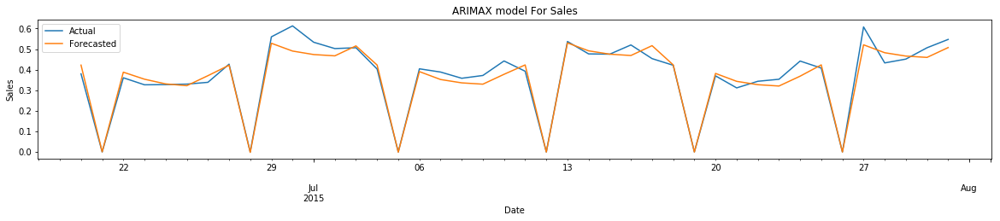

In [716]:
forecasted_timeseries_visualization(train_df_31_test['Sales'],train_df_31_test['ArimaxForecastedSales'],'Sales','ARIMAX')

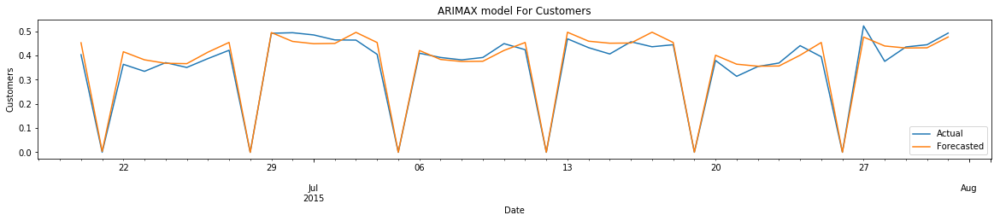

In [717]:
forecasted_timeseries_visualization(train_df_31_test['Customers'],train_df_31_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [718]:
train_df_31_test_temp=train_df_31_test.loc[(train_df_31_test.Sales!=0) & (train_df_31_test.Customers!=0),:]
d=summary(train_df_31_test_temp['Sales'], train_df_31_test_temp['ArimaxForecastedSales'],
       train_df_31_test_temp['Customers'], train_df_31_test_temp['ArimaxForecastedCustomes'],'Store-31','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(31)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [719]:
%%time

#Without exogenous and for sale
exog = train_df_31_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_31_train[['Sales']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                              Sales   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 811.884
Date:                            Mon, 05 Apr 2021   AIC                          -1577.767
Time:                                    16:10:11   BIC                          -1467.312
Sample:                                01-01-2013   HQIC                         -1535.572
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1381      0.007     18.535      0.000       0.123       0.153
SchoolHoliday    -0.0129  

In [720]:
sarimax_sales = sarima_model_fit.predict(start=train_df_31_test.index.min(),end=train_df_31_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_sales, index=train_df_31_test.index, columns=['Sales'])
sarimax_forecast.head()

,Sales
Date,
2015-06-20,0.411903
2015-06-21,0.001931
2015-06-22,0.385352
2015-06-23,0.349817
2015-06-24,0.318231


In [721]:
train_df_31_test['SarimaxForecastedSales']=sarimax_forecast.Sales

In [722]:
%%time

#Without exogenous and for sale
exog = train_df_31_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_31_train[['Customers']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())


                                 Statespace Model Results                                 
Dep. Variable:                          Customers   No. Observations:                  900
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 872.116
Date:                            Mon, 05 Apr 2021   AIC                          -1698.232
Time:                                    16:15:20   BIC                          -1587.777
Sample:                                01-01-2013   HQIC                         -1656.037
                                     - 06-19-2015                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.0717      0.006     11.646      0.000       0.060       0.084
SchoolHoliday    -0.0272  

In [723]:
sarimax_customers = sarima_model_fit.predict(start=train_df_31_test.index.min(),end=train_df_31_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_customers, index=train_df_31_test.index, columns=['Customers'])
sarimax_forecast.head()

,Customers
Date,
2015-06-20,0.447893
2015-06-21,0.000120
2015-06-22,0.394580
2015-06-23,0.377973
2015-06-24,0.375519


In [724]:
train_df_31_test['SarimaxForecastedCustomers']=sarimax_forecast.Customers

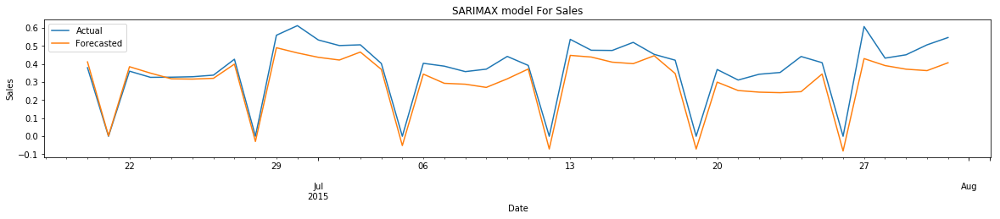

In [725]:
forecasted_timeseries_visualization(train_df_31_test['Sales'],train_df_31_test['SarimaxForecastedSales'],'Sales','SARIMAX')

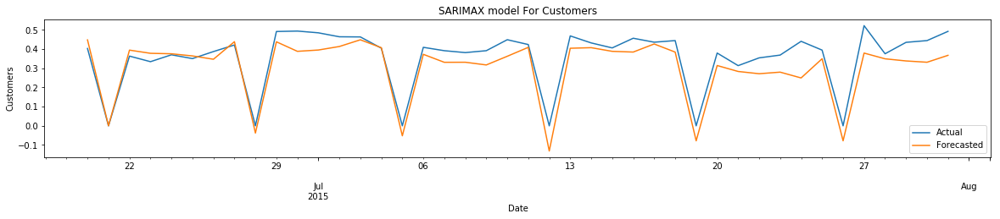

In [726]:
forecasted_timeseries_visualization(train_df_31_test['Customers'],train_df_31_test['SarimaxForecastedCustomers'],'Customers','SARIMAX')


In [727]:
train_df_31_test_temp=train_df_31_test.loc[(train_df_31_test.Sales!=0) & (train_df_31_test.Customers!=0),:]
d=summary(train_df_31_test_temp['Sales'], train_df_31_test_temp['SarimaxForecastedSales'],
       train_df_31_test_temp['Customers'], train_df_31_test_temp['SarimaxForecastedCustomers'],'Store-31','SARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(50)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [728]:
train_df_46=train_df.loc[train_df.Store==46,:]

In [729]:
train_df_46.head(7)

,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
Date,,,,,,,,,,,,,
2013-01-01,46,0,0,0,1,1200.0,2680,1,0,0,0,0,0
2013-01-02,46,4016,582,0,1,1200.0,2681,0,1,0,0,0,0
2013-01-03,46,4177,553,0,1,1200.0,2682,0,0,1,0,0,0
2013-01-04,46,4125,569,0,1,1200.0,2683,0,0,0,1,0,0
2013-01-05,46,4848,651,0,0,1200.0,2684,0,0,0,0,1,0
2013-01-06,46,0,0,0,0,1200.0,2685,0,0,0,0,0,1
2013-01-07,46,7788,825,1,0,1200.0,2686,0,0,0,0,0,0


In [730]:
train_df_46.shape

(758, 13)

In [731]:
pd.date_range(start = train_df_46.index.min(), end = train_df_46.index.max() ).difference(train_df_46.index)


DatetimeIndex(['2014-07-01', '2014-07-02', '2014-07-03', '2014-07-04',
               '2014-07-05', '2014-07-06', '2014-07-07', '2014-07-08',
               '2014-07-09', '2014-07-10',
               ...
               '2014-12-22', '2014-12-23', '2014-12-24', '2014-12-25',
               '2014-12-26', '2014-12-27', '2014-12-28', '2014-12-29',
               '2014-12-30', '2014-12-31'],
              dtype='datetime64[ns]', length=184, freq=None)

In [732]:
train_df_46=train_df_46.reset_index()
train_df_46.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,46,0,0,0,1,1200.0,2680,1,0,0,0,0,0
1,2013-01-02,46,4016,582,0,1,1200.0,2681,0,1,0,0,0,0
2,2013-01-03,46,4177,553,0,1,1200.0,2682,0,0,1,0,0,0
3,2013-01-04,46,4125,569,0,1,1200.0,2683,0,0,0,1,0,0
4,2013-01-05,46,4848,651,0,0,1200.0,2684,0,0,0,0,1,0


### Time Series Visualizatin

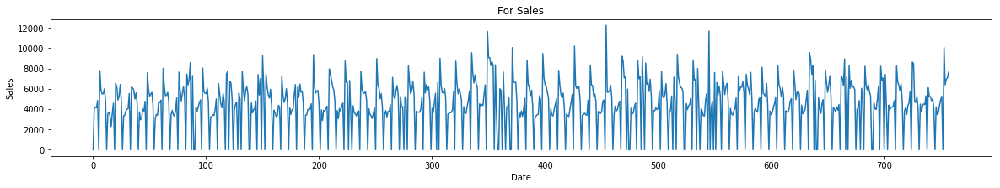

In [733]:
timeseries_visualization(train_df_46['Sales'],'Sales')

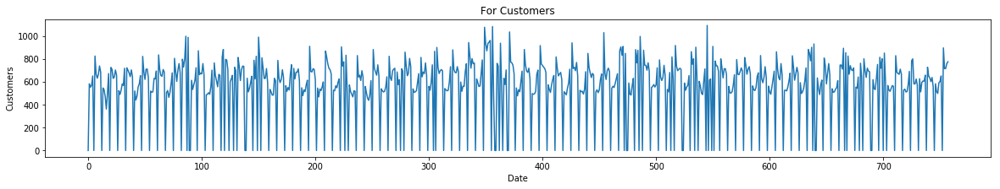

In [734]:
timeseries_visualization(train_df_46['Customers'],'Customers')

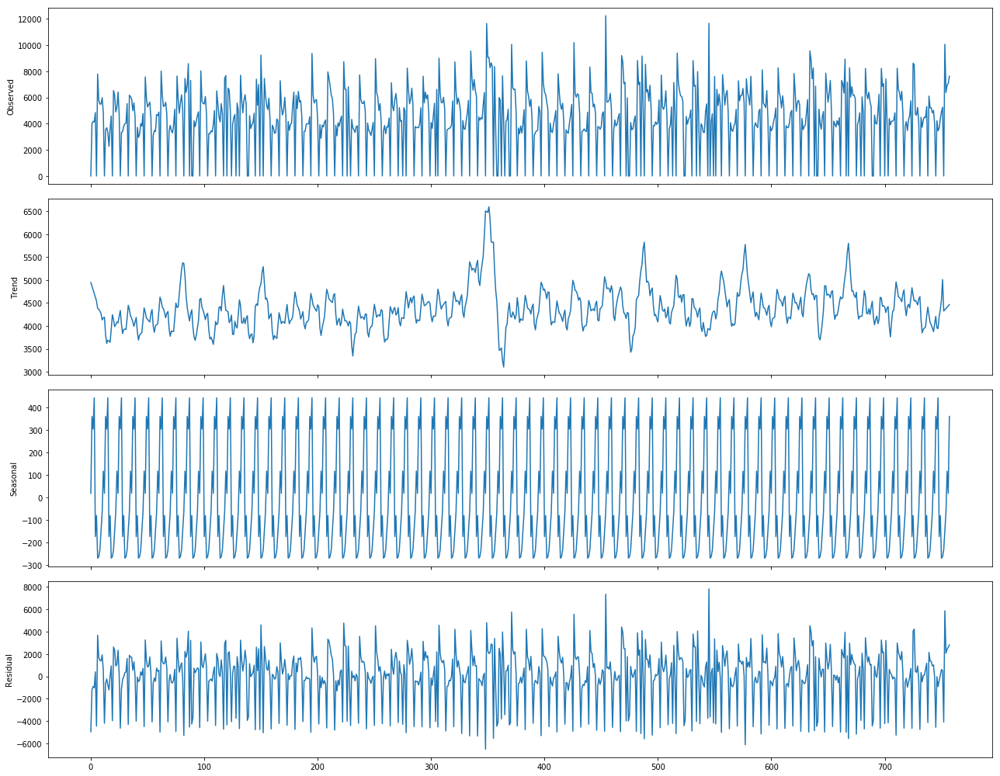

Mean Residual for Sales=4.879564054531805


In [736]:
plot_seasonal_decomposition_period(train_df_46['Sales'],'Sales','additive')

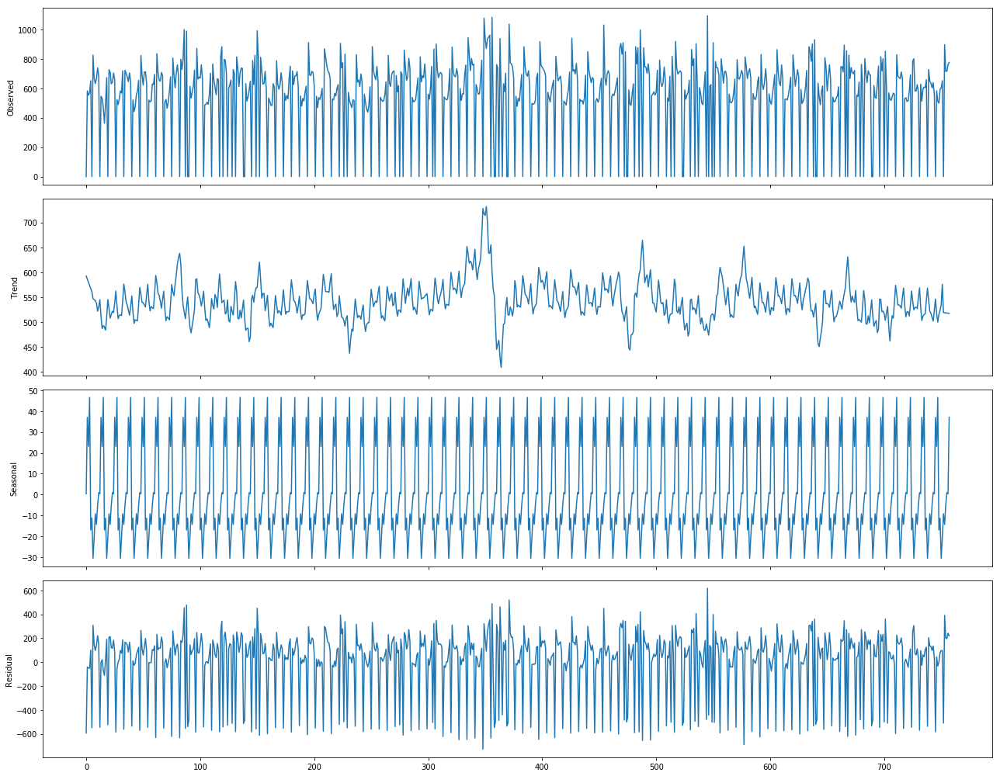

Mean Residual for Customers=0.19574156653695568


In [737]:
plot_seasonal_decomposition_period(train_df_46['Customers'],'Customers','additive')

In [738]:
train_df_46[['Sales','Customers']].corr()

,Sales,Customers
Sales,1.000000,0.967521
Customers,0.967521,1.000000


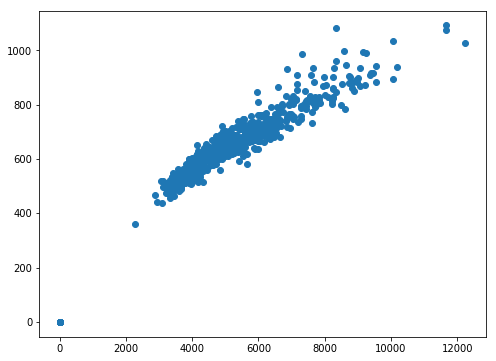

In [739]:
fig = plt.figure(figsize=(8, 6))
plt.scatter(train_df_46['Sales'],train_df_46['Customers'])
plt.show()

#### Here we can see a strong relation between Sales and Customers.
### Causality testing

In [740]:
causality_sales=grangercausalitytests(train_df_46[['Sales','Customers']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=351.7799, p=0.0000  , df_denom=754, df_num=1
ssr based chi2 test:   chi2=353.1795, p=0.0000  , df=1
likelihood ratio test: chi2=289.8657, p=0.0000  , df=1
parameter F test:         F=351.7799, p=0.0000  , df_denom=754, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=196.7864, p=0.0000  , df_denom=751, df_num=2
ssr based chi2 test:   chi2=396.1931, p=0.0000  , df=2
likelihood ratio test: chi2=318.5641, p=0.0000  , df=2
parameter F test:         F=196.7864, p=0.0000  , df_denom=751, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=130.2758, p=0.0000  , df_denom=748, df_num=3
ssr based chi2 test:   chi2=394.4849, p=0.0000  , df=3
likelihood ratio test: chi2=317.3654, p=0.0000  , df=3
parameter F test:         F=130.2758, p=0.0000  , df_denom=748, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=100.4214, p=0.0000  

In [741]:
causality_customers=grangercausalitytests(train_df_46[['Customers','Sales']].dropna(), 4)


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=197.5864, p=0.0000  , df_denom=754, df_num=1
ssr based chi2 test:   chi2=198.3726, p=0.0000  , df=1
likelihood ratio test: chi2=176.1828, p=0.0000  , df=1
parameter F test:         F=197.5864, p=0.0000  , df_denom=754, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=107.9068, p=0.0000  , df_denom=751, df_num=2
ssr based chi2 test:   chi2=217.2504, p=0.0000  , df=2
likelihood ratio test: chi2=190.9656, p=0.0000  , df=2
parameter F test:         F=107.9068, p=0.0000  , df_denom=751, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=74.7986 , p=0.0000  , df_denom=748, df_num=3
ssr based chi2 test:   chi2=226.4957, p=0.0000  , df=3
likelihood ratio test: chi2=198.0817, p=0.0000  , df=3
parameter F test:         F=74.7986 , p=0.0000  , df_denom=748, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=58.1383 , p=0.0000  

#### Here all the tests signify causality at significance level 0.05. All indicates that causality exists between sales and customers.
### Testing for stationary

In [742]:
stationary_test(train_df_46[['Sales','Customers']])

For  Sales
****************************************************************************************************
ADF Statistic= -5.52158329420173
P value= 1.872403965434803e-06
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
For  Customers
****************************************************************************************************
ADF Statistic= -5.603083138337721
P value= 1.2518649400890193e-06
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


##### 1%:-3.44,5%:-2.86,10%:-2.56 . If we compare the ADF statistic value, for both Sales and Customers, the value is less than the value of 1%. Which means we have to reject null hypothesis i.e. Series is not stationary.
#### Here we can see the P value is less than -.05 for both Sales and Customers, which implys both sereies are stationary. As our original data is stationary the degree of integration is 0 (I(0)).
#### Here we do not have any othe time series except Sales and Customers. Other variables are not time series components . They can be considered as exogenous variables.¶

### Autocoorelation and degree of integration

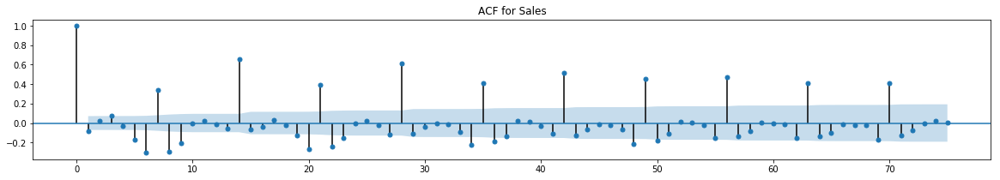

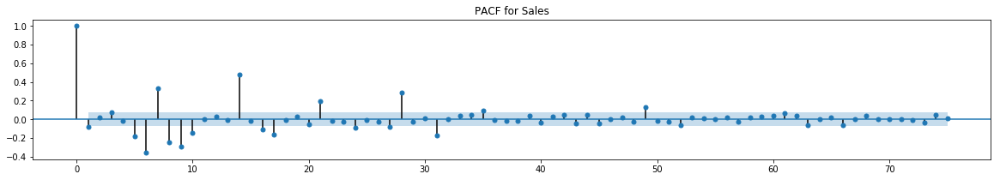

In [743]:
plot_acf_pacf(train_df_46['Sales'],'Sales')

#### From ACF plot , we can find q=0 as we do not have a point after which autocorrelation dies down.
#### From PACF plot , we can choose p=27, as the highest lag where partial autocorrelation is significantly high. But executionof the model will be very high and taking 27 component while modeling, then there is very high chance of overfitting because of high complexity. Hence let's select 14 as p which is the last highest value.

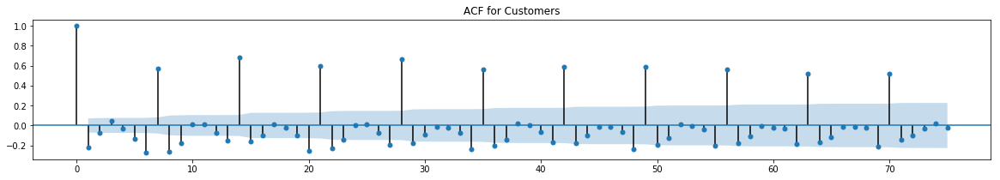

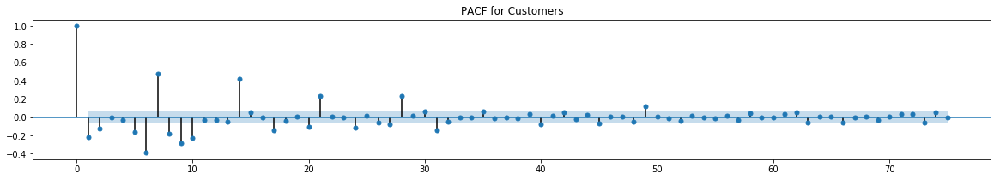

In [744]:
plot_acf_pacf(train_df_46['Customers'],'Customers')

#### Same as Sales

### Train and Test split

In [745]:
train_len = train_df_46.shape[0]-42
train_df_46_train=train_df_46.iloc[:train_len,:]
train_df_46_test=train_df_46.iloc[train_len:,:]

### Standardize Sales Customers

In [746]:
train_df_46_train[['Sales','Customers']]=scaler.fit_transform(train_df_46_train[['Sales','Customers']])
train_df_46_train.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
0,2013-01-01,46,0.000000,0.000000,0,1,1200.0,2680,1,0,0,0,0,0
1,2013-01-02,46,0.327837,0.532967,0,1,1200.0,2681,0,1,0,0,0,0
2,2013-01-03,46,0.340980,0.506410,0,1,1200.0,2682,0,0,1,0,0,0
3,2013-01-04,46,0.336735,0.521062,0,1,1200.0,2683,0,0,0,1,0,0
4,2013-01-05,46,0.395755,0.596154,0,0,1200.0,2684,0,0,0,0,1,0


In [747]:
#For test data
train_df_46_test[['Sales','Customers']]=scaler.transform(train_df_46_test[['Sales','Customers']])
train_df_46_test.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,DayOfWeek_4,DayOfWeek_5,DayOfWeek_6,DayOfWeek_7
716,2015-06-20,46,0.392816,0.608974,0,0,1200.0,3580,0,0,0,0,1,0
717,2015-06-21,46,0.000000,0.000000,0,0,1200.0,3581,0,0,0,0,0,1
718,2015-06-22,46,0.309551,0.483516,0,0,1200.0,3582,0,0,0,0,0,0
719,2015-06-23,46,0.339592,0.490842,0,0,1200.0,3583,1,0,0,0,0,0
720,2015-06-24,46,0.283184,0.467949,0,0,1200.0,3584,0,1,0,0,0,0


### VAR

In [748]:
exog = train_df_46_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_46_train[['Sales', 'Customers']].astype(float)
var_model = sm.tsa.VAR(endog,exog)
res=var_model.select_order(maxlags=15)
print(res.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -10.96      -10.84   1.743e-05      -10.91
1       -11.04     -10.90*   1.598e-05      -10.99
2       -11.05      -10.88   1.587e-05      -10.99
3       -11.08      -10.89   1.536e-05      -11.01
4       -11.09      -10.87   1.526e-05      -11.01
5       -11.08      -10.83   1.539e-05      -10.99
6       -11.08      -10.81   1.540e-05      -10.98
7       -11.08      -10.79   1.535e-05      -10.97
8       -11.11      -10.78   1.503e-05      -10.98
9       -11.13      -10.78   1.460e-05      -11.00
10      -11.17      -10.79   1.415e-05      -11.02
11      -11.19      -10.79   1.379e-05     -11.04*
12      -11.19      -10.76   1.383e-05      -11.02
13      -11.19      -10.73   1.387e-05      -11.01
14     -11.21*      -10.73  1.354e-05*      -11.02
15      -11.20      -10.69   1.368e-05      -11.00
-------------------------------

In the above output, the AIC drops to lowest at lag 14, then increase at lag 15 .Let’s go with the lag 14.

In [749]:
var_model_final = var_model.fit(14)
var_model_final.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 05, Apr, 2021
Time:                     16:16:58
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -10.7328
Nobs:                     702.000    HQIC:                  -11.0273
Log likelihood:           2017.51    FPE:                1.35028e-05
AIC:                     -11.2128    Det(Omega_mle):     1.21845e-05
--------------------------------------------------------------------
Results for equation Sales
                   coefficient       std. error           t-stat            prob
--------------------------------------------------------------------------------
const                 0.285635         0.077631            3.679           0.000
exog0                 0.229005         0.017850           12.829           0.000
exog1                -0.025913         0.010781           -2

#### From here we found the lap(p) as 14. Perform Johansen test with P=14-1

In [750]:
train_df_46['Sales']=train_df_46['Sales'].apply(lambda x:round(x))
train_df_46['Customers']=train_df_46['Customers'].apply(lambda x:round(x))

In [751]:
cointegration_test(train_df_46[['Sales','Customers']],13)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
Sales  ::  22.72     > 12.3212   =>   True
Customers ::  0.18      > 4.1296    =>   False


In [752]:
rank_result=select_coint_rank(train_df_46[['Sales','Customers']],-1,13)

In [753]:
print(rank_result.rank)

1


#### Here we are checking for 2 time series i.e. N=1, we can see the rank is 1 (< N). Hence time series are cointegrated, it means they have a long run, statistically significant relationship.
#### As cointegration exists , we will be needing error correction techniques. We will implement VARMAX algorith, as the MA part of VARMAX will handle error correction.
#### Before that let's forecast and evaluate VAR model¶

In [754]:
# Get the lag order
lag_order = var_model_final.k_ar
print(lag_order) 
forecast_input = train_df_46_train[['Sales','Customers']].values[-lag_order:]
forecast_input

14


array([[0.34742857, 0.55128205],
       [0.        , 0.        ],
       [0.35820408, 0.52014652],
       [0.31926531, 0.48260073],
       [0.34187755, 0.47344322],
       [0.34212245, 0.49542125],
       [0.35061224, 0.51923077],
       [0.39453061, 0.51282051],
       [0.        , 0.        ],
       [0.67257143, 0.75824176],
       [0.54302041, 0.62545788],
       [0.51861224, 0.61630037],
       [0.47240816, 0.60897436],
       [0.52840816, 0.65018315]])

In [755]:
exog_test = train_df_46_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
fc = var_model_final.forecast(y=forecast_input, steps=42,exog_future=exog_test)
var_forecast = pd.DataFrame(fc, index=train_df_46_test.index, columns=['Sales','Customers'])
var_forecast.head()

,Sales,Customers
716,0.399842,0.612149
717,0.010610,0.004792
718,0.335068,0.488144
719,0.277623,0.445018
720,0.303691,0.463687


In [756]:
train_df_46_test['VarForecastedSales']=var_forecast.Sales
train_df_46_test['VarForecastedCustomers']=var_forecast.Customers

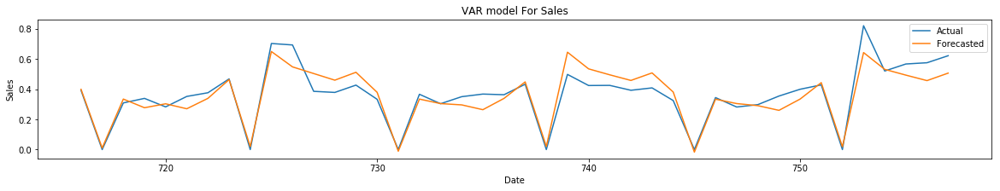

In [757]:
forecasted_timeseries_visualization(train_df_46_test['Sales'],train_df_46_test['VarForecastedSales'],'Sales','VAR')

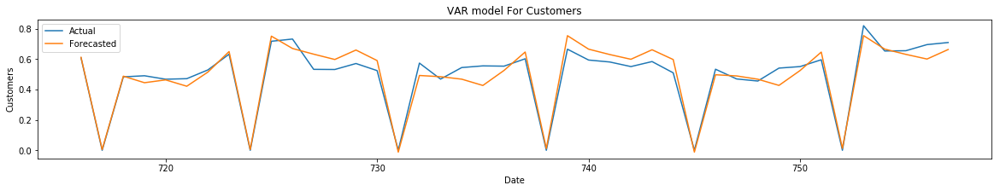

In [758]:
forecasted_timeseries_visualization(train_df_46_test['Customers'],train_df_46_test['VarForecastedCustomers'],'Customers','VAR')

In [759]:
train_df_46_test_temp=train_df_46_test.loc[(train_df_46_test.Sales!=0) & (train_df_46_test.Customers!=0),:]
d=summary(train_df_46_test_temp['Sales'], train_df_46_test_temp['VarForecastedSales'],
       train_df_46_test_temp['Customers'], train_df_46_test_temp['VarForecastedCustomers'],'Store-46','VAR')
summary_df = pd.concat([summary_df, d])
summary_df.head(35)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### VARMAX
#### From above PACF and ACF plot we found, p=14 and q=0.

In [760]:
%%time
exog = train_df_46_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_46_train[['Sales', 'Customers']].astype(float)
varmax_model = sm.tsa.VARMAX(endog, order=(14,0), exog=exog)
varmax_model_fit = varmax_model.fit(maxiter=1000, disp=False)
print(varmax_model_fit.summary())

                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  716
Model:                           VARX(14)   Log Likelihood                1895.982
                              + intercept   AIC                          -3637.965
Date:                    Mon, 05 Apr 2021   BIC                          -3285.792
Time:                            16:20:28   HQIC                         -3501.972
Sample:                                 0                                         
                                    - 716                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                65.93, 35.58   Jarque-Bera (JB):       463.42, 329.48
Prob(Q):                        0.01, 0.67   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.38, 1.39   Skew:                     -0.63, -0.72
P

In [761]:
exog_test = train_df_46_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog_test= train_df_46_test[['Sales','Customers']]
varmax_fc = varmax_model_fit.predict(start=train_df_46_test.index.min(),end=train_df_46_test.index.max(),exog=exog_test)
varmax_forecast = pd.DataFrame(varmax_fc, index=train_df_46_test.index, columns=['Sales','Customers'])
varmax_forecast.head()

,Sales,Customers
716,0.404278,0.613564
717,0.013926,0.013513
718,0.392542,0.542045
719,0.219043,0.367698
720,0.307430,0.470717


In [762]:
train_df_46_test['VarmaxForecastedSales']=varmax_forecast.Sales
train_df_46_test['VarmaxForecastedCustomers']=varmax_forecast.Customers

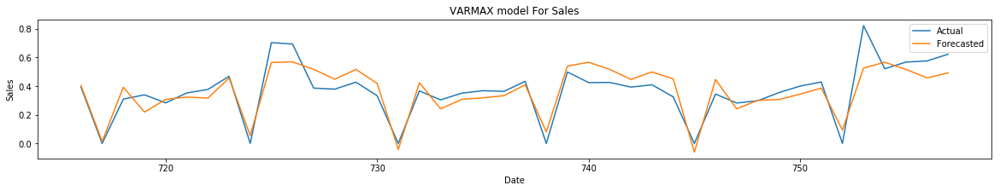

In [763]:
forecasted_timeseries_visualization(train_df_46_test['Sales'],train_df_46_test['VarmaxForecastedSales'],'Sales','VARMAX')

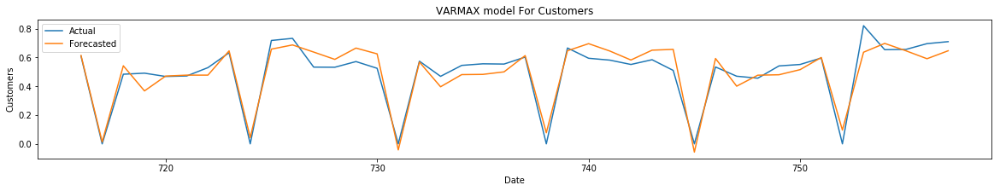

In [764]:
forecasted_timeseries_visualization(train_df_46_test['Customers'],train_df_46_test['VarmaxForecastedCustomers'],'Customers','VARMAX')

In [765]:
train_df_46_test_temp=train_df_46_test.loc[(train_df_46_test.Sales!=0) & (train_df_46_test.Customers!=0),:]
d=summary(train_df_46_test_temp['Sales'], train_df_46_test_temp['VarmaxForecastedSales'],
       train_df_46_test_temp['Customers'], train_df_46_test_temp['VarmaxForecastedCustomers'],'Store-46','VARMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(35)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


### ARIMA

In [766]:
%%time

#With exogenous and for sale
exog = train_df_46_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_46_train[['Sales']].astype(float)
arimax_model = ARIMA(endog, order=(14,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  716
Model:                    ARMA(14, 0)   Log Likelihood                 616.298
Method:                       css-mle   S.D. of innovations              0.102
Date:                Mon, 05 Apr 2021   AIC                          -1184.596
Time:                        16:21:58   BIC                          -1074.827
Sample:                             0   HQIC                         -1142.208
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.3776      0.012     32.747      0.000       0.355       0.400
Promo             0.2111      0.010     20.988      0.000       0.191       0.231
SchoolHoliday    -0.0060      0.009     

In [767]:
exog_test = train_df_46_test[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)

arimax_sales = arimax_model_fit.predict(start=train_df_46_test.index.min(),end=train_df_46_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_sales, index=train_df_46_test.index, columns=['Sales'])
arimax_forecast.head()

,Sales
716,0.424889
717,0.009504
718,0.380855
719,0.313434
720,0.292972


In [768]:
train_df_46_test['ArimaxForecastedSales']=arimax_forecast.Sales

In [769]:
exog = train_df_46_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_46_train[['Customers']].astype(float)
arimax_model = ARIMA(endog, order=(14,0,0),exog=exog)
arimax_model_fit = arimax_model.fit()
print(arimax_model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:              Customers   No. Observations:                  716
Model:                    ARMA(14, 0)   Log Likelihood                 489.296
Method:                       css-mle   S.D. of innovations              0.122
Date:                Mon, 05 Apr 2021   AIC                           -930.591
Time:                        16:23:53   BIC                           -820.823
Sample:                             0   HQIC                          -888.204
                                                                              
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.5360      0.013     41.677      0.000       0.511       0.561
Promo                0.1722      0.009     19.130      0.000       0.155       0.190
SchoolHoliday       -0.0281 

In [770]:
arimax_customers = arimax_model_fit.predict(start=train_df_46_test.index.min(),end=train_df_46_test.index.max(),exog=exog_test)
arimax_forecast = pd.DataFrame(arimax_customers, index=train_df_46_test.index, columns=['Customers'])
arimax_forecast.head()

,Customers
716,0.641763
717,0.005489
718,0.539760
719,0.483186
720,0.457994


In [771]:
train_df_46_test['ArimaxForecastedCustomes']=arimax_forecast.Customers

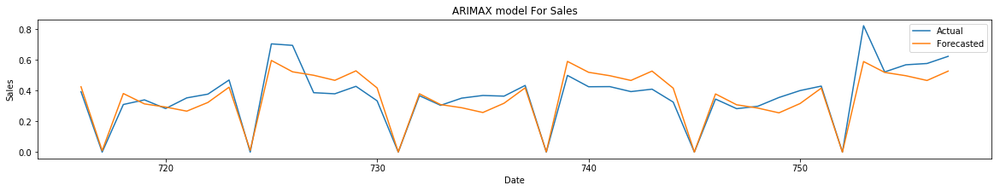

In [772]:
forecasted_timeseries_visualization(train_df_46_test['Sales'],train_df_46_test['ArimaxForecastedSales'],'Sales','ARIMAX')

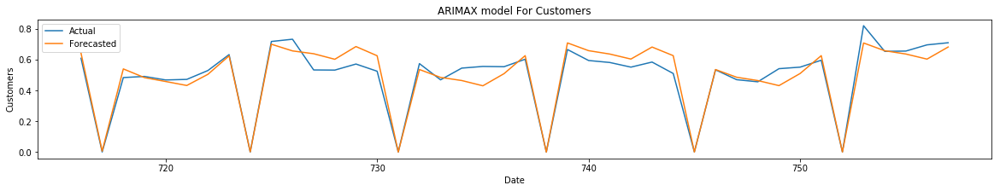

In [773]:
forecasted_timeseries_visualization(train_df_46_test['Customers'],train_df_46_test['ArimaxForecastedCustomes'],'Customers','ARIMAX')

In [774]:
train_df_46_test_temp=train_df_46_test.loc[(train_df_46_test.Sales!=0) & (train_df_46_test.Customers!=0),:]
d=summary(train_df_46_test_temp['Sales'], train_df_46_test_temp['ArimaxForecastedSales'],
       train_df_46_test_temp['Customers'], train_df_46_test_temp['ArimaxForecastedCustomes'],'Store-46','ARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(35)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


In [775]:
%%time

#Without exogenous and for sale
exog = train_df_46_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_46_train[['Sales']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                              Sales   No. Observations:                  716
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 545.985
Date:                            Mon, 05 Apr 2021   AIC                          -1045.969
Time:                                    16:29:13   BIC                           -940.775
Sample:                                         0   HQIC                         -1005.348
                                            - 716                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.2141      0.010     22.082      0.000       0.195       0.233
SchoolHoliday     0.0043  

In [776]:

sarimax_sales = sarima_model_fit.predict(start=train_df_46_test.index.min(),end=train_df_46_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_sales, index=train_df_46_test.index, columns=['Sales'])
sarimax_forecast.head()

,Sales
716,0.429685
717,0.023637
718,0.368751
719,0.293986
720,0.269977


In [777]:
train_df_46_test['SarimaxForecastedSales']=sarimax_forecast.Sales

In [778]:
%%time

#Without exogenous and for sale
exog = train_df_46_train[['Promo','SchoolHoliday','DayOfWeek_2','DayOfWeek_3','DayOfWeek_4','DayOfWeek_5','DayOfWeek_6','DayOfWeek_7']].astype(float)
endog = train_df_46_train[['Customers']].astype(float)
sarima_model = SARIMAX(endog, order=(7,0,0),seasonal_order=(7, 0, 0, 12),exog=exog)
sarima_model_fit = sarima_model.fit()
print(sarima_model_fit.summary())

                                 Statespace Model Results                                 
Dep. Variable:                          Customers   No. Observations:                  716
Model:             SARIMAX(7, 0, 0)x(7, 0, 0, 12)   Log Likelihood                 405.822
Date:                            Mon, 05 Apr 2021   AIC                           -765.645
Time:                                    16:34:07   BIC                           -660.450
Sample:                                         0   HQIC                          -725.023
                                            - 716                                         
Covariance Type:                              opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Promo             0.1795      0.009     19.397      0.000       0.161       0.198
SchoolHoliday    -0.0171  

In [779]:
sarimax_customers = sarima_model_fit.predict(start=train_df_46_test.index.min(),end=train_df_46_test.index.max(),exog=exog_test)
sarimax_forecast = pd.DataFrame(sarimax_customers, index=train_df_46_test.index, columns=['Customers'])
sarimax_forecast.head()

,Customers
716,0.634474
717,0.009172
718,0.522626
719,0.492721
720,0.448000


In [780]:
train_df_46_test['SarimaxForecastedCustomers']=sarimax_forecast.Customers

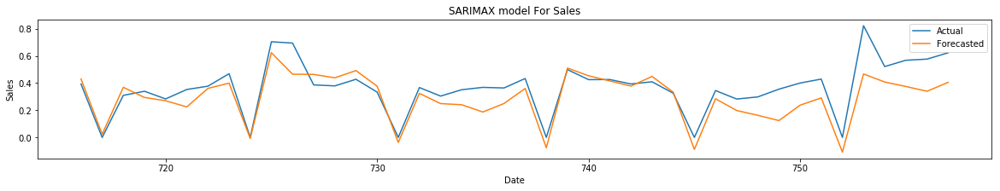

In [781]:
forecasted_timeseries_visualization(train_df_46_test['Sales'],train_df_46_test['SarimaxForecastedSales'],'Sales','SARIMAX')

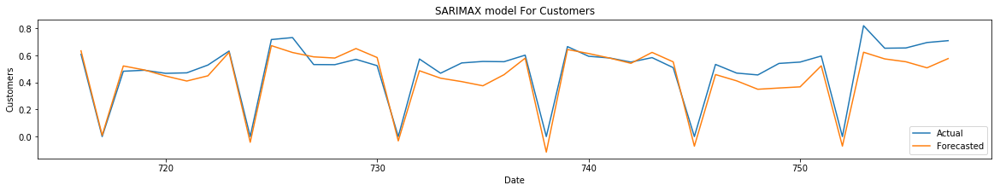

In [782]:
forecasted_timeseries_visualization(train_df_46_test['Customers'],train_df_46_test['SarimaxForecastedCustomers'],'Customers','SARIMAX')

In [783]:
train_df_46_test_temp=train_df_46_test.loc[(train_df_46_test.Sales!=0) & (train_df_46_test.Customers!=0),:]
d=summary(train_df_46_test_temp['Sales'], train_df_46_test_temp['SarimaxForecastedSales'],
       train_df_46_test_temp['Customers'], train_df_46_test_temp['SarimaxForecastedCustomers'],'Store-46','SARIMAX')
summary_df = pd.concat([summary_df, d])
summary_df.head(50)

,Store,Model,RMSE_SALES,MAPE_SALES,RMSE_CUSTOMERS,MAPE_CUSTOMERS
0,All,VAR,0.05,45.83,0.04,19.99
0,All,VARMAX,0.08,85.40,0.04,40.07
0,All,ARIMA,0.20,1050.15,0.14,924.07
0,All,ARIMAX,0.06,12.62,0.03,12.38
0,All,SARIMAX,0.11,177.58,0.09,236.47
0,Store-1,VAR,0.05,8.94,0.05,8.78
0,Store-1,VARMAX,0.06,11.04,0.05,8.71
0,Store-1,ARIMAX,0.05,8.66,0.05,8.40
0,Store-1,SARIMAX,0.11,21.34,0.10,19.36
0,Store-3,VAR,0.08,11.30,0.05,10.63


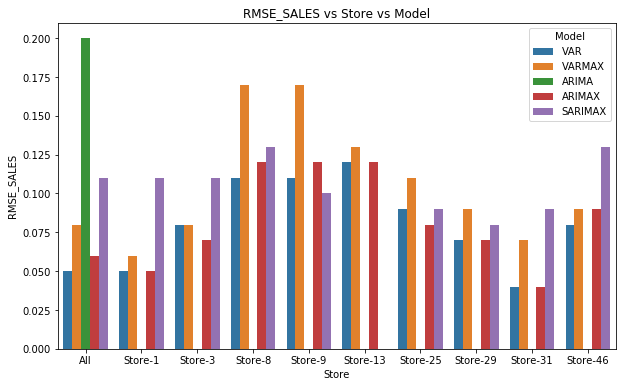

In [784]:
fig = plt.figure(figsize=(10, 6))
sns.barplot(y='RMSE_SALES',x='Store',hue='Model',data=summary_df)
plt.title("RMSE_SALES vs Store vs Model")
plt.show()

#### Here we can see VAR or ARIMAX is giving lower value of RMSE for sales

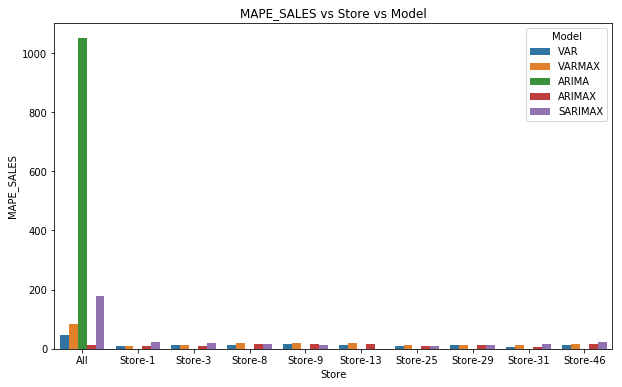

In [785]:
fig = plt.figure(figsize=(10, 6))
sns.barplot(y='MAPE_SALES',x='Store',hue='Model',data=summary_df)
plt.title("MAPE_SALES vs Store vs Model")
plt.show()

#### Here we can see VAR or ARIMAX is giving lower value of MAPE for sales

In [786]:
summary_df.loc[summary_df.Model.isin(['ARIMAX','VAR']),['Store','Model','RMSE_SALES','MAPE_SALES']].sort_values(by='MAPE_SALES')

,Store,Model,RMSE_SALES,MAPE_SALES
0,Store-31,ARIMAX,0.04,7.40
0,Store-31,VAR,0.04,7.76
0,Store-1,ARIMAX,0.05,8.66
0,Store-1,VAR,0.05,8.94
0,Store-25,ARIMAX,0.08,9.78
0,Store-25,VAR,0.09,9.79
0,Store-3,ARIMAX,0.07,9.87
0,Store-29,ARIMAX,0.07,11.19
0,Store-3,VAR,0.08,11.30
0,All,ARIMAX,0.06,12.62


#### From abore report it is concluded that , most of the time ARIMAX leads to VAR. Let's select ARIMAX as our final model.
#### Note: Here the forecasted values are in minmax standardize form. Find forecasted values for all key stores.

In [787]:
train_df_46_test[['Sales','Customers']]=scaler.inverse_transform(train_df_46_test[['Sales','Customers']])
train_df_46_test.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,...,DayOfWeek_6,DayOfWeek_7,VarForecastedSales,VarForecastedCustomers,VarmaxForecastedSales,VarmaxForecastedCustomers,ArimaxForecastedSales,ArimaxForecastedCustomes,SarimaxForecastedSales,SarimaxForecastedCustomers
716,2015-06-20,46,4812.0,665.0,0,0,1200.0,3580,0,0,...,1,0,0.399842,0.612149,0.404278,0.613564,0.424889,0.641763,0.429685,0.634474
717,2015-06-21,46,0.0,0.0,0,0,1200.0,3581,0,0,...,0,1,0.010610,0.004792,0.013926,0.013513,0.009504,0.005489,0.023637,0.009172
718,2015-06-22,46,3792.0,528.0,0,0,1200.0,3582,0,0,...,0,0,0.335068,0.488144,0.392542,0.542045,0.380855,0.539760,0.368751,0.522626
719,2015-06-23,46,4160.0,536.0,0,0,1200.0,3583,1,0,...,0,0,0.277623,0.445018,0.219043,0.367698,0.313434,0.483186,0.293986,0.492721
720,2015-06-24,46,3469.0,511.0,0,0,1200.0,3584,0,1,...,0,0,0.303691,0.463687,0.307430,0.470717,0.292972,0.457994,0.269977,0.448000


In [788]:
train_df_46_test['ActualSales']=train_df_46_test['Sales']
train_df_46_test['ActualCustomers']=train_df_46_test['Customers']
train_df_46_test['Sales']=train_df_46_test['ArimaxForecastedSales']
train_df_46_test['Customers']=train_df_46_test['ArimaxForecastedCustomes']
train_df_46_test.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,...,VarForecastedSales,VarForecastedCustomers,VarmaxForecastedSales,VarmaxForecastedCustomers,ArimaxForecastedSales,ArimaxForecastedCustomes,SarimaxForecastedSales,SarimaxForecastedCustomers,ActualSales,ActualCustomers
716,2015-06-20,46,0.424889,0.641763,0,0,1200.0,3580,0,0,...,0.399842,0.612149,0.404278,0.613564,0.424889,0.641763,0.429685,0.634474,4812.0,665.0
717,2015-06-21,46,0.009504,0.005489,0,0,1200.0,3581,0,0,...,0.010610,0.004792,0.013926,0.013513,0.009504,0.005489,0.023637,0.009172,0.0,0.0
718,2015-06-22,46,0.380855,0.539760,0,0,1200.0,3582,0,0,...,0.335068,0.488144,0.392542,0.542045,0.380855,0.539760,0.368751,0.522626,3792.0,528.0
719,2015-06-23,46,0.313434,0.483186,0,0,1200.0,3583,1,0,...,0.277623,0.445018,0.219043,0.367698,0.313434,0.483186,0.293986,0.492721,4160.0,536.0
720,2015-06-24,46,0.292972,0.457994,0,0,1200.0,3584,0,1,...,0.303691,0.463687,0.307430,0.470717,0.292972,0.457994,0.269977,0.448000,3469.0,511.0


In [789]:
train_df_46_test[['Sales','Customers']]=scaler.inverse_transform(train_df_46_test[['Sales','Customers']])
train_df_46_test.head()

,Date,Store,Sales,Customers,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceDays,DayOfWeek_2,DayOfWeek_3,...,VarForecastedSales,VarForecastedCustomers,VarmaxForecastedSales,VarmaxForecastedCustomers,ArimaxForecastedSales,ArimaxForecastedCustomes,SarimaxForecastedSales,SarimaxForecastedCustomers,ActualSales,ActualCustomers
716,2015-06-20,46,5204.893002,700.805479,0,0,1200.0,3580,0,0,...,0.399842,0.612149,0.404278,0.613564,0.424889,0.641763,0.429685,0.634474,4812.0,665.0
717,2015-06-21,46,116.419547,5.994210,0,0,1200.0,3581,0,0,...,0.010610,0.004792,0.013926,0.013513,0.009504,0.005489,0.023637,0.009172,0.0,0.0
718,2015-06-22,46,4665.476414,589.417937,0,0,1200.0,3582,0,0,...,0.335068,0.488144,0.392542,0.542045,0.380855,0.539760,0.368751,0.522626,3792.0,528.0
719,2015-06-23,46,3839.571954,527.638695,0,0,1200.0,3583,1,0,...,0.277623,0.445018,0.219043,0.367698,0.313434,0.483186,0.293986,0.492721,4160.0,536.0
720,2015-06-24,46,3588.905591,500.129512,0,0,1200.0,3584,0,1,...,0.303691,0.463687,0.307430,0.470717,0.292972,0.457994,0.269977,0.448000,3469.0,511.0


In [790]:
round(train_df_46_test[['Date','ActualSales','Sales','ActualCustomers','Customers']]).head()

,Date,ActualSales,Sales,ActualCustomers,Customers
716,2015-06-20,4812.0,5205.0,665.0,701.0
717,2015-06-21,0.0,116.0,0.0,6.0
718,2015-06-22,3792.0,4665.0,528.0,589.0
719,2015-06-23,4160.0,3840.0,536.0,528.0
720,2015-06-24,3469.0,3589.0,511.0,500.0


#### Here Sales are forecasted sales and ActualSales are actual sale happened for the day.

#### 1)Is the sales data non-stationary? If so, how do you find it and correct for it?
A- Luckily our data is stationary while modeling for all stores and individual stores . We tested this by using 
adfuller algorithm.According to this algorithm, the H0 is series is not stationary, H1:Series is stationary.
If p value of adfuller<0.05 then, we fail to accept H0. In our case , for all, the value is <0.05 for both sales and
customers. So it is stationary.<br>

For  Sales<br>
****************************************************************************************************<br>
ADF Statistic= -5.52158329420173<br>
P value= 1.872403965434803e-06<br>
 => P-Value = 0.0. Rejecting Null Hypothesis.<br>
 => Series is Stationary.<br>
For  Customers<br>
****************************************************************************************************<br>
ADF Statistic= -5.603083138337721<br>
P value= 1.2518649400890193e-06<br>
 => P-Value = 0.0. Rejecting Null Hypothesis.<br>
 => Series is Stationary.<br>

If it was not stationary then we had to transform it by using boxcox transform to make variance constant and differencing 
 the series to make mean constant.
    

#### 2)Is the data co-integrated? Which variables are co-integrated and how do you find it?
A-The data is co-integrated. Sales and Customers are cointegrated. here we did Johansen's cointegration testing to find out 
the endogenous variables are cointegrated or not. From the Johansen's cointegration testing, we found the rank is < no of 
parameters.
Here N=2(Sales and Customers), in all cases we found r=1. Also we checked for the trace and max eigen statistics, all statistics
are greater than the 95% value, which concluded the data is cointgrated.
If r=0 or N , then, we could say , data is not cointegrated.<br>
Name   ::  Test Stat > C(95%)    =>   Signif  <br>
----------------------------------------<br>
Sales  ::  52.71     > 12.3212   =>   True<br>
Customers ::  0.32      > 4.1296    =>   False<br>
select_coint_rank(train_df_3[['Sales','Customers']],-1,13).rank = 1
        
#### 3)What is the impact of the number of customers on sales? How do you measure it?
 A-No of customers and no of sales are highly correlated with correlation value >0.95 for all cases(stores). Also we found 
cuasality exists between these 2, we did grangercausalitytests for the same. The sate statistics indicates , 
the existance of causality. Also we found they are cointegrated which means there is long run.
train_df_1[['Sales','Customers']].corr()<br>
Sales	Customers<br>
Sales	1.000000	0.984341<br>
Customers	0.984341	1.000000<br>

##### Name   ::  Test Stat > C(95%)    =>   Signif  
##### ----------------------------------------
Sales  ::  52.71     > 12.3212   =>   True<br>
Customers ::  0.32      > 4.1296    =>   False<br>
select_coint_rank(train_df_3[['Sales','Customers']],-1,13).rank = 1

##### 4)What is the impact of promo and promo2 variables on sales? How do you measure it?
 A- Promo2 is a cointinuous promotion offer for 1 month and prom is a short term promotion offer(may be for one day).
We calculated Promo2 actual based on 'Promo2SinceWeek','Promo2SinceYear','PromoInterval' . If the Date is greater than 
'Promo2SinceWeek'+'Promo2SinceYear' and the month is in 'PromoInterval' , then promo2 is available, otherwise not.
 While doing EDA, we found that there is no impact of Promo2 on sales, but promo has greater impact. refere cell no - 132. 

#### 5)Forecast sales for the next 6 weeks? Report the accuracy of the model using MAPE.
We have forested sales for next 6 weeks. PFB the report of the model using MAPE.



In [792]:
round(train_df_46_test[['Date','ActualSales','Sales','ActualCustomers','Customers']]).head()

,Date,ActualSales,Sales,ActualCustomers,Customers
716,2015-06-20,4812.0,5205.0,665.0,701.0
717,2015-06-21,0.0,116.0,0.0,6.0
718,2015-06-22,3792.0,4665.0,528.0,589.0
719,2015-06-23,4160.0,3840.0,536.0,528.0
720,2015-06-24,3469.0,3589.0,511.0,500.0


In [793]:
summary_df.loc[summary_df.Model.isin(['ARIMAX']),['Store','Model','MAPE_SALES']].sort_values(by='MAPE_SALES')

,Store,Model,MAPE_SALES
0,Store-31,ARIMAX,7.40
0,Store-1,ARIMAX,8.66
0,Store-25,ARIMAX,9.78
0,Store-3,ARIMAX,9.87
0,Store-29,ARIMAX,11.19
0,All,ARIMAX,12.62
0,Store-13,ARIMAX,15.08
0,Store-9,ARIMAX,16.23
0,Store-46,ARIMAX,16.23
0,Store-8,ARIMAX,17.40


#### 6)Let’s say promo2 is decided based on the sales in the previous day. How do you measure the impact of promo2 on sales and the impact of sales on promo2?

A - As promo2 is continuous promotion offer and lasts for 1 month, we did not see any impact on sales because of this.
Based on this inference , we can say if promo2 is decided based on sales in previous day, still it will not have any impact.
Looks like there in no impact of continuous offer, it is same as any other day.


#### 7) Which independent variables have long term impact on sales and which have short term impact? Describe the approach in detail.

A- We did johansen cointegration test for this. If data is contegrated then there exist long run. We did 
Johansen's cointegration testinf for endogenous varuable Sales,Customers. We found that they are cointegrated as 
here N=2 and rank is 1 and rank<N.Hence between Sales and Customers we have long run.<br>
Name :: Test Stat > C(95%) => Signif<br>
----------------------------------------<br>
Sales :: 52.71 > 12.3212 => True<br>
Customers :: 0.32 > 4.1296 => False<br>
select_coint_rank(train_df_3[['Sales','Customers']],-1,13).rank = 1<br>

We found customers has long term impact on sales, As the customer increases , Sales increases. 
Promotion, SchoolHoliday, Weekday has short term impact. Also we found if compitiotor has very short term impact, like if compititor is opened recently and distance of compititor is less, then for few days sales value is going down marginally.But, if distance is high and it is opened long before then there is no impact.
Hence we take Promo,SchoolHoliday,WeekDay as exogenous variable and Sales , Customers as endogenous variable in our modeling.